In [2]:
from numpy import *
from matplotlib.pylab import *
import random
import sys
import io
import os
import glob
import h5py

import IPython

#from pydub import AudioSegment
#from td_utils import *

In [3]:
!jupyter kernelspec list

Available kernels:
  deepl      /export/home1/users/bssn/serna/.local/share/jupyter/kernels/deepl
  python3    /export/home1/users/bssn/serna/.local/share/jupyter/kernels/python3


In [4]:
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"   # see issue #152
os.environ["CUDA_VISIBLE_DEVICES"]="0"

from tensorflow.python.client import device_lib
print(device_lib.list_local_devices())

[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 614221588850865677
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 7907914548
locality {
  bus_id: 1
  links {
  }
}
incarnation: 11044431697772699899
physical_device_desc: "device: 0, name: GeForce GTX 1080, pci bus id: 0000:05:00.0, compute capability: 6.1"
]


In [5]:
from keras.callbacks import ModelCheckpoint
from keras.models import Model, load_model, Sequential
from keras.layers import Dense, Activation, Dropout, Input, Masking, TimeDistributed, LSTM, Conv1D, Concatenate
from keras.layers import GRU, Bidirectional, BatchNormalization, Reshape
from keras.optimizers import Adam
from keras.regularizers import L1L2
from keras import backend as K
from keras.layers import MaxPooling1D, AveragePooling1D,Conv1D
from keras.layers import Lambda
from keras.backend import transpose
from keras import regularizers
#K.int_shape()

Using TensorFlow backend.


In [6]:
Tx,size = Ft.shape
#nfreq = 101

NameError: name 'Ft' is not defined

In [9]:
def get_random_time_segment(segment_frames,total_frames=12000):
    '''
    Gets a random time segment of duration segment_frames in a file
    with number of frames: total_frames
    '''
    
    segment_start = randint(0, high = total_frames-
                                   segment_frames)
    segment_end = segment_start + segment_frames
    
    return (segment_start, segment_end)

## Loading data set.

This is a big dataset, so we are going to divide it in 4000 samples for  training set and 100 dev_set and 100 test_set.

In [10]:
pars = load("Training/roival.npy")
print(len(pars),pars)

1015 [0 0 0 ... 0 0 0]


It is not a NR


<Figure size 432x288 with 0 Axes>

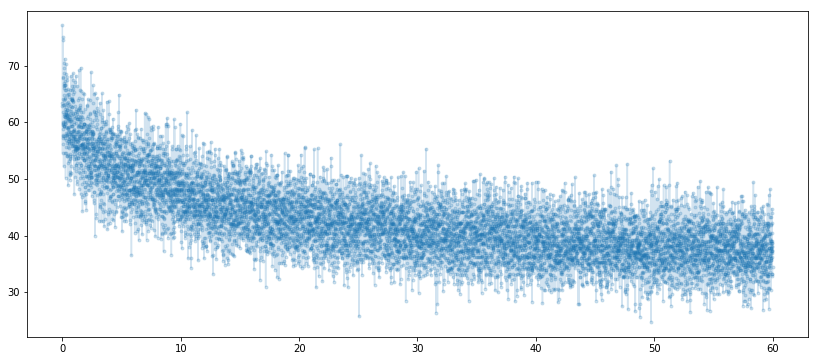

<Figure size 432x288 with 0 Axes>

In [11]:
i = randint(0,len(pars))
Ft = load("Training/roi"+str(i).zfill(4)+".npy")
t = arange(Ft.shape[0])*5e-3
if pars[i] == 0:
    print("It is not a NR")
else:
    print("It is a NR")
    
figure(figsize= (14,6))
plot(t,mean(Ft-Ft.min(axis=0),axis=1),'.-',alpha=0.2)
figure()

In [12]:
def getdataextract(xt,nframes=1000):
    duration, roisize = xt.shape
    start,end = get_random_time_segment(nframes,total_frames=duration)
    xtt = xt[start:end,:].transpose()
    s1 = xtt.mean()
    s0 = xtt.std()/s1
    s2 = xtt.std()
    s3 = mean((xtt-s1)**3)/s2**3
    s4 = mean((xtt-s1)**4)/s2**4
    xtt0 = xtt.mean(axis=0)
    xtt = xtt-xtt.min(axis=0)
    xtt = xtt.mean(axis=0)
    xtt0 = xtt0/xtt0.mean()
    xtt = xtt/xtt.mean()
    s1n = xtt.mean()
    s2n = xtt.std()
    s3n = mean((xtt-s1n)**3)/s2n**3
    s4n = mean((xtt-s1n)**4)/s2n**4
    s0t = array([s2,s3,s4,(s3**2+1)/s4,s2n,s3n,s4n,(s3**2+1)/s4])
    xtt = concatenate((s0t,xtt,xtt0))
    return(xtt)

In [13]:
# 1 segundo. This will be used as another (meta)parameter, 
# which we want to decrease
nframes = 1000 
pars = load("Training/roival.npy")

lpar = len(pars)

X = []
Y = []
for i in permutation(lpar-200):
    xt = load("Training/roi"+str(i).zfill(4)+".npy")
    par = pars[i]
    nj = 3
    if par == 1: nj = 8
    for j in range(nj):
        X.append(getdataextract(xt))
        #Y.append(concatenate((yt[start:end],par[-1:])))
        Y.append(par)
X = array(X)
Y = array(Y)
print(X.shape, Y.shape)
    

Xdev = []
Ydev = []
for i in range(lpar-200,lpar):
    xt = load("Training/roi"+str(i).zfill(4)+".npy")
    par = pars[i]
    for j in range(5):
        Xdev.append(getdataextract(xt))
        #Ydev.append(concatenate((yt[start:end],par[-1:])))
        Ydev.append(par)
Xdev = array(Xdev)
Ydev = array(Ydev)

print(Xdev.shape, Ydev.shape)


'''
Xdev = array(X).transpose()
Ydev = array(Y).transpose()
for i in range(4000,4100):
    xt = load("syndat/d"+str(i).zfill(4)+".npy")
    yt = load("syndat/r"+str(i).zfill(4)+".npy")
    for j in range(20):
        start,end = get_random_time_segment(nframes)
        Xdev.append(xt[start:end])
        Ydev.append(yt[start:end])
'''        
        

(3465, 2008) (3465,)
(1000, 2008) (1000,)


'\nXdev = array(X).transpose()\nYdev = array(Y).transpose()\nfor i in range(4000,4100):\n    xt = load("syndat/d"+str(i).zfill(4)+".npy")\n    yt = load("syndat/r"+str(i).zfill(4)+".npy")\n    for j in range(20):\n        start,end = get_random_time_segment(nframes)\n        Xdev.append(xt[start:end])\n        Ydev.append(yt[start:end])\n'

It is not a NR


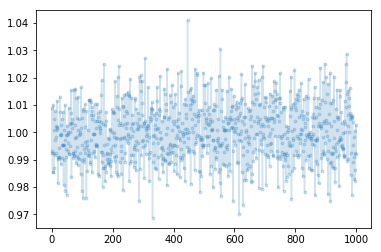

In [14]:
colors = array(['C0','C1'])
t = arange(nframes)
# We plot some random pieces we chose to fit the network!

i = randint(0,X.shape[0])

if Y[i] == 0:
    print("It is not a NR")
else:
    print("It is a NR")

#plot(t,X[i,8:1008],'.-',alpha=0.2)

plot(t,X[i,1008:2008],'.-',alpha=0.2)


In [15]:
X.shape

(3465, 2008)

In [16]:
sum(Y==1)

1632

## Definition of the network

Here, we define the neural network. We may start with just nframes logistic regressions?!

In [17]:
X = reshape(X,(X.shape[0],X.shape[1],1))
Y = reshape(Y,(Y.shape[0],1,1))

Xdev = reshape(Xdev,(Xdev.shape[0],Xdev.shape[1],1))
Ydev = reshape(Ydev,(Ydev.shape[0],1,1))

print(X.shape,Y.shape)

(3465, 2008, 1) (3465, 1, 1)


In [146]:
def model(input_shape):
    '''
    Function used to create the model's graph in Keras
    
    Argument:
    -- input_shape. Shape of the model's input data (Keras conventions?!)
    
    Returns:
    -- model. Keras model instance
    '''
    tf_session = K.get_session()
    
    X_input = Input(shape = input_shape)
    
    # Layers

    X = X_input
    
    n0par = 8
    n1par = 1008
    Xa = Lambda(lambda x: x[:,n1par:,:], output_shape=(n1par-n0par,1))(X)
    Xb = Lambda(lambda x: x[:,n0par:n1par,:], output_shape=(n1par-n0par,1))(X)
    X  = Lambda(lambda x: x[:,:n0par,:], output_shape=(n0par,1))(X)
    X = Reshape((1,n0par))(X)
    Xa = Concatenate(axis=-1)([Xa,Xb])
    
    Xashape = array(input_shape)
    Xashape[-1] -= 1 
    n1, n2, s = (20,10,4)

    Xa = Dropout(0.2)(Xa)
    Xa = Conv1D(100,7,strides=3,padding="same")(Xa)
    #Xc = AveragePooling1D(40,strides=5,padding="valid")(Xa)
    #Xa = MaxPooling1D(40,strides=5,padding="valid")(Xa)
    Xa = Activation("relu")(Xa)  
    #Xa = Concatenate()([Xa,Xb,Xc])
    Xa = BatchNormalization()(Xa)   

    Xa = MaxPooling1D(100,strides=3,padding="valid")(Xa)
    #Xa = Activation("relu")(Xa)  
    #Xa = Concatenate()([Xa,Xb,Xc])
    Xa = BatchNormalization()(Xa)      
    Xc = BatchNormalization()(Xa)
    
    Xa = Dropout(0.2)(Xa)
    Xa = Conv1D(200,3,strides=1,padding="same")(Xa)
    Xa = Activation("relu")(Xa)
    Xa = BatchNormalization()(Xa)    
    
    Xa = AveragePooling1D(3,strides=1,padding="same")(Xa)
    #Xa = Activation("relu")(Xa)  
    #Xa = Concatenate()([Xa,Xb,Xc])
    Xb = BatchNormalization()(Xa)
    Xa = BatchNormalization()(Xa)      
    
    Xa = Dropout(0.2)(Xa)
    Xa = Conv1D(400,3,strides=1,padding="same")(Xa)
    Xa = Activation("relu")(Xa)
      
    
    #Xa = Dropout(0.2)(Xa)
    #Xa = Conv1D(1000,1,strides=1,padding="same")(Xa)
    #Xa = Activation("relu")(Xa)
    #Xa = BatchNormalization()(Xa)  
    
    Xa = AveragePooling1D(20,strides=5,padding="valid")(Xa)
    #Xa = Activation("relu")(Xa)  
    #Xa = Concatenate()([Xa,Xb,Xc])
    Xa = BatchNormalization()(Xa)   
    Xb = MaxPooling1D(20,strides=5,padding="valid")(Xb)
    #Xa = Activation("relu")(Xa)  
    #Xa = Concatenate()([Xa,Xb,Xc])
    Xb = BatchNormalization()(Xb)   
    
    Xc = MaxPooling1D(20,strides=5,padding="valid")(Xc)
    Xc = BatchNormalization()(Xc)   
    
    #Xa = Dropout(0.2)(Xa)
    #Xa = Conv1D(400,5,strides=1,padding="same")(Xa)
    #Xa = Activation("relu")(Xa)
    #Xa = BatchNormalization()(Xa)  
 
    #Xa = Dropout(0.2)(Xa)
    #Xa = AveragePooling1D(4,strides=1,padding="valid")(Xa)

    #Xa = Dropout(0.2)(Xa)
    #Xa = Conv1D(120,10,strides=3,padding="valid")(Xa)
    #Xa = Activation("relu")(Xa)
    #Xa = BatchNormalization()(Xa)  
    
    #Xa = Reshape((1,16*120))(Xa)
    Xad = K.int_shape(Xa)
    Xbd = K.int_shape(Xb)
    #Xcd = K.int_shape(Xc)

    Xad = Xad[1]*Xad[2]
    Xbd = Xbd[1]*Xbd[2]
    
    Xa = Reshape((Xad,1))(Xa)
    Xb = Reshape((Xbd,1))(Xb)

    Xb = AveragePooling1D(Xbd//4,strides=9,padding="valid")(Xb)
    Xa = MaxPooling1D(Xad//4,strides=9,padding="valid")(Xa)

    Xad = K.int_shape(Xa)
    Xbd = K.int_shape(Xb)
    #Xcd = K.int_shape(Xc)
    
    Xa = Reshape((1,Xad[1]*Xad[2]))(Xa)
    Xb = Reshape((1,Xbd[1]*Xbd[2]))(Xb)    
    
    X = Concatenate(axis=2)([X,Xa,Xb])
    #X = BatchNormalization()(Xa) 
    
    
    #X = Dropout(0.2)(X)
    #X = Dense(400,activation="sigmoid")(X)
    #X = BatchNormalization()(X)
    
    
    #X = Dropout(0.2)(X)
    X = Dense(200,activation="sigmoid")(X)
    X = BatchNormalization()(X)
    
    X = Dropout(0.2)(X)
    X = Dense(100,activation="relu")(X)
    X = BatchNormalization()(X)

    X = Dropout(0.2)(X)
    X = Dense(40,activation="relu")(X)
    X = BatchNormalization()(X)
    
    X = Dropout(0.2)(X)
    X = Dense(20,activation="relu")(X)
    X = BatchNormalization()(X)
     
    
    X = Dropout(0.2)(X)
    X = Dense(4,activation="sigmoid")(X)
    X = BatchNormalization()(X)
    
    X = Dense(1,activation="sigmoid")(X)

    #X = Xa
    # Defining the model
    
    model = Model(inputs = X_input, outputs = X)
    
    return model

In [147]:
model = model(input_shape = (8+nframes*2,1))

In [148]:
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_24 (InputLayer)           (None, 2008, 1)      0                                            
__________________________________________________________________________________________________
lambda_70 (Lambda)              (None, 1000, 1)      0           input_24[0][0]                   
__________________________________________________________________________________________________
lambda_71 (Lambda)              (None, 1000, 1)      0           input_24[0][0]                   
__________________________________________________________________________________________________
concatenate_49 (Concatenate)    (None, 1000, 2)      0           lambda_70[0][0]                  
                                                                 lambda_71[0][0]                  
__________

### Fit the model!

In [149]:
from keras.optimizers import SGD

In [154]:
opt = Adam(lr=0.0001, beta_1=0.95, beta_2=0.999, decay=0.001)
#opt = SGD(lr=100, decay=1e-6, momentum=1.9)

model.compile(loss='binary_crossentropy', optimizer=opt, metrics=["accuracy"])


In [155]:
Wsave = model.get_weights()
#model.set_weights(Wsave)

In [156]:
Y.shape

(3003, 1, 1)

In [157]:
history3 = model.fit(X, Y, batch_size = 500, epochs =2000)

Epoch 1/2000
3003/3003 [==============================] - 10s 3ms/step - loss: 0.4354 - acc: 0.8062
Epoch 2/2000
3003/3003 [==============================] - 1s 234us/step - loss: 0.4210 - acc: 0.8238
Epoch 3/2000
3003/3003 [==============================] - 1s 235us/step - loss: 0.4246 - acc: 0.8175
Epoch 4/2000
3003/3003 [==============================] - 1s 235us/step - loss: 0.4171 - acc: 0.8198
Epoch 5/2000
3003/3003 [==============================] - 1s 235us/step - loss: 0.4253 - acc: 0.8192
Epoch 6/2000
3003/3003 [==============================] - 1s 237us/step - loss: 0.4211 - acc: 0.8222
Epoch 7/2000
3003/3003 [==============================] - 1s 235us/step - loss: 0.4159 - acc: 0.8208
Epoch 8/2000
3003/3003 [==============================] - 1s 233us/step - loss: 0.4173 - acc: 0.8238
Epoch 9/2000
3003/3003 [==============================] - 1s 235us/step - loss: 0.4152 - acc: 0.8232
Epoch 10/2000
3003/3003 [==============================] - 1s 236us/step - loss: 0.4254 - ac

3003/3003 [==============================] - 1s 235us/step - loss: 0.4154 - acc: 0.8212
Epoch 82/2000
3003/3003 [==============================] - 1s 238us/step - loss: 0.4189 - acc: 0.8178
Epoch 83/2000
3003/3003 [==============================] - 1s 234us/step - loss: 0.4207 - acc: 0.8159
Epoch 84/2000
3003/3003 [==============================] - 1s 235us/step - loss: 0.4160 - acc: 0.8248
Epoch 85/2000
3003/3003 [==============================] - 1s 234us/step - loss: 0.4093 - acc: 0.8225
Epoch 86/2000
3003/3003 [==============================] - 1s 233us/step - loss: 0.4183 - acc: 0.8188
Epoch 87/2000
3003/3003 [==============================] - 1s 234us/step - loss: 0.4128 - acc: 0.8212
Epoch 88/2000
3003/3003 [==============================] - 1s 234us/step - loss: 0.4137 - acc: 0.8172
Epoch 89/2000
3003/3003 [==============================] - 1s 234us/step - loss: 0.4082 - acc: 0.8292
Epoch 90/2000
3003/3003 [==============================] - 1s 234us/step - loss: 0.4119 - acc: 0

3003/3003 [==============================] - 1s 234us/step - loss: 0.4144 - acc: 0.8165
Epoch 161/2000
3003/3003 [==============================] - 1s 236us/step - loss: 0.4020 - acc: 0.8265
Epoch 162/2000
3003/3003 [==============================] - 1s 234us/step - loss: 0.4112 - acc: 0.8272
Epoch 163/2000
3003/3003 [==============================] - 1s 236us/step - loss: 0.4110 - acc: 0.8208
Epoch 164/2000
3003/3003 [==============================] - 1s 236us/step - loss: 0.4110 - acc: 0.8185
Epoch 165/2000
3003/3003 [==============================] - 1s 233us/step - loss: 0.4050 - acc: 0.8298
Epoch 166/2000
3003/3003 [==============================] - 1s 234us/step - loss: 0.4069 - acc: 0.8242
Epoch 167/2000
3003/3003 [==============================] - 1s 234us/step - loss: 0.4151 - acc: 0.8262
Epoch 168/2000
3003/3003 [==============================] - 1s 236us/step - loss: 0.4091 - acc: 0.8265
Epoch 169/2000
3003/3003 [==============================] - 1s 235us/step - loss: 0.4062

3003/3003 [==============================] - 1s 236us/step - loss: 0.4182 - acc: 0.8222
Epoch 240/2000
3003/3003 [==============================] - 1s 235us/step - loss: 0.4117 - acc: 0.8255
Epoch 241/2000
3003/3003 [==============================] - 1s 236us/step - loss: 0.4119 - acc: 0.8235
Epoch 242/2000
3003/3003 [==============================] - 1s 235us/step - loss: 0.4123 - acc: 0.8262
Epoch 243/2000
3003/3003 [==============================] - 1s 235us/step - loss: 0.4085 - acc: 0.8275
Epoch 244/2000
3003/3003 [==============================] - 1s 233us/step - loss: 0.4161 - acc: 0.8265
Epoch 245/2000
3003/3003 [==============================] - 1s 235us/step - loss: 0.4164 - acc: 0.8192
Epoch 246/2000
3003/3003 [==============================] - 1s 234us/step - loss: 0.4121 - acc: 0.8235
Epoch 247/2000
3003/3003 [==============================] - 1s 235us/step - loss: 0.4155 - acc: 0.8205
Epoch 248/2000
3003/3003 [==============================] - 1s 234us/step - loss: 0.4122

3003/3003 [==============================] - 1s 235us/step - loss: 0.4167 - acc: 0.8245
Epoch 319/2000
3003/3003 [==============================] - 1s 234us/step - loss: 0.4103 - acc: 0.8272
Epoch 320/2000
3003/3003 [==============================] - 1s 235us/step - loss: 0.4136 - acc: 0.8172
Epoch 321/2000
3003/3003 [==============================] - 1s 234us/step - loss: 0.4116 - acc: 0.8285
Epoch 322/2000
3003/3003 [==============================] - 1s 235us/step - loss: 0.4116 - acc: 0.8202
Epoch 323/2000
3003/3003 [==============================] - 1s 233us/step - loss: 0.4127 - acc: 0.8212
Epoch 324/2000
3003/3003 [==============================] - 1s 234us/step - loss: 0.4114 - acc: 0.8298
Epoch 325/2000
3003/3003 [==============================] - 1s 234us/step - loss: 0.4175 - acc: 0.8245
Epoch 326/2000
3003/3003 [==============================] - 1s 235us/step - loss: 0.4191 - acc: 0.8168
Epoch 327/2000
3003/3003 [==============================] - 1s 234us/step - loss: 0.4108

3003/3003 [==============================] - 1s 236us/step - loss: 0.4040 - acc: 0.8248
Epoch 398/2000
3003/3003 [==============================] - 1s 234us/step - loss: 0.4088 - acc: 0.8312
Epoch 399/2000
3003/3003 [==============================] - 1s 237us/step - loss: 0.4096 - acc: 0.8265
Epoch 400/2000
3003/3003 [==============================] - 1s 234us/step - loss: 0.4196 - acc: 0.8222
Epoch 401/2000
3003/3003 [==============================] - 1s 234us/step - loss: 0.4079 - acc: 0.8328
Epoch 402/2000
3003/3003 [==============================] - 1s 234us/step - loss: 0.4037 - acc: 0.8282
Epoch 403/2000
3003/3003 [==============================] - 1s 235us/step - loss: 0.4153 - acc: 0.8245
Epoch 404/2000
3003/3003 [==============================] - 1s 233us/step - loss: 0.4166 - acc: 0.8238
Epoch 405/2000
3003/3003 [==============================] - 1s 234us/step - loss: 0.4059 - acc: 0.8265
Epoch 406/2000
3003/3003 [==============================] - 1s 235us/step - loss: 0.4104

3003/3003 [==============================] - 1s 234us/step - loss: 0.4193 - acc: 0.8208
Epoch 477/2000
3003/3003 [==============================] - 1s 237us/step - loss: 0.4114 - acc: 0.8185
Epoch 478/2000
3003/3003 [==============================] - 1s 235us/step - loss: 0.4061 - acc: 0.8265
Epoch 479/2000
3003/3003 [==============================] - 1s 235us/step - loss: 0.4019 - acc: 0.8298
Epoch 480/2000
3003/3003 [==============================] - 1s 237us/step - loss: 0.4092 - acc: 0.8205
Epoch 481/2000
3003/3003 [==============================] - 1s 234us/step - loss: 0.4068 - acc: 0.8295
Epoch 482/2000
3003/3003 [==============================] - 1s 237us/step - loss: 0.4098 - acc: 0.8282
Epoch 483/2000
3003/3003 [==============================] - 1s 237us/step - loss: 0.4125 - acc: 0.8212
Epoch 484/2000
3003/3003 [==============================] - 1s 236us/step - loss: 0.4046 - acc: 0.8288
Epoch 485/2000
3003/3003 [==============================] - 1s 234us/step - loss: 0.4127

3003/3003 [==============================] - 1s 234us/step - loss: 0.4127 - acc: 0.8258
Epoch 556/2000
3003/3003 [==============================] - 1s 233us/step - loss: 0.4114 - acc: 0.8278
Epoch 557/2000
3003/3003 [==============================] - 1s 232us/step - loss: 0.4060 - acc: 0.8298
Epoch 558/2000
3003/3003 [==============================] - 1s 235us/step - loss: 0.4117 - acc: 0.8255
Epoch 559/2000
3003/3003 [==============================] - 1s 236us/step - loss: 0.4088 - acc: 0.8242
Epoch 560/2000
3003/3003 [==============================] - 1s 235us/step - loss: 0.4127 - acc: 0.8252
Epoch 561/2000
3003/3003 [==============================] - 1s 234us/step - loss: 0.4093 - acc: 0.8258
Epoch 562/2000
3003/3003 [==============================] - 1s 236us/step - loss: 0.4121 - acc: 0.8245
Epoch 563/2000
3003/3003 [==============================] - 1s 234us/step - loss: 0.4074 - acc: 0.8358
Epoch 564/2000
3003/3003 [==============================] - 1s 232us/step - loss: 0.4116

3003/3003 [==============================] - 1s 236us/step - loss: 0.4107 - acc: 0.8232
Epoch 635/2000
3003/3003 [==============================] - 1s 233us/step - loss: 0.4072 - acc: 0.8262
Epoch 636/2000
3003/3003 [==============================] - 1s 234us/step - loss: 0.4034 - acc: 0.8308
Epoch 637/2000
3003/3003 [==============================] - 1s 234us/step - loss: 0.4088 - acc: 0.8252
Epoch 638/2000
3003/3003 [==============================] - 1s 233us/step - loss: 0.4147 - acc: 0.8185
Epoch 639/2000
3003/3003 [==============================] - 1s 235us/step - loss: 0.4100 - acc: 0.8252
Epoch 640/2000
3003/3003 [==============================] - 1s 234us/step - loss: 0.4078 - acc: 0.8312
Epoch 641/2000
3003/3003 [==============================] - 1s 235us/step - loss: 0.4106 - acc: 0.8232
Epoch 642/2000
3003/3003 [==============================] - 1s 235us/step - loss: 0.4115 - acc: 0.8268
Epoch 643/2000
3003/3003 [==============================] - 1s 237us/step - loss: 0.4090

3003/3003 [==============================] - 1s 235us/step - loss: 0.4081 - acc: 0.8305
Epoch 714/2000
3003/3003 [==============================] - 1s 234us/step - loss: 0.4035 - acc: 0.8285
Epoch 715/2000
3003/3003 [==============================] - 1s 237us/step - loss: 0.4071 - acc: 0.8278
Epoch 716/2000
3003/3003 [==============================] - 1s 237us/step - loss: 0.4172 - acc: 0.8178
Epoch 717/2000
3003/3003 [==============================] - 1s 235us/step - loss: 0.4072 - acc: 0.8268
Epoch 718/2000
3003/3003 [==============================] - 1s 234us/step - loss: 0.4086 - acc: 0.8285
Epoch 719/2000
3003/3003 [==============================] - 1s 233us/step - loss: 0.4098 - acc: 0.8238
Epoch 720/2000
3003/3003 [==============================] - 1s 235us/step - loss: 0.4077 - acc: 0.8305
Epoch 721/2000
3003/3003 [==============================] - 1s 235us/step - loss: 0.4028 - acc: 0.8265
Epoch 722/2000
3003/3003 [==============================] - 1s 234us/step - loss: 0.4185

3003/3003 [==============================] - 1s 236us/step - loss: 0.4096 - acc: 0.8332
Epoch 793/2000
3003/3003 [==============================] - 1s 233us/step - loss: 0.4088 - acc: 0.8262
Epoch 794/2000
3003/3003 [==============================] - 1s 234us/step - loss: 0.4088 - acc: 0.8235
Epoch 795/2000
3003/3003 [==============================] - 1s 233us/step - loss: 0.4113 - acc: 0.8222
Epoch 796/2000
3003/3003 [==============================] - 1s 234us/step - loss: 0.4118 - acc: 0.8228
Epoch 797/2000
3003/3003 [==============================] - 1s 234us/step - loss: 0.4034 - acc: 0.8352
Epoch 798/2000
3003/3003 [==============================] - 1s 235us/step - loss: 0.4092 - acc: 0.8318
Epoch 799/2000
3003/3003 [==============================] - 1s 234us/step - loss: 0.4114 - acc: 0.8272
Epoch 800/2000
3003/3003 [==============================] - 1s 233us/step - loss: 0.4064 - acc: 0.8318
Epoch 801/2000
3003/3003 [==============================] - 1s 234us/step - loss: 0.4073

3003/3003 [==============================] - 1s 236us/step - loss: 0.4056 - acc: 0.8308
Epoch 872/2000
3003/3003 [==============================] - 1s 236us/step - loss: 0.4141 - acc: 0.8295
Epoch 873/2000
3003/3003 [==============================] - 1s 235us/step - loss: 0.4099 - acc: 0.8272
Epoch 874/2000
3003/3003 [==============================] - 1s 235us/step - loss: 0.4085 - acc: 0.8258
Epoch 875/2000
3003/3003 [==============================] - 1s 234us/step - loss: 0.4054 - acc: 0.8328
Epoch 876/2000
3003/3003 [==============================] - 1s 233us/step - loss: 0.4015 - acc: 0.8278
Epoch 877/2000
3003/3003 [==============================] - 1s 235us/step - loss: 0.4055 - acc: 0.8258
Epoch 878/2000
3003/3003 [==============================] - 1s 235us/step - loss: 0.4008 - acc: 0.8302
Epoch 879/2000
3003/3003 [==============================] - 1s 235us/step - loss: 0.4086 - acc: 0.8298
Epoch 880/2000
3003/3003 [==============================] - 1s 240us/step - loss: 0.4009

3003/3003 [==============================] - 1s 235us/step - loss: 0.4061 - acc: 0.8328
Epoch 951/2000
3003/3003 [==============================] - 1s 236us/step - loss: 0.4148 - acc: 0.8232
Epoch 952/2000
3003/3003 [==============================] - 1s 234us/step - loss: 0.4107 - acc: 0.8302
Epoch 953/2000
3003/3003 [==============================] - 1s 235us/step - loss: 0.4077 - acc: 0.8282
Epoch 954/2000
3003/3003 [==============================] - 1s 237us/step - loss: 0.4077 - acc: 0.8242
Epoch 955/2000
3003/3003 [==============================] - 1s 235us/step - loss: 0.4052 - acc: 0.8312
Epoch 956/2000
3003/3003 [==============================] - 1s 235us/step - loss: 0.4069 - acc: 0.8305
Epoch 957/2000
3003/3003 [==============================] - 1s 232us/step - loss: 0.4059 - acc: 0.8265
Epoch 958/2000
3003/3003 [==============================] - 1s 235us/step - loss: 0.4009 - acc: 0.8238
Epoch 959/2000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3962

3003/3003 [==============================] - 1s 234us/step - loss: 0.4057 - acc: 0.8285
Epoch 1030/2000
3003/3003 [==============================] - 1s 234us/step - loss: 0.4062 - acc: 0.8308
Epoch 1031/2000
3003/3003 [==============================] - 1s 236us/step - loss: 0.4035 - acc: 0.8278
Epoch 1032/2000
3003/3003 [==============================] - 1s 234us/step - loss: 0.4077 - acc: 0.8295
Epoch 1033/2000
3003/3003 [==============================] - 1s 235us/step - loss: 0.4131 - acc: 0.8278
Epoch 1034/2000
3003/3003 [==============================] - 1s 235us/step - loss: 0.4172 - acc: 0.8232
Epoch 1035/2000
3003/3003 [==============================] - 1s 236us/step - loss: 0.4078 - acc: 0.8288
Epoch 1036/2000
3003/3003 [==============================] - 1s 234us/step - loss: 0.4070 - acc: 0.8285
Epoch 1037/2000
3003/3003 [==============================] - 1s 234us/step - loss: 0.4078 - acc: 0.8332
Epoch 1038/2000
3003/3003 [==============================] - 1s 235us/step - los

3003/3003 [==============================] - 1s 235us/step - loss: 0.4008 - acc: 0.8328
Epoch 1108/2000
3003/3003 [==============================] - 1s 234us/step - loss: 0.4049 - acc: 0.8285
Epoch 1109/2000
3003/3003 [==============================] - 1s 233us/step - loss: 0.4016 - acc: 0.8252
Epoch 1110/2000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3998 - acc: 0.8298
Epoch 1111/2000
3003/3003 [==============================] - 1s 236us/step - loss: 0.4034 - acc: 0.8305
Epoch 1112/2000
3003/3003 [==============================] - 1s 234us/step - loss: 0.4048 - acc: 0.8255
Epoch 1113/2000
3003/3003 [==============================] - 1s 235us/step - loss: 0.4009 - acc: 0.8348
Epoch 1114/2000
3003/3003 [==============================] - 1s 235us/step - loss: 0.4023 - acc: 0.8302
Epoch 1115/2000
3003/3003 [==============================] - 1s 234us/step - loss: 0.4068 - acc: 0.8315
Epoch 1116/2000
3003/3003 [==============================] - 1s 234us/step - los

3003/3003 [==============================] - 1s 237us/step - loss: 0.4036 - acc: 0.8268
Epoch 1186/2000
3003/3003 [==============================] - 1s 237us/step - loss: 0.4022 - acc: 0.8305
Epoch 1187/2000
3003/3003 [==============================] - 1s 235us/step - loss: 0.4130 - acc: 0.8258
Epoch 1188/2000
3003/3003 [==============================] - 1s 233us/step - loss: 0.4062 - acc: 0.8282
Epoch 1189/2000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3982 - acc: 0.8312
Epoch 1190/2000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3981 - acc: 0.8318
Epoch 1191/2000
3003/3003 [==============================] - 1s 235us/step - loss: 0.4023 - acc: 0.8298
Epoch 1192/2000
3003/3003 [==============================] - 1s 235us/step - loss: 0.4139 - acc: 0.8215
Epoch 1193/2000
3003/3003 [==============================] - 1s 235us/step - loss: 0.4062 - acc: 0.8275
Epoch 1194/2000
3003/3003 [==============================] - 1s 235us/step - los

3003/3003 [==============================] - 1s 237us/step - loss: 0.4061 - acc: 0.8298
Epoch 1264/2000
3003/3003 [==============================] - 1s 233us/step - loss: 0.4052 - acc: 0.8232
Epoch 1265/2000
3003/3003 [==============================] - 1s 234us/step - loss: 0.4058 - acc: 0.8308
Epoch 1266/2000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3987 - acc: 0.8312
Epoch 1267/2000
3003/3003 [==============================] - 1s 236us/step - loss: 0.4041 - acc: 0.8295
Epoch 1268/2000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3966 - acc: 0.8365
Epoch 1269/2000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3969 - acc: 0.8305
Epoch 1270/2000
3003/3003 [==============================] - 1s 234us/step - loss: 0.4139 - acc: 0.8228
Epoch 1271/2000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3989 - acc: 0.8348
Epoch 1272/2000
3003/3003 [==============================] - 1s 236us/step - los

3003/3003 [==============================] - 1s 235us/step - loss: 0.4014 - acc: 0.8312
Epoch 1342/2000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3994 - acc: 0.8252
Epoch 1343/2000
3003/3003 [==============================] - 1s 235us/step - loss: 0.4054 - acc: 0.8282
Epoch 1344/2000
3003/3003 [==============================] - 1s 235us/step - loss: 0.4152 - acc: 0.8285
Epoch 1345/2000
3003/3003 [==============================] - 1s 236us/step - loss: 0.4019 - acc: 0.8248
Epoch 1346/2000
3003/3003 [==============================] - 1s 234us/step - loss: 0.4010 - acc: 0.8278
Epoch 1347/2000
3003/3003 [==============================] - 1s 238us/step - loss: 0.4060 - acc: 0.8332
Epoch 1348/2000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3982 - acc: 0.8402
Epoch 1349/2000
3003/3003 [==============================] - 1s 235us/step - loss: 0.4020 - acc: 0.8235
Epoch 1350/2000
3003/3003 [==============================] - 1s 234us/step - los

3003/3003 [==============================] - 1s 236us/step - loss: 0.4009 - acc: 0.8372
Epoch 1420/2000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3990 - acc: 0.8272
Epoch 1421/2000
3003/3003 [==============================] - 1s 237us/step - loss: 0.4073 - acc: 0.8295
Epoch 1422/2000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3988 - acc: 0.8308
Epoch 1423/2000
3003/3003 [==============================] - 1s 236us/step - loss: 0.4034 - acc: 0.8332
Epoch 1424/2000
3003/3003 [==============================] - 1s 235us/step - loss: 0.4023 - acc: 0.8342
Epoch 1425/2000
3003/3003 [==============================] - 1s 237us/step - loss: 0.4002 - acc: 0.8258
Epoch 1426/2000
3003/3003 [==============================] - 1s 234us/step - loss: 0.4062 - acc: 0.8298
Epoch 1427/2000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3967 - acc: 0.8272
Epoch 1428/2000
3003/3003 [==============================] - 1s 235us/step - los

3003/3003 [==============================] - 1s 234us/step - loss: 0.4047 - acc: 0.8295
Epoch 1498/2000
3003/3003 [==============================] - 1s 235us/step - loss: 0.4018 - acc: 0.8338
Epoch 1499/2000
3003/3003 [==============================] - 1s 234us/step - loss: 0.4091 - acc: 0.8242
Epoch 1500/2000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3977 - acc: 0.8305
Epoch 1501/2000
3003/3003 [==============================] - 1s 234us/step - loss: 0.4038 - acc: 0.8288
Epoch 1502/2000
3003/3003 [==============================] - 1s 236us/step - loss: 0.4058 - acc: 0.8302
Epoch 1503/2000
3003/3003 [==============================] - 1s 233us/step - loss: 0.4002 - acc: 0.8355
Epoch 1504/2000
3003/3003 [==============================] - 1s 233us/step - loss: 0.4055 - acc: 0.8302
Epoch 1505/2000
3003/3003 [==============================] - 1s 234us/step - loss: 0.4090 - acc: 0.8262
Epoch 1506/2000
3003/3003 [==============================] - 1s 233us/step - los

3003/3003 [==============================] - 1s 236us/step - loss: 0.4030 - acc: 0.8282
Epoch 1576/2000
3003/3003 [==============================] - 1s 235us/step - loss: 0.4071 - acc: 0.8272
Epoch 1577/2000
3003/3003 [==============================] - 1s 235us/step - loss: 0.4066 - acc: 0.8295
Epoch 1578/2000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3961 - acc: 0.8318
Epoch 1579/2000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3974 - acc: 0.8295
Epoch 1580/2000
3003/3003 [==============================] - 1s 235us/step - loss: 0.4036 - acc: 0.8322
Epoch 1581/2000
3003/3003 [==============================] - 1s 234us/step - loss: 0.4037 - acc: 0.8318
Epoch 1582/2000
3003/3003 [==============================] - 1s 234us/step - loss: 0.4078 - acc: 0.8265
Epoch 1583/2000
3003/3003 [==============================] - 1s 234us/step - loss: 0.4066 - acc: 0.8292
Epoch 1584/2000
3003/3003 [==============================] - 1s 235us/step - los

3003/3003 [==============================] - 1s 234us/step - loss: 0.3965 - acc: 0.8352
Epoch 1654/2000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3955 - acc: 0.8418
Epoch 1655/2000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3997 - acc: 0.8305
Epoch 1656/2000
3003/3003 [==============================] - 1s 233us/step - loss: 0.4020 - acc: 0.8292
Epoch 1657/2000
3003/3003 [==============================] - 1s 232us/step - loss: 0.4018 - acc: 0.8302
Epoch 1658/2000
3003/3003 [==============================] - 1s 235us/step - loss: 0.4047 - acc: 0.8182
Epoch 1659/2000
3003/3003 [==============================] - 1s 231us/step - loss: 0.3997 - acc: 0.8332
Epoch 1660/2000
3003/3003 [==============================] - 1s 236us/step - loss: 0.4087 - acc: 0.8228
Epoch 1661/2000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3948 - acc: 0.8368
Epoch 1662/2000
3003/3003 [==============================] - 1s 234us/step - los

3003/3003 [==============================] - 1s 234us/step - loss: 0.4037 - acc: 0.8322
Epoch 1732/2000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3984 - acc: 0.8308
Epoch 1733/2000
3003/3003 [==============================] - 1s 239us/step - loss: 0.4009 - acc: 0.8322
Epoch 1734/2000
3003/3003 [==============================] - 1s 238us/step - loss: 0.4028 - acc: 0.8358
Epoch 1735/2000
3003/3003 [==============================] - 1s 234us/step - loss: 0.4035 - acc: 0.8352
Epoch 1736/2000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3960 - acc: 0.8405
Epoch 1737/2000
3003/3003 [==============================] - 1s 236us/step - loss: 0.4012 - acc: 0.8292
Epoch 1738/2000
3003/3003 [==============================] - 1s 235us/step - loss: 0.4046 - acc: 0.8355
Epoch 1739/2000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3967 - acc: 0.8328
Epoch 1740/2000
3003/3003 [==============================] - 1s 233us/step - los

3003/3003 [==============================] - 1s 238us/step - loss: 0.3990 - acc: 0.8305
Epoch 1810/2000
3003/3003 [==============================] - 1s 235us/step - loss: 0.4044 - acc: 0.8235
Epoch 1811/2000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3990 - acc: 0.8335
Epoch 1812/2000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3966 - acc: 0.8405
Epoch 1813/2000
3003/3003 [==============================] - 1s 234us/step - loss: 0.4038 - acc: 0.8228
Epoch 1814/2000
3003/3003 [==============================] - 1s 232us/step - loss: 0.4030 - acc: 0.8312
Epoch 1815/2000
3003/3003 [==============================] - 1s 234us/step - loss: 0.4029 - acc: 0.8318
Epoch 1816/2000
3003/3003 [==============================] - 1s 236us/step - loss: 0.4015 - acc: 0.8295
Epoch 1817/2000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3944 - acc: 0.8345
Epoch 1818/2000
3003/3003 [==============================] - 1s 243us/step - los

3003/3003 [==============================] - 1s 235us/step - loss: 0.3941 - acc: 0.8422
Epoch 1888/2000
3003/3003 [==============================] - 1s 236us/step - loss: 0.4058 - acc: 0.8235
Epoch 1889/2000
3003/3003 [==============================] - 1s 234us/step - loss: 0.4044 - acc: 0.8305
Epoch 1890/2000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3969 - acc: 0.8338
Epoch 1891/2000
3003/3003 [==============================] - 1s 237us/step - loss: 0.4049 - acc: 0.8252
Epoch 1892/2000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3975 - acc: 0.8325
Epoch 1893/2000
3003/3003 [==============================] - 1s 236us/step - loss: 0.4001 - acc: 0.8382
Epoch 1894/2000
3003/3003 [==============================] - 1s 238us/step - loss: 0.4020 - acc: 0.8282
Epoch 1895/2000
3003/3003 [==============================] - 1s 236us/step - loss: 0.4006 - acc: 0.8315
Epoch 1896/2000
3003/3003 [==============================] - 1s 234us/step - los

3003/3003 [==============================] - 1s 237us/step - loss: 0.4019 - acc: 0.8302
Epoch 1966/2000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3990 - acc: 0.8338
Epoch 1967/2000
3003/3003 [==============================] - 1s 236us/step - loss: 0.4043 - acc: 0.8265
Epoch 1968/2000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3963 - acc: 0.8318
Epoch 1969/2000
3003/3003 [==============================] - 1s 236us/step - loss: 0.4002 - acc: 0.8335
Epoch 1970/2000
3003/3003 [==============================] - 1s 234us/step - loss: 0.4056 - acc: 0.8278
Epoch 1971/2000
3003/3003 [==============================] - 1s 235us/step - loss: 0.4000 - acc: 0.8305
Epoch 1972/2000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3953 - acc: 0.8352
Epoch 1973/2000
3003/3003 [==============================] - 1s 236us/step - loss: 0.4054 - acc: 0.8268
Epoch 1974/2000
3003/3003 [==============================] - 1s 236us/step - los

In [39]:
#Wsave_trained1 = model.get_weights()
Wsave_trained2 = model.get_weights()
#Wsave_trained3 = model.get_weights()

dict_keys(['loss', 'acc'])


Text(0.5,0,'epoch')

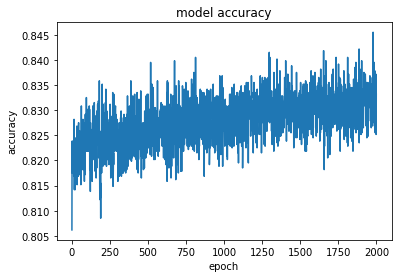

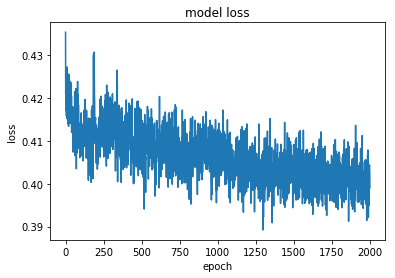

In [158]:
figure()
print(history3.history.keys())
#plot(history.history['acc'])
plot(history3.history['acc'])
#plot(history4.history['acc'])

title('model accuracy')
ylabel('accuracy')
xlabel('epoch')
figure()
#plot(history.history['loss'])
plot(history3.history['loss'])

title('model loss')
ylabel('loss')
xlabel('epoch')


In [159]:
loss, acc = model.evaluate(Xdev, Ydev)
print("Dev set accuracy = ", acc)

1000/1000 [==============================] - 4s 4ms/step
Dev set accuracy =  0.888


In [160]:
nframes = 1000 

pars = load("/export/home1/users/bssn/serna/Downloads/Classifier/fullimage/moviefull/roival.npy")
pars = pars[:,2]
lpar = len(pars)

X = []
Y = []
for i in permutation(lpar-200):
    xt = load("/export/home1/users/bssn/serna/Downloads/Classifier/fullimage/moviefull/roi_F01A"+str(i).zfill(4)+".npy")
    par = pars[i]
    nj = 3
    if par == 1: nj = 3
    for j in range(nj):
        X.append(getdataextract(xt))
        #Y.append(concatenate((yt[start:end],par[-1:])))
        Y.append(par)
X = array(X)
Y = array(Y)
print(X.shape, Y.shape)
    


(3003, 2008) (3003,)


In [161]:
X = reshape(X,(X.shape[0],X.shape[1],1))
Y = reshape(Y,(Y.shape[0],1,1))

In [162]:
history4 = model.fit(X, Y, batch_size = 500, epochs =5000)

Epoch 1/5000
3003/3003 [==============================] - 1s 335us/step - loss: 0.3983 - acc: 0.8312
Epoch 2/5000
3003/3003 [==============================] - 1s 231us/step - loss: 0.4006 - acc: 0.8292
Epoch 3/5000
3003/3003 [==============================] - 1s 231us/step - loss: 0.4037 - acc: 0.8298
Epoch 4/5000
3003/3003 [==============================] - 1s 236us/step - loss: 0.4027 - acc: 0.8308
Epoch 5/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.4052 - acc: 0.8335
Epoch 6/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3896 - acc: 0.8395
Epoch 7/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3983 - acc: 0.8295
Epoch 8/5000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3988 - acc: 0.8312
Epoch 9/5000
3003/3003 [==============================] - 1s 237us/step - loss: 0.4043 - acc: 0.8308
Epoch 10/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3987 - a

3003/3003 [==============================] - 1s 232us/step - loss: 0.4030 - acc: 0.8292
Epoch 82/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3986 - acc: 0.8342
Epoch 83/5000
3003/3003 [==============================] - 1s 232us/step - loss: 0.4014 - acc: 0.8285
Epoch 84/5000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3976 - acc: 0.8348
Epoch 85/5000
3003/3003 [==============================] - 1s 230us/step - loss: 0.4020 - acc: 0.8328
Epoch 86/5000
3003/3003 [==============================] - 1s 232us/step - loss: 0.4056 - acc: 0.8255
Epoch 87/5000
3003/3003 [==============================] - 1s 230us/step - loss: 0.3986 - acc: 0.8385
Epoch 88/5000
3003/3003 [==============================] - 1s 231us/step - loss: 0.3959 - acc: 0.8395
Epoch 89/5000
3003/3003 [==============================] - 1s 231us/step - loss: 0.3967 - acc: 0.8338
Epoch 90/5000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3999 - acc: 0

3003/3003 [==============================] - 1s 237us/step - loss: 0.3925 - acc: 0.8345
Epoch 161/5000
3003/3003 [==============================] - 1s 241us/step - loss: 0.3968 - acc: 0.8318
Epoch 162/5000
3003/3003 [==============================] - 1s 240us/step - loss: 0.3972 - acc: 0.8348
Epoch 163/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3965 - acc: 0.8305
Epoch 164/5000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3893 - acc: 0.8372
Epoch 165/5000
3003/3003 [==============================] - 1s 233us/step - loss: 0.4026 - acc: 0.8242
Epoch 166/5000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3943 - acc: 0.8318
Epoch 167/5000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3979 - acc: 0.8318
Epoch 168/5000
3003/3003 [==============================] - 1s 232us/step - loss: 0.4048 - acc: 0.8312
Epoch 169/5000
3003/3003 [==============================] - 1s 231us/step - loss: 0.3985

3003/3003 [==============================] - 1s 235us/step - loss: 0.3948 - acc: 0.8385
Epoch 240/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3959 - acc: 0.8365
Epoch 241/5000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3921 - acc: 0.8325
Epoch 242/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3929 - acc: 0.8368
Epoch 243/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3957 - acc: 0.8338
Epoch 244/5000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3938 - acc: 0.8338
Epoch 245/5000
3003/3003 [==============================] - 1s 240us/step - loss: 0.3980 - acc: 0.8355
Epoch 246/5000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3993 - acc: 0.8342
Epoch 247/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3958 - acc: 0.8385
Epoch 248/5000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3972

3003/3003 [==============================] - 1s 229us/step - loss: 0.3990 - acc: 0.8318
Epoch 319/5000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3943 - acc: 0.8342
Epoch 320/5000
3003/3003 [==============================] - 1s 230us/step - loss: 0.3978 - acc: 0.8302
Epoch 321/5000
3003/3003 [==============================] - 1s 230us/step - loss: 0.3937 - acc: 0.8328
Epoch 322/5000
3003/3003 [==============================] - 1s 231us/step - loss: 0.4012 - acc: 0.8248
Epoch 323/5000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3979 - acc: 0.8342
Epoch 324/5000
3003/3003 [==============================] - 1s 231us/step - loss: 0.4033 - acc: 0.8315
Epoch 325/5000
3003/3003 [==============================] - 1s 230us/step - loss: 0.4012 - acc: 0.8318
Epoch 326/5000
3003/3003 [==============================] - 1s 230us/step - loss: 0.3982 - acc: 0.8325
Epoch 327/5000
3003/3003 [==============================] - 1s 231us/step - loss: 0.3964

3003/3003 [==============================] - 1s 233us/step - loss: 0.4031 - acc: 0.8298
Epoch 398/5000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3950 - acc: 0.8322
Epoch 399/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3963 - acc: 0.8378
Epoch 400/5000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3943 - acc: 0.8312
Epoch 401/5000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3984 - acc: 0.8322
Epoch 402/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3973 - acc: 0.8308
Epoch 403/5000
3003/3003 [==============================] - 1s 232us/step - loss: 0.4008 - acc: 0.8298
Epoch 404/5000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3925 - acc: 0.8355
Epoch 405/5000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3983 - acc: 0.8298
Epoch 406/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3974

3003/3003 [==============================] - 1s 235us/step - loss: 0.3915 - acc: 0.8335
Epoch 477/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.4007 - acc: 0.8338
Epoch 478/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3982 - acc: 0.8345
Epoch 479/5000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3943 - acc: 0.8358
Epoch 480/5000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3986 - acc: 0.8342
Epoch 481/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3984 - acc: 0.8345
Epoch 482/5000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3963 - acc: 0.8388
Epoch 483/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3988 - acc: 0.8272
Epoch 484/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3955 - acc: 0.8348
Epoch 485/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3951

3003/3003 [==============================] - 1s 237us/step - loss: 0.3930 - acc: 0.8338
Epoch 556/5000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3947 - acc: 0.8352
Epoch 557/5000
3003/3003 [==============================] - 1s 238us/step - loss: 0.4001 - acc: 0.8288
Epoch 558/5000
3003/3003 [==============================] - 1s 238us/step - loss: 0.4003 - acc: 0.8395
Epoch 559/5000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3950 - acc: 0.8328
Epoch 560/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3952 - acc: 0.8375
Epoch 561/5000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3947 - acc: 0.8372
Epoch 562/5000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3981 - acc: 0.8358
Epoch 563/5000
3003/3003 [==============================] - 1s 240us/step - loss: 0.3969 - acc: 0.8338
Epoch 564/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3991

3003/3003 [==============================] - 1s 237us/step - loss: 0.3921 - acc: 0.8348
Epoch 635/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3947 - acc: 0.8418
Epoch 636/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3980 - acc: 0.8335
Epoch 637/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3937 - acc: 0.8348
Epoch 638/5000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3936 - acc: 0.8318
Epoch 639/5000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3919 - acc: 0.8372
Epoch 640/5000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3932 - acc: 0.8338
Epoch 641/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.4024 - acc: 0.8292
Epoch 642/5000
3003/3003 [==============================] - 1s 236us/step - loss: 0.4004 - acc: 0.8288
Epoch 643/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3968

3003/3003 [==============================] - 1s 236us/step - loss: 0.3971 - acc: 0.8318
Epoch 714/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3977 - acc: 0.8338
Epoch 715/5000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3973 - acc: 0.8352
Epoch 716/5000
3003/3003 [==============================] - 1s 238us/step - loss: 0.4007 - acc: 0.8278
Epoch 717/5000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3968 - acc: 0.8335
Epoch 718/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3904 - acc: 0.8408
Epoch 719/5000
3003/3003 [==============================] - 1s 237us/step - loss: 0.4015 - acc: 0.8322
Epoch 720/5000
3003/3003 [==============================] - 1s 236us/step - loss: 0.4038 - acc: 0.8335
Epoch 721/5000
3003/3003 [==============================] - 1s 236us/step - loss: 0.4017 - acc: 0.8315
Epoch 722/5000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3930

3003/3003 [==============================] - 1s 238us/step - loss: 0.3916 - acc: 0.8355
Epoch 793/5000
3003/3003 [==============================] - 1s 233us/step - loss: 0.4006 - acc: 0.8302
Epoch 794/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3966 - acc: 0.8305
Epoch 795/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3982 - acc: 0.8325
Epoch 796/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3887 - acc: 0.8365
Epoch 797/5000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3915 - acc: 0.8338
Epoch 798/5000
3003/3003 [==============================] - 1s 233us/step - loss: 0.4044 - acc: 0.8332
Epoch 799/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.4028 - acc: 0.8258
Epoch 800/5000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3970 - acc: 0.8365
Epoch 801/5000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3965

3003/3003 [==============================] - 1s 229us/step - loss: 0.3945 - acc: 0.8328
Epoch 872/5000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3869 - acc: 0.8362
Epoch 873/5000
3003/3003 [==============================] - 1s 231us/step - loss: 0.4001 - acc: 0.8305
Epoch 874/5000
3003/3003 [==============================] - 1s 231us/step - loss: 0.3966 - acc: 0.8315
Epoch 875/5000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3976 - acc: 0.8365
Epoch 876/5000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3995 - acc: 0.8372
Epoch 877/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3971 - acc: 0.8318
Epoch 878/5000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3938 - acc: 0.8392
Epoch 879/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3935 - acc: 0.8345
Epoch 880/5000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3923

3003/3003 [==============================] - 1s 232us/step - loss: 0.3931 - acc: 0.8328
Epoch 951/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3960 - acc: 0.8328
Epoch 952/5000
3003/3003 [==============================] - 1s 230us/step - loss: 0.3965 - acc: 0.8332
Epoch 953/5000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3979 - acc: 0.8308
Epoch 954/5000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3917 - acc: 0.8365
Epoch 955/5000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3940 - acc: 0.8335
Epoch 956/5000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3977 - acc: 0.8378
Epoch 957/5000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3976 - acc: 0.8358
Epoch 958/5000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3958 - acc: 0.8322
Epoch 959/5000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3935

3003/3003 [==============================] - 1s 240us/step - loss: 0.3944 - acc: 0.8322
Epoch 1030/5000
3003/3003 [==============================] - 1s 240us/step - loss: 0.3891 - acc: 0.8308
Epoch 1031/5000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3916 - acc: 0.8385
Epoch 1032/5000
3003/3003 [==============================] - 1s 237us/step - loss: 0.4023 - acc: 0.8378
Epoch 1033/5000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3994 - acc: 0.8272
Epoch 1034/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.4005 - acc: 0.8285
Epoch 1035/5000
3003/3003 [==============================] - 1s 236us/step - loss: 0.4038 - acc: 0.8265
Epoch 1036/5000
3003/3003 [==============================] - 1s 237us/step - loss: 0.4064 - acc: 0.8252
Epoch 1037/5000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3945 - acc: 0.8312
Epoch 1038/5000
3003/3003 [==============================] - 1s 236us/step - los

3003/3003 [==============================] - 1s 232us/step - loss: 0.3998 - acc: 0.8348
Epoch 1108/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3960 - acc: 0.8325
Epoch 1109/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3887 - acc: 0.8368
Epoch 1110/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3973 - acc: 0.8305
Epoch 1111/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3983 - acc: 0.8325
Epoch 1112/5000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3999 - acc: 0.8372
Epoch 1113/5000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3963 - acc: 0.8355
Epoch 1114/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3914 - acc: 0.8355
Epoch 1115/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3950 - acc: 0.8368
Epoch 1116/5000
3003/3003 [==============================] - 1s 235us/step - los

3003/3003 [==============================] - 1s 236us/step - loss: 0.3929 - acc: 0.8342
Epoch 1186/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3948 - acc: 0.8298
Epoch 1187/5000
3003/3003 [==============================] - 1s 233us/step - loss: 0.4002 - acc: 0.8338
Epoch 1188/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3938 - acc: 0.8382
Epoch 1189/5000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3897 - acc: 0.8342
Epoch 1190/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3952 - acc: 0.8328
Epoch 1191/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3990 - acc: 0.8298
Epoch 1192/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3915 - acc: 0.8298
Epoch 1193/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3880 - acc: 0.8395
Epoch 1194/5000
3003/3003 [==============================] - 1s 234us/step - los

3003/3003 [==============================] - 1s 234us/step - loss: 0.3912 - acc: 0.8388
Epoch 1264/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.4004 - acc: 0.8342
Epoch 1265/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3960 - acc: 0.8318
Epoch 1266/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.4004 - acc: 0.8272
Epoch 1267/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3953 - acc: 0.8305
Epoch 1268/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.4017 - acc: 0.8355
Epoch 1269/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3918 - acc: 0.8342
Epoch 1270/5000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3997 - acc: 0.8302
Epoch 1271/5000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3998 - acc: 0.8315
Epoch 1272/5000
3003/3003 [==============================] - 1s 236us/step - los

3003/3003 [==============================] - 1s 232us/step - loss: 0.3981 - acc: 0.8288
Epoch 1342/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3978 - acc: 0.8308
Epoch 1343/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3956 - acc: 0.8288
Epoch 1344/5000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3888 - acc: 0.8445
Epoch 1345/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3982 - acc: 0.8328
Epoch 1346/5000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3976 - acc: 0.8335
Epoch 1347/5000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3984 - acc: 0.8272
Epoch 1348/5000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3945 - acc: 0.8388
Epoch 1349/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3895 - acc: 0.8355
Epoch 1350/5000
3003/3003 [==============================] - 1s 233us/step - los

3003/3003 [==============================] - 1s 235us/step - loss: 0.3937 - acc: 0.8388
Epoch 1420/5000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3974 - acc: 0.8278
Epoch 1421/5000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3963 - acc: 0.8335
Epoch 1422/5000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3964 - acc: 0.8322
Epoch 1423/5000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3938 - acc: 0.8328
Epoch 1424/5000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3923 - acc: 0.8338
Epoch 1425/5000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3868 - acc: 0.8415
Epoch 1426/5000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3898 - acc: 0.8412
Epoch 1427/5000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3991 - acc: 0.8358
Epoch 1428/5000
3003/3003 [==============================] - 1s 247us/step - los

3003/3003 [==============================] - 1s 234us/step - loss: 0.4003 - acc: 0.8308
Epoch 1498/5000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3917 - acc: 0.8368
Epoch 1499/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.4022 - acc: 0.8295
Epoch 1500/5000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3881 - acc: 0.8338
Epoch 1501/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3955 - acc: 0.8352
Epoch 1502/5000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3905 - acc: 0.8368
Epoch 1503/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3937 - acc: 0.8308
Epoch 1504/5000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3972 - acc: 0.8378
Epoch 1505/5000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3911 - acc: 0.8375
Epoch 1506/5000
3003/3003 [==============================] - 1s 235us/step - los

3003/3003 [==============================] - 1s 230us/step - loss: 0.3979 - acc: 0.8325
Epoch 1576/5000
3003/3003 [==============================] - 1s 230us/step - loss: 0.3989 - acc: 0.8295
Epoch 1577/5000
3003/3003 [==============================] - 1s 230us/step - loss: 0.3928 - acc: 0.8402
Epoch 1578/5000
3003/3003 [==============================] - 1s 230us/step - loss: 0.3884 - acc: 0.8408
Epoch 1579/5000
3003/3003 [==============================] - 1s 231us/step - loss: 0.3951 - acc: 0.8335
Epoch 1580/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3901 - acc: 0.8315
Epoch 1581/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.4012 - acc: 0.8342
Epoch 1582/5000
3003/3003 [==============================] - 1s 233us/step - loss: 0.4044 - acc: 0.8305
Epoch 1583/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3899 - acc: 0.8372
Epoch 1584/5000
3003/3003 [==============================] - 1s 234us/step - los

3003/3003 [==============================] - 1s 230us/step - loss: 0.3908 - acc: 0.8308
Epoch 1654/5000
3003/3003 [==============================] - 1s 231us/step - loss: 0.3918 - acc: 0.8385
Epoch 1655/5000
3003/3003 [==============================] - 1s 230us/step - loss: 0.3972 - acc: 0.8335
Epoch 1656/5000
3003/3003 [==============================] - 1s 230us/step - loss: 0.3924 - acc: 0.8345
Epoch 1657/5000
3003/3003 [==============================] - 1s 230us/step - loss: 0.3878 - acc: 0.8355
Epoch 1658/5000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3937 - acc: 0.8378
Epoch 1659/5000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3966 - acc: 0.8372
Epoch 1660/5000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3981 - acc: 0.8328
Epoch 1661/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3932 - acc: 0.8348
Epoch 1662/5000
3003/3003 [==============================] - 1s 235us/step - los

3003/3003 [==============================] - 1s 238us/step - loss: 0.3989 - acc: 0.8262
Epoch 1732/5000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3956 - acc: 0.8332
Epoch 1733/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3942 - acc: 0.8342
Epoch 1734/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3935 - acc: 0.8362
Epoch 1735/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3977 - acc: 0.8302
Epoch 1736/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.4002 - acc: 0.8325
Epoch 1737/5000
3003/3003 [==============================] - 1s 245us/step - loss: 0.3905 - acc: 0.8402
Epoch 1738/5000
3003/3003 [==============================] - 1s 298us/step - loss: 0.3929 - acc: 0.8342
Epoch 1739/5000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3938 - acc: 0.8288
Epoch 1740/5000
3003/3003 [==============================] - 1s 231us/step - los

3003/3003 [==============================] - 1s 234us/step - loss: 0.3949 - acc: 0.8385
Epoch 1810/5000
3003/3003 [==============================] - 1s 237us/step - loss: 0.4014 - acc: 0.8305
Epoch 1811/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3919 - acc: 0.8372
Epoch 1812/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3888 - acc: 0.8348
Epoch 1813/5000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3898 - acc: 0.8358
Epoch 1814/5000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3879 - acc: 0.8398
Epoch 1815/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3925 - acc: 0.8315
Epoch 1816/5000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3938 - acc: 0.8315
Epoch 1817/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3972 - acc: 0.8328
Epoch 1818/5000
3003/3003 [==============================] - 1s 241us/step - los

3003/3003 [==============================] - 1s 235us/step - loss: 0.3985 - acc: 0.8308
Epoch 1888/5000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3962 - acc: 0.8365
Epoch 1889/5000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3865 - acc: 0.8375
Epoch 1890/5000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3839 - acc: 0.8405
Epoch 1891/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3979 - acc: 0.8328
Epoch 1892/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3940 - acc: 0.8312
Epoch 1893/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3893 - acc: 0.8345
Epoch 1894/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3957 - acc: 0.8412
Epoch 1895/5000
3003/3003 [==============================] - 1s 236us/step - loss: 0.4007 - acc: 0.8292
Epoch 1896/5000
3003/3003 [==============================] - 1s 234us/step - los

3003/3003 [==============================] - 1s 238us/step - loss: 0.3913 - acc: 0.8325
Epoch 1966/5000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3931 - acc: 0.8392
Epoch 1967/5000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3913 - acc: 0.8335
Epoch 1968/5000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3919 - acc: 0.8382
Epoch 1969/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3886 - acc: 0.8365
Epoch 1970/5000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3952 - acc: 0.8372
Epoch 1971/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3971 - acc: 0.8318
Epoch 1972/5000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3967 - acc: 0.8315
Epoch 1973/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3941 - acc: 0.8385
Epoch 1974/5000
3003/3003 [==============================] - 1s 236us/step - los

3003/3003 [==============================] - 1s 234us/step - loss: 0.3976 - acc: 0.8285
Epoch 2044/5000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3944 - acc: 0.8315
Epoch 2045/5000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3931 - acc: 0.8315
Epoch 2046/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3908 - acc: 0.8348
Epoch 2047/5000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3996 - acc: 0.8272
Epoch 2048/5000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3895 - acc: 0.8348
Epoch 2049/5000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3931 - acc: 0.8345
Epoch 2050/5000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3951 - acc: 0.8342
Epoch 2051/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3894 - acc: 0.8378
Epoch 2052/5000
3003/3003 [==============================] - 1s 235us/step - los

3003/3003 [==============================] - 1s 233us/step - loss: 0.3950 - acc: 0.8325
Epoch 2122/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3878 - acc: 0.8358
Epoch 2123/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3979 - acc: 0.8342
Epoch 2124/5000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3924 - acc: 0.8358
Epoch 2125/5000
3003/3003 [==============================] - 1s 230us/step - loss: 0.3972 - acc: 0.8352
Epoch 2126/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3963 - acc: 0.8355
Epoch 2127/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3969 - acc: 0.8348
Epoch 2128/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3895 - acc: 0.8362
Epoch 2129/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.4006 - acc: 0.8302
Epoch 2130/5000
3003/3003 [==============================] - 1s 230us/step - los

3003/3003 [==============================] - 1s 238us/step - loss: 0.3939 - acc: 0.8375
Epoch 2200/5000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3872 - acc: 0.8388
Epoch 2201/5000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3923 - acc: 0.8315
Epoch 2202/5000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3900 - acc: 0.8372
Epoch 2203/5000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3957 - acc: 0.8285
Epoch 2204/5000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3939 - acc: 0.8362
Epoch 2205/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3866 - acc: 0.8345
Epoch 2206/5000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3914 - acc: 0.8335
Epoch 2207/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3897 - acc: 0.8385
Epoch 2208/5000
3003/3003 [==============================] - 1s 237us/step - los

3003/3003 [==============================] - 1s 236us/step - loss: 0.4026 - acc: 0.8282
Epoch 2278/5000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3954 - acc: 0.8385
Epoch 2279/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3973 - acc: 0.8328
Epoch 2280/5000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3857 - acc: 0.8392
Epoch 2281/5000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3994 - acc: 0.8358
Epoch 2282/5000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3901 - acc: 0.8358
Epoch 2283/5000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3931 - acc: 0.8385
Epoch 2284/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3908 - acc: 0.8335
Epoch 2285/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3941 - acc: 0.8338
Epoch 2286/5000
3003/3003 [==============================] - 1s 236us/step - los

3003/3003 [==============================] - 1s 234us/step - loss: 0.3936 - acc: 0.8368
Epoch 2356/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3935 - acc: 0.8358
Epoch 2357/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3970 - acc: 0.8335
Epoch 2358/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3896 - acc: 0.8435
Epoch 2359/5000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3894 - acc: 0.8388
Epoch 2360/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3903 - acc: 0.8362
Epoch 2361/5000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3945 - acc: 0.8368
Epoch 2362/5000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3893 - acc: 0.8342
Epoch 2363/5000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3977 - acc: 0.8318
Epoch 2364/5000
3003/3003 [==============================] - 1s 239us/step - los

3003/3003 [==============================] - 1s 234us/step - loss: 0.3975 - acc: 0.8275
Epoch 2434/5000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3915 - acc: 0.8372
Epoch 2435/5000
3003/3003 [==============================] - 1s 231us/step - loss: 0.3844 - acc: 0.8452
Epoch 2436/5000
3003/3003 [==============================] - 1s 231us/step - loss: 0.3890 - acc: 0.8398
Epoch 2437/5000
3003/3003 [==============================] - 1s 231us/step - loss: 0.3960 - acc: 0.8315
Epoch 2438/5000
3003/3003 [==============================] - 1s 230us/step - loss: 0.3950 - acc: 0.8302
Epoch 2439/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3853 - acc: 0.8335
Epoch 2440/5000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3891 - acc: 0.8395
Epoch 2441/5000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3975 - acc: 0.8312
Epoch 2442/5000
3003/3003 [==============================] - 1s 233us/step - los

3003/3003 [==============================] - 1s 235us/step - loss: 0.3831 - acc: 0.8412
Epoch 2512/5000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3959 - acc: 0.8388
Epoch 2513/5000
3003/3003 [==============================] - 1s 240us/step - loss: 0.3972 - acc: 0.8318
Epoch 2514/5000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3967 - acc: 0.8322
Epoch 2515/5000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3972 - acc: 0.8348
Epoch 2516/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3900 - acc: 0.8398
Epoch 2517/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3952 - acc: 0.8332
Epoch 2518/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3956 - acc: 0.8362
Epoch 2519/5000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3976 - acc: 0.8278
Epoch 2520/5000
3003/3003 [==============================] - 1s 236us/step - los

3003/3003 [==============================] - 1s 235us/step - loss: 0.3983 - acc: 0.8278
Epoch 2590/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3920 - acc: 0.8275
Epoch 2591/5000
3003/3003 [==============================] - 1s 236us/step - loss: 0.4023 - acc: 0.8238
Epoch 2592/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3951 - acc: 0.8385
Epoch 2593/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3927 - acc: 0.8312
Epoch 2594/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3951 - acc: 0.8335
Epoch 2595/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3920 - acc: 0.8395
Epoch 2596/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3946 - acc: 0.8315
Epoch 2597/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3907 - acc: 0.8408
Epoch 2598/5000
3003/3003 [==============================] - 1s 236us/step - los

3003/3003 [==============================] - 1s 237us/step - loss: 0.3860 - acc: 0.8432
Epoch 2668/5000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3938 - acc: 0.8375
Epoch 2669/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3987 - acc: 0.8312
Epoch 2670/5000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3963 - acc: 0.8328
Epoch 2671/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3889 - acc: 0.8378
Epoch 2672/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3995 - acc: 0.8345
Epoch 2673/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3886 - acc: 0.8418
Epoch 2674/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3893 - acc: 0.8388
Epoch 2675/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3945 - acc: 0.8382
Epoch 2676/5000
3003/3003 [==============================] - 1s 237us/step - los

3003/3003 [==============================] - 1s 235us/step - loss: 0.3895 - acc: 0.8398
Epoch 2746/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3954 - acc: 0.8362
Epoch 2747/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3943 - acc: 0.8345
Epoch 2748/5000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3867 - acc: 0.8382
Epoch 2749/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.4043 - acc: 0.8298
Epoch 2750/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.4005 - acc: 0.8295
Epoch 2751/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3995 - acc: 0.8302
Epoch 2752/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3977 - acc: 0.8262
Epoch 2753/5000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3961 - acc: 0.8362
Epoch 2754/5000
3003/3003 [==============================] - 1s 235us/step - los

3003/3003 [==============================] - 1s 233us/step - loss: 0.3981 - acc: 0.8232
Epoch 2824/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3907 - acc: 0.8388
Epoch 2825/5000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3984 - acc: 0.8295
Epoch 2826/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3880 - acc: 0.8405
Epoch 2827/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3920 - acc: 0.8378
Epoch 2828/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3970 - acc: 0.8322
Epoch 2829/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3930 - acc: 0.8278
Epoch 2830/5000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3908 - acc: 0.8348
Epoch 2831/5000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3905 - acc: 0.8365
Epoch 2832/5000
3003/3003 [==============================] - 1s 236us/step - los

3003/3003 [==============================] - 1s 234us/step - loss: 0.3961 - acc: 0.8328
Epoch 2902/5000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3977 - acc: 0.8332
Epoch 2903/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3896 - acc: 0.8408
Epoch 2904/5000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3942 - acc: 0.8305
Epoch 2905/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3865 - acc: 0.8448
Epoch 2906/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3930 - acc: 0.8358
Epoch 2907/5000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3995 - acc: 0.8282
Epoch 2908/5000
3003/3003 [==============================] - 1s 233us/step - loss: 0.4024 - acc: 0.8362
Epoch 2909/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3903 - acc: 0.8355
Epoch 2910/5000
3003/3003 [==============================] - 1s 236us/step - los

3003/3003 [==============================] - 1s 234us/step - loss: 0.3918 - acc: 0.8352
Epoch 2980/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3977 - acc: 0.8258
Epoch 2981/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3905 - acc: 0.8375
Epoch 2982/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3956 - acc: 0.8348
Epoch 2983/5000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3927 - acc: 0.8362
Epoch 2984/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3912 - acc: 0.8375
Epoch 2985/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3889 - acc: 0.8332
Epoch 2986/5000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3994 - acc: 0.8282
Epoch 2987/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.4001 - acc: 0.8265
Epoch 2988/5000
3003/3003 [==============================] - 1s 236us/step - los

3003/3003 [==============================] - 1s 234us/step - loss: 0.3946 - acc: 0.8365
Epoch 3058/5000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3963 - acc: 0.8325
Epoch 3059/5000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3943 - acc: 0.8308
Epoch 3060/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3905 - acc: 0.8372
Epoch 3061/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3839 - acc: 0.8348
Epoch 3062/5000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3980 - acc: 0.8338
Epoch 3063/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3979 - acc: 0.8298
Epoch 3064/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3988 - acc: 0.8278
Epoch 3065/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3837 - acc: 0.8352
Epoch 3066/5000
3003/3003 [==============================] - 1s 233us/step - los

3003/3003 [==============================] - 1s 235us/step - loss: 0.3958 - acc: 0.8328
Epoch 3136/5000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3885 - acc: 0.8345
Epoch 3137/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3910 - acc: 0.8352
Epoch 3138/5000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3912 - acc: 0.8395
Epoch 3139/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3922 - acc: 0.8362
Epoch 3140/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.4018 - acc: 0.8312
Epoch 3141/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3895 - acc: 0.8402
Epoch 3142/5000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3912 - acc: 0.8392
Epoch 3143/5000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3977 - acc: 0.8342
Epoch 3144/5000
3003/3003 [==============================] - 1s 236us/step - los

3003/3003 [==============================] - 1s 234us/step - loss: 0.3861 - acc: 0.8358
Epoch 3214/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3884 - acc: 0.8412
Epoch 3215/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3909 - acc: 0.8305
Epoch 3216/5000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3923 - acc: 0.8388
Epoch 3217/5000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3962 - acc: 0.8355
Epoch 3218/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3916 - acc: 0.8355
Epoch 3219/5000
3003/3003 [==============================] - 1s 241us/step - loss: 0.3934 - acc: 0.8415
Epoch 3220/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3996 - acc: 0.8282
Epoch 3221/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3975 - acc: 0.8325
Epoch 3222/5000
3003/3003 [==============================] - 1s 233us/step - los

3003/3003 [==============================] - 1s 236us/step - loss: 0.3818 - acc: 0.8438
Epoch 3292/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3899 - acc: 0.8382
Epoch 3293/5000
3003/3003 [==============================] - 1s 236us/step - loss: 0.4026 - acc: 0.8342
Epoch 3294/5000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3855 - acc: 0.8385
Epoch 3295/5000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3975 - acc: 0.8332
Epoch 3296/5000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3964 - acc: 0.8298
Epoch 3297/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3901 - acc: 0.8332
Epoch 3298/5000
3003/3003 [==============================] - 1s 233us/step - loss: 0.4024 - acc: 0.8332
Epoch 3299/5000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3884 - acc: 0.8425
Epoch 3300/5000
3003/3003 [==============================] - 1s 234us/step - los

3003/3003 [==============================] - 1s 238us/step - loss: 0.3917 - acc: 0.8395
Epoch 3370/5000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3996 - acc: 0.8298
Epoch 3371/5000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3967 - acc: 0.8338
Epoch 3372/5000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3930 - acc: 0.8392
Epoch 3373/5000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3919 - acc: 0.8345
Epoch 3374/5000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3889 - acc: 0.8362
Epoch 3375/5000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3957 - acc: 0.8345
Epoch 3376/5000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3880 - acc: 0.8385
Epoch 3377/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3889 - acc: 0.8375
Epoch 3378/5000
3003/3003 [==============================] - 1s 234us/step - los

3003/3003 [==============================] - 1s 235us/step - loss: 0.3917 - acc: 0.8412
Epoch 3448/5000
3003/3003 [==============================] - 1s 231us/step - loss: 0.3878 - acc: 0.8415
Epoch 3449/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3989 - acc: 0.8308
Epoch 3450/5000
3003/3003 [==============================] - 1s 230us/step - loss: 0.3902 - acc: 0.8375
Epoch 3451/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3940 - acc: 0.8312
Epoch 3452/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3949 - acc: 0.8328
Epoch 3453/5000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3903 - acc: 0.8368
Epoch 3454/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3878 - acc: 0.8348
Epoch 3455/5000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3912 - acc: 0.8362
Epoch 3456/5000
3003/3003 [==============================] - 1s 235us/step - los

3003/3003 [==============================] - 1s 234us/step - loss: 0.3919 - acc: 0.8328
Epoch 3526/5000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3864 - acc: 0.8408
Epoch 3527/5000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3987 - acc: 0.8295
Epoch 3528/5000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3924 - acc: 0.8332
Epoch 3529/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3890 - acc: 0.8372
Epoch 3530/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3937 - acc: 0.8362
Epoch 3531/5000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3862 - acc: 0.8408
Epoch 3532/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3957 - acc: 0.8328
Epoch 3533/5000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3993 - acc: 0.8345
Epoch 3534/5000
3003/3003 [==============================] - 1s 235us/step - los

3003/3003 [==============================] - 1s 237us/step - loss: 0.3854 - acc: 0.8348
Epoch 3604/5000
3003/3003 [==============================] - 1s 240us/step - loss: 0.3902 - acc: 0.8352
Epoch 3605/5000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3937 - acc: 0.8315
Epoch 3606/5000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3965 - acc: 0.8312
Epoch 3607/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3979 - acc: 0.8302
Epoch 3608/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3906 - acc: 0.8412
Epoch 3609/5000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3945 - acc: 0.8335
Epoch 3610/5000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3930 - acc: 0.8322
Epoch 3611/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3913 - acc: 0.8395
Epoch 3612/5000
3003/3003 [==============================] - 1s 235us/step - los

3003/3003 [==============================] - 1s 233us/step - loss: 0.3950 - acc: 0.8315
Epoch 3682/5000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3943 - acc: 0.8282
Epoch 3683/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3953 - acc: 0.8348
Epoch 3684/5000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3974 - acc: 0.8362
Epoch 3685/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3974 - acc: 0.8315
Epoch 3686/5000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3947 - acc: 0.8342
Epoch 3687/5000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3952 - acc: 0.8335
Epoch 3688/5000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3944 - acc: 0.8292
Epoch 3689/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3885 - acc: 0.8368
Epoch 3690/5000
3003/3003 [==============================] - 1s 236us/step - los

3003/3003 [==============================] - 1s 238us/step - loss: 0.3917 - acc: 0.8325
Epoch 3760/5000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3903 - acc: 0.8365
Epoch 3761/5000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3942 - acc: 0.8322
Epoch 3762/5000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3937 - acc: 0.8318
Epoch 3763/5000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3965 - acc: 0.8302
Epoch 3764/5000
3003/3003 [==============================] - 1s 240us/step - loss: 0.3828 - acc: 0.8382
Epoch 3765/5000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3877 - acc: 0.8378
Epoch 3766/5000
3003/3003 [==============================] - 1s 242us/step - loss: 0.3989 - acc: 0.8348
Epoch 3767/5000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3950 - acc: 0.8325
Epoch 3768/5000
3003/3003 [==============================] - 1s 238us/step - los

3003/3003 [==============================] - 1s 230us/step - loss: 0.3848 - acc: 0.8342
Epoch 3838/5000
3003/3003 [==============================] - 1s 229us/step - loss: 0.3913 - acc: 0.8378
Epoch 3839/5000
3003/3003 [==============================] - 1s 229us/step - loss: 0.3899 - acc: 0.8375
Epoch 3840/5000
3003/3003 [==============================] - 1s 229us/step - loss: 0.3931 - acc: 0.8332
Epoch 3841/5000
3003/3003 [==============================] - 1s 230us/step - loss: 0.3935 - acc: 0.8328
Epoch 3842/5000
3003/3003 [==============================] - 1s 229us/step - loss: 0.3944 - acc: 0.8318
Epoch 3843/5000
3003/3003 [==============================] - 1s 230us/step - loss: 0.3922 - acc: 0.8318
Epoch 3844/5000
3003/3003 [==============================] - 1s 228us/step - loss: 0.3871 - acc: 0.8355
Epoch 3845/5000
3003/3003 [==============================] - 1s 228us/step - loss: 0.3883 - acc: 0.8378
Epoch 3846/5000
3003/3003 [==============================] - 1s 228us/step - los

3003/3003 [==============================] - 1s 233us/step - loss: 0.3930 - acc: 0.8358
Epoch 3916/5000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3920 - acc: 0.8358
Epoch 3917/5000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3988 - acc: 0.8322
Epoch 3918/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3871 - acc: 0.8408
Epoch 3919/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3980 - acc: 0.8325
Epoch 3920/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3936 - acc: 0.8332
Epoch 3921/5000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3927 - acc: 0.8345
Epoch 3922/5000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3920 - acc: 0.8402
Epoch 3923/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3948 - acc: 0.8348
Epoch 3924/5000
3003/3003 [==============================] - 1s 236us/step - los

3003/3003 [==============================] - 1s 236us/step - loss: 0.3883 - acc: 0.8335
Epoch 3994/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3892 - acc: 0.8368
Epoch 3995/5000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3833 - acc: 0.8438
Epoch 3996/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3923 - acc: 0.8395
Epoch 3997/5000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3932 - acc: 0.8368
Epoch 3998/5000
3003/3003 [==============================] - 1s 241us/step - loss: 0.3934 - acc: 0.8355
Epoch 3999/5000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3889 - acc: 0.8418
Epoch 4000/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3967 - acc: 0.8345
Epoch 4001/5000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3864 - acc: 0.8418
Epoch 4002/5000
3003/3003 [==============================] - 1s 234us/step - los

3003/3003 [==============================] - 1s 236us/step - loss: 0.3900 - acc: 0.8328
Epoch 4072/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3925 - acc: 0.8295
Epoch 4073/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3865 - acc: 0.8345
Epoch 4074/5000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3949 - acc: 0.8305
Epoch 4075/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3897 - acc: 0.8348
Epoch 4076/5000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3901 - acc: 0.8342
Epoch 4077/5000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3956 - acc: 0.8338
Epoch 4078/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3867 - acc: 0.8402
Epoch 4079/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3846 - acc: 0.8412
Epoch 4080/5000
3003/3003 [==============================] - 1s 234us/step - los

3003/3003 [==============================] - 1s 233us/step - loss: 0.3950 - acc: 0.8385
Epoch 4150/5000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3908 - acc: 0.8292
Epoch 4151/5000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3882 - acc: 0.8382
Epoch 4152/5000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3903 - acc: 0.8362
Epoch 4153/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3886 - acc: 0.8325
Epoch 4154/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3903 - acc: 0.8368
Epoch 4155/5000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3992 - acc: 0.8278
Epoch 4156/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3888 - acc: 0.8378
Epoch 4157/5000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3983 - acc: 0.8298
Epoch 4158/5000
3003/3003 [==============================] - 1s 238us/step - los

3003/3003 [==============================] - 1s 235us/step - loss: 0.3887 - acc: 0.8342
Epoch 4228/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3930 - acc: 0.8318
Epoch 4229/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3912 - acc: 0.8325
Epoch 4230/5000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3964 - acc: 0.8335
Epoch 4231/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3876 - acc: 0.8335
Epoch 4232/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3980 - acc: 0.8388
Epoch 4233/5000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3999 - acc: 0.8275
Epoch 4234/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3897 - acc: 0.8378
Epoch 4235/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3900 - acc: 0.8342
Epoch 4236/5000
3003/3003 [==============================] - 1s 233us/step - los

3003/3003 [==============================] - 1s 236us/step - loss: 0.3894 - acc: 0.8382
Epoch 4306/5000
3003/3003 [==============================] - 1s 241us/step - loss: 0.3906 - acc: 0.8358
Epoch 4307/5000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3969 - acc: 0.8312
Epoch 4308/5000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3911 - acc: 0.8388
Epoch 4309/5000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3883 - acc: 0.8365
Epoch 4310/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3820 - acc: 0.8395
Epoch 4311/5000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3891 - acc: 0.8362
Epoch 4312/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3926 - acc: 0.8355
Epoch 4313/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3955 - acc: 0.8325
Epoch 4314/5000
3003/3003 [==============================] - 1s 235us/step - los

3003/3003 [==============================] - 1s 240us/step - loss: 0.3926 - acc: 0.8372
Epoch 4384/5000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3891 - acc: 0.8355
Epoch 4385/5000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3857 - acc: 0.8425
Epoch 4386/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3920 - acc: 0.8302
Epoch 4387/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3906 - acc: 0.8345
Epoch 4388/5000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3905 - acc: 0.8418
Epoch 4389/5000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3891 - acc: 0.8412
Epoch 4390/5000
3003/3003 [==============================] - 1s 231us/step - loss: 0.3858 - acc: 0.8375
Epoch 4391/5000
3003/3003 [==============================] - 1s 230us/step - loss: 0.3843 - acc: 0.8405
Epoch 4392/5000
3003/3003 [==============================] - 1s 230us/step - los

3003/3003 [==============================] - 1s 234us/step - loss: 0.3955 - acc: 0.8428
Epoch 4462/5000
3003/3003 [==============================] - 1s 233us/step - loss: 0.4016 - acc: 0.8315
Epoch 4463/5000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3947 - acc: 0.8372
Epoch 4464/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3818 - acc: 0.8402
Epoch 4465/5000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3870 - acc: 0.8365
Epoch 4466/5000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3967 - acc: 0.8335
Epoch 4467/5000
3003/3003 [==============================] - 1s 240us/step - loss: 0.3858 - acc: 0.8388
Epoch 4468/5000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3932 - acc: 0.8332
Epoch 4469/5000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3905 - acc: 0.8408
Epoch 4470/5000
3003/3003 [==============================] - 1s 233us/step - los

3003/3003 [==============================] - 1s 302us/step - loss: 0.3924 - acc: 0.8382
Epoch 4540/5000
3003/3003 [==============================] - 1s 298us/step - loss: 0.3859 - acc: 0.8362
Epoch 4541/5000
3003/3003 [==============================] - 1s 287us/step - loss: 0.3948 - acc: 0.8355
Epoch 4542/5000
3003/3003 [==============================] - 1s 294us/step - loss: 0.3933 - acc: 0.8412
Epoch 4543/5000
3003/3003 [==============================] - 1s 245us/step - loss: 0.3874 - acc: 0.8342
Epoch 4544/5000
3003/3003 [==============================] - 1s 318us/step - loss: 0.3873 - acc: 0.8395
Epoch 4545/5000
3003/3003 [==============================] - 1s 293us/step - loss: 0.3926 - acc: 0.8342
Epoch 4546/5000
3003/3003 [==============================] - 1s 261us/step - loss: 0.3956 - acc: 0.8315
Epoch 4547/5000
3003/3003 [==============================] - 1s 298us/step - loss: 0.3850 - acc: 0.8452
Epoch 4548/5000
3003/3003 [==============================] - 1s 257us/step - los

3003/3003 [==============================] - 1s 231us/step - loss: 0.3916 - acc: 0.8368
Epoch 4618/5000
3003/3003 [==============================] - 1s 230us/step - loss: 0.3917 - acc: 0.8372
Epoch 4619/5000
3003/3003 [==============================] - 1s 230us/step - loss: 0.3924 - acc: 0.8375
Epoch 4620/5000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3926 - acc: 0.8338
Epoch 4621/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3856 - acc: 0.8395
Epoch 4622/5000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3919 - acc: 0.8352
Epoch 4623/5000
3003/3003 [==============================] - 1s 235us/step - loss: 0.4015 - acc: 0.8328
Epoch 4624/5000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3918 - acc: 0.8385
Epoch 4625/5000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3904 - acc: 0.8348
Epoch 4626/5000
3003/3003 [==============================] - 1s 234us/step - los

3003/3003 [==============================] - 1s 256us/step - loss: 0.3902 - acc: 0.8405
Epoch 4696/5000
3003/3003 [==============================] - 1s 313us/step - loss: 0.3922 - acc: 0.8368
Epoch 4697/5000
3003/3003 [==============================] - 1s 276us/step - loss: 0.3939 - acc: 0.8342
Epoch 4698/5000
3003/3003 [==============================] - 1s 270us/step - loss: 0.3900 - acc: 0.8378
Epoch 4699/5000
3003/3003 [==============================] - 1s 299us/step - loss: 0.3911 - acc: 0.8382
Epoch 4700/5000
3003/3003 [==============================] - 1s 286us/step - loss: 0.3921 - acc: 0.8368
Epoch 4701/5000
3003/3003 [==============================] - 1s 280us/step - loss: 0.3953 - acc: 0.8335
Epoch 4702/5000
3003/3003 [==============================] - 1s 290us/step - loss: 0.3950 - acc: 0.8405
Epoch 4703/5000
3003/3003 [==============================] - 1s 290us/step - loss: 0.3893 - acc: 0.8385
Epoch 4704/5000
3003/3003 [==============================] - 1s 287us/step - los

3003/3003 [==============================] - 1s 279us/step - loss: 0.3858 - acc: 0.8388
Epoch 4774/5000
3003/3003 [==============================] - 1s 268us/step - loss: 0.3881 - acc: 0.8325
Epoch 4775/5000
3003/3003 [==============================] - 1s 298us/step - loss: 0.3869 - acc: 0.8422
Epoch 4776/5000
3003/3003 [==============================] - 1s 256us/step - loss: 0.3875 - acc: 0.8362
Epoch 4777/5000
3003/3003 [==============================] - 1s 314us/step - loss: 0.3905 - acc: 0.8375
Epoch 4778/5000
3003/3003 [==============================] - 1s 261us/step - loss: 0.3902 - acc: 0.8425
Epoch 4779/5000
3003/3003 [==============================] - 1s 276us/step - loss: 0.3974 - acc: 0.8352
Epoch 4780/5000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3877 - acc: 0.8402
Epoch 4781/5000
3003/3003 [==============================] - 1s 307us/step - loss: 0.3873 - acc: 0.8382
Epoch 4782/5000
3003/3003 [==============================] - 1s 260us/step - los

3003/3003 [==============================] - 1s 265us/step - loss: 0.3917 - acc: 0.8335
Epoch 4852/5000
3003/3003 [==============================] - 1s 279us/step - loss: 0.3922 - acc: 0.8358
Epoch 4853/5000
3003/3003 [==============================] - 1s 314us/step - loss: 0.3906 - acc: 0.8418
Epoch 4854/5000
3003/3003 [==============================] - 1s 270us/step - loss: 0.3846 - acc: 0.8318
Epoch 4855/5000
3003/3003 [==============================] - 1s 231us/step - loss: 0.3905 - acc: 0.8412
Epoch 4856/5000
3003/3003 [==============================] - 1s 303us/step - loss: 0.3899 - acc: 0.8368
Epoch 4857/5000
3003/3003 [==============================] - 1s 256us/step - loss: 0.3869 - acc: 0.8402
Epoch 4858/5000
3003/3003 [==============================] - 1s 295us/step - loss: 0.3979 - acc: 0.8352
Epoch 4859/5000
3003/3003 [==============================] - 1s 271us/step - loss: 0.3930 - acc: 0.8382
Epoch 4860/5000
3003/3003 [==============================] - 1s 307us/step - los

3003/3003 [==============================] - 1s 333us/step - loss: 0.3859 - acc: 0.8365
Epoch 4930/5000
3003/3003 [==============================] - 1s 251us/step - loss: 0.3936 - acc: 0.8325
Epoch 4931/5000
3003/3003 [==============================] - 1s 241us/step - loss: 0.3860 - acc: 0.8378
Epoch 4932/5000
3003/3003 [==============================] - 1s 283us/step - loss: 0.3881 - acc: 0.8375
Epoch 4933/5000
3003/3003 [==============================] - 1s 275us/step - loss: 0.3992 - acc: 0.8328
Epoch 4934/5000
3003/3003 [==============================] - 1s 274us/step - loss: 0.3880 - acc: 0.8382
Epoch 4935/5000
3003/3003 [==============================] - 1s 320us/step - loss: 0.3905 - acc: 0.8398
Epoch 4936/5000
3003/3003 [==============================] - 1s 290us/step - loss: 0.3950 - acc: 0.8368
Epoch 4937/5000
3003/3003 [==============================] - 1s 248us/step - loss: 0.3940 - acc: 0.8342
Epoch 4938/5000
3003/3003 [==============================] - 1s 279us/step - los

In [163]:
Wsave_trained2 = model.get_weights()
loss, acc = model.evaluate(Xdev, Ydev)
print("Dev set accuracy = ", acc)

1000/1000 [==============================] - 0s 471us/step
Dev set accuracy =  0.89


In [ ]:
history6 = model.fit(X, Y, batch_size = 500, epochs =25*5000)

Epoch 1/125000
3003/3003 [==============================] - 1s 274us/step - loss: 0.3943 - acc: 0.8332
Epoch 2/125000
3003/3003 [==============================] - 1s 289us/step - loss: 0.3965 - acc: 0.8342
Epoch 3/125000
3003/3003 [==============================] - 1s 256us/step - loss: 0.3889 - acc: 0.8408
Epoch 4/125000
3003/3003 [==============================] - 1s 291us/step - loss: 0.3860 - acc: 0.8452
Epoch 5/125000
3003/3003 [==============================] - 1s 316us/step - loss: 0.3869 - acc: 0.8365
Epoch 6/125000
3003/3003 [==============================] - 1s 279us/step - loss: 0.3841 - acc: 0.8365
Epoch 7/125000
3003/3003 [==============================] - 1s 287us/step - loss: 0.3839 - acc: 0.8448
Epoch 8/125000
3003/3003 [==============================] - 1s 305us/step - loss: 0.3904 - acc: 0.8362
Epoch 9/125000
3003/3003 [==============================] - 1s 283us/step - loss: 0.3882 - acc: 0.8365
Epoch 10/125000
3003/3003 [==============================] - 1s 274us/ste

3003/3003 [==============================] - 1s 309us/step - loss: 0.3909 - acc: 0.8378
Epoch 80/125000
3003/3003 [==============================] - 1s 262us/step - loss: 0.3947 - acc: 0.8395
Epoch 81/125000
3003/3003 [==============================] - 1s 269us/step - loss: 0.3837 - acc: 0.8405
Epoch 82/125000
3003/3003 [==============================] - 1s 335us/step - loss: 0.3916 - acc: 0.8335
Epoch 83/125000
3003/3003 [==============================] - 1s 284us/step - loss: 0.3936 - acc: 0.8368
Epoch 84/125000
3003/3003 [==============================] - 1s 286us/step - loss: 0.3915 - acc: 0.8362
Epoch 85/125000
3003/3003 [==============================] - 1s 308us/step - loss: 0.3978 - acc: 0.8315
Epoch 86/125000
3003/3003 [==============================] - 1s 284us/step - loss: 0.3858 - acc: 0.8375
Epoch 87/125000
3003/3003 [==============================] - 1s 282us/step - loss: 0.3951 - acc: 0.8325
Epoch 88/125000
3003/3003 [==============================] - 1s 269us/step - los

3003/3003 [==============================] - 1s 233us/step - loss: 0.3878 - acc: 0.8382
Epoch 158/125000
3003/3003 [==============================] - 1s 311us/step - loss: 0.3829 - acc: 0.8395
Epoch 159/125000
3003/3003 [==============================] - 1s 267us/step - loss: 0.3893 - acc: 0.8382
Epoch 160/125000
3003/3003 [==============================] - 1s 300us/step - loss: 0.3905 - acc: 0.8402
Epoch 161/125000
3003/3003 [==============================] - 1s 329us/step - loss: 0.3876 - acc: 0.8352
Epoch 162/125000
3003/3003 [==============================] - 1s 291us/step - loss: 0.3875 - acc: 0.8422
Epoch 163/125000
3003/3003 [==============================] - 1s 291us/step - loss: 0.3958 - acc: 0.8448
Epoch 164/125000
3003/3003 [==============================] - 1s 285us/step - loss: 0.3887 - acc: 0.8355
Epoch 165/125000
3003/3003 [==============================] - 1s 265us/step - loss: 0.3930 - acc: 0.8305
Epoch 166/125000
3003/3003 [==============================] - 1s 260us/s

3003/3003 [==============================] - 1s 263us/step - loss: 0.3857 - acc: 0.8408
Epoch 236/125000
3003/3003 [==============================] - 1s 304us/step - loss: 0.3933 - acc: 0.8412
Epoch 237/125000
3003/3003 [==============================] - 1s 258us/step - loss: 0.3844 - acc: 0.8372
Epoch 238/125000
3003/3003 [==============================] - 1s 265us/step - loss: 0.3918 - acc: 0.8405
Epoch 239/125000
3003/3003 [==============================] - 1s 293us/step - loss: 0.3928 - acc: 0.8348
Epoch 240/125000
3003/3003 [==============================] - 1s 288us/step - loss: 0.3930 - acc: 0.8295
Epoch 241/125000
3003/3003 [==============================] - 1s 289us/step - loss: 0.3912 - acc: 0.8368
Epoch 242/125000
3003/3003 [==============================] - 1s 298us/step - loss: 0.3907 - acc: 0.8302
Epoch 243/125000
3003/3003 [==============================] - 1s 253us/step - loss: 0.3882 - acc: 0.8362
Epoch 244/125000
3003/3003 [==============================] - 1s 326us/s

3003/3003 [==============================] - 1s 310us/step - loss: 0.3949 - acc: 0.8312
Epoch 314/125000
3003/3003 [==============================] - 1s 259us/step - loss: 0.3923 - acc: 0.8422
Epoch 315/125000
3003/3003 [==============================] - 1s 317us/step - loss: 0.3863 - acc: 0.8435
Epoch 316/125000
3003/3003 [==============================] - 1s 292us/step - loss: 0.3953 - acc: 0.8385
Epoch 317/125000
3003/3003 [==============================] - 1s 243us/step - loss: 0.3858 - acc: 0.8422
Epoch 318/125000
3003/3003 [==============================] - 1s 290us/step - loss: 0.3908 - acc: 0.8435
Epoch 319/125000
3003/3003 [==============================] - 1s 272us/step - loss: 0.3905 - acc: 0.8402
Epoch 320/125000
3003/3003 [==============================] - 1s 322us/step - loss: 0.3881 - acc: 0.8398
Epoch 321/125000
3003/3003 [==============================] - 1s 281us/step - loss: 0.3896 - acc: 0.8408
Epoch 322/125000
3003/3003 [==============================] - 1s 230us/s

3003/3003 [==============================] - 1s 269us/step - loss: 0.3947 - acc: 0.8345
Epoch 392/125000
3003/3003 [==============================] - 1s 297us/step - loss: 0.3906 - acc: 0.8338
Epoch 393/125000
3003/3003 [==============================] - 1s 265us/step - loss: 0.3852 - acc: 0.8388
Epoch 394/125000
3003/3003 [==============================] - 1s 282us/step - loss: 0.3892 - acc: 0.8405
Epoch 395/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3844 - acc: 0.8435
Epoch 396/125000
3003/3003 [==============================] - 1s 273us/step - loss: 0.3883 - acc: 0.8395
Epoch 397/125000
3003/3003 [==============================] - 1s 271us/step - loss: 0.3945 - acc: 0.8315
Epoch 398/125000
3003/3003 [==============================] - 1s 299us/step - loss: 0.3961 - acc: 0.8352
Epoch 399/125000
3003/3003 [==============================] - 1s 255us/step - loss: 0.3971 - acc: 0.8305
Epoch 400/125000
3003/3003 [==============================] - 1s 299us/s

3003/3003 [==============================] - 1s 275us/step - loss: 0.3907 - acc: 0.8368
Epoch 470/125000
3003/3003 [==============================] - 1s 281us/step - loss: 0.3917 - acc: 0.8332
Epoch 471/125000
3003/3003 [==============================] - 1s 271us/step - loss: 0.3824 - acc: 0.8422
Epoch 472/125000
3003/3003 [==============================] - 1s 284us/step - loss: 0.3899 - acc: 0.8395
Epoch 473/125000
3003/3003 [==============================] - 1s 243us/step - loss: 0.3877 - acc: 0.8355
Epoch 474/125000
3003/3003 [==============================] - 1s 281us/step - loss: 0.3930 - acc: 0.8342
Epoch 475/125000
3003/3003 [==============================] - 1s 260us/step - loss: 0.3890 - acc: 0.8385
Epoch 476/125000
3003/3003 [==============================] - 1s 255us/step - loss: 0.3845 - acc: 0.8408
Epoch 477/125000
3003/3003 [==============================] - 1s 304us/step - loss: 0.3898 - acc: 0.8345
Epoch 478/125000
3003/3003 [==============================] - 1s 280us/s

3003/3003 [==============================] - 1s 245us/step - loss: 0.3864 - acc: 0.8378
Epoch 548/125000
3003/3003 [==============================] - 1s 307us/step - loss: 0.3849 - acc: 0.8368
Epoch 549/125000
3003/3003 [==============================] - 1s 267us/step - loss: 0.3927 - acc: 0.8355
Epoch 550/125000
3003/3003 [==============================] - 1s 281us/step - loss: 0.3851 - acc: 0.8435
Epoch 551/125000
3003/3003 [==============================] - 1s 275us/step - loss: 0.3902 - acc: 0.8338
Epoch 552/125000
3003/3003 [==============================] - 1s 304us/step - loss: 0.3825 - acc: 0.8368
Epoch 553/125000
3003/3003 [==============================] - 1s 267us/step - loss: 0.3925 - acc: 0.8328
Epoch 554/125000
3003/3003 [==============================] - 1s 302us/step - loss: 0.3934 - acc: 0.8365
Epoch 555/125000
3003/3003 [==============================] - 1s 270us/step - loss: 0.3901 - acc: 0.8358
Epoch 556/125000
3003/3003 [==============================] - 1s 283us/s

3003/3003 [==============================] - 1s 296us/step - loss: 0.3831 - acc: 0.8378
Epoch 626/125000
3003/3003 [==============================] - 1s 255us/step - loss: 0.3949 - acc: 0.8302
Epoch 627/125000
3003/3003 [==============================] - 1s 308us/step - loss: 0.3929 - acc: 0.8338
Epoch 628/125000
3003/3003 [==============================] - 1s 255us/step - loss: 0.3860 - acc: 0.8395
Epoch 629/125000
3003/3003 [==============================] - 1s 260us/step - loss: 0.3843 - acc: 0.8378
Epoch 630/125000
3003/3003 [==============================] - 1s 295us/step - loss: 0.3905 - acc: 0.8392
Epoch 631/125000
3003/3003 [==============================] - 1s 287us/step - loss: 0.3908 - acc: 0.8335
Epoch 632/125000
3003/3003 [==============================] - 1s 281us/step - loss: 0.3896 - acc: 0.8358
Epoch 633/125000
3003/3003 [==============================] - 1s 296us/step - loss: 0.3830 - acc: 0.8465
Epoch 634/125000
3003/3003 [==============================] - 1s 296us/s

3003/3003 [==============================] - 1s 270us/step - loss: 0.3914 - acc: 0.8275
Epoch 704/125000
3003/3003 [==============================] - 1s 292us/step - loss: 0.3841 - acc: 0.8408
Epoch 705/125000
3003/3003 [==============================] - 1s 295us/step - loss: 0.3938 - acc: 0.8355
Epoch 706/125000
3003/3003 [==============================] - 1s 281us/step - loss: 0.3933 - acc: 0.8368
Epoch 707/125000
3003/3003 [==============================] - 1s 303us/step - loss: 0.3894 - acc: 0.8332
Epoch 708/125000
3003/3003 [==============================] - 1s 283us/step - loss: 0.3908 - acc: 0.8358
Epoch 709/125000
3003/3003 [==============================] - 1s 319us/step - loss: 0.3982 - acc: 0.8345
Epoch 710/125000
3003/3003 [==============================] - 1s 274us/step - loss: 0.3849 - acc: 0.8368
Epoch 711/125000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3963 - acc: 0.8328
Epoch 712/125000
3003/3003 [==============================] - 1s 293us/s

3003/3003 [==============================] - 1s 302us/step - loss: 0.3905 - acc: 0.8328
Epoch 782/125000
3003/3003 [==============================] - 1s 247us/step - loss: 0.3912 - acc: 0.8335
Epoch 783/125000
3003/3003 [==============================] - 1s 296us/step - loss: 0.3886 - acc: 0.8385
Epoch 784/125000
3003/3003 [==============================] - 1s 300us/step - loss: 0.3896 - acc: 0.8345
Epoch 785/125000
3003/3003 [==============================] - 1s 315us/step - loss: 0.3920 - acc: 0.8342
Epoch 786/125000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3909 - acc: 0.8332
Epoch 787/125000
3003/3003 [==============================] - 1s 279us/step - loss: 0.3861 - acc: 0.8392
Epoch 788/125000
3003/3003 [==============================] - 1s 285us/step - loss: 0.3893 - acc: 0.8385
Epoch 789/125000
3003/3003 [==============================] - 1s 277us/step - loss: 0.3868 - acc: 0.8418
Epoch 790/125000
3003/3003 [==============================] - 1s 285us/s

3003/3003 [==============================] - 1s 248us/step - loss: 0.3957 - acc: 0.8345
Epoch 860/125000
3003/3003 [==============================] - 1s 304us/step - loss: 0.3844 - acc: 0.8402
Epoch 861/125000
3003/3003 [==============================] - 1s 267us/step - loss: 0.3843 - acc: 0.8375
Epoch 862/125000
3003/3003 [==============================] - 1s 304us/step - loss: 0.3857 - acc: 0.8428
Epoch 863/125000
3003/3003 [==============================] - 1s 279us/step - loss: 0.3826 - acc: 0.8392
Epoch 864/125000
3003/3003 [==============================] - 1s 256us/step - loss: 0.3967 - acc: 0.8338
Epoch 865/125000
3003/3003 [==============================] - 1s 308us/step - loss: 0.3839 - acc: 0.8395
Epoch 866/125000
3003/3003 [==============================] - 1s 294us/step - loss: 0.3924 - acc: 0.8395
Epoch 867/125000
3003/3003 [==============================] - 1s 250us/step - loss: 0.3933 - acc: 0.8375
Epoch 868/125000
3003/3003 [==============================] - 1s 310us/s

3003/3003 [==============================] - 1s 295us/step - loss: 0.3892 - acc: 0.8395
Epoch 938/125000
3003/3003 [==============================] - 1s 253us/step - loss: 0.3937 - acc: 0.8402
Epoch 939/125000
3003/3003 [==============================] - 1s 294us/step - loss: 0.3903 - acc: 0.8315
Epoch 940/125000
3003/3003 [==============================] - 1s 285us/step - loss: 0.3844 - acc: 0.8412
Epoch 941/125000
3003/3003 [==============================] - 1s 241us/step - loss: 0.3895 - acc: 0.8355
Epoch 942/125000
3003/3003 [==============================] - 1s 286us/step - loss: 0.4028 - acc: 0.8308
Epoch 943/125000
3003/3003 [==============================] - 1s 281us/step - loss: 0.3910 - acc: 0.8318
Epoch 944/125000
3003/3003 [==============================] - 1s 303us/step - loss: 0.3919 - acc: 0.8365
Epoch 945/125000
3003/3003 [==============================] - 1s 273us/step - loss: 0.3901 - acc: 0.8395
Epoch 946/125000
3003/3003 [==============================] - 1s 302us/s

3003/3003 [==============================] - 1s 292us/step - loss: 0.3863 - acc: 0.8388
Epoch 1016/125000
3003/3003 [==============================] - 1s 303us/step - loss: 0.3868 - acc: 0.8342
Epoch 1017/125000
3003/3003 [==============================] - 1s 259us/step - loss: 0.3859 - acc: 0.8365
Epoch 1018/125000
3003/3003 [==============================] - 1s 256us/step - loss: 0.3924 - acc: 0.8315
Epoch 1019/125000
3003/3003 [==============================] - 1s 327us/step - loss: 0.3894 - acc: 0.8368
Epoch 1020/125000
3003/3003 [==============================] - 1s 245us/step - loss: 0.3894 - acc: 0.8348
Epoch 1021/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3875 - acc: 0.8398
Epoch 1022/125000
3003/3003 [==============================] - 1s 294us/step - loss: 0.3830 - acc: 0.8402
Epoch 1023/125000
3003/3003 [==============================] - 1s 289us/step - loss: 0.3930 - acc: 0.8375
Epoch 1024/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 242us/step - loss: 0.3964 - acc: 0.8315
Epoch 1093/125000
3003/3003 [==============================] - 1s 300us/step - loss: 0.3915 - acc: 0.8305
Epoch 1094/125000
3003/3003 [==============================] - 1s 290us/step - loss: 0.3919 - acc: 0.8362
Epoch 1095/125000
3003/3003 [==============================] - 1s 240us/step - loss: 0.3838 - acc: 0.8435
Epoch 1096/125000
3003/3003 [==============================] - 1s 311us/step - loss: 0.3902 - acc: 0.8408
Epoch 1097/125000
3003/3003 [==============================] - 1s 299us/step - loss: 0.3891 - acc: 0.8362
Epoch 1098/125000
3003/3003 [==============================] - 1s 247us/step - loss: 0.3951 - acc: 0.8328
Epoch 1099/125000
3003/3003 [==============================] - 1s 252us/step - loss: 0.3936 - acc: 0.8382
Epoch 1100/125000
3003/3003 [==============================] - 1s 295us/step - loss: 0.3897 - acc: 0.8412
Epoch 1101/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 243us/step - loss: 0.3920 - acc: 0.8358
Epoch 1170/125000
3003/3003 [==============================] - 1s 293us/step - loss: 0.3914 - acc: 0.8328
Epoch 1171/125000
3003/3003 [==============================] - 1s 294us/step - loss: 0.3944 - acc: 0.8388
Epoch 1172/125000
3003/3003 [==============================] - 1s 243us/step - loss: 0.3958 - acc: 0.8348
Epoch 1173/125000
3003/3003 [==============================] - 1s 274us/step - loss: 0.3878 - acc: 0.8378
Epoch 1174/125000
3003/3003 [==============================] - 1s 283us/step - loss: 0.3939 - acc: 0.8322
Epoch 1175/125000
3003/3003 [==============================] - 1s 284us/step - loss: 0.3871 - acc: 0.8412
Epoch 1176/125000
3003/3003 [==============================] - 1s 252us/step - loss: 0.3902 - acc: 0.8405
Epoch 1177/125000
3003/3003 [==============================] - 1s 326us/step - loss: 0.3914 - acc: 0.8358
Epoch 1178/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 307us/step - loss: 0.3901 - acc: 0.8345
Epoch 1247/125000
3003/3003 [==============================] - 1s 241us/step - loss: 0.3863 - acc: 0.8412
Epoch 1248/125000
3003/3003 [==============================] - 1s 277us/step - loss: 0.3863 - acc: 0.8432
Epoch 1249/125000
3003/3003 [==============================] - 1s 313us/step - loss: 0.3951 - acc: 0.8362
Epoch 1250/125000
3003/3003 [==============================] - 1s 323us/step - loss: 0.3927 - acc: 0.8408
Epoch 1251/125000
3003/3003 [==============================] - 1s 241us/step - loss: 0.3842 - acc: 0.8442
Epoch 1252/125000
3003/3003 [==============================] - 1s 311us/step - loss: 0.3902 - acc: 0.8382
Epoch 1253/125000
3003/3003 [==============================] - 1s 285us/step - loss: 0.3910 - acc: 0.8352
Epoch 1254/125000
3003/3003 [==============================] - 1s 312us/step - loss: 0.3872 - acc: 0.8425
Epoch 1255/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 285us/step - loss: 0.3905 - acc: 0.8375
Epoch 1324/125000
3003/3003 [==============================] - 1s 295us/step - loss: 0.3912 - acc: 0.8325
Epoch 1325/125000
3003/3003 [==============================] - 1s 341us/step - loss: 0.3888 - acc: 0.8362
Epoch 1326/125000
3003/3003 [==============================] - 1s 276us/step - loss: 0.3987 - acc: 0.8365
Epoch 1327/125000
3003/3003 [==============================] - 1s 264us/step - loss: 0.3935 - acc: 0.8338
Epoch 1328/125000
3003/3003 [==============================] - 1s 303us/step - loss: 0.3888 - acc: 0.8382
Epoch 1329/125000
3003/3003 [==============================] - 1s 294us/step - loss: 0.3931 - acc: 0.8322
Epoch 1330/125000
3003/3003 [==============================] - 1s 253us/step - loss: 0.3934 - acc: 0.8342
Epoch 1331/125000
3003/3003 [==============================] - 1s 282us/step - loss: 0.3890 - acc: 0.8405
Epoch 1332/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 296us/step - loss: 0.3928 - acc: 0.8345
Epoch 1401/125000
3003/3003 [==============================] - 1s 281us/step - loss: 0.3888 - acc: 0.8408
Epoch 1402/125000
3003/3003 [==============================] - 1s 274us/step - loss: 0.3849 - acc: 0.8418
Epoch 1403/125000
3003/3003 [==============================] - 1s 325us/step - loss: 0.3941 - acc: 0.8402
Epoch 1404/125000
3003/3003 [==============================] - 1s 306us/step - loss: 0.3916 - acc: 0.8365
Epoch 1405/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3886 - acc: 0.8388
Epoch 1406/125000
3003/3003 [==============================] - 1s 294us/step - loss: 0.3851 - acc: 0.8362
Epoch 1407/125000
3003/3003 [==============================] - 1s 292us/step - loss: 0.3877 - acc: 0.8392
Epoch 1408/125000
3003/3003 [==============================] - 1s 338us/step - loss: 0.3925 - acc: 0.8298
Epoch 1409/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 271us/step - loss: 0.3900 - acc: 0.8358
Epoch 1478/125000
3003/3003 [==============================] - 1s 271us/step - loss: 0.3842 - acc: 0.8395
Epoch 1479/125000
3003/3003 [==============================] - 1s 293us/step - loss: 0.3870 - acc: 0.8402
Epoch 1480/125000
3003/3003 [==============================] - 1s 309us/step - loss: 0.3868 - acc: 0.8415
Epoch 1481/125000
3003/3003 [==============================] - 1s 330us/step - loss: 0.3860 - acc: 0.8442
Epoch 1482/125000
3003/3003 [==============================] - 1s 276us/step - loss: 0.3860 - acc: 0.8408
Epoch 1483/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3895 - acc: 0.8375
Epoch 1484/125000
3003/3003 [==============================] - 1s 290us/step - loss: 0.3853 - acc: 0.8388
Epoch 1485/125000
3003/3003 [==============================] - 1s 298us/step - loss: 0.3862 - acc: 0.8448
Epoch 1486/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 276us/step - loss: 0.3871 - acc: 0.8448
Epoch 1555/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3891 - acc: 0.8372
Epoch 1556/125000
3003/3003 [==============================] - 1s 271us/step - loss: 0.3989 - acc: 0.8375
Epoch 1557/125000
3003/3003 [==============================] - 1s 280us/step - loss: 0.3823 - acc: 0.8375
Epoch 1558/125000
3003/3003 [==============================] - 1s 261us/step - loss: 0.3982 - acc: 0.8382
Epoch 1559/125000
3003/3003 [==============================] - 1s 276us/step - loss: 0.3881 - acc: 0.8385
Epoch 1560/125000
3003/3003 [==============================] - 1s 291us/step - loss: 0.3981 - acc: 0.8395
Epoch 1561/125000
3003/3003 [==============================] - 1s 261us/step - loss: 0.3892 - acc: 0.8425
Epoch 1562/125000
3003/3003 [==============================] - 1s 316us/step - loss: 0.3857 - acc: 0.8402
Epoch 1563/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 303us/step - loss: 0.3888 - acc: 0.8398
Epoch 1632/125000
3003/3003 [==============================] - 1s 290us/step - loss: 0.3844 - acc: 0.8345
Epoch 1633/125000
3003/3003 [==============================] - 1s 327us/step - loss: 0.3916 - acc: 0.8348
Epoch 1634/125000
3003/3003 [==============================] - 1s 288us/step - loss: 0.3777 - acc: 0.8462
Epoch 1635/125000
3003/3003 [==============================] - 1s 265us/step - loss: 0.3909 - acc: 0.8432
Epoch 1636/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3899 - acc: 0.8342
Epoch 1637/125000
3003/3003 [==============================] - 1s 325us/step - loss: 0.3876 - acc: 0.8358
Epoch 1638/125000
3003/3003 [==============================] - 1s 292us/step - loss: 0.3940 - acc: 0.8352
Epoch 1639/125000
3003/3003 [==============================] - 1s 325us/step - loss: 0.3829 - acc: 0.8405
Epoch 1640/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 233us/step - loss: 0.3885 - acc: 0.8348
Epoch 1709/125000
3003/3003 [==============================] - 1s 282us/step - loss: 0.3952 - acc: 0.8402
Epoch 1710/125000
3003/3003 [==============================] - 1s 294us/step - loss: 0.3863 - acc: 0.8388
Epoch 1711/125000
3003/3003 [==============================] - 1s 293us/step - loss: 0.3876 - acc: 0.8398
Epoch 1712/125000
3003/3003 [==============================] - 1s 279us/step - loss: 0.3827 - acc: 0.8358
Epoch 1713/125000
3003/3003 [==============================] - 1s 257us/step - loss: 0.3908 - acc: 0.8355
Epoch 1714/125000
3003/3003 [==============================] - 1s 288us/step - loss: 0.3889 - acc: 0.8388
Epoch 1715/125000
3003/3003 [==============================] - 1s 290us/step - loss: 0.3847 - acc: 0.8425
Epoch 1716/125000
3003/3003 [==============================] - 1s 277us/step - loss: 0.3921 - acc: 0.8292
Epoch 1717/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 305us/step - loss: 0.3841 - acc: 0.8358
Epoch 1786/125000
3003/3003 [==============================] - 1s 333us/step - loss: 0.3851 - acc: 0.8415
Epoch 1787/125000
3003/3003 [==============================] - 1s 285us/step - loss: 0.3857 - acc: 0.8308
Epoch 1788/125000
3003/3003 [==============================] - 1s 272us/step - loss: 0.3865 - acc: 0.8382
Epoch 1789/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3915 - acc: 0.8345
Epoch 1790/125000
3003/3003 [==============================] - 1s 265us/step - loss: 0.3937 - acc: 0.8312
Epoch 1791/125000
3003/3003 [==============================] - 1s 296us/step - loss: 0.3889 - acc: 0.8398
Epoch 1792/125000
3003/3003 [==============================] - 1s 297us/step - loss: 0.3947 - acc: 0.8342
Epoch 1793/125000
3003/3003 [==============================] - 1s 296us/step - loss: 0.3878 - acc: 0.8365
Epoch 1794/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 243us/step - loss: 0.3936 - acc: 0.8388
Epoch 1863/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3843 - acc: 0.8415
Epoch 1864/125000
3003/3003 [==============================] - 1s 300us/step - loss: 0.3903 - acc: 0.8372
Epoch 1865/125000
3003/3003 [==============================] - 1s 302us/step - loss: 0.3949 - acc: 0.8368
Epoch 1866/125000
3003/3003 [==============================] - 1s 300us/step - loss: 0.3885 - acc: 0.8398
Epoch 1867/125000
3003/3003 [==============================] - 1s 287us/step - loss: 0.3845 - acc: 0.8432
Epoch 1868/125000
3003/3003 [==============================] - 1s 326us/step - loss: 0.3946 - acc: 0.8325
Epoch 1869/125000
3003/3003 [==============================] - 1s 320us/step - loss: 0.3901 - acc: 0.8352
Epoch 1870/125000
3003/3003 [==============================] - 1s 322us/step - loss: 0.3922 - acc: 0.8372
Epoch 1871/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 240us/step - loss: 0.3907 - acc: 0.8348
Epoch 1940/125000
3003/3003 [==============================] - 1s 299us/step - loss: 0.3968 - acc: 0.8372
Epoch 1941/125000
3003/3003 [==============================] - 1s 302us/step - loss: 0.3899 - acc: 0.8372
Epoch 1942/125000
3003/3003 [==============================] - 1s 326us/step - loss: 0.3959 - acc: 0.8308
Epoch 1943/125000
3003/3003 [==============================] - 1s 275us/step - loss: 0.3880 - acc: 0.8352
Epoch 1944/125000
3003/3003 [==============================] - 1s 305us/step - loss: 0.3932 - acc: 0.8398
Epoch 1945/125000
3003/3003 [==============================] - 1s 334us/step - loss: 0.3884 - acc: 0.8385
Epoch 1946/125000
3003/3003 [==============================] - 1s 337us/step - loss: 0.3911 - acc: 0.8405
Epoch 1947/125000
3003/3003 [==============================] - 1s 336us/step - loss: 0.3856 - acc: 0.8362
Epoch 1948/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 311us/step - loss: 0.3925 - acc: 0.8345
Epoch 2017/125000
3003/3003 [==============================] - 1s 287us/step - loss: 0.3919 - acc: 0.8372
Epoch 2018/125000
3003/3003 [==============================] - 1s 247us/step - loss: 0.3907 - acc: 0.8378
Epoch 2019/125000
3003/3003 [==============================] - 1s 333us/step - loss: 0.3862 - acc: 0.8375
Epoch 2020/125000
3003/3003 [==============================] - 1s 279us/step - loss: 0.3899 - acc: 0.8372
Epoch 2021/125000
3003/3003 [==============================] - 1s 269us/step - loss: 0.3876 - acc: 0.8338
Epoch 2022/125000
3003/3003 [==============================] - 1s 269us/step - loss: 0.3891 - acc: 0.8322
Epoch 2023/125000
3003/3003 [==============================] - 1s 284us/step - loss: 0.3877 - acc: 0.8382
Epoch 2024/125000
3003/3003 [==============================] - 1s 282us/step - loss: 0.3949 - acc: 0.8408
Epoch 2025/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 290us/step - loss: 0.3894 - acc: 0.8378
Epoch 2094/125000
3003/3003 [==============================] - 1s 293us/step - loss: 0.3930 - acc: 0.8385
Epoch 2095/125000
3003/3003 [==============================] - 1s 305us/step - loss: 0.3893 - acc: 0.8428
Epoch 2096/125000
3003/3003 [==============================] - 1s 275us/step - loss: 0.3844 - acc: 0.8402
Epoch 2097/125000
3003/3003 [==============================] - 1s 300us/step - loss: 0.3904 - acc: 0.8395
Epoch 2098/125000
3003/3003 [==============================] - 1s 312us/step - loss: 0.3969 - acc: 0.8298
Epoch 2099/125000
3003/3003 [==============================] - 1s 300us/step - loss: 0.3860 - acc: 0.8415
Epoch 2100/125000
3003/3003 [==============================] - 1s 272us/step - loss: 0.3800 - acc: 0.8472
Epoch 2101/125000
3003/3003 [==============================] - 1s 325us/step - loss: 0.3857 - acc: 0.8388
Epoch 2102/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 322us/step - loss: 0.3867 - acc: 0.8382
Epoch 2171/125000
3003/3003 [==============================] - 1s 286us/step - loss: 0.3886 - acc: 0.8368
Epoch 2172/125000
3003/3003 [==============================] - 1s 286us/step - loss: 0.3867 - acc: 0.8392
Epoch 2173/125000
3003/3003 [==============================] - 1s 313us/step - loss: 0.3922 - acc: 0.8362
Epoch 2174/125000
3003/3003 [==============================] - 1s 277us/step - loss: 0.3825 - acc: 0.8442
Epoch 2175/125000
3003/3003 [==============================] - 1s 244us/step - loss: 0.3904 - acc: 0.8412
Epoch 2176/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3835 - acc: 0.8408
Epoch 2177/125000
3003/3003 [==============================] - 1s 257us/step - loss: 0.3863 - acc: 0.8378
Epoch 2178/125000
3003/3003 [==============================] - 1s 328us/step - loss: 0.3949 - acc: 0.8362
Epoch 2179/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 247us/step - loss: 0.3877 - acc: 0.8412
Epoch 2248/125000
3003/3003 [==============================] - 1s 244us/step - loss: 0.3888 - acc: 0.8368
Epoch 2249/125000
3003/3003 [==============================] - 1s 340us/step - loss: 0.3820 - acc: 0.8395
Epoch 2250/125000
3003/3003 [==============================] - 1s 328us/step - loss: 0.3920 - acc: 0.8388
Epoch 2251/125000
3003/3003 [==============================] - 1s 353us/step - loss: 0.3899 - acc: 0.8372
Epoch 2252/125000
3003/3003 [==============================] - 1s 276us/step - loss: 0.3952 - acc: 0.8362
Epoch 2253/125000
3003/3003 [==============================] - 1s 275us/step - loss: 0.3832 - acc: 0.8368
Epoch 2254/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3880 - acc: 0.8385
Epoch 2255/125000
3003/3003 [==============================] - 1s 267us/step - loss: 0.3832 - acc: 0.8398
Epoch 2256/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 297us/step - loss: 0.3829 - acc: 0.8422
Epoch 2325/125000
3003/3003 [==============================] - 1s 300us/step - loss: 0.3862 - acc: 0.8425
Epoch 2326/125000
3003/3003 [==============================] - 1s 289us/step - loss: 0.3938 - acc: 0.8295
Epoch 2327/125000
3003/3003 [==============================] - 1s 287us/step - loss: 0.3887 - acc: 0.8342
Epoch 2328/125000
3003/3003 [==============================] - 1s 323us/step - loss: 0.3880 - acc: 0.8395
Epoch 2329/125000
3003/3003 [==============================] - 1s 268us/step - loss: 0.3892 - acc: 0.8372
Epoch 2330/125000
3003/3003 [==============================] - 1s 258us/step - loss: 0.3871 - acc: 0.8402
Epoch 2331/125000
3003/3003 [==============================] - 1s 253us/step - loss: 0.3862 - acc: 0.8438
Epoch 2332/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3851 - acc: 0.8428
Epoch 2333/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 269us/step - loss: 0.3895 - acc: 0.8412
Epoch 2402/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3914 - acc: 0.8342
Epoch 2403/125000
3003/3003 [==============================] - 1s 296us/step - loss: 0.3879 - acc: 0.8402
Epoch 2404/125000
3003/3003 [==============================] - 1s 287us/step - loss: 0.3901 - acc: 0.8372
Epoch 2405/125000
3003/3003 [==============================] - 1s 296us/step - loss: 0.3867 - acc: 0.8412
Epoch 2406/125000
3003/3003 [==============================] - 1s 251us/step - loss: 0.3903 - acc: 0.8372
Epoch 2407/125000
3003/3003 [==============================] - 1s 307us/step - loss: 0.3892 - acc: 0.8362
Epoch 2408/125000
3003/3003 [==============================] - 1s 291us/step - loss: 0.3936 - acc: 0.8338
Epoch 2409/125000
3003/3003 [==============================] - 1s 312us/step - loss: 0.3907 - acc: 0.8352
Epoch 2410/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 289us/step - loss: 0.3935 - acc: 0.8345
Epoch 2479/125000
3003/3003 [==============================] - 1s 315us/step - loss: 0.3894 - acc: 0.8375
Epoch 2480/125000
3003/3003 [==============================] - 1s 296us/step - loss: 0.3847 - acc: 0.8368
Epoch 2481/125000
3003/3003 [==============================] - 1s 329us/step - loss: 0.3896 - acc: 0.8392
Epoch 2482/125000
3003/3003 [==============================] - 1s 310us/step - loss: 0.3772 - acc: 0.8468
Epoch 2483/125000
3003/3003 [==============================] - 1s 333us/step - loss: 0.3942 - acc: 0.8322
Epoch 2484/125000
3003/3003 [==============================] - 1s 331us/step - loss: 0.3883 - acc: 0.8365
Epoch 2485/125000
3003/3003 [==============================] - 1s 245us/step - loss: 0.3909 - acc: 0.8375
Epoch 2486/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3865 - acc: 0.8348
Epoch 2487/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 306us/step - loss: 0.3958 - acc: 0.8355
Epoch 2556/125000
3003/3003 [==============================] - 1s 296us/step - loss: 0.3855 - acc: 0.8415
Epoch 2557/125000
3003/3003 [==============================] - 1s 254us/step - loss: 0.3926 - acc: 0.8382
Epoch 2558/125000
3003/3003 [==============================] - 1s 263us/step - loss: 0.3868 - acc: 0.8432
Epoch 2559/125000
3003/3003 [==============================] - 1s 307us/step - loss: 0.3877 - acc: 0.8402
Epoch 2560/125000
3003/3003 [==============================] - 1s 271us/step - loss: 0.3916 - acc: 0.8412
Epoch 2561/125000
3003/3003 [==============================] - 1s 274us/step - loss: 0.3875 - acc: 0.8378
Epoch 2562/125000
3003/3003 [==============================] - 1s 288us/step - loss: 0.3903 - acc: 0.8355
Epoch 2563/125000
3003/3003 [==============================] - 1s 251us/step - loss: 0.3852 - acc: 0.8412
Epoch 2564/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 320us/step - loss: 0.3854 - acc: 0.8378
Epoch 2633/125000
3003/3003 [==============================] - 1s 282us/step - loss: 0.3917 - acc: 0.8372
Epoch 2634/125000
3003/3003 [==============================] - 1s 254us/step - loss: 0.3941 - acc: 0.8305
Epoch 2635/125000
3003/3003 [==============================] - 1s 243us/step - loss: 0.3893 - acc: 0.8432
Epoch 2636/125000
3003/3003 [==============================] - 1s 325us/step - loss: 0.3859 - acc: 0.8402
Epoch 2637/125000
3003/3003 [==============================] - 1s 282us/step - loss: 0.3911 - acc: 0.8335
Epoch 2638/125000
3003/3003 [==============================] - 1s 309us/step - loss: 0.3863 - acc: 0.8412
Epoch 2639/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3875 - acc: 0.8342
Epoch 2640/125000
3003/3003 [==============================] - 1s 277us/step - loss: 0.3872 - acc: 0.8418
Epoch 2641/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 307us/step - loss: 0.3803 - acc: 0.8425
Epoch 2710/125000
3003/3003 [==============================] - 1s 302us/step - loss: 0.3952 - acc: 0.8285
Epoch 2711/125000
3003/3003 [==============================] - 1s 267us/step - loss: 0.3911 - acc: 0.8322
Epoch 2712/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3887 - acc: 0.8408
Epoch 2713/125000
3003/3003 [==============================] - 1s 256us/step - loss: 0.3860 - acc: 0.8395
Epoch 2714/125000
3003/3003 [==============================] - 1s 300us/step - loss: 0.3857 - acc: 0.8372
Epoch 2715/125000
3003/3003 [==============================] - 1s 276us/step - loss: 0.3878 - acc: 0.8388
Epoch 2716/125000
3003/3003 [==============================] - 1s 303us/step - loss: 0.3975 - acc: 0.8328
Epoch 2717/125000
3003/3003 [==============================] - 1s 277us/step - loss: 0.3840 - acc: 0.8408
Epoch 2718/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 239us/step - loss: 0.3854 - acc: 0.8362
Epoch 2787/125000
3003/3003 [==============================] - 1s 306us/step - loss: 0.3897 - acc: 0.8448
Epoch 2788/125000
3003/3003 [==============================] - 1s 312us/step - loss: 0.3895 - acc: 0.8408
Epoch 2789/125000
3003/3003 [==============================] - 1s 365us/step - loss: 0.3914 - acc: 0.8382
Epoch 2790/125000
3003/3003 [==============================] - 1s 287us/step - loss: 0.3835 - acc: 0.8382
Epoch 2791/125000
3003/3003 [==============================] - 1s 296us/step - loss: 0.3885 - acc: 0.8392
Epoch 2792/125000
3003/3003 [==============================] - 1s 285us/step - loss: 0.3999 - acc: 0.8338
Epoch 2793/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3927 - acc: 0.8342
Epoch 2794/125000
3003/3003 [==============================] - 1s 257us/step - loss: 0.3865 - acc: 0.8468
Epoch 2795/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 328us/step - loss: 0.3841 - acc: 0.8408
Epoch 2864/125000
3003/3003 [==============================] - 1s 320us/step - loss: 0.3863 - acc: 0.8435
Epoch 2865/125000
3003/3003 [==============================] - 1s 261us/step - loss: 0.3950 - acc: 0.8368
Epoch 2866/125000
3003/3003 [==============================] - 1s 247us/step - loss: 0.3851 - acc: 0.8412
Epoch 2867/125000
3003/3003 [==============================] - 1s 242us/step - loss: 0.3896 - acc: 0.8348
Epoch 2868/125000
3003/3003 [==============================] - 1s 311us/step - loss: 0.3902 - acc: 0.8432
Epoch 2869/125000
3003/3003 [==============================] - 1s 292us/step - loss: 0.3956 - acc: 0.8288
Epoch 2870/125000
3003/3003 [==============================] - 1s 308us/step - loss: 0.3866 - acc: 0.8398
Epoch 2871/125000
3003/3003 [==============================] - 1s 317us/step - loss: 0.3914 - acc: 0.8368
Epoch 2872/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 297us/step - loss: 0.3887 - acc: 0.8362
Epoch 2941/125000
3003/3003 [==============================] - 1s 315us/step - loss: 0.3868 - acc: 0.8355
Epoch 2942/125000
3003/3003 [==============================] - 1s 291us/step - loss: 0.3931 - acc: 0.8365
Epoch 2943/125000
3003/3003 [==============================] - 1s 303us/step - loss: 0.3889 - acc: 0.8382
Epoch 2944/125000
3003/3003 [==============================] - 1s 303us/step - loss: 0.3896 - acc: 0.8382
Epoch 2945/125000
3003/3003 [==============================] - 1s 320us/step - loss: 0.3879 - acc: 0.8385
Epoch 2946/125000
3003/3003 [==============================] - 1s 290us/step - loss: 0.3829 - acc: 0.8388
Epoch 2947/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3916 - acc: 0.8388
Epoch 2948/125000
3003/3003 [==============================] - 1s 272us/step - loss: 0.3806 - acc: 0.8452
Epoch 2949/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 327us/step - loss: 0.3973 - acc: 0.8342
Epoch 3018/125000
3003/3003 [==============================] - 1s 283us/step - loss: 0.3817 - acc: 0.8418
Epoch 3019/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3829 - acc: 0.8415
Epoch 3020/125000
3003/3003 [==============================] - 1s 275us/step - loss: 0.3950 - acc: 0.8358
Epoch 3021/125000
3003/3003 [==============================] - 1s 298us/step - loss: 0.3889 - acc: 0.8348
Epoch 3022/125000
3003/3003 [==============================] - 1s 327us/step - loss: 0.3973 - acc: 0.8315
Epoch 3023/125000
3003/3003 [==============================] - 1s 328us/step - loss: 0.3838 - acc: 0.8372
Epoch 3024/125000
3003/3003 [==============================] - 1s 328us/step - loss: 0.3836 - acc: 0.8368
Epoch 3025/125000
3003/3003 [==============================] - 1s 274us/step - loss: 0.3853 - acc: 0.8392
Epoch 3026/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 290us/step - loss: 0.3853 - acc: 0.8372
Epoch 3095/125000
3003/3003 [==============================] - 1s 350us/step - loss: 0.3842 - acc: 0.8418
Epoch 3096/125000
3003/3003 [==============================] - 1s 292us/step - loss: 0.3926 - acc: 0.8338
Epoch 3097/125000
3003/3003 [==============================] - 1s 337us/step - loss: 0.3855 - acc: 0.8338
Epoch 3098/125000
3003/3003 [==============================] - 1s 265us/step - loss: 0.3856 - acc: 0.8375
Epoch 3099/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3894 - acc: 0.8398
Epoch 3100/125000
3003/3003 [==============================] - 1s 300us/step - loss: 0.3892 - acc: 0.8415
Epoch 3101/125000
3003/3003 [==============================] - 1s 301us/step - loss: 0.3886 - acc: 0.8335
Epoch 3102/125000
3003/3003 [==============================] - 1s 336us/step - loss: 0.3873 - acc: 0.8382
Epoch 3103/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 325us/step - loss: 0.3926 - acc: 0.8335
Epoch 3172/125000
3003/3003 [==============================] - 1s 246us/step - loss: 0.3864 - acc: 0.8395
Epoch 3173/125000
3003/3003 [==============================] - 1s 339us/step - loss: 0.3890 - acc: 0.8348
Epoch 3174/125000
3003/3003 [==============================] - 1s 303us/step - loss: 0.3891 - acc: 0.8405
Epoch 3175/125000
3003/3003 [==============================] - 1s 326us/step - loss: 0.3873 - acc: 0.8392
Epoch 3176/125000
3003/3003 [==============================] - 1s 251us/step - loss: 0.3853 - acc: 0.8398
Epoch 3177/125000
3003/3003 [==============================] - 1s 240us/step - loss: 0.3879 - acc: 0.8438
Epoch 3178/125000
3003/3003 [==============================] - 1s 319us/step - loss: 0.3940 - acc: 0.8345
Epoch 3179/125000
3003/3003 [==============================] - 1s 288us/step - loss: 0.3912 - acc: 0.8378
Epoch 3180/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 276us/step - loss: 0.3818 - acc: 0.8415
Epoch 3249/125000
3003/3003 [==============================] - 1s 241us/step - loss: 0.3828 - acc: 0.8432
Epoch 3250/125000
3003/3003 [==============================] - 1s 281us/step - loss: 0.3840 - acc: 0.8375
Epoch 3251/125000
3003/3003 [==============================] - 1s 289us/step - loss: 0.3909 - acc: 0.8345
Epoch 3252/125000
3003/3003 [==============================] - 1s 335us/step - loss: 0.3846 - acc: 0.8355
Epoch 3253/125000
3003/3003 [==============================] - 1s 312us/step - loss: 0.3882 - acc: 0.8402
Epoch 3254/125000
3003/3003 [==============================] - 1s 335us/step - loss: 0.3915 - acc: 0.8368
Epoch 3255/125000
3003/3003 [==============================] - 1s 308us/step - loss: 0.3925 - acc: 0.8398
Epoch 3256/125000
3003/3003 [==============================] - 1s 311us/step - loss: 0.3951 - acc: 0.8408
Epoch 3257/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 292us/step - loss: 0.3947 - acc: 0.8362
Epoch 3326/125000
3003/3003 [==============================] - 1s 301us/step - loss: 0.3849 - acc: 0.8418
Epoch 3327/125000
3003/3003 [==============================] - 1s 311us/step - loss: 0.3901 - acc: 0.8362
Epoch 3328/125000
3003/3003 [==============================] - 1s 334us/step - loss: 0.3880 - acc: 0.8412
Epoch 3329/125000
3003/3003 [==============================] - 1s 307us/step - loss: 0.3926 - acc: 0.8335
Epoch 3330/125000
3003/3003 [==============================] - 1s 277us/step - loss: 0.3868 - acc: 0.8348
Epoch 3331/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3879 - acc: 0.8348
Epoch 3332/125000
3003/3003 [==============================] - 1s 243us/step - loss: 0.3874 - acc: 0.8418
Epoch 3333/125000
3003/3003 [==============================] - 1s 309us/step - loss: 0.3928 - acc: 0.8398
Epoch 3334/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 233us/step - loss: 0.3931 - acc: 0.8368
Epoch 3403/125000
3003/3003 [==============================] - 1s 301us/step - loss: 0.3980 - acc: 0.8322
Epoch 3404/125000
3003/3003 [==============================] - 1s 319us/step - loss: 0.3832 - acc: 0.8402
Epoch 3405/125000
3003/3003 [==============================] - 1s 335us/step - loss: 0.3863 - acc: 0.8412
Epoch 3406/125000
3003/3003 [==============================] - 1s 310us/step - loss: 0.3904 - acc: 0.8398
Epoch 3407/125000
3003/3003 [==============================] - 1s 286us/step - loss: 0.3839 - acc: 0.8392
Epoch 3408/125000
3003/3003 [==============================] - 1s 318us/step - loss: 0.3912 - acc: 0.8382
Epoch 3409/125000
3003/3003 [==============================] - 1s 307us/step - loss: 0.3850 - acc: 0.8398
Epoch 3410/125000
3003/3003 [==============================] - 1s 333us/step - loss: 0.3875 - acc: 0.8375
Epoch 3411/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 311us/step - loss: 0.3871 - acc: 0.8358
Epoch 3480/125000
3003/3003 [==============================] - 1s 262us/step - loss: 0.3932 - acc: 0.8335
Epoch 3481/125000
3003/3003 [==============================] - 1s 288us/step - loss: 0.3848 - acc: 0.8402
Epoch 3482/125000
3003/3003 [==============================] - 1s 281us/step - loss: 0.3892 - acc: 0.8442
Epoch 3483/125000
3003/3003 [==============================] - 1s 312us/step - loss: 0.3818 - acc: 0.8418
Epoch 3484/125000
3003/3003 [==============================] - 1s 252us/step - loss: 0.3871 - acc: 0.8428
Epoch 3485/125000
3003/3003 [==============================] - 1s 326us/step - loss: 0.3864 - acc: 0.8428
Epoch 3486/125000
3003/3003 [==============================] - 1s 346us/step - loss: 0.3863 - acc: 0.8398
Epoch 3487/125000
3003/3003 [==============================] - 1s 272us/step - loss: 0.3795 - acc: 0.8405
Epoch 3488/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 237us/step - loss: 0.3837 - acc: 0.8432
Epoch 3557/125000
3003/3003 [==============================] - 1s 311us/step - loss: 0.3855 - acc: 0.8388
Epoch 3558/125000
3003/3003 [==============================] - 1s 282us/step - loss: 0.3894 - acc: 0.8315
Epoch 3559/125000
3003/3003 [==============================] - 1s 306us/step - loss: 0.3879 - acc: 0.8418
Epoch 3560/125000
3003/3003 [==============================] - 1s 294us/step - loss: 0.3859 - acc: 0.8312
Epoch 3561/125000
3003/3003 [==============================] - 1s 242us/step - loss: 0.3874 - acc: 0.8372
Epoch 3562/125000
3003/3003 [==============================] - 1s 280us/step - loss: 0.3891 - acc: 0.8325
Epoch 3563/125000
3003/3003 [==============================] - 1s 292us/step - loss: 0.3909 - acc: 0.8412
Epoch 3564/125000
3003/3003 [==============================] - 1s 363us/step - loss: 0.3932 - acc: 0.8362
Epoch 3565/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 321us/step - loss: 0.3933 - acc: 0.8408
Epoch 3634/125000
3003/3003 [==============================] - 1s 315us/step - loss: 0.3905 - acc: 0.8402
Epoch 3635/125000
3003/3003 [==============================] - 1s 293us/step - loss: 0.3883 - acc: 0.8335
Epoch 3636/125000
3003/3003 [==============================] - 1s 262us/step - loss: 0.3871 - acc: 0.8408
Epoch 3637/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3799 - acc: 0.8402
Epoch 3638/125000
3003/3003 [==============================] - 1s 269us/step - loss: 0.3904 - acc: 0.8362
Epoch 3639/125000
3003/3003 [==============================] - 1s 305us/step - loss: 0.3917 - acc: 0.8388
Epoch 3640/125000
3003/3003 [==============================] - 1s 315us/step - loss: 0.3857 - acc: 0.8412
Epoch 3641/125000
3003/3003 [==============================] - 1s 298us/step - loss: 0.3886 - acc: 0.8362
Epoch 3642/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 256us/step - loss: 0.3773 - acc: 0.8455
Epoch 3711/125000
3003/3003 [==============================] - 1s 307us/step - loss: 0.3869 - acc: 0.8378
Epoch 3712/125000
3003/3003 [==============================] - 1s 251us/step - loss: 0.3860 - acc: 0.8408
Epoch 3713/125000
3003/3003 [==============================] - 1s 267us/step - loss: 0.3869 - acc: 0.8412
Epoch 3714/125000
3003/3003 [==============================] - 1s 296us/step - loss: 0.3940 - acc: 0.8338
Epoch 3715/125000
3003/3003 [==============================] - 1s 294us/step - loss: 0.3862 - acc: 0.8395
Epoch 3716/125000
3003/3003 [==============================] - 1s 335us/step - loss: 0.3931 - acc: 0.8302
Epoch 3717/125000
3003/3003 [==============================] - 1s 300us/step - loss: 0.3879 - acc: 0.8345
Epoch 3718/125000
3003/3003 [==============================] - 1s 325us/step - loss: 0.3940 - acc: 0.8362
Epoch 3719/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 312us/step - loss: 0.3915 - acc: 0.8352
Epoch 3788/125000
3003/3003 [==============================] - 1s 242us/step - loss: 0.3916 - acc: 0.8408
Epoch 3789/125000
3003/3003 [==============================] - 1s 288us/step - loss: 0.3856 - acc: 0.8422
Epoch 3790/125000
3003/3003 [==============================] - 1s 295us/step - loss: 0.3903 - acc: 0.8338
Epoch 3791/125000
3003/3003 [==============================] - 1s 281us/step - loss: 0.3873 - acc: 0.8422
Epoch 3792/125000
3003/3003 [==============================] - 1s 230us/step - loss: 0.3803 - acc: 0.8418
Epoch 3793/125000
3003/3003 [==============================] - 1s 318us/step - loss: 0.3947 - acc: 0.8342
Epoch 3794/125000
3003/3003 [==============================] - 1s 277us/step - loss: 0.3901 - acc: 0.8285
Epoch 3795/125000
3003/3003 [==============================] - 1s 271us/step - loss: 0.3817 - acc: 0.8422
Epoch 3796/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 282us/step - loss: 0.3804 - acc: 0.8448
Epoch 3865/125000
3003/3003 [==============================] - 1s 285us/step - loss: 0.3834 - acc: 0.8385
Epoch 3866/125000
3003/3003 [==============================] - 1s 285us/step - loss: 0.3935 - acc: 0.8385
Epoch 3867/125000
3003/3003 [==============================] - 1s 253us/step - loss: 0.3780 - acc: 0.8432
Epoch 3868/125000
3003/3003 [==============================] - 1s 302us/step - loss: 0.3835 - acc: 0.8442
Epoch 3869/125000
3003/3003 [==============================] - 1s 282us/step - loss: 0.3843 - acc: 0.8398
Epoch 3870/125000
3003/3003 [==============================] - 1s 327us/step - loss: 0.3883 - acc: 0.8388
Epoch 3871/125000
3003/3003 [==============================] - 1s 256us/step - loss: 0.3938 - acc: 0.8372
Epoch 3872/125000
3003/3003 [==============================] - 1s 295us/step - loss: 0.3878 - acc: 0.8345
Epoch 3873/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 297us/step - loss: 0.3944 - acc: 0.8335
Epoch 3942/125000
3003/3003 [==============================] - 1s 248us/step - loss: 0.3906 - acc: 0.8382
Epoch 3943/125000
3003/3003 [==============================] - 1s 283us/step - loss: 0.3932 - acc: 0.8332
Epoch 3944/125000
3003/3003 [==============================] - 1s 302us/step - loss: 0.3867 - acc: 0.8398
Epoch 3945/125000
3003/3003 [==============================] - 1s 304us/step - loss: 0.3907 - acc: 0.8388
Epoch 3946/125000
3003/3003 [==============================] - 1s 294us/step - loss: 0.3846 - acc: 0.8398
Epoch 3947/125000
3003/3003 [==============================] - 1s 258us/step - loss: 0.3847 - acc: 0.8408
Epoch 3948/125000
3003/3003 [==============================] - 1s 278us/step - loss: 0.3853 - acc: 0.8355
Epoch 3949/125000
3003/3003 [==============================] - 1s 324us/step - loss: 0.3838 - acc: 0.8352
Epoch 3950/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 332us/step - loss: 0.3955 - acc: 0.8328
Epoch 4019/125000
3003/3003 [==============================] - 1s 295us/step - loss: 0.3879 - acc: 0.8418
Epoch 4020/125000
3003/3003 [==============================] - 1s 317us/step - loss: 0.3860 - acc: 0.8415
Epoch 4021/125000
3003/3003 [==============================] - 1s 281us/step - loss: 0.3833 - acc: 0.8412
Epoch 4022/125000
3003/3003 [==============================] - 1s 244us/step - loss: 0.3895 - acc: 0.8412
Epoch 4023/125000
3003/3003 [==============================] - 1s 295us/step - loss: 0.3888 - acc: 0.8328
Epoch 4024/125000
3003/3003 [==============================] - 1s 332us/step - loss: 0.3912 - acc: 0.8368
Epoch 4025/125000
3003/3003 [==============================] - 1s 293us/step - loss: 0.3926 - acc: 0.8385
Epoch 4026/125000
3003/3003 [==============================] - 1s 306us/step - loss: 0.3810 - acc: 0.8395
Epoch 4027/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 297us/step - loss: 0.3971 - acc: 0.8315
Epoch 4096/125000
3003/3003 [==============================] - 1s 309us/step - loss: 0.3906 - acc: 0.8325
Epoch 4097/125000
3003/3003 [==============================] - 1s 322us/step - loss: 0.3797 - acc: 0.8412
Epoch 4098/125000
3003/3003 [==============================] - 1s 311us/step - loss: 0.3903 - acc: 0.8348
Epoch 4099/125000
3003/3003 [==============================] - 1s 298us/step - loss: 0.3901 - acc: 0.8395
Epoch 4100/125000
3003/3003 [==============================] - 1s 244us/step - loss: 0.3841 - acc: 0.8488
Epoch 4101/125000
3003/3003 [==============================] - 1s 307us/step - loss: 0.3836 - acc: 0.8418
Epoch 4102/125000
3003/3003 [==============================] - 1s 324us/step - loss: 0.3890 - acc: 0.8418
Epoch 4103/125000
3003/3003 [==============================] - 1s 314us/step - loss: 0.3879 - acc: 0.8362
Epoch 4104/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 329us/step - loss: 0.3880 - acc: 0.8358
Epoch 4173/125000
3003/3003 [==============================] - 1s 295us/step - loss: 0.3866 - acc: 0.8362
Epoch 4174/125000
3003/3003 [==============================] - 1s 253us/step - loss: 0.3959 - acc: 0.8355
Epoch 4175/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3887 - acc: 0.8392
Epoch 4176/125000
3003/3003 [==============================] - 1s 277us/step - loss: 0.3894 - acc: 0.8318
Epoch 4177/125000
3003/3003 [==============================] - 1s 300us/step - loss: 0.3904 - acc: 0.8385
Epoch 4178/125000
3003/3003 [==============================] - 1s 305us/step - loss: 0.3856 - acc: 0.8385
Epoch 4179/125000
3003/3003 [==============================] - 1s 328us/step - loss: 0.3904 - acc: 0.8395
Epoch 4180/125000
3003/3003 [==============================] - 1s 290us/step - loss: 0.3955 - acc: 0.8362
Epoch 4181/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 342us/step - loss: 0.3907 - acc: 0.8402
Epoch 4250/125000
3003/3003 [==============================] - 1s 301us/step - loss: 0.3880 - acc: 0.8432
Epoch 4251/125000
3003/3003 [==============================] - 1s 337us/step - loss: 0.3863 - acc: 0.8402
Epoch 4252/125000
3003/3003 [==============================] - 1s 336us/step - loss: 0.3897 - acc: 0.8415
Epoch 4253/125000
3003/3003 [==============================] - 1s 316us/step - loss: 0.3840 - acc: 0.8342
Epoch 4254/125000
3003/3003 [==============================] - 1s 297us/step - loss: 0.3834 - acc: 0.8392
Epoch 4255/125000
3003/3003 [==============================] - 1s 313us/step - loss: 0.3899 - acc: 0.8385
Epoch 4256/125000
3003/3003 [==============================] - 1s 335us/step - loss: 0.3963 - acc: 0.8345
Epoch 4257/125000
3003/3003 [==============================] - 1s 296us/step - loss: 0.3948 - acc: 0.8432
Epoch 4258/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 300us/step - loss: 0.3898 - acc: 0.8338
Epoch 4327/125000
3003/3003 [==============================] - 1s 270us/step - loss: 0.3899 - acc: 0.8412
Epoch 4328/125000
3003/3003 [==============================] - 1s 241us/step - loss: 0.3935 - acc: 0.8335
Epoch 4329/125000
3003/3003 [==============================] - 1s 260us/step - loss: 0.3864 - acc: 0.8382
Epoch 4330/125000
3003/3003 [==============================] - 1s 295us/step - loss: 0.3909 - acc: 0.8398
Epoch 4331/125000
3003/3003 [==============================] - 1s 282us/step - loss: 0.3902 - acc: 0.8332
Epoch 4332/125000
3003/3003 [==============================] - 1s 274us/step - loss: 0.3907 - acc: 0.8412
Epoch 4333/125000
3003/3003 [==============================] - 1s 298us/step - loss: 0.3912 - acc: 0.8332
Epoch 4334/125000
3003/3003 [==============================] - 1s 276us/step - loss: 0.3888 - acc: 0.8382
Epoch 4335/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 321us/step - loss: 0.3949 - acc: 0.8365
Epoch 4404/125000
3003/3003 [==============================] - 1s 254us/step - loss: 0.3828 - acc: 0.8418
Epoch 4405/125000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3900 - acc: 0.8345
Epoch 4406/125000
3003/3003 [==============================] - 1s 285us/step - loss: 0.3893 - acc: 0.8335
Epoch 4407/125000
3003/3003 [==============================] - 1s 318us/step - loss: 0.3882 - acc: 0.8368
Epoch 4408/125000
3003/3003 [==============================] - 1s 301us/step - loss: 0.3940 - acc: 0.8348
Epoch 4409/125000
3003/3003 [==============================] - 1s 297us/step - loss: 0.3935 - acc: 0.8392
Epoch 4410/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3908 - acc: 0.8358
Epoch 4411/125000
3003/3003 [==============================] - 1s 231us/step - loss: 0.3897 - acc: 0.8385
Epoch 4412/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 302us/step - loss: 0.3850 - acc: 0.8382
Epoch 4481/125000
3003/3003 [==============================] - 1s 308us/step - loss: 0.3802 - acc: 0.8445
Epoch 4482/125000
3003/3003 [==============================] - 1s 303us/step - loss: 0.3864 - acc: 0.8422
Epoch 4483/125000
3003/3003 [==============================] - 1s 255us/step - loss: 0.3842 - acc: 0.8438
Epoch 4484/125000
3003/3003 [==============================] - 1s 327us/step - loss: 0.3871 - acc: 0.8342
Epoch 4485/125000
3003/3003 [==============================] - 1s 314us/step - loss: 0.3909 - acc: 0.8402
Epoch 4486/125000
3003/3003 [==============================] - 1s 353us/step - loss: 0.3951 - acc: 0.8305
Epoch 4487/125000
3003/3003 [==============================] - 1s 297us/step - loss: 0.3916 - acc: 0.8382
Epoch 4488/125000
3003/3003 [==============================] - 1s 293us/step - loss: 0.3872 - acc: 0.8412
Epoch 4489/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 306us/step - loss: 0.3829 - acc: 0.8385
Epoch 4558/125000
3003/3003 [==============================] - 1s 301us/step - loss: 0.3865 - acc: 0.8458
Epoch 4559/125000
3003/3003 [==============================] - 1s 282us/step - loss: 0.3855 - acc: 0.8455
Epoch 4560/125000
3003/3003 [==============================] - 1s 273us/step - loss: 0.3912 - acc: 0.8405
Epoch 4561/125000
3003/3003 [==============================] - 1s 230us/step - loss: 0.3809 - acc: 0.8402
Epoch 4562/125000
3003/3003 [==============================] - 1s 299us/step - loss: 0.3792 - acc: 0.8428
Epoch 4563/125000
3003/3003 [==============================] - 1s 279us/step - loss: 0.3815 - acc: 0.8415
Epoch 4564/125000
3003/3003 [==============================] - 1s 322us/step - loss: 0.3864 - acc: 0.8415
Epoch 4565/125000
3003/3003 [==============================] - 1s 280us/step - loss: 0.3851 - acc: 0.8412
Epoch 4566/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 301us/step - loss: 0.3838 - acc: 0.8425
Epoch 4635/125000
3003/3003 [==============================] - 1s 245us/step - loss: 0.3829 - acc: 0.8442
Epoch 4636/125000
3003/3003 [==============================] - 1s 291us/step - loss: 0.3917 - acc: 0.8412
Epoch 4637/125000
3003/3003 [==============================] - 1s 286us/step - loss: 0.3848 - acc: 0.8435
Epoch 4638/125000
3003/3003 [==============================] - 1s 307us/step - loss: 0.3923 - acc: 0.8328
Epoch 4639/125000
3003/3003 [==============================] - 1s 307us/step - loss: 0.3898 - acc: 0.8402
Epoch 4640/125000
3003/3003 [==============================] - 1s 290us/step - loss: 0.3872 - acc: 0.8425
Epoch 4641/125000
3003/3003 [==============================] - 1s 301us/step - loss: 0.3944 - acc: 0.8345
Epoch 4642/125000
3003/3003 [==============================] - 1s 303us/step - loss: 0.3895 - acc: 0.8322
Epoch 4643/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 294us/step - loss: 0.3883 - acc: 0.8368
Epoch 4712/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3857 - acc: 0.8395
Epoch 4713/125000
3003/3003 [==============================] - 1s 229us/step - loss: 0.3904 - acc: 0.8378
Epoch 4714/125000
3003/3003 [==============================] - 1s 279us/step - loss: 0.3811 - acc: 0.8405
Epoch 4715/125000
3003/3003 [==============================] - 1s 321us/step - loss: 0.3904 - acc: 0.8392
Epoch 4716/125000
3003/3003 [==============================] - 1s 301us/step - loss: 0.3836 - acc: 0.8475
Epoch 4717/125000
3003/3003 [==============================] - 1s 308us/step - loss: 0.3787 - acc: 0.8448
Epoch 4718/125000
3003/3003 [==============================] - 1s 242us/step - loss: 0.3852 - acc: 0.8405
Epoch 4719/125000
3003/3003 [==============================] - 1s 278us/step - loss: 0.3792 - acc: 0.8448
Epoch 4720/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 332us/step - loss: 0.3900 - acc: 0.8398
Epoch 4789/125000
3003/3003 [==============================] - 1s 315us/step - loss: 0.3890 - acc: 0.8342
Epoch 4790/125000
3003/3003 [==============================] - 1s 328us/step - loss: 0.3864 - acc: 0.8362
Epoch 4791/125000
3003/3003 [==============================] - 1s 291us/step - loss: 0.3834 - acc: 0.8452
Epoch 4792/125000
3003/3003 [==============================] - 1s 305us/step - loss: 0.3861 - acc: 0.8398
Epoch 4793/125000
3003/3003 [==============================] - 1s 310us/step - loss: 0.3760 - acc: 0.8415
Epoch 4794/125000
3003/3003 [==============================] - 1s 252us/step - loss: 0.3880 - acc: 0.8322
Epoch 4795/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3883 - acc: 0.8365
Epoch 4796/125000
3003/3003 [==============================] - 1s 289us/step - loss: 0.3858 - acc: 0.8438
Epoch 4797/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 310us/step - loss: 0.3872 - acc: 0.8402
Epoch 4866/125000
3003/3003 [==============================] - 1s 316us/step - loss: 0.3945 - acc: 0.8362
Epoch 4867/125000
3003/3003 [==============================] - 1s 269us/step - loss: 0.3808 - acc: 0.8415
Epoch 4868/125000
3003/3003 [==============================] - 1s 262us/step - loss: 0.3931 - acc: 0.8358
Epoch 4869/125000
3003/3003 [==============================] - 1s 297us/step - loss: 0.3840 - acc: 0.8398
Epoch 4870/125000
3003/3003 [==============================] - 1s 298us/step - loss: 0.3835 - acc: 0.8448
Epoch 4871/125000
3003/3003 [==============================] - 1s 307us/step - loss: 0.3837 - acc: 0.8395
Epoch 4872/125000
3003/3003 [==============================] - 1s 240us/step - loss: 0.3921 - acc: 0.8335
Epoch 4873/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3865 - acc: 0.8385
Epoch 4874/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 280us/step - loss: 0.3931 - acc: 0.8338
Epoch 4943/125000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3867 - acc: 0.8362
Epoch 4944/125000
3003/3003 [==============================] - 1s 299us/step - loss: 0.3885 - acc: 0.8405
Epoch 4945/125000
3003/3003 [==============================] - 1s 319us/step - loss: 0.3890 - acc: 0.8355
Epoch 4946/125000
3003/3003 [==============================] - 1s 333us/step - loss: 0.3828 - acc: 0.8402
Epoch 4947/125000
3003/3003 [==============================] - 1s 294us/step - loss: 0.3817 - acc: 0.8385
Epoch 4948/125000
3003/3003 [==============================] - 1s 330us/step - loss: 0.3794 - acc: 0.8432
Epoch 4949/125000
3003/3003 [==============================] - 1s 252us/step - loss: 0.3974 - acc: 0.8312
Epoch 4950/125000
3003/3003 [==============================] - 1s 241us/step - loss: 0.3870 - acc: 0.8422
Epoch 4951/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 262us/step - loss: 0.3873 - acc: 0.8402
Epoch 5020/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3829 - acc: 0.8398
Epoch 5021/125000
3003/3003 [==============================] - 1s 261us/step - loss: 0.3964 - acc: 0.8308
Epoch 5022/125000
3003/3003 [==============================] - 1s 318us/step - loss: 0.3847 - acc: 0.8402
Epoch 5023/125000
3003/3003 [==============================] - 1s 300us/step - loss: 0.3831 - acc: 0.8462
Epoch 5024/125000
3003/3003 [==============================] - 1s 308us/step - loss: 0.3873 - acc: 0.8425
Epoch 5025/125000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3901 - acc: 0.8352
Epoch 5026/125000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3850 - acc: 0.8365
Epoch 5027/125000
3003/3003 [==============================] - 1s 307us/step - loss: 0.3940 - acc: 0.8315
Epoch 5028/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 327us/step - loss: 0.3850 - acc: 0.8368
Epoch 5097/125000
3003/3003 [==============================] - 1s 253us/step - loss: 0.3853 - acc: 0.8388
Epoch 5098/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3845 - acc: 0.8375
Epoch 5099/125000
3003/3003 [==============================] - 1s 306us/step - loss: 0.3826 - acc: 0.8395
Epoch 5100/125000
3003/3003 [==============================] - 1s 288us/step - loss: 0.3900 - acc: 0.8382
Epoch 5101/125000
3003/3003 [==============================] - 1s 295us/step - loss: 0.3934 - acc: 0.8342
Epoch 5102/125000
3003/3003 [==============================] - 1s 244us/step - loss: 0.3838 - acc: 0.8405
Epoch 5103/125000
3003/3003 [==============================] - 1s 256us/step - loss: 0.3879 - acc: 0.8385
Epoch 5104/125000
3003/3003 [==============================] - 1s 280us/step - loss: 0.3905 - acc: 0.8375
Epoch 5105/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 281us/step - loss: 0.3900 - acc: 0.8392
Epoch 5174/125000
3003/3003 [==============================] - 1s 348us/step - loss: 0.3822 - acc: 0.8402
Epoch 5175/125000
3003/3003 [==============================] - 1s 298us/step - loss: 0.3840 - acc: 0.8432
Epoch 5176/125000
3003/3003 [==============================] - 1s 260us/step - loss: 0.3860 - acc: 0.8462
Epoch 5177/125000
3003/3003 [==============================] - 1s 271us/step - loss: 0.3861 - acc: 0.8418
Epoch 5178/125000
3003/3003 [==============================] - 1s 295us/step - loss: 0.3885 - acc: 0.8425
Epoch 5179/125000
3003/3003 [==============================] - 1s 305us/step - loss: 0.3943 - acc: 0.8332
Epoch 5180/125000
3003/3003 [==============================] - 1s 308us/step - loss: 0.3844 - acc: 0.8455
Epoch 5181/125000
3003/3003 [==============================] - 1s 266us/step - loss: 0.3838 - acc: 0.8405
Epoch 5182/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 275us/step - loss: 0.3864 - acc: 0.8398
Epoch 5251/125000
3003/3003 [==============================] - 1s 297us/step - loss: 0.3875 - acc: 0.8395
Epoch 5252/125000
3003/3003 [==============================] - 1s 315us/step - loss: 0.3813 - acc: 0.8382
Epoch 5253/125000
3003/3003 [==============================] - 1s 296us/step - loss: 0.3836 - acc: 0.8418
Epoch 5254/125000
3003/3003 [==============================] - 1s 332us/step - loss: 0.3957 - acc: 0.8352
Epoch 5255/125000
3003/3003 [==============================] - 1s 333us/step - loss: 0.3867 - acc: 0.8438
Epoch 5256/125000
3003/3003 [==============================] - 1s 284us/step - loss: 0.3854 - acc: 0.8385
Epoch 5257/125000
3003/3003 [==============================] - 1s 242us/step - loss: 0.3902 - acc: 0.8325
Epoch 5258/125000
3003/3003 [==============================] - 1s 272us/step - loss: 0.3927 - acc: 0.8385
Epoch 5259/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 235us/step - loss: 0.3911 - acc: 0.8392
Epoch 5328/125000
3003/3003 [==============================] - 1s 300us/step - loss: 0.3794 - acc: 0.8442
Epoch 5329/125000
3003/3003 [==============================] - 1s 311us/step - loss: 0.3798 - acc: 0.8412
Epoch 5330/125000
3003/3003 [==============================] - 1s 310us/step - loss: 0.3836 - acc: 0.8408
Epoch 5331/125000
3003/3003 [==============================] - 1s 285us/step - loss: 0.3811 - acc: 0.8358
Epoch 5332/125000
3003/3003 [==============================] - 1s 309us/step - loss: 0.3862 - acc: 0.8402
Epoch 5333/125000
3003/3003 [==============================] - 1s 296us/step - loss: 0.3880 - acc: 0.8392
Epoch 5334/125000
3003/3003 [==============================] - 1s 242us/step - loss: 0.3883 - acc: 0.8355
Epoch 5335/125000
3003/3003 [==============================] - 1s 242us/step - loss: 0.3885 - acc: 0.8415
Epoch 5336/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 291us/step - loss: 0.3983 - acc: 0.8388
Epoch 5405/125000
3003/3003 [==============================] - 1s 259us/step - loss: 0.3892 - acc: 0.8312
Epoch 5406/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3874 - acc: 0.8365
Epoch 5407/125000
3003/3003 [==============================] - 1s 289us/step - loss: 0.3875 - acc: 0.8368
Epoch 5408/125000
3003/3003 [==============================] - 1s 305us/step - loss: 0.3872 - acc: 0.8378
Epoch 5409/125000
3003/3003 [==============================] - 1s 339us/step - loss: 0.3912 - acc: 0.8392
Epoch 5410/125000
3003/3003 [==============================] - 1s 301us/step - loss: 0.3898 - acc: 0.8355
Epoch 5411/125000
3003/3003 [==============================] - 1s 241us/step - loss: 0.3864 - acc: 0.8388
Epoch 5412/125000
3003/3003 [==============================] - 1s 259us/step - loss: 0.3876 - acc: 0.8355
Epoch 5413/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 294us/step - loss: 0.3879 - acc: 0.8388
Epoch 5482/125000
3003/3003 [==============================] - 1s 274us/step - loss: 0.3895 - acc: 0.8358
Epoch 5483/125000
3003/3003 [==============================] - 1s 257us/step - loss: 0.3849 - acc: 0.8388
Epoch 5484/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3812 - acc: 0.8452
Epoch 5485/125000
3003/3003 [==============================] - 1s 295us/step - loss: 0.3881 - acc: 0.8332
Epoch 5486/125000
3003/3003 [==============================] - 1s 295us/step - loss: 0.3832 - acc: 0.8405
Epoch 5487/125000
3003/3003 [==============================] - 1s 319us/step - loss: 0.3910 - acc: 0.8362
Epoch 5488/125000
3003/3003 [==============================] - 1s 293us/step - loss: 0.3832 - acc: 0.8422
Epoch 5489/125000
3003/3003 [==============================] - 1s 277us/step - loss: 0.3866 - acc: 0.8388
Epoch 5490/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 283us/step - loss: 0.3896 - acc: 0.8362
Epoch 5559/125000
3003/3003 [==============================] - 1s 292us/step - loss: 0.3849 - acc: 0.8415
Epoch 5560/125000
3003/3003 [==============================] - 1s 263us/step - loss: 0.3770 - acc: 0.8482
Epoch 5561/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3904 - acc: 0.8362
Epoch 5562/125000
3003/3003 [==============================] - 1s 271us/step - loss: 0.3861 - acc: 0.8382
Epoch 5563/125000
3003/3003 [==============================] - 1s 309us/step - loss: 0.3870 - acc: 0.8442
Epoch 5564/125000
3003/3003 [==============================] - 1s 323us/step - loss: 0.3891 - acc: 0.8392
Epoch 5565/125000
3003/3003 [==============================] - 1s 311us/step - loss: 0.3896 - acc: 0.8398
Epoch 5566/125000
3003/3003 [==============================] - 1s 289us/step - loss: 0.3897 - acc: 0.8375
Epoch 5567/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 267us/step - loss: 0.3906 - acc: 0.8362
Epoch 5636/125000
3003/3003 [==============================] - 1s 293us/step - loss: 0.3845 - acc: 0.8355
Epoch 5637/125000
3003/3003 [==============================] - 1s 277us/step - loss: 0.3825 - acc: 0.8408
Epoch 5638/125000
3003/3003 [==============================] - 1s 263us/step - loss: 0.3864 - acc: 0.8388
Epoch 5639/125000
3003/3003 [==============================] - 1s 318us/step - loss: 0.3845 - acc: 0.8398
Epoch 5640/125000
3003/3003 [==============================] - 1s 294us/step - loss: 0.3897 - acc: 0.8312
Epoch 5641/125000
3003/3003 [==============================] - 1s 301us/step - loss: 0.3851 - acc: 0.8338
Epoch 5642/125000
3003/3003 [==============================] - 1s 291us/step - loss: 0.3871 - acc: 0.8448
Epoch 5643/125000
3003/3003 [==============================] - 1s 286us/step - loss: 0.3890 - acc: 0.8395
Epoch 5644/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 236us/step - loss: 0.3895 - acc: 0.8365
Epoch 5713/125000
3003/3003 [==============================] - 1s 283us/step - loss: 0.3839 - acc: 0.8445
Epoch 5714/125000
3003/3003 [==============================] - 1s 289us/step - loss: 0.3873 - acc: 0.8432
Epoch 5715/125000
3003/3003 [==============================] - 1s 314us/step - loss: 0.3906 - acc: 0.8362
Epoch 5716/125000
3003/3003 [==============================] - 1s 302us/step - loss: 0.3902 - acc: 0.8332
Epoch 5717/125000
3003/3003 [==============================] - 1s 298us/step - loss: 0.3801 - acc: 0.8488
Epoch 5718/125000
3003/3003 [==============================] - 1s 335us/step - loss: 0.3919 - acc: 0.8362
Epoch 5719/125000
3003/3003 [==============================] - 1s 339us/step - loss: 0.3907 - acc: 0.8328
Epoch 5720/125000
3003/3003 [==============================] - 1s 295us/step - loss: 0.3832 - acc: 0.8428
Epoch 5721/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 283us/step - loss: 0.3870 - acc: 0.8425
Epoch 5790/125000
3003/3003 [==============================] - 1s 311us/step - loss: 0.3848 - acc: 0.8405
Epoch 5791/125000
3003/3003 [==============================] - 1s 323us/step - loss: 0.3853 - acc: 0.8435
Epoch 5792/125000
3003/3003 [==============================] - 1s 294us/step - loss: 0.3922 - acc: 0.8372
Epoch 5793/125000
3003/3003 [==============================] - 1s 289us/step - loss: 0.3909 - acc: 0.8388
Epoch 5794/125000
3003/3003 [==============================] - 1s 248us/step - loss: 0.3881 - acc: 0.8358
Epoch 5795/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3864 - acc: 0.8418
Epoch 5796/125000
3003/3003 [==============================] - 1s 289us/step - loss: 0.3843 - acc: 0.8405
Epoch 5797/125000
3003/3003 [==============================] - 1s 284us/step - loss: 0.3864 - acc: 0.8348
Epoch 5798/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 278us/step - loss: 0.3902 - acc: 0.8378
Epoch 5867/125000
3003/3003 [==============================] - 1s 246us/step - loss: 0.3914 - acc: 0.8425
Epoch 5868/125000
3003/3003 [==============================] - 1s 240us/step - loss: 0.3916 - acc: 0.8375
Epoch 5869/125000
3003/3003 [==============================] - 1s 266us/step - loss: 0.3896 - acc: 0.8342
Epoch 5870/125000
3003/3003 [==============================] - 1s 303us/step - loss: 0.3848 - acc: 0.8402
Epoch 5871/125000
3003/3003 [==============================] - 1s 313us/step - loss: 0.3866 - acc: 0.8355
Epoch 5872/125000
3003/3003 [==============================] - 1s 305us/step - loss: 0.3838 - acc: 0.8445
Epoch 5873/125000
3003/3003 [==============================] - 1s 285us/step - loss: 0.3889 - acc: 0.8442
Epoch 5874/125000
3003/3003 [==============================] - 1s 290us/step - loss: 0.3823 - acc: 0.8382
Epoch 5875/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 287us/step - loss: 0.3860 - acc: 0.8358
Epoch 5944/125000
3003/3003 [==============================] - 1s 298us/step - loss: 0.3867 - acc: 0.8395
Epoch 5945/125000
3003/3003 [==============================] - 1s 319us/step - loss: 0.3805 - acc: 0.8428
Epoch 5946/125000
3003/3003 [==============================] - 1s 261us/step - loss: 0.3851 - acc: 0.8385
Epoch 5947/125000
3003/3003 [==============================] - 1s 257us/step - loss: 0.3870 - acc: 0.8358
Epoch 5948/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3860 - acc: 0.8405
Epoch 5949/125000
3003/3003 [==============================] - 1s 244us/step - loss: 0.3891 - acc: 0.8352
Epoch 5950/125000
3003/3003 [==============================] - 1s 323us/step - loss: 0.3849 - acc: 0.8392
Epoch 5951/125000
3003/3003 [==============================] - 1s 299us/step - loss: 0.3858 - acc: 0.8368
Epoch 5952/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 335us/step - loss: 0.3844 - acc: 0.8402
Epoch 6021/125000
3003/3003 [==============================] - 1s 353us/step - loss: 0.3840 - acc: 0.8455
Epoch 6022/125000
3003/3003 [==============================] - 1s 295us/step - loss: 0.3808 - acc: 0.8435
Epoch 6023/125000
3003/3003 [==============================] - 1s 296us/step - loss: 0.3753 - acc: 0.8415
Epoch 6024/125000
3003/3003 [==============================] - 1s 311us/step - loss: 0.3907 - acc: 0.8352
Epoch 6025/125000
3003/3003 [==============================] - 1s 317us/step - loss: 0.3920 - acc: 0.8375
Epoch 6026/125000
3003/3003 [==============================] - 1s 287us/step - loss: 0.3845 - acc: 0.8372
Epoch 6027/125000
3003/3003 [==============================] - 1s 283us/step - loss: 0.3859 - acc: 0.8428
Epoch 6028/125000
3003/3003 [==============================] - 1s 301us/step - loss: 0.3842 - acc: 0.8412
Epoch 6029/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 285us/step - loss: 0.3921 - acc: 0.8288
Epoch 6098/125000
3003/3003 [==============================] - 1s 291us/step - loss: 0.3904 - acc: 0.8408
Epoch 6099/125000
3003/3003 [==============================] - 1s 250us/step - loss: 0.3821 - acc: 0.8425
Epoch 6100/125000
3003/3003 [==============================] - 1s 247us/step - loss: 0.3908 - acc: 0.8352
Epoch 6101/125000
3003/3003 [==============================] - 1s 231us/step - loss: 0.3850 - acc: 0.8415
Epoch 6102/125000
3003/3003 [==============================] - 1s 269us/step - loss: 0.3918 - acc: 0.8358
Epoch 6103/125000
3003/3003 [==============================] - 1s 299us/step - loss: 0.3905 - acc: 0.8388
Epoch 6104/125000
3003/3003 [==============================] - 1s 286us/step - loss: 0.3874 - acc: 0.8388
Epoch 6105/125000
3003/3003 [==============================] - 1s 281us/step - loss: 0.3840 - acc: 0.8425
Epoch 6106/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 268us/step - loss: 0.3809 - acc: 0.8405
Epoch 6175/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3828 - acc: 0.8448
Epoch 6176/125000
3003/3003 [==============================] - 1s 287us/step - loss: 0.3787 - acc: 0.8465
Epoch 6177/125000
3003/3003 [==============================] - 1s 316us/step - loss: 0.3872 - acc: 0.8418
Epoch 6178/125000
3003/3003 [==============================] - 1s 279us/step - loss: 0.3886 - acc: 0.8388
Epoch 6179/125000
3003/3003 [==============================] - 1s 279us/step - loss: 0.3919 - acc: 0.8402
Epoch 6180/125000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3926 - acc: 0.8395
Epoch 6181/125000
3003/3003 [==============================] - 1s 288us/step - loss: 0.3837 - acc: 0.8405
Epoch 6182/125000
3003/3003 [==============================] - 1s 313us/step - loss: 0.3836 - acc: 0.8392
Epoch 6183/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 262us/step - loss: 0.3840 - acc: 0.8375
Epoch 6252/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3929 - acc: 0.8385
Epoch 6253/125000
3003/3003 [==============================] - 1s 271us/step - loss: 0.3930 - acc: 0.8335
Epoch 6254/125000
3003/3003 [==============================] - 1s 289us/step - loss: 0.3826 - acc: 0.8425
Epoch 6255/125000
3003/3003 [==============================] - 1s 320us/step - loss: 0.3832 - acc: 0.8385
Epoch 6256/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3940 - acc: 0.8365
Epoch 6257/125000
3003/3003 [==============================] - 1s 293us/step - loss: 0.3864 - acc: 0.8382
Epoch 6258/125000
3003/3003 [==============================] - 1s 334us/step - loss: 0.3905 - acc: 0.8368
Epoch 6259/125000
3003/3003 [==============================] - 1s 297us/step - loss: 0.3894 - acc: 0.8325
Epoch 6260/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 247us/step - loss: 0.3931 - acc: 0.8442
Epoch 6329/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3859 - acc: 0.8372
Epoch 6330/125000
3003/3003 [==============================] - 1s 301us/step - loss: 0.3810 - acc: 0.8465
Epoch 6331/125000
3003/3003 [==============================] - 1s 308us/step - loss: 0.3951 - acc: 0.8362
Epoch 6332/125000
3003/3003 [==============================] - 1s 281us/step - loss: 0.3839 - acc: 0.8385
Epoch 6333/125000
3003/3003 [==============================] - 1s 231us/step - loss: 0.3895 - acc: 0.8348
Epoch 6334/125000
3003/3003 [==============================] - 1s 268us/step - loss: 0.3831 - acc: 0.8415
Epoch 6335/125000
3003/3003 [==============================] - 1s 299us/step - loss: 0.3812 - acc: 0.8428
Epoch 6336/125000
3003/3003 [==============================] - 1s 301us/step - loss: 0.3909 - acc: 0.8355
Epoch 6337/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 237us/step - loss: 0.3896 - acc: 0.8405
Epoch 6406/125000
3003/3003 [==============================] - 1s 283us/step - loss: 0.3867 - acc: 0.8415
Epoch 6407/125000
3003/3003 [==============================] - 1s 287us/step - loss: 0.3842 - acc: 0.8422
Epoch 6408/125000
3003/3003 [==============================] - 1s 289us/step - loss: 0.3924 - acc: 0.8385
Epoch 6409/125000
3003/3003 [==============================] - 1s 283us/step - loss: 0.3844 - acc: 0.8395
Epoch 6410/125000
3003/3003 [==============================] - 1s 247us/step - loss: 0.3923 - acc: 0.8362
Epoch 6411/125000
3003/3003 [==============================] - 1s 305us/step - loss: 0.3889 - acc: 0.8425
Epoch 6412/125000
3003/3003 [==============================] - 1s 327us/step - loss: 0.3869 - acc: 0.8422
Epoch 6413/125000
3003/3003 [==============================] - 1s 311us/step - loss: 0.3851 - acc: 0.8405
Epoch 6414/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 288us/step - loss: 0.3941 - acc: 0.8372
Epoch 6483/125000
3003/3003 [==============================] - 1s 282us/step - loss: 0.3846 - acc: 0.8418
Epoch 6484/125000
3003/3003 [==============================] - 1s 309us/step - loss: 0.3851 - acc: 0.8412
Epoch 6485/125000
3003/3003 [==============================] - 1s 292us/step - loss: 0.3870 - acc: 0.8422
Epoch 6486/125000
3003/3003 [==============================] - 1s 282us/step - loss: 0.3912 - acc: 0.8408
Epoch 6487/125000
3003/3003 [==============================] - 1s 262us/step - loss: 0.3907 - acc: 0.8392
Epoch 6488/125000
3003/3003 [==============================] - 1s 263us/step - loss: 0.3782 - acc: 0.8482
Epoch 6489/125000
3003/3003 [==============================] - 1s 298us/step - loss: 0.3867 - acc: 0.8375
Epoch 6490/125000
3003/3003 [==============================] - 1s 318us/step - loss: 0.3811 - acc: 0.8455
Epoch 6491/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 293us/step - loss: 0.3834 - acc: 0.8418
Epoch 6560/125000
3003/3003 [==============================] - 1s 331us/step - loss: 0.3757 - acc: 0.8485
Epoch 6561/125000
3003/3003 [==============================] - 1s 293us/step - loss: 0.3870 - acc: 0.8398
Epoch 6562/125000
3003/3003 [==============================] - 1s 314us/step - loss: 0.3855 - acc: 0.8398
Epoch 6563/125000
3003/3003 [==============================] - 1s 328us/step - loss: 0.3897 - acc: 0.8362
Epoch 6564/125000
3003/3003 [==============================] - 1s 255us/step - loss: 0.3910 - acc: 0.8365
Epoch 6565/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3834 - acc: 0.8452
Epoch 6566/125000
3003/3003 [==============================] - 1s 255us/step - loss: 0.3854 - acc: 0.8352
Epoch 6567/125000
3003/3003 [==============================] - 1s 300us/step - loss: 0.3915 - acc: 0.8368
Epoch 6568/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 334us/step - loss: 0.3863 - acc: 0.8422
Epoch 6637/125000
3003/3003 [==============================] - 1s 313us/step - loss: 0.3870 - acc: 0.8378
Epoch 6638/125000
3003/3003 [==============================] - 1s 321us/step - loss: 0.3867 - acc: 0.8412
Epoch 6639/125000
3003/3003 [==============================] - 1s 286us/step - loss: 0.3886 - acc: 0.8422
Epoch 6640/125000
3003/3003 [==============================] - 1s 295us/step - loss: 0.3842 - acc: 0.8408
Epoch 6641/125000
3003/3003 [==============================] - 1s 293us/step - loss: 0.3961 - acc: 0.8322
Epoch 6642/125000
3003/3003 [==============================] - 1s 306us/step - loss: 0.3874 - acc: 0.8335
Epoch 6643/125000
3003/3003 [==============================] - 1s 245us/step - loss: 0.3853 - acc: 0.8395
Epoch 6644/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3866 - acc: 0.8362
Epoch 6645/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 257us/step - loss: 0.3828 - acc: 0.8422
Epoch 6714/125000
3003/3003 [==============================] - 1s 291us/step - loss: 0.3860 - acc: 0.8395
Epoch 6715/125000
3003/3003 [==============================] - 1s 294us/step - loss: 0.3898 - acc: 0.8375
Epoch 6716/125000
3003/3003 [==============================] - 1s 285us/step - loss: 0.3887 - acc: 0.8402
Epoch 6717/125000
3003/3003 [==============================] - 1s 300us/step - loss: 0.3868 - acc: 0.8428
Epoch 6718/125000
3003/3003 [==============================] - 1s 327us/step - loss: 0.3878 - acc: 0.8405
Epoch 6719/125000
3003/3003 [==============================] - 1s 309us/step - loss: 0.3884 - acc: 0.8372
Epoch 6720/125000
3003/3003 [==============================] - 1s 323us/step - loss: 0.3835 - acc: 0.8425
Epoch 6721/125000
3003/3003 [==============================] - 1s 268us/step - loss: 0.3841 - acc: 0.8385
Epoch 6722/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 278us/step - loss: 0.3867 - acc: 0.8418
Epoch 6791/125000
3003/3003 [==============================] - 1s 303us/step - loss: 0.3869 - acc: 0.8332
Epoch 6792/125000
3003/3003 [==============================] - 1s 342us/step - loss: 0.3818 - acc: 0.8462
Epoch 6793/125000
3003/3003 [==============================] - 1s 308us/step - loss: 0.3772 - acc: 0.8422
Epoch 6794/125000
3003/3003 [==============================] - 1s 275us/step - loss: 0.3834 - acc: 0.8408
Epoch 6795/125000
3003/3003 [==============================] - 1s 257us/step - loss: 0.3873 - acc: 0.8372
Epoch 6796/125000
3003/3003 [==============================] - 1s 241us/step - loss: 0.3858 - acc: 0.8428
Epoch 6797/125000
3003/3003 [==============================] - 1s 295us/step - loss: 0.3845 - acc: 0.8408
Epoch 6798/125000
3003/3003 [==============================] - 1s 295us/step - loss: 0.3851 - acc: 0.8448
Epoch 6799/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 280us/step - loss: 0.3857 - acc: 0.8428
Epoch 6868/125000
3003/3003 [==============================] - 1s 293us/step - loss: 0.3877 - acc: 0.8415
Epoch 6869/125000
3003/3003 [==============================] - 1s 294us/step - loss: 0.3871 - acc: 0.8355
Epoch 6870/125000
3003/3003 [==============================] - 1s 303us/step - loss: 0.3858 - acc: 0.8362
Epoch 6871/125000
3003/3003 [==============================] - 1s 307us/step - loss: 0.3889 - acc: 0.8405
Epoch 6872/125000
3003/3003 [==============================] - 1s 270us/step - loss: 0.3937 - acc: 0.8338
Epoch 6873/125000
3003/3003 [==============================] - 1s 245us/step - loss: 0.3882 - acc: 0.8392
Epoch 6874/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3913 - acc: 0.8358
Epoch 6875/125000
3003/3003 [==============================] - 1s 305us/step - loss: 0.3887 - acc: 0.8378
Epoch 6876/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 281us/step - loss: 0.3823 - acc: 0.8425
Epoch 6945/125000
3003/3003 [==============================] - 1s 246us/step - loss: 0.3849 - acc: 0.8375
Epoch 6946/125000
3003/3003 [==============================] - 1s 242us/step - loss: 0.3759 - acc: 0.8418
Epoch 6947/125000
3003/3003 [==============================] - 1s 294us/step - loss: 0.3944 - acc: 0.8358
Epoch 6948/125000
3003/3003 [==============================] - 1s 313us/step - loss: 0.3888 - acc: 0.8372
Epoch 6949/125000
3003/3003 [==============================] - 1s 326us/step - loss: 0.3936 - acc: 0.8408
Epoch 6950/125000
3003/3003 [==============================] - 1s 294us/step - loss: 0.3852 - acc: 0.8395
Epoch 6951/125000
3003/3003 [==============================] - 1s 265us/step - loss: 0.3805 - acc: 0.8405
Epoch 6952/125000
3003/3003 [==============================] - 1s 240us/step - loss: 0.3883 - acc: 0.8375
Epoch 6953/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 269us/step - loss: 0.3834 - acc: 0.8442
Epoch 7022/125000
3003/3003 [==============================] - 1s 342us/step - loss: 0.3905 - acc: 0.8378
Epoch 7023/125000
3003/3003 [==============================] - 1s 296us/step - loss: 0.3825 - acc: 0.8412
Epoch 7024/125000
3003/3003 [==============================] - 1s 309us/step - loss: 0.3901 - acc: 0.8355
Epoch 7025/125000
3003/3003 [==============================] - 1s 307us/step - loss: 0.3851 - acc: 0.8422
Epoch 7026/125000
3003/3003 [==============================] - 1s 287us/step - loss: 0.3794 - acc: 0.8435
Epoch 7027/125000
3003/3003 [==============================] - 1s 252us/step - loss: 0.3897 - acc: 0.8355
Epoch 7028/125000
3003/3003 [==============================] - 1s 287us/step - loss: 0.3796 - acc: 0.8448
Epoch 7029/125000
3003/3003 [==============================] - 1s 290us/step - loss: 0.3896 - acc: 0.8412
Epoch 7030/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 264us/step - loss: 0.3791 - acc: 0.8452
Epoch 7099/125000
3003/3003 [==============================] - 1s 264us/step - loss: 0.3882 - acc: 0.8395
Epoch 7100/125000
3003/3003 [==============================] - 1s 259us/step - loss: 0.3920 - acc: 0.8382
Epoch 7101/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3873 - acc: 0.8408
Epoch 7102/125000
3003/3003 [==============================] - 1s 290us/step - loss: 0.3946 - acc: 0.8345
Epoch 7103/125000
3003/3003 [==============================] - 1s 281us/step - loss: 0.3825 - acc: 0.8412
Epoch 7104/125000
3003/3003 [==============================] - 1s 353us/step - loss: 0.3890 - acc: 0.8385
Epoch 7105/125000
3003/3003 [==============================] - 1s 320us/step - loss: 0.3858 - acc: 0.8418
Epoch 7106/125000
3003/3003 [==============================] - 1s 307us/step - loss: 0.3899 - acc: 0.8395
Epoch 7107/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 296us/step - loss: 0.3778 - acc: 0.8432
Epoch 7176/125000
3003/3003 [==============================] - 1s 330us/step - loss: 0.3899 - acc: 0.8335
Epoch 7177/125000
3003/3003 [==============================] - 1s 286us/step - loss: 0.3913 - acc: 0.8398
Epoch 7178/125000
3003/3003 [==============================] - 1s 291us/step - loss: 0.3941 - acc: 0.8378
Epoch 7179/125000
3003/3003 [==============================] - 1s 327us/step - loss: 0.3847 - acc: 0.8392
Epoch 7180/125000
3003/3003 [==============================] - 1s 310us/step - loss: 0.3881 - acc: 0.8438
Epoch 7181/125000
3003/3003 [==============================] - 1s 298us/step - loss: 0.3850 - acc: 0.8392
Epoch 7182/125000
3003/3003 [==============================] - 1s 272us/step - loss: 0.3872 - acc: 0.8388
Epoch 7183/125000
3003/3003 [==============================] - 1s 302us/step - loss: 0.3874 - acc: 0.8365
Epoch 7184/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 310us/step - loss: 0.3848 - acc: 0.8368
Epoch 7253/125000
3003/3003 [==============================] - 1s 335us/step - loss: 0.3886 - acc: 0.8385
Epoch 7254/125000
3003/3003 [==============================] - 1s 293us/step - loss: 0.3860 - acc: 0.8388
Epoch 7255/125000
3003/3003 [==============================] - 1s 313us/step - loss: 0.3841 - acc: 0.8405
Epoch 7256/125000
3003/3003 [==============================] - 1s 320us/step - loss: 0.3900 - acc: 0.8392
Epoch 7257/125000
3003/3003 [==============================] - 1s 310us/step - loss: 0.3913 - acc: 0.8332
Epoch 7258/125000
3003/3003 [==============================] - 1s 314us/step - loss: 0.3858 - acc: 0.8435
Epoch 7259/125000
3003/3003 [==============================] - 1s 272us/step - loss: 0.3850 - acc: 0.8432
Epoch 7260/125000
3003/3003 [==============================] - 1s 272us/step - loss: 0.3808 - acc: 0.8418
Epoch 7261/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 306us/step - loss: 0.3894 - acc: 0.8428
Epoch 7330/125000
3003/3003 [==============================] - 1s 300us/step - loss: 0.3878 - acc: 0.8442
Epoch 7331/125000
3003/3003 [==============================] - 1s 296us/step - loss: 0.3859 - acc: 0.8402
Epoch 7332/125000
3003/3003 [==============================] - 1s 264us/step - loss: 0.3904 - acc: 0.8392
Epoch 7333/125000
3003/3003 [==============================] - 1s 297us/step - loss: 0.3922 - acc: 0.8325
Epoch 7334/125000
3003/3003 [==============================] - 1s 289us/step - loss: 0.3861 - acc: 0.8348
Epoch 7335/125000
3003/3003 [==============================] - 1s 325us/step - loss: 0.3842 - acc: 0.8362
Epoch 7336/125000
3003/3003 [==============================] - 1s 243us/step - loss: 0.3839 - acc: 0.8408
Epoch 7337/125000
3003/3003 [==============================] - 1s 290us/step - loss: 0.3871 - acc: 0.8398
Epoch 7338/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 300us/step - loss: 0.3841 - acc: 0.8365
Epoch 7407/125000
3003/3003 [==============================] - 1s 302us/step - loss: 0.3837 - acc: 0.8425
Epoch 7408/125000
3003/3003 [==============================] - 1s 258us/step - loss: 0.3895 - acc: 0.8375
Epoch 7409/125000
3003/3003 [==============================] - 1s 243us/step - loss: 0.3884 - acc: 0.8408
Epoch 7410/125000
3003/3003 [==============================] - 1s 314us/step - loss: 0.3896 - acc: 0.8352
Epoch 7411/125000
3003/3003 [==============================] - 1s 300us/step - loss: 0.3925 - acc: 0.8378
Epoch 7412/125000
3003/3003 [==============================] - 1s 293us/step - loss: 0.3818 - acc: 0.8368
Epoch 7413/125000
3003/3003 [==============================] - 1s 262us/step - loss: 0.3864 - acc: 0.8435
Epoch 7414/125000
3003/3003 [==============================] - 1s 299us/step - loss: 0.3807 - acc: 0.8412
Epoch 7415/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 289us/step - loss: 0.3846 - acc: 0.8358
Epoch 7484/125000
3003/3003 [==============================] - 1s 244us/step - loss: 0.3897 - acc: 0.8385
Epoch 7485/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3915 - acc: 0.8342
Epoch 7486/125000
3003/3003 [==============================] - 1s 304us/step - loss: 0.3773 - acc: 0.8412
Epoch 7487/125000
3003/3003 [==============================] - 1s 275us/step - loss: 0.3899 - acc: 0.8375
Epoch 7488/125000
3003/3003 [==============================] - 1s 274us/step - loss: 0.3888 - acc: 0.8385
Epoch 7489/125000
3003/3003 [==============================] - 1s 259us/step - loss: 0.3899 - acc: 0.8388
Epoch 7490/125000
3003/3003 [==============================] - 1s 300us/step - loss: 0.3811 - acc: 0.8412
Epoch 7491/125000
3003/3003 [==============================] - 1s 301us/step - loss: 0.3867 - acc: 0.8408
Epoch 7492/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 304us/step - loss: 0.3848 - acc: 0.8415
Epoch 7561/125000
3003/3003 [==============================] - 1s 277us/step - loss: 0.3869 - acc: 0.8388
Epoch 7562/125000
3003/3003 [==============================] - 1s 305us/step - loss: 0.3823 - acc: 0.8388
Epoch 7563/125000
3003/3003 [==============================] - 1s 264us/step - loss: 0.3853 - acc: 0.8442
Epoch 7564/125000
3003/3003 [==============================] - 1s 263us/step - loss: 0.3814 - acc: 0.8412
Epoch 7565/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3809 - acc: 0.8422
Epoch 7566/125000
3003/3003 [==============================] - 1s 294us/step - loss: 0.3850 - acc: 0.8388
Epoch 7567/125000
3003/3003 [==============================] - 1s 285us/step - loss: 0.3878 - acc: 0.8362
Epoch 7568/125000
3003/3003 [==============================] - 1s 317us/step - loss: 0.3845 - acc: 0.8395
Epoch 7569/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 245us/step - loss: 0.3743 - acc: 0.8472
Epoch 7638/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3817 - acc: 0.8412
Epoch 7639/125000
3003/3003 [==============================] - 1s 279us/step - loss: 0.3855 - acc: 0.8418
Epoch 7640/125000
3003/3003 [==============================] - 1s 283us/step - loss: 0.3813 - acc: 0.8425
Epoch 7641/125000
3003/3003 [==============================] - 1s 329us/step - loss: 0.3829 - acc: 0.8385
Epoch 7642/125000
3003/3003 [==============================] - 1s 309us/step - loss: 0.3915 - acc: 0.8372
Epoch 7643/125000
3003/3003 [==============================] - 1s 257us/step - loss: 0.3825 - acc: 0.8392
Epoch 7644/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3892 - acc: 0.8395
Epoch 7645/125000
3003/3003 [==============================] - 1s 287us/step - loss: 0.3887 - acc: 0.8352
Epoch 7646/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 304us/step - loss: 0.3892 - acc: 0.8382
Epoch 7715/125000
3003/3003 [==============================] - 1s 298us/step - loss: 0.3897 - acc: 0.8348
Epoch 7716/125000
3003/3003 [==============================] - 1s 318us/step - loss: 0.3892 - acc: 0.8405
Epoch 7717/125000
3003/3003 [==============================] - 1s 287us/step - loss: 0.3882 - acc: 0.8362
Epoch 7718/125000
3003/3003 [==============================] - 1s 293us/step - loss: 0.3917 - acc: 0.8368
Epoch 7719/125000
3003/3003 [==============================] - 1s 304us/step - loss: 0.3829 - acc: 0.8388
Epoch 7720/125000
3003/3003 [==============================] - 1s 316us/step - loss: 0.3876 - acc: 0.8392
Epoch 7721/125000
3003/3003 [==============================] - 1s 245us/step - loss: 0.3843 - acc: 0.8435
Epoch 7722/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3857 - acc: 0.8455
Epoch 7723/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 311us/step - loss: 0.3920 - acc: 0.8348
Epoch 7792/125000
3003/3003 [==============================] - 1s 278us/step - loss: 0.3825 - acc: 0.8418
Epoch 7793/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3868 - acc: 0.8435
Epoch 7794/125000
3003/3003 [==============================] - 1s 286us/step - loss: 0.3865 - acc: 0.8405
Epoch 7795/125000
3003/3003 [==============================] - 1s 305us/step - loss: 0.3906 - acc: 0.8358
Epoch 7796/125000
3003/3003 [==============================] - 1s 301us/step - loss: 0.3926 - acc: 0.8372
Epoch 7797/125000
3003/3003 [==============================] - 1s 299us/step - loss: 0.3808 - acc: 0.8428
Epoch 7798/125000
3003/3003 [==============================] - 1s 292us/step - loss: 0.3958 - acc: 0.8368
Epoch 7799/125000
3003/3003 [==============================] - 1s 255us/step - loss: 0.3907 - acc: 0.8368
Epoch 7800/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 294us/step - loss: 0.3934 - acc: 0.8322
Epoch 7869/125000
3003/3003 [==============================] - 1s 302us/step - loss: 0.3851 - acc: 0.8428
Epoch 7870/125000
3003/3003 [==============================] - 1s 363us/step - loss: 0.3836 - acc: 0.8442
Epoch 7871/125000
3003/3003 [==============================] - 1s 282us/step - loss: 0.3824 - acc: 0.8432
Epoch 7872/125000
3003/3003 [==============================] - 1s 263us/step - loss: 0.3768 - acc: 0.8405
Epoch 7873/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3912 - acc: 0.8395
Epoch 7874/125000
3003/3003 [==============================] - 1s 270us/step - loss: 0.3883 - acc: 0.8405
Epoch 7875/125000
3003/3003 [==============================] - 1s 297us/step - loss: 0.3788 - acc: 0.8495
Epoch 7876/125000
3003/3003 [==============================] - 1s 307us/step - loss: 0.3891 - acc: 0.8375
Epoch 7877/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 301us/step - loss: 0.3824 - acc: 0.8465
Epoch 7946/125000
3003/3003 [==============================] - 1s 302us/step - loss: 0.3872 - acc: 0.8338
Epoch 7947/125000
3003/3003 [==============================] - 1s 295us/step - loss: 0.3825 - acc: 0.8462
Epoch 7948/125000
3003/3003 [==============================] - 1s 283us/step - loss: 0.3850 - acc: 0.8352
Epoch 7949/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3890 - acc: 0.8392
Epoch 7950/125000
3003/3003 [==============================] - 1s 301us/step - loss: 0.3907 - acc: 0.8368
Epoch 7951/125000
3003/3003 [==============================] - 1s 297us/step - loss: 0.3869 - acc: 0.8432
Epoch 7952/125000
3003/3003 [==============================] - 1s 329us/step - loss: 0.3864 - acc: 0.8378
Epoch 7953/125000
3003/3003 [==============================] - 1s 330us/step - loss: 0.3828 - acc: 0.8435
Epoch 7954/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 287us/step - loss: 0.3886 - acc: 0.8375
Epoch 8023/125000
3003/3003 [==============================] - 1s 325us/step - loss: 0.3853 - acc: 0.8432
Epoch 8024/125000
3003/3003 [==============================] - 1s 292us/step - loss: 0.3819 - acc: 0.8438
Epoch 8025/125000
3003/3003 [==============================] - 1s 269us/step - loss: 0.3836 - acc: 0.8372
Epoch 8026/125000
3003/3003 [==============================] - 1s 256us/step - loss: 0.3864 - acc: 0.8392
Epoch 8027/125000
3003/3003 [==============================] - 1s 231us/step - loss: 0.3814 - acc: 0.8412
Epoch 8028/125000
3003/3003 [==============================] - 1s 285us/step - loss: 0.3896 - acc: 0.8315
Epoch 8029/125000
3003/3003 [==============================] - 1s 277us/step - loss: 0.3816 - acc: 0.8472
Epoch 8030/125000
3003/3003 [==============================] - 1s 353us/step - loss: 0.3848 - acc: 0.8395
Epoch 8031/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 308us/step - loss: 0.3894 - acc: 0.8358
Epoch 8100/125000
3003/3003 [==============================] - 1s 301us/step - loss: 0.3873 - acc: 0.8375
Epoch 8101/125000
3003/3003 [==============================] - 1s 323us/step - loss: 0.3898 - acc: 0.8365
Epoch 8102/125000
3003/3003 [==============================] - 1s 288us/step - loss: 0.3820 - acc: 0.8415
Epoch 8103/125000
3003/3003 [==============================] - 1s 332us/step - loss: 0.3845 - acc: 0.8382
Epoch 8104/125000
3003/3003 [==============================] - 1s 311us/step - loss: 0.3858 - acc: 0.8415
Epoch 8105/125000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3868 - acc: 0.8462
Epoch 8106/125000
3003/3003 [==============================] - 1s 259us/step - loss: 0.3928 - acc: 0.8392
Epoch 8107/125000
3003/3003 [==============================] - 1s 328us/step - loss: 0.3815 - acc: 0.8385
Epoch 8108/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 314us/step - loss: 0.3815 - acc: 0.8468
Epoch 8177/125000
3003/3003 [==============================] - 1s 294us/step - loss: 0.3882 - acc: 0.8435
Epoch 8178/125000
3003/3003 [==============================] - 1s 257us/step - loss: 0.3882 - acc: 0.8358
Epoch 8179/125000
3003/3003 [==============================] - 1s 259us/step - loss: 0.3841 - acc: 0.8458
Epoch 8180/125000
3003/3003 [==============================] - 1s 301us/step - loss: 0.3834 - acc: 0.8392
Epoch 8181/125000
3003/3003 [==============================] - 1s 295us/step - loss: 0.3838 - acc: 0.8425
Epoch 8182/125000
3003/3003 [==============================] - 1s 307us/step - loss: 0.3870 - acc: 0.8425
Epoch 8183/125000
3003/3003 [==============================] - 1s 241us/step - loss: 0.3919 - acc: 0.8388
Epoch 8184/125000
3003/3003 [==============================] - 1s 273us/step - loss: 0.3852 - acc: 0.8342
Epoch 8185/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 300us/step - loss: 0.3859 - acc: 0.8378
Epoch 8254/125000
3003/3003 [==============================] - 1s 312us/step - loss: 0.3883 - acc: 0.8375
Epoch 8255/125000
3003/3003 [==============================] - 1s 293us/step - loss: 0.3827 - acc: 0.8362
Epoch 8256/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3848 - acc: 0.8438
Epoch 8257/125000
3003/3003 [==============================] - 1s 274us/step - loss: 0.3832 - acc: 0.8352
Epoch 8258/125000
3003/3003 [==============================] - 1s 313us/step - loss: 0.3790 - acc: 0.8445
Epoch 8259/125000
3003/3003 [==============================] - 1s 322us/step - loss: 0.3862 - acc: 0.8348
Epoch 8260/125000
3003/3003 [==============================] - 1s 301us/step - loss: 0.3893 - acc: 0.8352
Epoch 8261/125000
3003/3003 [==============================] - 1s 316us/step - loss: 0.3922 - acc: 0.8428
Epoch 8262/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 304us/step - loss: 0.3863 - acc: 0.8392
Epoch 8331/125000
3003/3003 [==============================] - 1s 308us/step - loss: 0.3904 - acc: 0.8358
Epoch 8332/125000
3003/3003 [==============================] - 1s 279us/step - loss: 0.3933 - acc: 0.8325
Epoch 8333/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3809 - acc: 0.8422
Epoch 8334/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3860 - acc: 0.8392
Epoch 8335/125000
3003/3003 [==============================] - 1s 296us/step - loss: 0.3857 - acc: 0.8395
Epoch 8336/125000
3003/3003 [==============================] - 1s 301us/step - loss: 0.3860 - acc: 0.8335
Epoch 8337/125000
3003/3003 [==============================] - 1s 316us/step - loss: 0.3901 - acc: 0.8368
Epoch 8338/125000
3003/3003 [==============================] - 1s 304us/step - loss: 0.3852 - acc: 0.8428
Epoch 8339/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 278us/step - loss: 0.3852 - acc: 0.8398
Epoch 8408/125000
3003/3003 [==============================] - 1s 302us/step - loss: 0.3893 - acc: 0.8382
Epoch 8409/125000
3003/3003 [==============================] - 1s 287us/step - loss: 0.3891 - acc: 0.8362
Epoch 8410/125000
3003/3003 [==============================] - 1s 314us/step - loss: 0.3793 - acc: 0.8425
Epoch 8411/125000
3003/3003 [==============================] - 1s 297us/step - loss: 0.3858 - acc: 0.8392
Epoch 8412/125000
3003/3003 [==============================] - 1s 269us/step - loss: 0.3793 - acc: 0.8458
Epoch 8413/125000
3003/3003 [==============================] - 1s 279us/step - loss: 0.3869 - acc: 0.8418
Epoch 8414/125000
3003/3003 [==============================] - 1s 257us/step - loss: 0.3922 - acc: 0.8372
Epoch 8415/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3912 - acc: 0.8375
Epoch 8416/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 293us/step - loss: 0.3802 - acc: 0.8358
Epoch 8485/125000
3003/3003 [==============================] - 1s 277us/step - loss: 0.3880 - acc: 0.8338
Epoch 8486/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3838 - acc: 0.8392
Epoch 8487/125000
3003/3003 [==============================] - 1s 281us/step - loss: 0.3850 - acc: 0.8428
Epoch 8488/125000
3003/3003 [==============================] - 1s 302us/step - loss: 0.3858 - acc: 0.8442
Epoch 8489/125000
3003/3003 [==============================] - 1s 319us/step - loss: 0.3853 - acc: 0.8375
Epoch 8490/125000
3003/3003 [==============================] - 1s 297us/step - loss: 0.3859 - acc: 0.8432
Epoch 8491/125000
3003/3003 [==============================] - 1s 278us/step - loss: 0.3895 - acc: 0.8455
Epoch 8492/125000
3003/3003 [==============================] - 1s 311us/step - loss: 0.3878 - acc: 0.8342
Epoch 8493/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 312us/step - loss: 0.3875 - acc: 0.8372
Epoch 8562/125000
3003/3003 [==============================] - 1s 321us/step - loss: 0.3897 - acc: 0.8368
Epoch 8563/125000
3003/3003 [==============================] - 1s 320us/step - loss: 0.3827 - acc: 0.8425
Epoch 8564/125000
3003/3003 [==============================] - 1s 279us/step - loss: 0.3820 - acc: 0.8405
Epoch 8565/125000
3003/3003 [==============================] - 1s 313us/step - loss: 0.3891 - acc: 0.8328
Epoch 8566/125000
3003/3003 [==============================] - 1s 294us/step - loss: 0.3907 - acc: 0.8362
Epoch 8567/125000
3003/3003 [==============================] - 1s 251us/step - loss: 0.3841 - acc: 0.8392
Epoch 8568/125000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3873 - acc: 0.8358
Epoch 8569/125000
3003/3003 [==============================] - 1s 310us/step - loss: 0.3870 - acc: 0.8395
Epoch 8570/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 313us/step - loss: 0.3888 - acc: 0.8395
Epoch 8639/125000
3003/3003 [==============================] - 1s 293us/step - loss: 0.3891 - acc: 0.8372
Epoch 8640/125000
3003/3003 [==============================] - 1s 257us/step - loss: 0.3895 - acc: 0.8375
Epoch 8641/125000
3003/3003 [==============================] - 1s 242us/step - loss: 0.3788 - acc: 0.8385
Epoch 8642/125000
3003/3003 [==============================] - 1s 305us/step - loss: 0.3856 - acc: 0.8375
Epoch 8643/125000
3003/3003 [==============================] - 1s 308us/step - loss: 0.3837 - acc: 0.8405
Epoch 8644/125000
3003/3003 [==============================] - 1s 310us/step - loss: 0.3844 - acc: 0.8425
Epoch 8645/125000
3003/3003 [==============================] - 1s 294us/step - loss: 0.3908 - acc: 0.8395
Epoch 8646/125000
3003/3003 [==============================] - 1s 332us/step - loss: 0.3835 - acc: 0.8438
Epoch 8647/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 277us/step - loss: 0.3879 - acc: 0.8385
Epoch 8716/125000
3003/3003 [==============================] - 1s 299us/step - loss: 0.3787 - acc: 0.8388
Epoch 8717/125000
3003/3003 [==============================] - 1s 297us/step - loss: 0.3826 - acc: 0.8422
Epoch 8718/125000
3003/3003 [==============================] - 1s 304us/step - loss: 0.3882 - acc: 0.8372
Epoch 8719/125000
3003/3003 [==============================] - 1s 314us/step - loss: 0.3866 - acc: 0.8378
Epoch 8720/125000
3003/3003 [==============================] - 1s 294us/step - loss: 0.3846 - acc: 0.8375
Epoch 8721/125000
3003/3003 [==============================] - 1s 272us/step - loss: 0.3856 - acc: 0.8422
Epoch 8722/125000
3003/3003 [==============================] - 1s 243us/step - loss: 0.3846 - acc: 0.8408
Epoch 8723/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3846 - acc: 0.8365
Epoch 8724/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 291us/step - loss: 0.3837 - acc: 0.8415
Epoch 8793/125000
3003/3003 [==============================] - 1s 316us/step - loss: 0.3911 - acc: 0.8332
Epoch 8794/125000
3003/3003 [==============================] - 1s 304us/step - loss: 0.3809 - acc: 0.8438
Epoch 8795/125000
3003/3003 [==============================] - 1s 290us/step - loss: 0.3889 - acc: 0.8362
Epoch 8796/125000
3003/3003 [==============================] - 1s 320us/step - loss: 0.3851 - acc: 0.8392
Epoch 8797/125000
3003/3003 [==============================] - 1s 275us/step - loss: 0.3804 - acc: 0.8452
Epoch 8798/125000
3003/3003 [==============================] - 1s 242us/step - loss: 0.3786 - acc: 0.8425
Epoch 8799/125000
3003/3003 [==============================] - 1s 310us/step - loss: 0.3825 - acc: 0.8402
Epoch 8800/125000
3003/3003 [==============================] - 1s 312us/step - loss: 0.3857 - acc: 0.8392
Epoch 8801/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 251us/step - loss: 0.3863 - acc: 0.8395
Epoch 8870/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3918 - acc: 0.8342
Epoch 8871/125000
3003/3003 [==============================] - 1s 282us/step - loss: 0.3835 - acc: 0.8448
Epoch 8872/125000
3003/3003 [==============================] - 1s 308us/step - loss: 0.3892 - acc: 0.8415
Epoch 8873/125000
3003/3003 [==============================] - 1s 328us/step - loss: 0.3916 - acc: 0.8388
Epoch 8874/125000
3003/3003 [==============================] - 1s 321us/step - loss: 0.3869 - acc: 0.8435
Epoch 8875/125000
3003/3003 [==============================] - 1s 271us/step - loss: 0.3911 - acc: 0.8368
Epoch 8876/125000
3003/3003 [==============================] - 1s 322us/step - loss: 0.3908 - acc: 0.8342
Epoch 8877/125000
3003/3003 [==============================] - 1s 305us/step - loss: 0.3840 - acc: 0.8412
Epoch 8878/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 238us/step - loss: 0.3912 - acc: 0.8408
Epoch 8947/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3855 - acc: 0.8388
Epoch 8948/125000
3003/3003 [==============================] - 1s 283us/step - loss: 0.3911 - acc: 0.8388
Epoch 8949/125000
3003/3003 [==============================] - 1s 290us/step - loss: 0.3854 - acc: 0.8402
Epoch 8950/125000
3003/3003 [==============================] - 1s 307us/step - loss: 0.3844 - acc: 0.8438
Epoch 8951/125000
3003/3003 [==============================] - 1s 306us/step - loss: 0.3862 - acc: 0.8418
Epoch 8952/125000
3003/3003 [==============================] - 1s 292us/step - loss: 0.3807 - acc: 0.8435
Epoch 8953/125000
3003/3003 [==============================] - 1s 303us/step - loss: 0.3889 - acc: 0.8348
Epoch 8954/125000
3003/3003 [==============================] - 1s 303us/step - loss: 0.3836 - acc: 0.8425
Epoch 8955/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 306us/step - loss: 0.3855 - acc: 0.8402
Epoch 9024/125000
3003/3003 [==============================] - 1s 307us/step - loss: 0.3876 - acc: 0.8345
Epoch 9025/125000
3003/3003 [==============================] - 1s 308us/step - loss: 0.3901 - acc: 0.8338
Epoch 9026/125000
3003/3003 [==============================] - 1s 278us/step - loss: 0.3917 - acc: 0.8385
Epoch 9027/125000
3003/3003 [==============================] - 1s 288us/step - loss: 0.3813 - acc: 0.8468
Epoch 9028/125000
3003/3003 [==============================] - 1s 258us/step - loss: 0.3865 - acc: 0.8398
Epoch 9029/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3866 - acc: 0.8412
Epoch 9030/125000
3003/3003 [==============================] - 1s 242us/step - loss: 0.3812 - acc: 0.8458
Epoch 9031/125000
3003/3003 [==============================] - 1s 309us/step - loss: 0.3799 - acc: 0.8462
Epoch 9032/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 317us/step - loss: 0.3832 - acc: 0.8448
Epoch 9101/125000
3003/3003 [==============================] - 1s 337us/step - loss: 0.3895 - acc: 0.8332
Epoch 9102/125000
3003/3003 [==============================] - 1s 307us/step - loss: 0.3894 - acc: 0.8358
Epoch 9103/125000
3003/3003 [==============================] - 1s 264us/step - loss: 0.3770 - acc: 0.8442
Epoch 9104/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3856 - acc: 0.8382
Epoch 9105/125000
3003/3003 [==============================] - 1s 255us/step - loss: 0.3879 - acc: 0.8348
Epoch 9106/125000
3003/3003 [==============================] - 1s 302us/step - loss: 0.3907 - acc: 0.8378
Epoch 9107/125000
3003/3003 [==============================] - 1s 295us/step - loss: 0.3943 - acc: 0.8362
Epoch 9108/125000
3003/3003 [==============================] - 1s 286us/step - loss: 0.3873 - acc: 0.8392
Epoch 9109/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 300us/step - loss: 0.3930 - acc: 0.8368
Epoch 9178/125000
3003/3003 [==============================] - 1s 337us/step - loss: 0.3831 - acc: 0.8465
Epoch 9179/125000
3003/3003 [==============================] - 1s 319us/step - loss: 0.3828 - acc: 0.8398
Epoch 9180/125000
3003/3003 [==============================] - 1s 313us/step - loss: 0.3849 - acc: 0.8402
Epoch 9181/125000
3003/3003 [==============================] - 1s 294us/step - loss: 0.3881 - acc: 0.8348
Epoch 9182/125000
3003/3003 [==============================] - 1s 289us/step - loss: 0.3806 - acc: 0.8472
Epoch 9183/125000
3003/3003 [==============================] - 1s 288us/step - loss: 0.3810 - acc: 0.8468
Epoch 9184/125000
3003/3003 [==============================] - 1s 247us/step - loss: 0.3854 - acc: 0.8402
Epoch 9185/125000
3003/3003 [==============================] - 1s 230us/step - loss: 0.3870 - acc: 0.8412
Epoch 9186/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 273us/step - loss: 0.3916 - acc: 0.8365
Epoch 9255/125000
3003/3003 [==============================] - 1s 260us/step - loss: 0.3910 - acc: 0.8352
Epoch 9256/125000
3003/3003 [==============================] - 1s 244us/step - loss: 0.3804 - acc: 0.8432
Epoch 9257/125000
3003/3003 [==============================] - 1s 299us/step - loss: 0.3907 - acc: 0.8415
Epoch 9258/125000
3003/3003 [==============================] - 1s 301us/step - loss: 0.3813 - acc: 0.8418
Epoch 9259/125000
3003/3003 [==============================] - 1s 337us/step - loss: 0.3832 - acc: 0.8412
Epoch 9260/125000
3003/3003 [==============================] - 1s 312us/step - loss: 0.3926 - acc: 0.8395
Epoch 9261/125000
3003/3003 [==============================] - 1s 294us/step - loss: 0.3852 - acc: 0.8392
Epoch 9262/125000
3003/3003 [==============================] - 1s 292us/step - loss: 0.3846 - acc: 0.8378
Epoch 9263/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 323us/step - loss: 0.3910 - acc: 0.8372
Epoch 9332/125000
3003/3003 [==============================] - 1s 308us/step - loss: 0.3881 - acc: 0.8395
Epoch 9333/125000
3003/3003 [==============================] - 1s 318us/step - loss: 0.3835 - acc: 0.8398
Epoch 9334/125000
3003/3003 [==============================] - 1s 298us/step - loss: 0.3816 - acc: 0.8425
Epoch 9335/125000
3003/3003 [==============================] - 1s 292us/step - loss: 0.3846 - acc: 0.8418
Epoch 9336/125000
3003/3003 [==============================] - 1s 256us/step - loss: 0.3844 - acc: 0.8378
Epoch 9337/125000
3003/3003 [==============================] - 1s 248us/step - loss: 0.3907 - acc: 0.8368
Epoch 9338/125000
3003/3003 [==============================] - 1s 286us/step - loss: 0.3899 - acc: 0.8342
Epoch 9339/125000
3003/3003 [==============================] - 1s 315us/step - loss: 0.3901 - acc: 0.8352
Epoch 9340/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 299us/step - loss: 0.3864 - acc: 0.8348
Epoch 9409/125000
3003/3003 [==============================] - 1s 293us/step - loss: 0.3867 - acc: 0.8345
Epoch 9410/125000
3003/3003 [==============================] - 1s 266us/step - loss: 0.3793 - acc: 0.8432
Epoch 9411/125000
3003/3003 [==============================] - 1s 245us/step - loss: 0.3820 - acc: 0.8465
Epoch 9412/125000
3003/3003 [==============================] - 1s 271us/step - loss: 0.3922 - acc: 0.8362
Epoch 9413/125000
3003/3003 [==============================] - 1s 326us/step - loss: 0.3860 - acc: 0.8402
Epoch 9414/125000
3003/3003 [==============================] - 1s 331us/step - loss: 0.3903 - acc: 0.8385
Epoch 9415/125000
3003/3003 [==============================] - 1s 308us/step - loss: 0.3854 - acc: 0.8408
Epoch 9416/125000
3003/3003 [==============================] - 1s 299us/step - loss: 0.3836 - acc: 0.8388
Epoch 9417/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 305us/step - loss: 0.3839 - acc: 0.8435
Epoch 9486/125000
3003/3003 [==============================] - 1s 300us/step - loss: 0.3890 - acc: 0.8382
Epoch 9487/125000
3003/3003 [==============================] - 1s 308us/step - loss: 0.3836 - acc: 0.8402
Epoch 9488/125000
3003/3003 [==============================] - 1s 286us/step - loss: 0.3836 - acc: 0.8405
Epoch 9489/125000
3003/3003 [==============================] - 1s 302us/step - loss: 0.3764 - acc: 0.8485
Epoch 9490/125000
3003/3003 [==============================] - 1s 337us/step - loss: 0.3830 - acc: 0.8435
Epoch 9491/125000
3003/3003 [==============================] - 1s 339us/step - loss: 0.3819 - acc: 0.8478
Epoch 9492/125000
3003/3003 [==============================] - 1s 313us/step - loss: 0.3885 - acc: 0.8335
Epoch 9493/125000
3003/3003 [==============================] - 1s 276us/step - loss: 0.3853 - acc: 0.8412
Epoch 9494/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 332us/step - loss: 0.3891 - acc: 0.8385
Epoch 9563/125000
3003/3003 [==============================] - 1s 292us/step - loss: 0.3819 - acc: 0.8438
Epoch 9564/125000
3003/3003 [==============================] - 1s 308us/step - loss: 0.3805 - acc: 0.8422
Epoch 9565/125000
3003/3003 [==============================] - 1s 291us/step - loss: 0.3878 - acc: 0.8392
Epoch 9566/125000
3003/3003 [==============================] - 1s 291us/step - loss: 0.3878 - acc: 0.8358
Epoch 9567/125000
3003/3003 [==============================] - 1s 313us/step - loss: 0.3800 - acc: 0.8478
Epoch 9568/125000
3003/3003 [==============================] - 1s 257us/step - loss: 0.3939 - acc: 0.8372
Epoch 9569/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3855 - acc: 0.8448
Epoch 9570/125000
3003/3003 [==============================] - 1s 284us/step - loss: 0.3834 - acc: 0.8365
Epoch 9571/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 258us/step - loss: 0.3796 - acc: 0.8398
Epoch 9640/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3881 - acc: 0.8355
Epoch 9641/125000
3003/3003 [==============================] - 1s 246us/step - loss: 0.3837 - acc: 0.8432
Epoch 9642/125000
3003/3003 [==============================] - 1s 326us/step - loss: 0.3818 - acc: 0.8378
Epoch 9643/125000
3003/3003 [==============================] - 1s 291us/step - loss: 0.3920 - acc: 0.8368
Epoch 9644/125000
3003/3003 [==============================] - 1s 344us/step - loss: 0.3865 - acc: 0.8378
Epoch 9645/125000
3003/3003 [==============================] - 1s 294us/step - loss: 0.3822 - acc: 0.8388
Epoch 9646/125000
3003/3003 [==============================] - 1s 293us/step - loss: 0.3799 - acc: 0.8392
Epoch 9647/125000
3003/3003 [==============================] - 1s 316us/step - loss: 0.3828 - acc: 0.8385
Epoch 9648/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 307us/step - loss: 0.3811 - acc: 0.8395
Epoch 9717/125000
3003/3003 [==============================] - 1s 309us/step - loss: 0.3766 - acc: 0.8435
Epoch 9718/125000
3003/3003 [==============================] - 1s 263us/step - loss: 0.3911 - acc: 0.8408
Epoch 9719/125000
3003/3003 [==============================] - 1s 302us/step - loss: 0.3919 - acc: 0.8335
Epoch 9720/125000
3003/3003 [==============================] - 1s 284us/step - loss: 0.3833 - acc: 0.8415
Epoch 9721/125000
3003/3003 [==============================] - 1s 289us/step - loss: 0.3750 - acc: 0.8482
Epoch 9722/125000
3003/3003 [==============================] - 1s 312us/step - loss: 0.3856 - acc: 0.8392
Epoch 9723/125000
3003/3003 [==============================] - 1s 286us/step - loss: 0.3824 - acc: 0.8415
Epoch 9724/125000
3003/3003 [==============================] - 1s 246us/step - loss: 0.3821 - acc: 0.8395
Epoch 9725/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 235us/step - loss: 0.3852 - acc: 0.8428
Epoch 9794/125000
3003/3003 [==============================] - 1s 291us/step - loss: 0.3906 - acc: 0.8412
Epoch 9795/125000
3003/3003 [==============================] - 1s 296us/step - loss: 0.3814 - acc: 0.8428
Epoch 9796/125000
3003/3003 [==============================] - 1s 296us/step - loss: 0.3897 - acc: 0.8358
Epoch 9797/125000
3003/3003 [==============================] - 1s 259us/step - loss: 0.3800 - acc: 0.8408
Epoch 9798/125000
3003/3003 [==============================] - 1s 288us/step - loss: 0.3918 - acc: 0.8365
Epoch 9799/125000
3003/3003 [==============================] - 1s 285us/step - loss: 0.3920 - acc: 0.8378
Epoch 9800/125000
3003/3003 [==============================] - 1s 332us/step - loss: 0.3821 - acc: 0.8395
Epoch 9801/125000
3003/3003 [==============================] - 1s 288us/step - loss: 0.3859 - acc: 0.8418
Epoch 9802/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 301us/step - loss: 0.3886 - acc: 0.8455
Epoch 9871/125000
3003/3003 [==============================] - 1s 331us/step - loss: 0.3895 - acc: 0.8345
Epoch 9872/125000
3003/3003 [==============================] - 1s 262us/step - loss: 0.3901 - acc: 0.8435
Epoch 9873/125000
3003/3003 [==============================] - 1s 231us/step - loss: 0.3937 - acc: 0.8308
Epoch 9874/125000
3003/3003 [==============================] - 1s 268us/step - loss: 0.3850 - acc: 0.8445
Epoch 9875/125000
3003/3003 [==============================] - 1s 296us/step - loss: 0.3936 - acc: 0.8372
Epoch 9876/125000
3003/3003 [==============================] - 1s 298us/step - loss: 0.3856 - acc: 0.8382
Epoch 9877/125000
3003/3003 [==============================] - 1s 287us/step - loss: 0.3869 - acc: 0.8402
Epoch 9878/125000
3003/3003 [==============================] - 1s 240us/step - loss: 0.3880 - acc: 0.8402
Epoch 9879/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 296us/step - loss: 0.3845 - acc: 0.8338
Epoch 9948/125000
3003/3003 [==============================] - 1s 294us/step - loss: 0.3804 - acc: 0.8422
Epoch 9949/125000
3003/3003 [==============================] - 1s 281us/step - loss: 0.3893 - acc: 0.8328
Epoch 9950/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3871 - acc: 0.8432
Epoch 9951/125000
3003/3003 [==============================] - 1s 264us/step - loss: 0.3825 - acc: 0.8425
Epoch 9952/125000
3003/3003 [==============================] - 1s 317us/step - loss: 0.3850 - acc: 0.8445
Epoch 9953/125000
3003/3003 [==============================] - 1s 309us/step - loss: 0.3822 - acc: 0.8432
Epoch 9954/125000
3003/3003 [==============================] - 1s 283us/step - loss: 0.3813 - acc: 0.8445
Epoch 9955/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3858 - acc: 0.8382
Epoch 9956/125000
3003/3003 [==============================] - 1

3003/3003 [==============================] - 1s 309us/step - loss: 0.3858 - acc: 0.8408
Epoch 10025/125000
3003/3003 [==============================] - 1s 316us/step - loss: 0.3896 - acc: 0.8375
Epoch 10026/125000
3003/3003 [==============================] - 1s 288us/step - loss: 0.3849 - acc: 0.8332
Epoch 10027/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3917 - acc: 0.8355
Epoch 10028/125000
3003/3003 [==============================] - 1s 265us/step - loss: 0.3851 - acc: 0.8388
Epoch 10029/125000
3003/3003 [==============================] - 1s 293us/step - loss: 0.3859 - acc: 0.8442
Epoch 10030/125000
3003/3003 [==============================] - 1s 326us/step - loss: 0.3888 - acc: 0.8392
Epoch 10031/125000
3003/3003 [==============================] - 1s 262us/step - loss: 0.3828 - acc: 0.8442
Epoch 10032/125000
3003/3003 [==============================] - 1s 231us/step - loss: 0.3875 - acc: 0.8362
Epoch 10033/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 293us/step - loss: 0.3909 - acc: 0.8425
Epoch 10101/125000
3003/3003 [==============================] - 1s 297us/step - loss: 0.3834 - acc: 0.8378
Epoch 10102/125000
3003/3003 [==============================] - 1s 308us/step - loss: 0.3874 - acc: 0.8325
Epoch 10103/125000
3003/3003 [==============================] - 1s 260us/step - loss: 0.3837 - acc: 0.8338
Epoch 10104/125000
3003/3003 [==============================] - 1s 274us/step - loss: 0.3877 - acc: 0.8375
Epoch 10105/125000
3003/3003 [==============================] - 1s 293us/step - loss: 0.3889 - acc: 0.8392
Epoch 10106/125000
3003/3003 [==============================] - 1s 297us/step - loss: 0.3789 - acc: 0.8378
Epoch 10107/125000
3003/3003 [==============================] - 1s 283us/step - loss: 0.3822 - acc: 0.8362
Epoch 10108/125000
3003/3003 [==============================] - 1s 243us/step - loss: 0.3872 - acc: 0.8365
Epoch 10109/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 259us/step - loss: 0.3827 - acc: 0.8448
Epoch 10177/125000
3003/3003 [==============================] - 1s 231us/step - loss: 0.3773 - acc: 0.8462
Epoch 10178/125000
3003/3003 [==============================] - 1s 269us/step - loss: 0.3806 - acc: 0.8395
Epoch 10179/125000
3003/3003 [==============================] - 1s 294us/step - loss: 0.3889 - acc: 0.8328
Epoch 10180/125000
3003/3003 [==============================] - 1s 309us/step - loss: 0.3833 - acc: 0.8402
Epoch 10181/125000
3003/3003 [==============================] - 1s 325us/step - loss: 0.3823 - acc: 0.8472
Epoch 10182/125000
3003/3003 [==============================] - 1s 277us/step - loss: 0.3837 - acc: 0.8395
Epoch 10183/125000
3003/3003 [==============================] - 1s 261us/step - loss: 0.3894 - acc: 0.8395
Epoch 10184/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3861 - acc: 0.8352
Epoch 10185/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 254us/step - loss: 0.3848 - acc: 0.8385
Epoch 10253/125000
3003/3003 [==============================] - 1s 295us/step - loss: 0.3853 - acc: 0.8425
Epoch 10254/125000
3003/3003 [==============================] - 1s 277us/step - loss: 0.3846 - acc: 0.8378
Epoch 10255/125000
3003/3003 [==============================] - 1s 274us/step - loss: 0.3873 - acc: 0.8422
Epoch 10256/125000
3003/3003 [==============================] - 1s 321us/step - loss: 0.3864 - acc: 0.8438
Epoch 10257/125000
3003/3003 [==============================] - 1s 298us/step - loss: 0.3817 - acc: 0.8415
Epoch 10258/125000
3003/3003 [==============================] - 1s 322us/step - loss: 0.3845 - acc: 0.8395
Epoch 10259/125000
3003/3003 [==============================] - 1s 328us/step - loss: 0.3833 - acc: 0.8368
Epoch 10260/125000
3003/3003 [==============================] - 1s 293us/step - loss: 0.3710 - acc: 0.8482
Epoch 10261/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 251us/step - loss: 0.3858 - acc: 0.8438
Epoch 10329/125000
3003/3003 [==============================] - 1s 242us/step - loss: 0.3825 - acc: 0.8428
Epoch 10330/125000
3003/3003 [==============================] - 1s 317us/step - loss: 0.3829 - acc: 0.8402
Epoch 10331/125000
3003/3003 [==============================] - 1s 317us/step - loss: 0.3858 - acc: 0.8428
Epoch 10332/125000
3003/3003 [==============================] - 1s 311us/step - loss: 0.3861 - acc: 0.8418
Epoch 10333/125000
3003/3003 [==============================] - 1s 277us/step - loss: 0.3868 - acc: 0.8378
Epoch 10334/125000
3003/3003 [==============================] - 1s 276us/step - loss: 0.3805 - acc: 0.8435
Epoch 10335/125000
3003/3003 [==============================] - 1s 244us/step - loss: 0.3815 - acc: 0.8402
Epoch 10336/125000
3003/3003 [==============================] - 1s 260us/step - loss: 0.3882 - acc: 0.8428
Epoch 10337/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 325us/step - loss: 0.3845 - acc: 0.8468
Epoch 10405/125000
3003/3003 [==============================] - 1s 327us/step - loss: 0.3884 - acc: 0.8402
Epoch 10406/125000
3003/3003 [==============================] - 1s 311us/step - loss: 0.3873 - acc: 0.8382
Epoch 10407/125000
3003/3003 [==============================] - 1s 313us/step - loss: 0.3802 - acc: 0.8435
Epoch 10408/125000
3003/3003 [==============================] - 1s 246us/step - loss: 0.3900 - acc: 0.8402
Epoch 10409/125000
3003/3003 [==============================] - 1s 258us/step - loss: 0.3847 - acc: 0.8398
Epoch 10410/125000
3003/3003 [==============================] - 1s 313us/step - loss: 0.3930 - acc: 0.8382
Epoch 10411/125000
3003/3003 [==============================] - 1s 276us/step - loss: 0.3861 - acc: 0.8448
Epoch 10412/125000
3003/3003 [==============================] - 1s 315us/step - loss: 0.3817 - acc: 0.8385
Epoch 10413/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 241us/step - loss: 0.3885 - acc: 0.8388
Epoch 10481/125000
3003/3003 [==============================] - 1s 283us/step - loss: 0.3824 - acc: 0.8425
Epoch 10482/125000
3003/3003 [==============================] - 1s 312us/step - loss: 0.3887 - acc: 0.8398
Epoch 10483/125000
3003/3003 [==============================] - 1s 329us/step - loss: 0.3803 - acc: 0.8412
Epoch 10484/125000
3003/3003 [==============================] - 1s 280us/step - loss: 0.3774 - acc: 0.8455
Epoch 10485/125000
3003/3003 [==============================] - 1s 255us/step - loss: 0.3838 - acc: 0.8445
Epoch 10486/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3813 - acc: 0.8448
Epoch 10487/125000
3003/3003 [==============================] - 1s 288us/step - loss: 0.3860 - acc: 0.8428
Epoch 10488/125000
3003/3003 [==============================] - 1s 304us/step - loss: 0.3834 - acc: 0.8478
Epoch 10489/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 252us/step - loss: 0.3787 - acc: 0.8445
Epoch 10557/125000
3003/3003 [==============================] - 1s 325us/step - loss: 0.3756 - acc: 0.8498
Epoch 10558/125000
3003/3003 [==============================] - 1s 311us/step - loss: 0.3793 - acc: 0.8432
Epoch 10559/125000
3003/3003 [==============================] - 1s 328us/step - loss: 0.3893 - acc: 0.8438
Epoch 10560/125000
3003/3003 [==============================] - 1s 335us/step - loss: 0.3836 - acc: 0.8345
Epoch 10561/125000
3003/3003 [==============================] - 1s 314us/step - loss: 0.3787 - acc: 0.8475
Epoch 10562/125000
3003/3003 [==============================] - 1s 354us/step - loss: 0.3835 - acc: 0.8408
Epoch 10563/125000
3003/3003 [==============================] - 1s 317us/step - loss: 0.3871 - acc: 0.8328
Epoch 10564/125000
3003/3003 [==============================] - 1s 261us/step - loss: 0.3897 - acc: 0.8402
Epoch 10565/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 244us/step - loss: 0.3815 - acc: 0.8392
Epoch 10633/125000
3003/3003 [==============================] - 1s 274us/step - loss: 0.3829 - acc: 0.8422
Epoch 10634/125000
3003/3003 [==============================] - 1s 300us/step - loss: 0.3891 - acc: 0.8355
Epoch 10635/125000
3003/3003 [==============================] - 1s 297us/step - loss: 0.3841 - acc: 0.8422
Epoch 10636/125000
3003/3003 [==============================] - 1s 297us/step - loss: 0.3849 - acc: 0.8402
Epoch 10637/125000
3003/3003 [==============================] - 1s 269us/step - loss: 0.3875 - acc: 0.8432
Epoch 10638/125000
3003/3003 [==============================] - 1s 243us/step - loss: 0.3872 - acc: 0.8468
Epoch 10639/125000
3003/3003 [==============================] - 1s 242us/step - loss: 0.3814 - acc: 0.8415
Epoch 10640/125000
3003/3003 [==============================] - 1s 336us/step - loss: 0.3775 - acc: 0.8405
Epoch 10641/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3863 - acc: 0.8415
Epoch 10709/125000
3003/3003 [==============================] - 1s 269us/step - loss: 0.3803 - acc: 0.8418
Epoch 10710/125000
3003/3003 [==============================] - 1s 302us/step - loss: 0.3834 - acc: 0.8432
Epoch 10711/125000
3003/3003 [==============================] - 1s 310us/step - loss: 0.3861 - acc: 0.8445
Epoch 10712/125000
3003/3003 [==============================] - 1s 319us/step - loss: 0.3794 - acc: 0.8458
Epoch 10713/125000
3003/3003 [==============================] - 1s 307us/step - loss: 0.3914 - acc: 0.8372
Epoch 10714/125000
3003/3003 [==============================] - 1s 348us/step - loss: 0.3804 - acc: 0.8398
Epoch 10715/125000
3003/3003 [==============================] - 1s 286us/step - loss: 0.3818 - acc: 0.8415
Epoch 10716/125000
3003/3003 [==============================] - 1s 262us/step - loss: 0.3854 - acc: 0.8428
Epoch 10717/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 278us/step - loss: 0.3797 - acc: 0.8415
Epoch 10785/125000
3003/3003 [==============================] - 1s 321us/step - loss: 0.3902 - acc: 0.8365
Epoch 10786/125000
3003/3003 [==============================] - 1s 347us/step - loss: 0.3848 - acc: 0.8422
Epoch 10787/125000
3003/3003 [==============================] - 1s 297us/step - loss: 0.3915 - acc: 0.8355
Epoch 10788/125000
3003/3003 [==============================] - 1s 316us/step - loss: 0.3844 - acc: 0.8455
Epoch 10789/125000
3003/3003 [==============================] - 1s 289us/step - loss: 0.3860 - acc: 0.8368
Epoch 10790/125000
3003/3003 [==============================] - 1s 259us/step - loss: 0.3870 - acc: 0.8392
Epoch 10791/125000
3003/3003 [==============================] - 1s 252us/step - loss: 0.3898 - acc: 0.8382
Epoch 10792/125000
3003/3003 [==============================] - 1s 300us/step - loss: 0.3874 - acc: 0.8415
Epoch 10793/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 259us/step - loss: 0.3845 - acc: 0.8412
Epoch 10861/125000
3003/3003 [==============================] - 1s 255us/step - loss: 0.3782 - acc: 0.8452
Epoch 10862/125000
3003/3003 [==============================] - 1s 242us/step - loss: 0.3840 - acc: 0.8408
Epoch 10863/125000
3003/3003 [==============================] - 1s 334us/step - loss: 0.3809 - acc: 0.8412
Epoch 10864/125000
3003/3003 [==============================] - 1s 304us/step - loss: 0.3896 - acc: 0.8412
Epoch 10865/125000
3003/3003 [==============================] - 1s 304us/step - loss: 0.3851 - acc: 0.8395
Epoch 10866/125000
3003/3003 [==============================] - 1s 286us/step - loss: 0.3858 - acc: 0.8422
Epoch 10867/125000
3003/3003 [==============================] - 1s 319us/step - loss: 0.3909 - acc: 0.8392
Epoch 10868/125000
3003/3003 [==============================] - 1s 304us/step - loss: 0.3891 - acc: 0.8398
Epoch 10869/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 278us/step - loss: 0.3946 - acc: 0.8295
Epoch 10937/125000
3003/3003 [==============================] - 1s 265us/step - loss: 0.3860 - acc: 0.8375
Epoch 10938/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3877 - acc: 0.8382
Epoch 10939/125000
3003/3003 [==============================] - 1s 292us/step - loss: 0.3851 - acc: 0.8402
Epoch 10940/125000
3003/3003 [==============================] - 1s 301us/step - loss: 0.3869 - acc: 0.8375
Epoch 10941/125000
3003/3003 [==============================] - 1s 304us/step - loss: 0.3836 - acc: 0.8425
Epoch 10942/125000
3003/3003 [==============================] - 1s 299us/step - loss: 0.3869 - acc: 0.8405
Epoch 10943/125000
3003/3003 [==============================] - 1s 260us/step - loss: 0.3839 - acc: 0.8422
Epoch 10944/125000
3003/3003 [==============================] - 1s 240us/step - loss: 0.3940 - acc: 0.8328
Epoch 10945/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 284us/step - loss: 0.3844 - acc: 0.8415
Epoch 11013/125000
3003/3003 [==============================] - 1s 302us/step - loss: 0.3847 - acc: 0.8375
Epoch 11014/125000
3003/3003 [==============================] - 1s 282us/step - loss: 0.3844 - acc: 0.8388
Epoch 11015/125000
3003/3003 [==============================] - 1s 256us/step - loss: 0.3802 - acc: 0.8442
Epoch 11016/125000
3003/3003 [==============================] - 1s 247us/step - loss: 0.3881 - acc: 0.8438
Epoch 11017/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3872 - acc: 0.8418
Epoch 11018/125000
3003/3003 [==============================] - 1s 339us/step - loss: 0.3788 - acc: 0.8482
Epoch 11019/125000
3003/3003 [==============================] - 1s 291us/step - loss: 0.3776 - acc: 0.8402
Epoch 11020/125000
3003/3003 [==============================] - 1s 308us/step - loss: 0.3912 - acc: 0.8362
Epoch 11021/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 253us/step - loss: 0.3813 - acc: 0.8438
Epoch 11089/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3824 - acc: 0.8405
Epoch 11090/125000
3003/3003 [==============================] - 1s 326us/step - loss: 0.3923 - acc: 0.8422
Epoch 11091/125000
3003/3003 [==============================] - 1s 292us/step - loss: 0.3883 - acc: 0.8392
Epoch 11092/125000
3003/3003 [==============================] - 1s 347us/step - loss: 0.3811 - acc: 0.8445
Epoch 11093/125000
3003/3003 [==============================] - 1s 298us/step - loss: 0.3862 - acc: 0.8385
Epoch 11094/125000
3003/3003 [==============================] - 1s 331us/step - loss: 0.3921 - acc: 0.8405
Epoch 11095/125000
3003/3003 [==============================] - 1s 319us/step - loss: 0.3872 - acc: 0.8405
Epoch 11096/125000
3003/3003 [==============================] - 1s 302us/step - loss: 0.3849 - acc: 0.8408
Epoch 11097/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 339us/step - loss: 0.3851 - acc: 0.8442
Epoch 11165/125000
3003/3003 [==============================] - 1s 278us/step - loss: 0.3849 - acc: 0.8358
Epoch 11166/125000
3003/3003 [==============================] - 1s 330us/step - loss: 0.3803 - acc: 0.8418
Epoch 11167/125000
3003/3003 [==============================] - 1s 256us/step - loss: 0.3840 - acc: 0.8332
Epoch 11168/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3796 - acc: 0.8398
Epoch 11169/125000
3003/3003 [==============================] - 1s 299us/step - loss: 0.3958 - acc: 0.8255
Epoch 11170/125000
3003/3003 [==============================] - 1s 298us/step - loss: 0.3901 - acc: 0.8405
Epoch 11171/125000
3003/3003 [==============================] - 1s 339us/step - loss: 0.3805 - acc: 0.8405
Epoch 11172/125000
3003/3003 [==============================] - 1s 325us/step - loss: 0.3794 - acc: 0.8392
Epoch 11173/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 310us/step - loss: 0.3831 - acc: 0.8388
Epoch 11241/125000
3003/3003 [==============================] - 1s 316us/step - loss: 0.3878 - acc: 0.8332
Epoch 11242/125000
3003/3003 [==============================] - 1s 317us/step - loss: 0.3823 - acc: 0.8425
Epoch 11243/125000
3003/3003 [==============================] - 1s 307us/step - loss: 0.3803 - acc: 0.8402
Epoch 11244/125000
3003/3003 [==============================] - 1s 308us/step - loss: 0.3919 - acc: 0.8308
Epoch 11245/125000
3003/3003 [==============================] - 1s 314us/step - loss: 0.3894 - acc: 0.8338
Epoch 11246/125000
3003/3003 [==============================] - 1s 326us/step - loss: 0.3849 - acc: 0.8412
Epoch 11247/125000
3003/3003 [==============================] - 1s 312us/step - loss: 0.3831 - acc: 0.8448
Epoch 11248/125000
3003/3003 [==============================] - 1s 276us/step - loss: 0.3830 - acc: 0.8392
Epoch 11249/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 291us/step - loss: 0.3875 - acc: 0.8388
Epoch 11317/125000
3003/3003 [==============================] - 1s 299us/step - loss: 0.3881 - acc: 0.8415
Epoch 11318/125000
3003/3003 [==============================] - 1s 325us/step - loss: 0.3824 - acc: 0.8432
Epoch 11319/125000
3003/3003 [==============================] - 1s 265us/step - loss: 0.3782 - acc: 0.8455
Epoch 11320/125000
3003/3003 [==============================] - 1s 249us/step - loss: 0.3868 - acc: 0.8395
Epoch 11321/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3859 - acc: 0.8448
Epoch 11322/125000
3003/3003 [==============================] - 1s 314us/step - loss: 0.3880 - acc: 0.8415
Epoch 11323/125000
3003/3003 [==============================] - 1s 303us/step - loss: 0.3875 - acc: 0.8378
Epoch 11324/125000
3003/3003 [==============================] - 1s 319us/step - loss: 0.3847 - acc: 0.8465
Epoch 11325/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 257us/step - loss: 0.3823 - acc: 0.8405
Epoch 11393/125000
3003/3003 [==============================] - 1s 247us/step - loss: 0.3877 - acc: 0.8375
Epoch 11394/125000
3003/3003 [==============================] - 1s 286us/step - loss: 0.3807 - acc: 0.8412
Epoch 11395/125000
3003/3003 [==============================] - 1s 287us/step - loss: 0.3891 - acc: 0.8362
Epoch 11396/125000
3003/3003 [==============================] - 1s 297us/step - loss: 0.3852 - acc: 0.8392
Epoch 11397/125000
3003/3003 [==============================] - 1s 293us/step - loss: 0.3859 - acc: 0.8358
Epoch 11398/125000
3003/3003 [==============================] - 1s 324us/step - loss: 0.3836 - acc: 0.8442
Epoch 11399/125000
3003/3003 [==============================] - 1s 345us/step - loss: 0.3870 - acc: 0.8395
Epoch 11400/125000
3003/3003 [==============================] - 1s 304us/step - loss: 0.3883 - acc: 0.8412
Epoch 11401/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 339us/step - loss: 0.3814 - acc: 0.8398
Epoch 11469/125000
3003/3003 [==============================] - 1s 324us/step - loss: 0.3884 - acc: 0.8375
Epoch 11470/125000
3003/3003 [==============================] - 1s 345us/step - loss: 0.3883 - acc: 0.8418
Epoch 11471/125000
3003/3003 [==============================] - 1s 283us/step - loss: 0.3869 - acc: 0.8395
Epoch 11472/125000
3003/3003 [==============================] - 1s 269us/step - loss: 0.3863 - acc: 0.8352
Epoch 11473/125000
3003/3003 [==============================] - 1s 247us/step - loss: 0.3837 - acc: 0.8415
Epoch 11474/125000
3003/3003 [==============================] - 1s 275us/step - loss: 0.3797 - acc: 0.8402
Epoch 11475/125000
3003/3003 [==============================] - 1s 325us/step - loss: 0.3839 - acc: 0.8418
Epoch 11476/125000
3003/3003 [==============================] - 1s 321us/step - loss: 0.3819 - acc: 0.8422
Epoch 11477/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 246us/step - loss: 0.3830 - acc: 0.8412
Epoch 11545/125000
3003/3003 [==============================] - 1s 313us/step - loss: 0.3928 - acc: 0.8372
Epoch 11546/125000
3003/3003 [==============================] - 1s 296us/step - loss: 0.3846 - acc: 0.8342
Epoch 11547/125000
3003/3003 [==============================] - 1s 323us/step - loss: 0.3816 - acc: 0.8392
Epoch 11548/125000
3003/3003 [==============================] - 1s 320us/step - loss: 0.3895 - acc: 0.8438
Epoch 11549/125000
3003/3003 [==============================] - 1s 329us/step - loss: 0.3816 - acc: 0.8405
Epoch 11550/125000
3003/3003 [==============================] - 1s 320us/step - loss: 0.3903 - acc: 0.8358
Epoch 11551/125000
3003/3003 [==============================] - 1s 318us/step - loss: 0.3832 - acc: 0.8415
Epoch 11552/125000
3003/3003 [==============================] - 1s 330us/step - loss: 0.3835 - acc: 0.8425
Epoch 11553/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 232us/step - loss: 0.3963 - acc: 0.8332
Epoch 11621/125000
3003/3003 [==============================] - 1s 303us/step - loss: 0.3828 - acc: 0.8422
Epoch 11622/125000
3003/3003 [==============================] - 1s 308us/step - loss: 0.3854 - acc: 0.8412
Epoch 11623/125000
3003/3003 [==============================] - 1s 311us/step - loss: 0.3858 - acc: 0.8405
Epoch 11624/125000
3003/3003 [==============================] - 1s 311us/step - loss: 0.3834 - acc: 0.8375
Epoch 11625/125000
3003/3003 [==============================] - 1s 312us/step - loss: 0.3889 - acc: 0.8412
Epoch 11626/125000
3003/3003 [==============================] - 1s 341us/step - loss: 0.3868 - acc: 0.8415
Epoch 11627/125000
3003/3003 [==============================] - 1s 343us/step - loss: 0.3851 - acc: 0.8418
Epoch 11628/125000
3003/3003 [==============================] - 1s 322us/step - loss: 0.3822 - acc: 0.8402
Epoch 11629/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 304us/step - loss: 0.3910 - acc: 0.8378
Epoch 11697/125000
3003/3003 [==============================] - 1s 286us/step - loss: 0.3834 - acc: 0.8432
Epoch 11698/125000
3003/3003 [==============================] - 1s 247us/step - loss: 0.3870 - acc: 0.8415
Epoch 11699/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3876 - acc: 0.8392
Epoch 11700/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3919 - acc: 0.8372
Epoch 11701/125000
3003/3003 [==============================] - 1s 339us/step - loss: 0.3854 - acc: 0.8468
Epoch 11702/125000
3003/3003 [==============================] - 1s 317us/step - loss: 0.3826 - acc: 0.8352
Epoch 11703/125000
3003/3003 [==============================] - 1s 340us/step - loss: 0.3870 - acc: 0.8335
Epoch 11704/125000
3003/3003 [==============================] - 1s 300us/step - loss: 0.3802 - acc: 0.8395
Epoch 11705/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 311us/step - loss: 0.3861 - acc: 0.8402
Epoch 11773/125000
3003/3003 [==============================] - 1s 293us/step - loss: 0.3849 - acc: 0.8385
Epoch 11774/125000
3003/3003 [==============================] - 1s 284us/step - loss: 0.3907 - acc: 0.8365
Epoch 11775/125000
3003/3003 [==============================] - 1s 291us/step - loss: 0.3875 - acc: 0.8372
Epoch 11776/125000
3003/3003 [==============================] - 1s 286us/step - loss: 0.3875 - acc: 0.8338
Epoch 11777/125000
3003/3003 [==============================] - 1s 304us/step - loss: 0.3879 - acc: 0.8408
Epoch 11778/125000
3003/3003 [==============================] - 1s 306us/step - loss: 0.3880 - acc: 0.8362
Epoch 11779/125000
3003/3003 [==============================] - 1s 298us/step - loss: 0.3822 - acc: 0.8405
Epoch 11780/125000
3003/3003 [==============================] - 1s 309us/step - loss: 0.3907 - acc: 0.8398
Epoch 11781/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 369us/step - loss: 0.3911 - acc: 0.8392
Epoch 11849/125000
3003/3003 [==============================] - 1s 341us/step - loss: 0.3857 - acc: 0.8382
Epoch 11850/125000
3003/3003 [==============================] - 1s 346us/step - loss: 0.3839 - acc: 0.8465
Epoch 11851/125000
3003/3003 [==============================] - 1s 292us/step - loss: 0.3797 - acc: 0.8465
Epoch 11852/125000
3003/3003 [==============================] - 1s 273us/step - loss: 0.3863 - acc: 0.8402
Epoch 11853/125000
3003/3003 [==============================] - 1s 245us/step - loss: 0.3823 - acc: 0.8418
Epoch 11854/125000
3003/3003 [==============================] - 1s 299us/step - loss: 0.3843 - acc: 0.8468
Epoch 11855/125000
3003/3003 [==============================] - 1s 290us/step - loss: 0.3800 - acc: 0.8428
Epoch 11856/125000
3003/3003 [==============================] - 1s 331us/step - loss: 0.3791 - acc: 0.8455
Epoch 11857/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 283us/step - loss: 0.3801 - acc: 0.8375
Epoch 11925/125000
3003/3003 [==============================] - 1s 325us/step - loss: 0.3842 - acc: 0.8402
Epoch 11926/125000
3003/3003 [==============================] - 1s 326us/step - loss: 0.3825 - acc: 0.8438
Epoch 11927/125000
3003/3003 [==============================] - 1s 298us/step - loss: 0.3818 - acc: 0.8425
Epoch 11928/125000
3003/3003 [==============================] - 1s 295us/step - loss: 0.3864 - acc: 0.8392
Epoch 11929/125000
3003/3003 [==============================] - 1s 259us/step - loss: 0.3812 - acc: 0.8458
Epoch 11930/125000
3003/3003 [==============================] - 1s 261us/step - loss: 0.3855 - acc: 0.8365
Epoch 11931/125000
3003/3003 [==============================] - 1s 246us/step - loss: 0.3859 - acc: 0.8368
Epoch 11932/125000
3003/3003 [==============================] - 1s 312us/step - loss: 0.3784 - acc: 0.8432
Epoch 11933/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 317us/step - loss: 0.3871 - acc: 0.8412
Epoch 12001/125000
3003/3003 [==============================] - 1s 336us/step - loss: 0.3841 - acc: 0.8418
Epoch 12002/125000
3003/3003 [==============================] - 1s 331us/step - loss: 0.3857 - acc: 0.8375
Epoch 12003/125000
3003/3003 [==============================] - 1s 277us/step - loss: 0.3872 - acc: 0.8382
Epoch 12004/125000
3003/3003 [==============================] - 1s 252us/step - loss: 0.3838 - acc: 0.8375
Epoch 12005/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3895 - acc: 0.8345
Epoch 12006/125000
3003/3003 [==============================] - 1s 230us/step - loss: 0.3911 - acc: 0.8372
Epoch 12007/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3906 - acc: 0.8325
Epoch 12008/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3878 - acc: 0.8295
Epoch 12009/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3831 - acc: 0.8465
Epoch 12077/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3825 - acc: 0.8425
Epoch 12078/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3840 - acc: 0.8408
Epoch 12079/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3853 - acc: 0.8395
Epoch 12080/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3865 - acc: 0.8422
Epoch 12081/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3876 - acc: 0.8392
Epoch 12082/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3889 - acc: 0.8435
Epoch 12083/125000
3003/3003 [==============================] - 1s 243us/step - loss: 0.3856 - acc: 0.8438
Epoch 12084/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3850 - acc: 0.8392
Epoch 12085/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3901 - acc: 0.8388
Epoch 12153/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3898 - acc: 0.8328
Epoch 12154/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3902 - acc: 0.8348
Epoch 12155/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3805 - acc: 0.8452
Epoch 12156/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3890 - acc: 0.8385
Epoch 12157/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3917 - acc: 0.8412
Epoch 12158/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3849 - acc: 0.8455
Epoch 12159/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3902 - acc: 0.8372
Epoch 12160/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3858 - acc: 0.8435
Epoch 12161/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3900 - acc: 0.8382
Epoch 12229/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3791 - acc: 0.8435
Epoch 12230/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3821 - acc: 0.8395
Epoch 12231/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3794 - acc: 0.8375
Epoch 12232/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3902 - acc: 0.8345
Epoch 12233/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3880 - acc: 0.8338
Epoch 12234/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3892 - acc: 0.8398
Epoch 12235/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3827 - acc: 0.8415
Epoch 12236/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3841 - acc: 0.8402
Epoch 12237/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3871 - acc: 0.8355
Epoch 12305/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3853 - acc: 0.8428
Epoch 12306/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3819 - acc: 0.8402
Epoch 12307/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3854 - acc: 0.8358
Epoch 12308/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3889 - acc: 0.8345
Epoch 12309/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3869 - acc: 0.8432
Epoch 12310/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3861 - acc: 0.8442
Epoch 12311/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3812 - acc: 0.8405
Epoch 12312/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3830 - acc: 0.8345
Epoch 12313/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3782 - acc: 0.8435
Epoch 12381/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3851 - acc: 0.8358
Epoch 12382/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3806 - acc: 0.8435
Epoch 12383/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3887 - acc: 0.8385
Epoch 12384/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3772 - acc: 0.8495
Epoch 12385/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3869 - acc: 0.8405
Epoch 12386/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3811 - acc: 0.8412
Epoch 12387/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3935 - acc: 0.8305
Epoch 12388/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3812 - acc: 0.8402
Epoch 12389/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3852 - acc: 0.8405
Epoch 12457/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3900 - acc: 0.8342
Epoch 12458/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3765 - acc: 0.8432
Epoch 12459/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3805 - acc: 0.8438
Epoch 12460/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3842 - acc: 0.8398
Epoch 12461/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3838 - acc: 0.8405
Epoch 12462/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3804 - acc: 0.8405
Epoch 12463/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3881 - acc: 0.8338
Epoch 12464/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3821 - acc: 0.8425
Epoch 12465/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3810 - acc: 0.8418
Epoch 12533/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3772 - acc: 0.8412
Epoch 12534/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3828 - acc: 0.8475
Epoch 12535/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3837 - acc: 0.8425
Epoch 12536/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3846 - acc: 0.8385
Epoch 12537/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3847 - acc: 0.8415
Epoch 12538/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3904 - acc: 0.8378
Epoch 12539/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3937 - acc: 0.8375
Epoch 12540/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3841 - acc: 0.8422
Epoch 12541/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 237us/step - loss: 0.3783 - acc: 0.8445
Epoch 12609/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3819 - acc: 0.8408
Epoch 12610/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3807 - acc: 0.8412
Epoch 12611/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3868 - acc: 0.8395
Epoch 12612/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3864 - acc: 0.8422
Epoch 12613/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3817 - acc: 0.8462
Epoch 12614/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3854 - acc: 0.8365
Epoch 12615/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3781 - acc: 0.8402
Epoch 12616/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3861 - acc: 0.8308
Epoch 12617/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3840 - acc: 0.8368
Epoch 12685/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3862 - acc: 0.8405
Epoch 12686/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3900 - acc: 0.8348
Epoch 12687/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3821 - acc: 0.8435
Epoch 12688/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3811 - acc: 0.8418
Epoch 12689/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3761 - acc: 0.8465
Epoch 12690/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3968 - acc: 0.8295
Epoch 12691/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3773 - acc: 0.8475
Epoch 12692/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3917 - acc: 0.8395
Epoch 12693/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3798 - acc: 0.8482
Epoch 12761/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3824 - acc: 0.8398
Epoch 12762/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3871 - acc: 0.8385
Epoch 12763/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3890 - acc: 0.8372
Epoch 12764/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3832 - acc: 0.8408
Epoch 12765/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3820 - acc: 0.8432
Epoch 12766/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3823 - acc: 0.8395
Epoch 12767/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3866 - acc: 0.8422
Epoch 12768/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3765 - acc: 0.8488
Epoch 12769/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3871 - acc: 0.8372
Epoch 12837/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3847 - acc: 0.8388
Epoch 12838/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3810 - acc: 0.8455
Epoch 12839/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3889 - acc: 0.8372
Epoch 12840/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3875 - acc: 0.8432
Epoch 12841/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3839 - acc: 0.8402
Epoch 12842/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3840 - acc: 0.8438
Epoch 12843/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3825 - acc: 0.8402
Epoch 12844/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3766 - acc: 0.8428
Epoch 12845/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3859 - acc: 0.8412
Epoch 12913/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3838 - acc: 0.8408
Epoch 12914/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3855 - acc: 0.8405
Epoch 12915/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3836 - acc: 0.8402
Epoch 12916/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3801 - acc: 0.8392
Epoch 12917/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3887 - acc: 0.8315
Epoch 12918/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3854 - acc: 0.8422
Epoch 12919/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3812 - acc: 0.8442
Epoch 12920/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3790 - acc: 0.8378
Epoch 12921/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3879 - acc: 0.8348
Epoch 12989/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3868 - acc: 0.8392
Epoch 12990/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3855 - acc: 0.8375
Epoch 12991/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3838 - acc: 0.8402
Epoch 12992/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3824 - acc: 0.8442
Epoch 12993/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3837 - acc: 0.8435
Epoch 12994/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3919 - acc: 0.8335
Epoch 12995/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3851 - acc: 0.8395
Epoch 12996/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3821 - acc: 0.8385
Epoch 12997/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 238us/step - loss: 0.3825 - acc: 0.8398
Epoch 13065/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3894 - acc: 0.8368
Epoch 13066/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3811 - acc: 0.8425
Epoch 13067/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3850 - acc: 0.8385
Epoch 13068/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3801 - acc: 0.8485
Epoch 13069/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3770 - acc: 0.8442
Epoch 13070/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3882 - acc: 0.8412
Epoch 13071/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3864 - acc: 0.8378
Epoch 13072/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3894 - acc: 0.8428
Epoch 13073/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3845 - acc: 0.8352
Epoch 13141/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3803 - acc: 0.8405
Epoch 13142/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3879 - acc: 0.8422
Epoch 13143/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3835 - acc: 0.8458
Epoch 13144/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3787 - acc: 0.8442
Epoch 13145/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3872 - acc: 0.8402
Epoch 13146/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3835 - acc: 0.8402
Epoch 13147/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3694 - acc: 0.8531
Epoch 13148/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3875 - acc: 0.8368
Epoch 13149/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 238us/step - loss: 0.3784 - acc: 0.8468
Epoch 13217/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3816 - acc: 0.8382
Epoch 13218/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3851 - acc: 0.8405
Epoch 13219/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3926 - acc: 0.8385
Epoch 13220/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3875 - acc: 0.8412
Epoch 13221/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3848 - acc: 0.8412
Epoch 13222/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3857 - acc: 0.8365
Epoch 13223/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3851 - acc: 0.8375
Epoch 13224/125000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3834 - acc: 0.8372
Epoch 13225/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 237us/step - loss: 0.3805 - acc: 0.8485
Epoch 13293/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3839 - acc: 0.8395
Epoch 13294/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3832 - acc: 0.8435
Epoch 13295/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3783 - acc: 0.8478
Epoch 13296/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3788 - acc: 0.8445
Epoch 13297/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3838 - acc: 0.8385
Epoch 13298/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3836 - acc: 0.8415
Epoch 13299/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3870 - acc: 0.8418
Epoch 13300/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3886 - acc: 0.8378
Epoch 13301/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3787 - acc: 0.8438
Epoch 13369/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3846 - acc: 0.8425
Epoch 13370/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3882 - acc: 0.8378
Epoch 13371/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3858 - acc: 0.8395
Epoch 13372/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3880 - acc: 0.8405
Epoch 13373/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3850 - acc: 0.8468
Epoch 13374/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3912 - acc: 0.8385
Epoch 13375/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3862 - acc: 0.8365
Epoch 13376/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3898 - acc: 0.8385
Epoch 13377/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3825 - acc: 0.8438
Epoch 13445/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3882 - acc: 0.8382
Epoch 13446/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3860 - acc: 0.8405
Epoch 13447/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3853 - acc: 0.8415
Epoch 13448/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3882 - acc: 0.8318
Epoch 13449/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3827 - acc: 0.8438
Epoch 13450/125000
3003/3003 [==============================] - 1s 240us/step - loss: 0.3865 - acc: 0.8322
Epoch 13451/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3828 - acc: 0.8458
Epoch 13452/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3836 - acc: 0.8432
Epoch 13453/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3809 - acc: 0.8442
Epoch 13521/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3809 - acc: 0.8422
Epoch 13522/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3829 - acc: 0.8378
Epoch 13523/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3814 - acc: 0.8438
Epoch 13524/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3840 - acc: 0.8415
Epoch 13525/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3889 - acc: 0.8388
Epoch 13526/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3856 - acc: 0.8418
Epoch 13527/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3843 - acc: 0.8382
Epoch 13528/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3801 - acc: 0.8392
Epoch 13529/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3818 - acc: 0.8378
Epoch 13597/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3784 - acc: 0.8458
Epoch 13598/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3871 - acc: 0.8345
Epoch 13599/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3882 - acc: 0.8398
Epoch 13600/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3869 - acc: 0.8388
Epoch 13601/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3886 - acc: 0.8395
Epoch 13602/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3774 - acc: 0.8428
Epoch 13603/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3821 - acc: 0.8458
Epoch 13604/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3878 - acc: 0.8365
Epoch 13605/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3836 - acc: 0.8455
Epoch 13673/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3874 - acc: 0.8418
Epoch 13674/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3813 - acc: 0.8508
Epoch 13675/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3766 - acc: 0.8412
Epoch 13676/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3856 - acc: 0.8338
Epoch 13677/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3909 - acc: 0.8335
Epoch 13678/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3779 - acc: 0.8422
Epoch 13679/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3820 - acc: 0.8435
Epoch 13680/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3866 - acc: 0.8372
Epoch 13681/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 237us/step - loss: 0.3781 - acc: 0.8428
Epoch 13749/125000
3003/3003 [==============================] - 1s 240us/step - loss: 0.3848 - acc: 0.8388
Epoch 13750/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3882 - acc: 0.8375
Epoch 13751/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3868 - acc: 0.8392
Epoch 13752/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3845 - acc: 0.8408
Epoch 13753/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3874 - acc: 0.8388
Epoch 13754/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3824 - acc: 0.8418
Epoch 13755/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3782 - acc: 0.8442
Epoch 13756/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3749 - acc: 0.8425
Epoch 13757/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3896 - acc: 0.8445
Epoch 13825/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3830 - acc: 0.8428
Epoch 13826/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3830 - acc: 0.8398
Epoch 13827/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3834 - acc: 0.8432
Epoch 13828/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3887 - acc: 0.8428
Epoch 13829/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3821 - acc: 0.8448
Epoch 13830/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3837 - acc: 0.8445
Epoch 13831/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3929 - acc: 0.8338
Epoch 13832/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3852 - acc: 0.8442
Epoch 13833/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3844 - acc: 0.8435
Epoch 13901/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3835 - acc: 0.8432
Epoch 13902/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3825 - acc: 0.8438
Epoch 13903/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3869 - acc: 0.8412
Epoch 13904/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3860 - acc: 0.8412
Epoch 13905/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3850 - acc: 0.8398
Epoch 13906/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3889 - acc: 0.8322
Epoch 13907/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3833 - acc: 0.8435
Epoch 13908/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3910 - acc: 0.8302
Epoch 13909/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3836 - acc: 0.8425
Epoch 13977/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3864 - acc: 0.8408
Epoch 13978/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3832 - acc: 0.8422
Epoch 13979/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3901 - acc: 0.8405
Epoch 13980/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3822 - acc: 0.8398
Epoch 13981/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3847 - acc: 0.8425
Epoch 13982/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3772 - acc: 0.8435
Epoch 13983/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3866 - acc: 0.8388
Epoch 13984/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3717 - acc: 0.8495
Epoch 13985/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3823 - acc: 0.8332
Epoch 14053/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3833 - acc: 0.8425
Epoch 14054/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3788 - acc: 0.8455
Epoch 14055/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3795 - acc: 0.8388
Epoch 14056/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3860 - acc: 0.8448
Epoch 14057/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3814 - acc: 0.8435
Epoch 14058/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3845 - acc: 0.8375
Epoch 14059/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3795 - acc: 0.8442
Epoch 14060/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3912 - acc: 0.8322
Epoch 14061/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3886 - acc: 0.8398
Epoch 14129/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3873 - acc: 0.8422
Epoch 14130/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3826 - acc: 0.8408
Epoch 14131/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3903 - acc: 0.8358
Epoch 14132/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3861 - acc: 0.8362
Epoch 14133/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3847 - acc: 0.8362
Epoch 14134/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3732 - acc: 0.8485
Epoch 14135/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3876 - acc: 0.8385
Epoch 14136/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3765 - acc: 0.8378
Epoch 14137/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3861 - acc: 0.8452
Epoch 14205/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3805 - acc: 0.8442
Epoch 14206/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3849 - acc: 0.8372
Epoch 14207/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3794 - acc: 0.8418
Epoch 14208/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3763 - acc: 0.8428
Epoch 14209/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3762 - acc: 0.8488
Epoch 14210/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3828 - acc: 0.8428
Epoch 14211/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3814 - acc: 0.8412
Epoch 14212/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3851 - acc: 0.8358
Epoch 14213/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3818 - acc: 0.8388
Epoch 14281/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3863 - acc: 0.8442
Epoch 14282/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3843 - acc: 0.8368
Epoch 14283/125000
3003/3003 [==============================] - 1s 240us/step - loss: 0.3824 - acc: 0.8425
Epoch 14284/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3801 - acc: 0.8442
Epoch 14285/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3780 - acc: 0.8452
Epoch 14286/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3823 - acc: 0.8425
Epoch 14287/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3754 - acc: 0.8475
Epoch 14288/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3887 - acc: 0.8322
Epoch 14289/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3838 - acc: 0.8422
Epoch 14357/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3896 - acc: 0.8348
Epoch 14358/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3816 - acc: 0.8398
Epoch 14359/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3812 - acc: 0.8408
Epoch 14360/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3859 - acc: 0.8395
Epoch 14361/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3819 - acc: 0.8418
Epoch 14362/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3795 - acc: 0.8408
Epoch 14363/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3845 - acc: 0.8395
Epoch 14364/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3808 - acc: 0.8418
Epoch 14365/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3859 - acc: 0.8392
Epoch 14433/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3808 - acc: 0.8402
Epoch 14434/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3833 - acc: 0.8442
Epoch 14435/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3822 - acc: 0.8405
Epoch 14436/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3812 - acc: 0.8398
Epoch 14437/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3833 - acc: 0.8418
Epoch 14438/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3882 - acc: 0.8398
Epoch 14439/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3871 - acc: 0.8362
Epoch 14440/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3821 - acc: 0.8395
Epoch 14441/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 237us/step - loss: 0.3782 - acc: 0.8452
Epoch 14509/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3810 - acc: 0.8438
Epoch 14510/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3854 - acc: 0.8388
Epoch 14511/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3817 - acc: 0.8468
Epoch 14512/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3909 - acc: 0.8352
Epoch 14513/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3869 - acc: 0.8415
Epoch 14514/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3853 - acc: 0.8412
Epoch 14515/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3841 - acc: 0.8398
Epoch 14516/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3809 - acc: 0.8432
Epoch 14517/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3730 - acc: 0.8465
Epoch 14585/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3794 - acc: 0.8485
Epoch 14586/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3889 - acc: 0.8388
Epoch 14587/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3848 - acc: 0.8372
Epoch 14588/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3766 - acc: 0.8468
Epoch 14589/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3815 - acc: 0.8415
Epoch 14590/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3903 - acc: 0.8372
Epoch 14591/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3813 - acc: 0.8485
Epoch 14592/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3845 - acc: 0.8405
Epoch 14593/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3775 - acc: 0.8462
Epoch 14661/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3837 - acc: 0.8462
Epoch 14662/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3856 - acc: 0.8355
Epoch 14663/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3775 - acc: 0.8482
Epoch 14664/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3857 - acc: 0.8388
Epoch 14665/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3845 - acc: 0.8405
Epoch 14666/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3841 - acc: 0.8375
Epoch 14667/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3815 - acc: 0.8435
Epoch 14668/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3859 - acc: 0.8358
Epoch 14669/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3916 - acc: 0.8368
Epoch 14737/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3834 - acc: 0.8348
Epoch 14738/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3870 - acc: 0.8372
Epoch 14739/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3784 - acc: 0.8438
Epoch 14740/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3841 - acc: 0.8405
Epoch 14741/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3856 - acc: 0.8408
Epoch 14742/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3811 - acc: 0.8408
Epoch 14743/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3853 - acc: 0.8368
Epoch 14744/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3738 - acc: 0.8511
Epoch 14745/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3899 - acc: 0.8378
Epoch 14813/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3808 - acc: 0.8405
Epoch 14814/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3840 - acc: 0.8415
Epoch 14815/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3865 - acc: 0.8412
Epoch 14816/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3877 - acc: 0.8372
Epoch 14817/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3862 - acc: 0.8338
Epoch 14818/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3864 - acc: 0.8372
Epoch 14819/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3827 - acc: 0.8425
Epoch 14820/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3856 - acc: 0.8375
Epoch 14821/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3804 - acc: 0.8445
Epoch 14889/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3861 - acc: 0.8375
Epoch 14890/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3857 - acc: 0.8358
Epoch 14891/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3890 - acc: 0.8368
Epoch 14892/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3819 - acc: 0.8448
Epoch 14893/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3870 - acc: 0.8385
Epoch 14894/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3830 - acc: 0.8418
Epoch 14895/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3885 - acc: 0.8368
Epoch 14896/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3804 - acc: 0.8418
Epoch 14897/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3750 - acc: 0.8438
Epoch 14965/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3827 - acc: 0.8415
Epoch 14966/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3837 - acc: 0.8398
Epoch 14967/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3846 - acc: 0.8378
Epoch 14968/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3814 - acc: 0.8448
Epoch 14969/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3828 - acc: 0.8432
Epoch 14970/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3856 - acc: 0.8422
Epoch 14971/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3853 - acc: 0.8422
Epoch 14972/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3936 - acc: 0.8378
Epoch 14973/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3909 - acc: 0.8385
Epoch 15041/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3857 - acc: 0.8388
Epoch 15042/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3869 - acc: 0.8412
Epoch 15043/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3834 - acc: 0.8378
Epoch 15044/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3818 - acc: 0.8405
Epoch 15045/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3793 - acc: 0.8452
Epoch 15046/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3770 - acc: 0.8455
Epoch 15047/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3848 - acc: 0.8432
Epoch 15048/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3813 - acc: 0.8418
Epoch 15049/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 237us/step - loss: 0.3812 - acc: 0.8402
Epoch 15117/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3859 - acc: 0.8412
Epoch 15118/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3801 - acc: 0.8445
Epoch 15119/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3796 - acc: 0.8465
Epoch 15120/125000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3789 - acc: 0.8498
Epoch 15121/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3847 - acc: 0.8432
Epoch 15122/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3896 - acc: 0.8378
Epoch 15123/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3909 - acc: 0.8345
Epoch 15124/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3801 - acc: 0.8435
Epoch 15125/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3834 - acc: 0.8405
Epoch 15193/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3880 - acc: 0.8332
Epoch 15194/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3802 - acc: 0.8442
Epoch 15195/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3880 - acc: 0.8398
Epoch 15196/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3804 - acc: 0.8448
Epoch 15197/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3865 - acc: 0.8375
Epoch 15198/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3776 - acc: 0.8458
Epoch 15199/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3911 - acc: 0.8408
Epoch 15200/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3850 - acc: 0.8402
Epoch 15201/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3902 - acc: 0.8388
Epoch 15269/125000
3003/3003 [==============================] - 1s 240us/step - loss: 0.3798 - acc: 0.8445
Epoch 15270/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3815 - acc: 0.8468
Epoch 15271/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3884 - acc: 0.8422
Epoch 15272/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3824 - acc: 0.8352
Epoch 15273/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3868 - acc: 0.8365
Epoch 15274/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3799 - acc: 0.8412
Epoch 15275/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3852 - acc: 0.8398
Epoch 15276/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3860 - acc: 0.8422
Epoch 15277/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3890 - acc: 0.8388
Epoch 15345/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3839 - acc: 0.8392
Epoch 15346/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3858 - acc: 0.8368
Epoch 15347/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3850 - acc: 0.8422
Epoch 15348/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3840 - acc: 0.8408
Epoch 15349/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3882 - acc: 0.8378
Epoch 15350/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3852 - acc: 0.8425
Epoch 15351/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3732 - acc: 0.8462
Epoch 15352/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3808 - acc: 0.8475
Epoch 15353/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3901 - acc: 0.8415
Epoch 15421/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3813 - acc: 0.8442
Epoch 15422/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3841 - acc: 0.8382
Epoch 15423/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3769 - acc: 0.8465
Epoch 15424/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3781 - acc: 0.8472
Epoch 15425/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3848 - acc: 0.8395
Epoch 15426/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3806 - acc: 0.8382
Epoch 15427/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3862 - acc: 0.8345
Epoch 15428/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3789 - acc: 0.8472
Epoch 15429/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3843 - acc: 0.8432
Epoch 15497/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3835 - acc: 0.8385
Epoch 15498/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3865 - acc: 0.8395
Epoch 15499/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3949 - acc: 0.8358
Epoch 15500/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3810 - acc: 0.8465
Epoch 15501/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3866 - acc: 0.8402
Epoch 15502/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3775 - acc: 0.8435
Epoch 15503/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3948 - acc: 0.8378
Epoch 15504/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3798 - acc: 0.8468
Epoch 15505/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3798 - acc: 0.8428
Epoch 15573/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3830 - acc: 0.8435
Epoch 15574/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3780 - acc: 0.8485
Epoch 15575/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3859 - acc: 0.8385
Epoch 15576/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3832 - acc: 0.8438
Epoch 15577/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3767 - acc: 0.8492
Epoch 15578/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3812 - acc: 0.8455
Epoch 15579/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3784 - acc: 0.8428
Epoch 15580/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3877 - acc: 0.8328
Epoch 15581/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3837 - acc: 0.8398
Epoch 15649/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3838 - acc: 0.8445
Epoch 15650/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3748 - acc: 0.8442
Epoch 15651/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3878 - acc: 0.8362
Epoch 15652/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3862 - acc: 0.8362
Epoch 15653/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3895 - acc: 0.8402
Epoch 15654/125000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3871 - acc: 0.8398
Epoch 15655/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3780 - acc: 0.8352
Epoch 15656/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3874 - acc: 0.8395
Epoch 15657/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3870 - acc: 0.8422
Epoch 15725/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3886 - acc: 0.8372
Epoch 15726/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3826 - acc: 0.8432
Epoch 15727/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3846 - acc: 0.8422
Epoch 15728/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3852 - acc: 0.8402
Epoch 15729/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3858 - acc: 0.8415
Epoch 15730/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3879 - acc: 0.8388
Epoch 15731/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3839 - acc: 0.8392
Epoch 15732/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3859 - acc: 0.8362
Epoch 15733/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 238us/step - loss: 0.3811 - acc: 0.8458
Epoch 15801/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3798 - acc: 0.8458
Epoch 15802/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3824 - acc: 0.8422
Epoch 15803/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3802 - acc: 0.8432
Epoch 15804/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3882 - acc: 0.8388
Epoch 15805/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3875 - acc: 0.8382
Epoch 15806/125000
3003/3003 [==============================] - 1s 231us/step - loss: 0.3854 - acc: 0.8385
Epoch 15807/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3847 - acc: 0.8442
Epoch 15808/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3857 - acc: 0.8412
Epoch 15809/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3866 - acc: 0.8428
Epoch 15877/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3820 - acc: 0.8458
Epoch 15878/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3881 - acc: 0.8378
Epoch 15879/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3851 - acc: 0.8428
Epoch 15880/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3843 - acc: 0.8425
Epoch 15881/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3765 - acc: 0.8468
Epoch 15882/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3886 - acc: 0.8432
Epoch 15883/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3840 - acc: 0.8482
Epoch 15884/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3779 - acc: 0.8412
Epoch 15885/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 238us/step - loss: 0.3824 - acc: 0.8385
Epoch 15953/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3855 - acc: 0.8458
Epoch 15954/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3793 - acc: 0.8445
Epoch 15955/125000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3836 - acc: 0.8418
Epoch 15956/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3847 - acc: 0.8428
Epoch 15957/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3838 - acc: 0.8362
Epoch 15958/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3845 - acc: 0.8398
Epoch 15959/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3906 - acc: 0.8392
Epoch 15960/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3865 - acc: 0.8362
Epoch 15961/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3836 - acc: 0.8438
Epoch 16029/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3847 - acc: 0.8375
Epoch 16030/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3878 - acc: 0.8428
Epoch 16031/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3859 - acc: 0.8415
Epoch 16032/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3741 - acc: 0.8508
Epoch 16033/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3862 - acc: 0.8435
Epoch 16034/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3838 - acc: 0.8428
Epoch 16035/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3816 - acc: 0.8448
Epoch 16036/125000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3809 - acc: 0.8418
Epoch 16037/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3746 - acc: 0.8485
Epoch 16105/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3890 - acc: 0.8375
Epoch 16106/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3826 - acc: 0.8418
Epoch 16107/125000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3831 - acc: 0.8445
Epoch 16108/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3881 - acc: 0.8418
Epoch 16109/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3885 - acc: 0.8442
Epoch 16110/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3822 - acc: 0.8442
Epoch 16111/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3900 - acc: 0.8405
Epoch 16112/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3800 - acc: 0.8415
Epoch 16113/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3893 - acc: 0.8345
Epoch 16181/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3812 - acc: 0.8482
Epoch 16182/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3790 - acc: 0.8428
Epoch 16183/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3833 - acc: 0.8385
Epoch 16184/125000
3003/3003 [==============================] - 1s 231us/step - loss: 0.3805 - acc: 0.8438
Epoch 16185/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3905 - acc: 0.8415
Epoch 16186/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3814 - acc: 0.8465
Epoch 16187/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3830 - acc: 0.8388
Epoch 16188/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3780 - acc: 0.8485
Epoch 16189/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3844 - acc: 0.8385
Epoch 16257/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3933 - acc: 0.8278
Epoch 16258/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3817 - acc: 0.8458
Epoch 16259/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3861 - acc: 0.8375
Epoch 16260/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3890 - acc: 0.8415
Epoch 16261/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3801 - acc: 0.8465
Epoch 16262/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3842 - acc: 0.8432
Epoch 16263/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3803 - acc: 0.8452
Epoch 16264/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3921 - acc: 0.8335
Epoch 16265/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3804 - acc: 0.8415
Epoch 16333/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3797 - acc: 0.8445
Epoch 16334/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3848 - acc: 0.8378
Epoch 16335/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3855 - acc: 0.8435
Epoch 16336/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3859 - acc: 0.8428
Epoch 16337/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3808 - acc: 0.8388
Epoch 16338/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3833 - acc: 0.8408
Epoch 16339/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3889 - acc: 0.8438
Epoch 16340/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3911 - acc: 0.8382
Epoch 16341/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3887 - acc: 0.8365
Epoch 16409/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3841 - acc: 0.8405
Epoch 16410/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3845 - acc: 0.8425
Epoch 16411/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3839 - acc: 0.8438
Epoch 16412/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3847 - acc: 0.8442
Epoch 16413/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3795 - acc: 0.8445
Epoch 16414/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3792 - acc: 0.8442
Epoch 16415/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3842 - acc: 0.8398
Epoch 16416/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3886 - acc: 0.8395
Epoch 16417/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3784 - acc: 0.8442
Epoch 16485/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3834 - acc: 0.8385
Epoch 16486/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3855 - acc: 0.8428
Epoch 16487/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3809 - acc: 0.8385
Epoch 16488/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3890 - acc: 0.8375
Epoch 16489/125000
3003/3003 [==============================] - 1s 240us/step - loss: 0.3870 - acc: 0.8362
Epoch 16490/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3851 - acc: 0.8332
Epoch 16491/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3829 - acc: 0.8422
Epoch 16492/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3815 - acc: 0.8382
Epoch 16493/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3857 - acc: 0.8412
Epoch 16561/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3828 - acc: 0.8392
Epoch 16562/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3861 - acc: 0.8375
Epoch 16563/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3817 - acc: 0.8378
Epoch 16564/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3842 - acc: 0.8388
Epoch 16565/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3880 - acc: 0.8392
Epoch 16566/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3876 - acc: 0.8378
Epoch 16567/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3915 - acc: 0.8375
Epoch 16568/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3809 - acc: 0.8448
Epoch 16569/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3870 - acc: 0.8402
Epoch 16637/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3820 - acc: 0.8448
Epoch 16638/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3801 - acc: 0.8438
Epoch 16639/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3860 - acc: 0.8398
Epoch 16640/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3771 - acc: 0.8458
Epoch 16641/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3778 - acc: 0.8442
Epoch 16642/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3762 - acc: 0.8438
Epoch 16643/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3870 - acc: 0.8452
Epoch 16644/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3886 - acc: 0.8425
Epoch 16645/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3796 - acc: 0.8432
Epoch 16713/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3839 - acc: 0.8408
Epoch 16714/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3881 - acc: 0.8332
Epoch 16715/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3789 - acc: 0.8442
Epoch 16716/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3850 - acc: 0.8405
Epoch 16717/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3874 - acc: 0.8422
Epoch 16718/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3792 - acc: 0.8408
Epoch 16719/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3931 - acc: 0.8365
Epoch 16720/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3869 - acc: 0.8432
Epoch 16721/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3809 - acc: 0.8398
Epoch 16789/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3841 - acc: 0.8438
Epoch 16790/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3777 - acc: 0.8395
Epoch 16791/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3739 - acc: 0.8468
Epoch 16792/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3806 - acc: 0.8458
Epoch 16793/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3895 - acc: 0.8358
Epoch 16794/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3783 - acc: 0.8402
Epoch 16795/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3852 - acc: 0.8468
Epoch 16796/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3815 - acc: 0.8412
Epoch 16797/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3734 - acc: 0.8452
Epoch 16865/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3847 - acc: 0.8418
Epoch 16866/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3835 - acc: 0.8438
Epoch 16867/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3817 - acc: 0.8425
Epoch 16868/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3881 - acc: 0.8392
Epoch 16869/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3794 - acc: 0.8422
Epoch 16870/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3854 - acc: 0.8375
Epoch 16871/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3803 - acc: 0.8442
Epoch 16872/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3829 - acc: 0.8435
Epoch 16873/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3793 - acc: 0.8478
Epoch 16941/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3841 - acc: 0.8398
Epoch 16942/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3816 - acc: 0.8415
Epoch 16943/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3895 - acc: 0.8335
Epoch 16944/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3801 - acc: 0.8412
Epoch 16945/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3830 - acc: 0.8408
Epoch 16946/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3773 - acc: 0.8415
Epoch 16947/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3813 - acc: 0.8425
Epoch 16948/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3847 - acc: 0.8398
Epoch 16949/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3874 - acc: 0.8405
Epoch 17017/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3811 - acc: 0.8422
Epoch 17018/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3765 - acc: 0.8422
Epoch 17019/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3878 - acc: 0.8378
Epoch 17020/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3871 - acc: 0.8328
Epoch 17021/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3774 - acc: 0.8402
Epoch 17022/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3838 - acc: 0.8408
Epoch 17023/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3808 - acc: 0.8472
Epoch 17024/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3757 - acc: 0.8405
Epoch 17025/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3847 - acc: 0.8425
Epoch 17093/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3833 - acc: 0.8395
Epoch 17094/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3782 - acc: 0.8418
Epoch 17095/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3803 - acc: 0.8445
Epoch 17096/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3770 - acc: 0.8482
Epoch 17097/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3794 - acc: 0.8465
Epoch 17098/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3870 - acc: 0.8402
Epoch 17099/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3822 - acc: 0.8455
Epoch 17100/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3824 - acc: 0.8438
Epoch 17101/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3866 - acc: 0.8382
Epoch 17169/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3846 - acc: 0.8378
Epoch 17170/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3794 - acc: 0.8438
Epoch 17171/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3861 - acc: 0.8438
Epoch 17172/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3800 - acc: 0.8405
Epoch 17173/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3873 - acc: 0.8395
Epoch 17174/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3826 - acc: 0.8478
Epoch 17175/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3883 - acc: 0.8398
Epoch 17176/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3795 - acc: 0.8475
Epoch 17177/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3888 - acc: 0.8375
Epoch 17245/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3805 - acc: 0.8472
Epoch 17246/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3831 - acc: 0.8352
Epoch 17247/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3861 - acc: 0.8428
Epoch 17248/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3843 - acc: 0.8385
Epoch 17249/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3872 - acc: 0.8348
Epoch 17250/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3806 - acc: 0.8432
Epoch 17251/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3924 - acc: 0.8325
Epoch 17252/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3899 - acc: 0.8365
Epoch 17253/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3826 - acc: 0.8375
Epoch 17321/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3803 - acc: 0.8382
Epoch 17322/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3817 - acc: 0.8425
Epoch 17323/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3836 - acc: 0.8395
Epoch 17324/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3789 - acc: 0.8448
Epoch 17325/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3847 - acc: 0.8352
Epoch 17326/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3818 - acc: 0.8388
Epoch 17327/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3880 - acc: 0.8382
Epoch 17328/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3722 - acc: 0.8455
Epoch 17329/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3773 - acc: 0.8412
Epoch 17397/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3856 - acc: 0.8385
Epoch 17398/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3799 - acc: 0.8465
Epoch 17399/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3839 - acc: 0.8395
Epoch 17400/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3728 - acc: 0.8428
Epoch 17401/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3846 - acc: 0.8435
Epoch 17402/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3839 - acc: 0.8428
Epoch 17403/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3897 - acc: 0.8402
Epoch 17404/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3818 - acc: 0.8422
Epoch 17405/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3927 - acc: 0.8378
Epoch 17473/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3860 - acc: 0.8355
Epoch 17474/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3813 - acc: 0.8432
Epoch 17475/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3846 - acc: 0.8402
Epoch 17476/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3892 - acc: 0.8388
Epoch 17477/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3798 - acc: 0.8415
Epoch 17478/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3827 - acc: 0.8452
Epoch 17479/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3807 - acc: 0.8448
Epoch 17480/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3772 - acc: 0.8425
Epoch 17481/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3798 - acc: 0.8385
Epoch 17549/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3812 - acc: 0.8418
Epoch 17550/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3858 - acc: 0.8468
Epoch 17551/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3843 - acc: 0.8408
Epoch 17552/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3810 - acc: 0.8438
Epoch 17553/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3778 - acc: 0.8418
Epoch 17554/125000
3003/3003 [==============================] - 1s 240us/step - loss: 0.3822 - acc: 0.8438
Epoch 17555/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3860 - acc: 0.8365
Epoch 17556/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3806 - acc: 0.8432
Epoch 17557/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3870 - acc: 0.8365
Epoch 17625/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3856 - acc: 0.8405
Epoch 17626/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3839 - acc: 0.8382
Epoch 17627/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3856 - acc: 0.8415
Epoch 17628/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3846 - acc: 0.8375
Epoch 17629/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3857 - acc: 0.8398
Epoch 17630/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3876 - acc: 0.8428
Epoch 17631/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3887 - acc: 0.8392
Epoch 17632/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3773 - acc: 0.8438
Epoch 17633/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3909 - acc: 0.8412
Epoch 17701/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3862 - acc: 0.8402
Epoch 17702/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3767 - acc: 0.8445
Epoch 17703/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3774 - acc: 0.8345
Epoch 17704/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3895 - acc: 0.8412
Epoch 17705/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3818 - acc: 0.8432
Epoch 17706/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3839 - acc: 0.8382
Epoch 17707/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3801 - acc: 0.8482
Epoch 17708/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3812 - acc: 0.8418
Epoch 17709/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3838 - acc: 0.8422
Epoch 17777/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3815 - acc: 0.8448
Epoch 17778/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3825 - acc: 0.8428
Epoch 17779/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3796 - acc: 0.8442
Epoch 17780/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3767 - acc: 0.8415
Epoch 17781/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3858 - acc: 0.8448
Epoch 17782/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3844 - acc: 0.8365
Epoch 17783/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3820 - acc: 0.8405
Epoch 17784/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3839 - acc: 0.8445
Epoch 17785/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3855 - acc: 0.8415
Epoch 17853/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3779 - acc: 0.8435
Epoch 17854/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3841 - acc: 0.8395
Epoch 17855/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3864 - acc: 0.8412
Epoch 17856/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3844 - acc: 0.8392
Epoch 17857/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3760 - acc: 0.8462
Epoch 17858/125000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3872 - acc: 0.8378
Epoch 17859/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3901 - acc: 0.8382
Epoch 17860/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3819 - acc: 0.8435
Epoch 17861/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3801 - acc: 0.8445
Epoch 17929/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3828 - acc: 0.8402
Epoch 17930/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3893 - acc: 0.8372
Epoch 17931/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3882 - acc: 0.8355
Epoch 17932/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3856 - acc: 0.8452
Epoch 17933/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3875 - acc: 0.8408
Epoch 17934/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3823 - acc: 0.8445
Epoch 17935/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3882 - acc: 0.8342
Epoch 17936/125000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3882 - acc: 0.8352
Epoch 17937/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3930 - acc: 0.8365
Epoch 18005/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3740 - acc: 0.8465
Epoch 18006/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3949 - acc: 0.8348
Epoch 18007/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3768 - acc: 0.8468
Epoch 18008/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3813 - acc: 0.8452
Epoch 18009/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3836 - acc: 0.8452
Epoch 18010/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3859 - acc: 0.8445
Epoch 18011/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3818 - acc: 0.8465
Epoch 18012/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3837 - acc: 0.8392
Epoch 18013/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3879 - acc: 0.8375
Epoch 18081/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3882 - acc: 0.8382
Epoch 18082/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3880 - acc: 0.8375
Epoch 18083/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3830 - acc: 0.8428
Epoch 18084/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3832 - acc: 0.8462
Epoch 18085/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3880 - acc: 0.8395
Epoch 18086/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3805 - acc: 0.8432
Epoch 18087/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3865 - acc: 0.8345
Epoch 18088/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3934 - acc: 0.8328
Epoch 18089/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3804 - acc: 0.8442
Epoch 18157/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3831 - acc: 0.8405
Epoch 18158/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3803 - acc: 0.8445
Epoch 18159/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3809 - acc: 0.8465
Epoch 18160/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3844 - acc: 0.8368
Epoch 18161/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3809 - acc: 0.8388
Epoch 18162/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3788 - acc: 0.8425
Epoch 18163/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3793 - acc: 0.8465
Epoch 18164/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3831 - acc: 0.8412
Epoch 18165/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3815 - acc: 0.8392
Epoch 18233/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3843 - acc: 0.8382
Epoch 18234/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3890 - acc: 0.8458
Epoch 18235/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3789 - acc: 0.8438
Epoch 18236/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3789 - acc: 0.8422
Epoch 18237/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3821 - acc: 0.8442
Epoch 18238/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3834 - acc: 0.8375
Epoch 18239/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3898 - acc: 0.8365
Epoch 18240/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3802 - acc: 0.8425
Epoch 18241/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3809 - acc: 0.8422
Epoch 18309/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3810 - acc: 0.8428
Epoch 18310/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3839 - acc: 0.8445
Epoch 18311/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3845 - acc: 0.8402
Epoch 18312/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3771 - acc: 0.8492
Epoch 18313/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3770 - acc: 0.8455
Epoch 18314/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3805 - acc: 0.8458
Epoch 18315/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3899 - acc: 0.8332
Epoch 18316/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3840 - acc: 0.8405
Epoch 18317/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3865 - acc: 0.8435
Epoch 18385/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3806 - acc: 0.8418
Epoch 18386/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3882 - acc: 0.8392
Epoch 18387/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3851 - acc: 0.8425
Epoch 18388/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3865 - acc: 0.8422
Epoch 18389/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3829 - acc: 0.8395
Epoch 18390/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3840 - acc: 0.8408
Epoch 18391/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3903 - acc: 0.8408
Epoch 18392/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3767 - acc: 0.8468
Epoch 18393/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3786 - acc: 0.8452
Epoch 18461/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3742 - acc: 0.8488
Epoch 18462/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3860 - acc: 0.8372
Epoch 18463/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3882 - acc: 0.8428
Epoch 18464/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3836 - acc: 0.8368
Epoch 18465/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3875 - acc: 0.8375
Epoch 18466/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3865 - acc: 0.8388
Epoch 18467/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3827 - acc: 0.8432
Epoch 18468/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3823 - acc: 0.8425
Epoch 18469/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 238us/step - loss: 0.3889 - acc: 0.8372
Epoch 18537/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3810 - acc: 0.8435
Epoch 18538/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3878 - acc: 0.8408
Epoch 18539/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3775 - acc: 0.8482
Epoch 18540/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3800 - acc: 0.8468
Epoch 18541/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3817 - acc: 0.8398
Epoch 18542/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3838 - acc: 0.8422
Epoch 18543/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3853 - acc: 0.8435
Epoch 18544/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3841 - acc: 0.8418
Epoch 18545/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3833 - acc: 0.8428
Epoch 18613/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3854 - acc: 0.8375
Epoch 18614/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3931 - acc: 0.8312
Epoch 18615/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3824 - acc: 0.8438
Epoch 18616/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3802 - acc: 0.8448
Epoch 18617/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3884 - acc: 0.8398
Epoch 18618/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3892 - acc: 0.8348
Epoch 18619/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3820 - acc: 0.8415
Epoch 18620/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3906 - acc: 0.8355
Epoch 18621/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3816 - acc: 0.8392
Epoch 18689/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3917 - acc: 0.8375
Epoch 18690/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3828 - acc: 0.8425
Epoch 18691/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3886 - acc: 0.8365
Epoch 18692/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3852 - acc: 0.8388
Epoch 18693/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3904 - acc: 0.8395
Epoch 18694/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3810 - acc: 0.8475
Epoch 18695/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3826 - acc: 0.8432
Epoch 18696/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3805 - acc: 0.8415
Epoch 18697/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3803 - acc: 0.8422
Epoch 18765/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3880 - acc: 0.8435
Epoch 18766/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3843 - acc: 0.8435
Epoch 18767/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3902 - acc: 0.8405
Epoch 18768/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3766 - acc: 0.8408
Epoch 18769/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3767 - acc: 0.8432
Epoch 18770/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3788 - acc: 0.8445
Epoch 18771/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3825 - acc: 0.8362
Epoch 18772/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3872 - acc: 0.8442
Epoch 18773/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 232us/step - loss: 0.3790 - acc: 0.8445
Epoch 18841/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3891 - acc: 0.8368
Epoch 18842/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3854 - acc: 0.8358
Epoch 18843/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3809 - acc: 0.8425
Epoch 18844/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3881 - acc: 0.8422
Epoch 18845/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3860 - acc: 0.8455
Epoch 18846/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3851 - acc: 0.8358
Epoch 18847/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3818 - acc: 0.8485
Epoch 18848/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3810 - acc: 0.8415
Epoch 18849/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3829 - acc: 0.8398
Epoch 18917/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3797 - acc: 0.8455
Epoch 18918/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3900 - acc: 0.8402
Epoch 18919/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3863 - acc: 0.8372
Epoch 18920/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3866 - acc: 0.8418
Epoch 18921/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3857 - acc: 0.8388
Epoch 18922/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3864 - acc: 0.8422
Epoch 18923/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3832 - acc: 0.8395
Epoch 18924/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3836 - acc: 0.8428
Epoch 18925/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 239us/step - loss: 0.3813 - acc: 0.8462
Epoch 18993/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3884 - acc: 0.8422
Epoch 18994/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3868 - acc: 0.8418
Epoch 18995/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3810 - acc: 0.8415
Epoch 18996/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3815 - acc: 0.8405
Epoch 18997/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3788 - acc: 0.8455
Epoch 18998/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3816 - acc: 0.8448
Epoch 18999/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3804 - acc: 0.8432
Epoch 19000/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3828 - acc: 0.8445
Epoch 19001/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3752 - acc: 0.8475
Epoch 19069/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3852 - acc: 0.8445
Epoch 19070/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3897 - acc: 0.8402
Epoch 19071/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3805 - acc: 0.8375
Epoch 19072/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3852 - acc: 0.8385
Epoch 19073/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3839 - acc: 0.8405
Epoch 19074/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3873 - acc: 0.8375
Epoch 19075/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3823 - acc: 0.8438
Epoch 19076/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3790 - acc: 0.8418
Epoch 19077/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3773 - acc: 0.8472
Epoch 19145/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3796 - acc: 0.8425
Epoch 19146/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3796 - acc: 0.8438
Epoch 19147/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3877 - acc: 0.8418
Epoch 19148/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3783 - acc: 0.8395
Epoch 19149/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3847 - acc: 0.8432
Epoch 19150/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3828 - acc: 0.8458
Epoch 19151/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3918 - acc: 0.8388
Epoch 19152/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3851 - acc: 0.8435
Epoch 19153/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3847 - acc: 0.8422
Epoch 19221/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3874 - acc: 0.8432
Epoch 19222/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3854 - acc: 0.8448
Epoch 19223/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3874 - acc: 0.8432
Epoch 19224/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3786 - acc: 0.8435
Epoch 19225/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3796 - acc: 0.8492
Epoch 19226/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3843 - acc: 0.8438
Epoch 19227/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3831 - acc: 0.8378
Epoch 19228/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3819 - acc: 0.8385
Epoch 19229/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3809 - acc: 0.8448
Epoch 19297/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3846 - acc: 0.8328
Epoch 19298/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3771 - acc: 0.8505
Epoch 19299/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3794 - acc: 0.8395
Epoch 19300/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3832 - acc: 0.8425
Epoch 19301/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3796 - acc: 0.8508
Epoch 19302/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3768 - acc: 0.8442
Epoch 19303/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3891 - acc: 0.8405
Epoch 19304/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3815 - acc: 0.8442
Epoch 19305/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3837 - acc: 0.8425
Epoch 19373/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3794 - acc: 0.8438
Epoch 19374/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3869 - acc: 0.8398
Epoch 19375/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3831 - acc: 0.8392
Epoch 19376/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3883 - acc: 0.8328
Epoch 19377/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3822 - acc: 0.8432
Epoch 19378/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3883 - acc: 0.8442
Epoch 19379/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3778 - acc: 0.8425
Epoch 19380/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3827 - acc: 0.8385
Epoch 19381/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3867 - acc: 0.8428
Epoch 19449/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3848 - acc: 0.8445
Epoch 19450/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3821 - acc: 0.8448
Epoch 19451/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3824 - acc: 0.8448
Epoch 19452/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3854 - acc: 0.8438
Epoch 19453/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3823 - acc: 0.8425
Epoch 19454/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3854 - acc: 0.8385
Epoch 19455/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3917 - acc: 0.8352
Epoch 19456/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3863 - acc: 0.8418
Epoch 19457/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3853 - acc: 0.8438
Epoch 19525/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3761 - acc: 0.8465
Epoch 19526/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3761 - acc: 0.8455
Epoch 19527/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3728 - acc: 0.8452
Epoch 19528/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3727 - acc: 0.8495
Epoch 19529/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3799 - acc: 0.8462
Epoch 19530/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3874 - acc: 0.8405
Epoch 19531/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3833 - acc: 0.8358
Epoch 19532/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3813 - acc: 0.8418
Epoch 19533/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3741 - acc: 0.8492
Epoch 19601/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3797 - acc: 0.8398
Epoch 19602/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3862 - acc: 0.8372
Epoch 19603/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3858 - acc: 0.8428
Epoch 19604/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3845 - acc: 0.8415
Epoch 19605/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3792 - acc: 0.8425
Epoch 19606/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3772 - acc: 0.8482
Epoch 19607/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3873 - acc: 0.8415
Epoch 19608/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3872 - acc: 0.8365
Epoch 19609/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3805 - acc: 0.8498
Epoch 19677/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3800 - acc: 0.8468
Epoch 19678/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3818 - acc: 0.8468
Epoch 19679/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3824 - acc: 0.8398
Epoch 19680/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3876 - acc: 0.8425
Epoch 19681/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3895 - acc: 0.8375
Epoch 19682/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3780 - acc: 0.8405
Epoch 19683/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3827 - acc: 0.8395
Epoch 19684/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3843 - acc: 0.8425
Epoch 19685/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3861 - acc: 0.8392
Epoch 19753/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3863 - acc: 0.8402
Epoch 19754/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3859 - acc: 0.8362
Epoch 19755/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3843 - acc: 0.8382
Epoch 19756/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3827 - acc: 0.8428
Epoch 19757/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3788 - acc: 0.8458
Epoch 19758/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3799 - acc: 0.8452
Epoch 19759/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3757 - acc: 0.8442
Epoch 19760/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3768 - acc: 0.8511
Epoch 19761/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3820 - acc: 0.8458
Epoch 19829/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3892 - acc: 0.8398
Epoch 19830/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3859 - acc: 0.8382
Epoch 19831/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3836 - acc: 0.8435
Epoch 19832/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3838 - acc: 0.8458
Epoch 19833/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3884 - acc: 0.8402
Epoch 19834/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3819 - acc: 0.8438
Epoch 19835/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3840 - acc: 0.8455
Epoch 19836/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3813 - acc: 0.8402
Epoch 19837/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3907 - acc: 0.8362
Epoch 19905/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3915 - acc: 0.8442
Epoch 19906/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3830 - acc: 0.8408
Epoch 19907/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3801 - acc: 0.8422
Epoch 19908/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3860 - acc: 0.8392
Epoch 19909/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3807 - acc: 0.8448
Epoch 19910/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3844 - acc: 0.8392
Epoch 19911/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3839 - acc: 0.8385
Epoch 19912/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3741 - acc: 0.8478
Epoch 19913/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3824 - acc: 0.8412
Epoch 19981/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3871 - acc: 0.8362
Epoch 19982/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3857 - acc: 0.8388
Epoch 19983/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3891 - acc: 0.8355
Epoch 19984/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3804 - acc: 0.8448
Epoch 19985/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3813 - acc: 0.8452
Epoch 19986/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3818 - acc: 0.8392
Epoch 19987/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3893 - acc: 0.8332
Epoch 19988/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3834 - acc: 0.8418
Epoch 19989/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3862 - acc: 0.8418
Epoch 20057/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3814 - acc: 0.8418
Epoch 20058/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3867 - acc: 0.8382
Epoch 20059/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3800 - acc: 0.8488
Epoch 20060/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3844 - acc: 0.8398
Epoch 20061/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3767 - acc: 0.8392
Epoch 20062/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3862 - acc: 0.8372
Epoch 20063/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3887 - acc: 0.8405
Epoch 20064/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3789 - acc: 0.8435
Epoch 20065/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3818 - acc: 0.8412
Epoch 20133/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3824 - acc: 0.8355
Epoch 20134/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3861 - acc: 0.8368
Epoch 20135/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3825 - acc: 0.8422
Epoch 20136/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3807 - acc: 0.8392
Epoch 20137/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3871 - acc: 0.8405
Epoch 20138/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3876 - acc: 0.8385
Epoch 20139/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3846 - acc: 0.8428
Epoch 20140/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3840 - acc: 0.8442
Epoch 20141/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3835 - acc: 0.8385
Epoch 20209/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3793 - acc: 0.8428
Epoch 20210/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3831 - acc: 0.8412
Epoch 20211/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3767 - acc: 0.8482
Epoch 20212/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3825 - acc: 0.8415
Epoch 20213/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3840 - acc: 0.8368
Epoch 20214/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3842 - acc: 0.8458
Epoch 20215/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3809 - acc: 0.8405
Epoch 20216/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3879 - acc: 0.8335
Epoch 20217/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 237us/step - loss: 0.3809 - acc: 0.8422
Epoch 20285/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3849 - acc: 0.8395
Epoch 20286/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3868 - acc: 0.8418
Epoch 20287/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3886 - acc: 0.8402
Epoch 20288/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3868 - acc: 0.8405
Epoch 20289/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3809 - acc: 0.8382
Epoch 20290/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3798 - acc: 0.8445
Epoch 20291/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3858 - acc: 0.8395
Epoch 20292/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3765 - acc: 0.8505
Epoch 20293/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3814 - acc: 0.8355
Epoch 20361/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3779 - acc: 0.8402
Epoch 20362/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3793 - acc: 0.8445
Epoch 20363/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3794 - acc: 0.8445
Epoch 20364/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3825 - acc: 0.8408
Epoch 20365/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3828 - acc: 0.8408
Epoch 20366/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3804 - acc: 0.8455
Epoch 20367/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3900 - acc: 0.8412
Epoch 20368/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3811 - acc: 0.8442
Epoch 20369/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 240us/step - loss: 0.3807 - acc: 0.8415
Epoch 20437/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3809 - acc: 0.8462
Epoch 20438/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3768 - acc: 0.8452
Epoch 20439/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3836 - acc: 0.8475
Epoch 20440/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3847 - acc: 0.8432
Epoch 20441/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3814 - acc: 0.8405
Epoch 20442/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3838 - acc: 0.8378
Epoch 20443/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3788 - acc: 0.8375
Epoch 20444/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3848 - acc: 0.8405
Epoch 20445/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3857 - acc: 0.8405
Epoch 20513/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3834 - acc: 0.8432
Epoch 20514/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3891 - acc: 0.8382
Epoch 20515/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3951 - acc: 0.8352
Epoch 20516/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3798 - acc: 0.8435
Epoch 20517/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3886 - acc: 0.8375
Epoch 20518/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3859 - acc: 0.8388
Epoch 20519/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3934 - acc: 0.8332
Epoch 20520/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3816 - acc: 0.8418
Epoch 20521/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 232us/step - loss: 0.3794 - acc: 0.8465
Epoch 20589/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3787 - acc: 0.8372
Epoch 20590/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3853 - acc: 0.8425
Epoch 20591/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3891 - acc: 0.8415
Epoch 20592/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3786 - acc: 0.8445
Epoch 20593/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3855 - acc: 0.8445
Epoch 20594/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3818 - acc: 0.8422
Epoch 20595/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3910 - acc: 0.8328
Epoch 20596/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3840 - acc: 0.8388
Epoch 20597/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3869 - acc: 0.8455
Epoch 20665/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3901 - acc: 0.8328
Epoch 20666/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3882 - acc: 0.8378
Epoch 20667/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3791 - acc: 0.8445
Epoch 20668/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3786 - acc: 0.8458
Epoch 20669/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3836 - acc: 0.8462
Epoch 20670/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3858 - acc: 0.8388
Epoch 20671/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3807 - acc: 0.8385
Epoch 20672/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3789 - acc: 0.8415
Epoch 20673/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3727 - acc: 0.8455
Epoch 20741/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3858 - acc: 0.8448
Epoch 20742/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3774 - acc: 0.8442
Epoch 20743/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3748 - acc: 0.8415
Epoch 20744/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3886 - acc: 0.8382
Epoch 20745/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3910 - acc: 0.8372
Epoch 20746/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3751 - acc: 0.8445
Epoch 20747/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3856 - acc: 0.8382
Epoch 20748/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3867 - acc: 0.8365
Epoch 20749/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3810 - acc: 0.8415
Epoch 20817/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3850 - acc: 0.8372
Epoch 20818/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3784 - acc: 0.8435
Epoch 20819/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3833 - acc: 0.8442
Epoch 20820/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3866 - acc: 0.8422
Epoch 20821/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3840 - acc: 0.8375
Epoch 20822/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3797 - acc: 0.8422
Epoch 20823/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3778 - acc: 0.8455
Epoch 20824/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3881 - acc: 0.8412
Epoch 20825/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3797 - acc: 0.8455
Epoch 20893/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3925 - acc: 0.8348
Epoch 20894/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3852 - acc: 0.8438
Epoch 20895/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3877 - acc: 0.8365
Epoch 20896/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3836 - acc: 0.8395
Epoch 20897/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3820 - acc: 0.8432
Epoch 20898/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3880 - acc: 0.8442
Epoch 20899/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3806 - acc: 0.8425
Epoch 20900/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3820 - acc: 0.8448
Epoch 20901/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3799 - acc: 0.8442
Epoch 20969/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3887 - acc: 0.8382
Epoch 20970/125000
3003/3003 [==============================] - 1s 240us/step - loss: 0.3846 - acc: 0.8335
Epoch 20971/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3882 - acc: 0.8408
Epoch 20972/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3888 - acc: 0.8355
Epoch 20973/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3753 - acc: 0.8488
Epoch 20974/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3862 - acc: 0.8335
Epoch 20975/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3867 - acc: 0.8438
Epoch 20976/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3787 - acc: 0.8465
Epoch 20977/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3822 - acc: 0.8388
Epoch 21045/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3930 - acc: 0.8432
Epoch 21046/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3838 - acc: 0.8418
Epoch 21047/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3832 - acc: 0.8422
Epoch 21048/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3814 - acc: 0.8478
Epoch 21049/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3803 - acc: 0.8422
Epoch 21050/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3873 - acc: 0.8432
Epoch 21051/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3859 - acc: 0.8408
Epoch 21052/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3900 - acc: 0.8372
Epoch 21053/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3756 - acc: 0.8442
Epoch 21121/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3813 - acc: 0.8418
Epoch 21122/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3850 - acc: 0.8402
Epoch 21123/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3794 - acc: 0.8448
Epoch 21124/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3892 - acc: 0.8398
Epoch 21125/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3828 - acc: 0.8395
Epoch 21126/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3922 - acc: 0.8345
Epoch 21127/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3765 - acc: 0.8428
Epoch 21128/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3816 - acc: 0.8425
Epoch 21129/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3837 - acc: 0.8442
Epoch 21197/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3878 - acc: 0.8395
Epoch 21198/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3800 - acc: 0.8462
Epoch 21199/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3790 - acc: 0.8448
Epoch 21200/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3883 - acc: 0.8348
Epoch 21201/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3822 - acc: 0.8445
Epoch 21202/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3825 - acc: 0.8415
Epoch 21203/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3734 - acc: 0.8482
Epoch 21204/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3876 - acc: 0.8352
Epoch 21205/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3869 - acc: 0.8445
Epoch 21273/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3841 - acc: 0.8488
Epoch 21274/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3887 - acc: 0.8405
Epoch 21275/125000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3801 - acc: 0.8425
Epoch 21276/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3800 - acc: 0.8472
Epoch 21277/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3833 - acc: 0.8462
Epoch 21278/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3770 - acc: 0.8445
Epoch 21279/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3853 - acc: 0.8378
Epoch 21280/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3814 - acc: 0.8442
Epoch 21281/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3913 - acc: 0.8392
Epoch 21349/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3864 - acc: 0.8408
Epoch 21350/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3847 - acc: 0.8395
Epoch 21351/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3780 - acc: 0.8432
Epoch 21352/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3881 - acc: 0.8382
Epoch 21353/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3807 - acc: 0.8448
Epoch 21354/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3853 - acc: 0.8438
Epoch 21355/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3871 - acc: 0.8368
Epoch 21356/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3889 - acc: 0.8375
Epoch 21357/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3763 - acc: 0.8402
Epoch 21425/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3824 - acc: 0.8395
Epoch 21426/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3814 - acc: 0.8395
Epoch 21427/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3869 - acc: 0.8398
Epoch 21428/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3906 - acc: 0.8335
Epoch 21429/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3785 - acc: 0.8418
Epoch 21430/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3773 - acc: 0.8488
Epoch 21431/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3793 - acc: 0.8408
Epoch 21432/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3816 - acc: 0.8435
Epoch 21433/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3869 - acc: 0.8445
Epoch 21501/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3897 - acc: 0.8355
Epoch 21502/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3784 - acc: 0.8462
Epoch 21503/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3837 - acc: 0.8415
Epoch 21504/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3889 - acc: 0.8348
Epoch 21505/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3908 - acc: 0.8412
Epoch 21506/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3867 - acc: 0.8368
Epoch 21507/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3747 - acc: 0.8455
Epoch 21508/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3818 - acc: 0.8398
Epoch 21509/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 232us/step - loss: 0.3825 - acc: 0.8402
Epoch 21577/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3831 - acc: 0.8425
Epoch 21578/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3804 - acc: 0.8415
Epoch 21579/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3806 - acc: 0.8435
Epoch 21580/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3852 - acc: 0.8455
Epoch 21581/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3862 - acc: 0.8422
Epoch 21582/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3858 - acc: 0.8438
Epoch 21583/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3836 - acc: 0.8405
Epoch 21584/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3854 - acc: 0.8395
Epoch 21585/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3823 - acc: 0.8408
Epoch 21653/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3771 - acc: 0.8465
Epoch 21654/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3788 - acc: 0.8488
Epoch 21655/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3806 - acc: 0.8452
Epoch 21656/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3831 - acc: 0.8448
Epoch 21657/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3845 - acc: 0.8405
Epoch 21658/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3884 - acc: 0.8378
Epoch 21659/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3771 - acc: 0.8492
Epoch 21660/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3846 - acc: 0.8432
Epoch 21661/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 238us/step - loss: 0.3806 - acc: 0.8472
Epoch 21729/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3774 - acc: 0.8448
Epoch 21730/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3841 - acc: 0.8388
Epoch 21731/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3858 - acc: 0.8392
Epoch 21732/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3833 - acc: 0.8445
Epoch 21733/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3818 - acc: 0.8402
Epoch 21734/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3798 - acc: 0.8455
Epoch 21735/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3805 - acc: 0.8428
Epoch 21736/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3879 - acc: 0.8428
Epoch 21737/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3832 - acc: 0.8432
Epoch 21805/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3800 - acc: 0.8462
Epoch 21806/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3802 - acc: 0.8442
Epoch 21807/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3790 - acc: 0.8425
Epoch 21808/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3808 - acc: 0.8472
Epoch 21809/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3852 - acc: 0.8455
Epoch 21810/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3793 - acc: 0.8415
Epoch 21811/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3815 - acc: 0.8382
Epoch 21812/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3852 - acc: 0.8375
Epoch 21813/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3910 - acc: 0.8398
Epoch 21881/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3859 - acc: 0.8385
Epoch 21882/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3813 - acc: 0.8458
Epoch 21883/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3821 - acc: 0.8438
Epoch 21884/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3830 - acc: 0.8405
Epoch 21885/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3838 - acc: 0.8445
Epoch 21886/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3838 - acc: 0.8402
Epoch 21887/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3825 - acc: 0.8452
Epoch 21888/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3775 - acc: 0.8428
Epoch 21889/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3821 - acc: 0.8485
Epoch 21957/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3748 - acc: 0.8462
Epoch 21958/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3765 - acc: 0.8425
Epoch 21959/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3770 - acc: 0.8485
Epoch 21960/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3814 - acc: 0.8458
Epoch 21961/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3865 - acc: 0.8348
Epoch 21962/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3788 - acc: 0.8452
Epoch 21963/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3796 - acc: 0.8415
Epoch 21964/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3803 - acc: 0.8398
Epoch 21965/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3768 - acc: 0.8468
Epoch 22033/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3780 - acc: 0.8418
Epoch 22034/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3773 - acc: 0.8485
Epoch 22035/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3782 - acc: 0.8485
Epoch 22036/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3804 - acc: 0.8405
Epoch 22037/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3857 - acc: 0.8425
Epoch 22038/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3883 - acc: 0.8372
Epoch 22039/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3831 - acc: 0.8435
Epoch 22040/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3840 - acc: 0.8415
Epoch 22041/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 237us/step - loss: 0.3859 - acc: 0.8418
Epoch 22109/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3837 - acc: 0.8395
Epoch 22110/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3806 - acc: 0.8465
Epoch 22111/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3774 - acc: 0.8525
Epoch 22112/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3849 - acc: 0.8388
Epoch 22113/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3802 - acc: 0.8418
Epoch 22114/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3787 - acc: 0.8442
Epoch 22115/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3830 - acc: 0.8435
Epoch 22116/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3792 - acc: 0.8442
Epoch 22117/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3751 - acc: 0.8472
Epoch 22185/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3867 - acc: 0.8378
Epoch 22186/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3797 - acc: 0.8435
Epoch 22187/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3858 - acc: 0.8405
Epoch 22188/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3843 - acc: 0.8445
Epoch 22189/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3792 - acc: 0.8408
Epoch 22190/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3820 - acc: 0.8482
Epoch 22191/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3735 - acc: 0.8485
Epoch 22192/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3830 - acc: 0.8418
Epoch 22193/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3734 - acc: 0.8505
Epoch 22261/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3777 - acc: 0.8415
Epoch 22262/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3870 - acc: 0.8372
Epoch 22263/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3817 - acc: 0.8428
Epoch 22264/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3838 - acc: 0.8445
Epoch 22265/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3786 - acc: 0.8435
Epoch 22266/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3777 - acc: 0.8492
Epoch 22267/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3858 - acc: 0.8468
Epoch 22268/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3851 - acc: 0.8432
Epoch 22269/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3827 - acc: 0.8415
Epoch 22337/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3841 - acc: 0.8405
Epoch 22338/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3834 - acc: 0.8382
Epoch 22339/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3809 - acc: 0.8442
Epoch 22340/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3846 - acc: 0.8405
Epoch 22341/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3803 - acc: 0.8415
Epoch 22342/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3798 - acc: 0.8458
Epoch 22343/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3847 - acc: 0.8438
Epoch 22344/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3753 - acc: 0.8425
Epoch 22345/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3866 - acc: 0.8358
Epoch 22413/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3791 - acc: 0.8408
Epoch 22414/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3829 - acc: 0.8392
Epoch 22415/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3816 - acc: 0.8365
Epoch 22416/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3843 - acc: 0.8395
Epoch 22417/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3813 - acc: 0.8405
Epoch 22418/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3819 - acc: 0.8425
Epoch 22419/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3811 - acc: 0.8362
Epoch 22420/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3883 - acc: 0.8348
Epoch 22421/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3900 - acc: 0.8375
Epoch 22489/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3792 - acc: 0.8478
Epoch 22490/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3780 - acc: 0.8458
Epoch 22491/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3846 - acc: 0.8385
Epoch 22492/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3778 - acc: 0.8442
Epoch 22493/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3822 - acc: 0.8455
Epoch 22494/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3797 - acc: 0.8435
Epoch 22495/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3808 - acc: 0.8422
Epoch 22496/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3809 - acc: 0.8452
Epoch 22497/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 237us/step - loss: 0.3855 - acc: 0.8398
Epoch 22565/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3801 - acc: 0.8462
Epoch 22566/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3863 - acc: 0.8405
Epoch 22567/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3809 - acc: 0.8432
Epoch 22568/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3860 - acc: 0.8348
Epoch 22569/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3836 - acc: 0.8412
Epoch 22570/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3820 - acc: 0.8412
Epoch 22571/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3845 - acc: 0.8405
Epoch 22572/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3938 - acc: 0.8345
Epoch 22573/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3814 - acc: 0.8425
Epoch 22641/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3798 - acc: 0.8442
Epoch 22642/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3880 - acc: 0.8385
Epoch 22643/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3784 - acc: 0.8442
Epoch 22644/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3861 - acc: 0.8408
Epoch 22645/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3848 - acc: 0.8442
Epoch 22646/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3822 - acc: 0.8398
Epoch 22647/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3840 - acc: 0.8442
Epoch 22648/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3832 - acc: 0.8435
Epoch 22649/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3850 - acc: 0.8375
Epoch 22717/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3725 - acc: 0.8508
Epoch 22718/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3832 - acc: 0.8408
Epoch 22719/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3849 - acc: 0.8428
Epoch 22720/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3822 - acc: 0.8395
Epoch 22721/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3851 - acc: 0.8415
Epoch 22722/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3854 - acc: 0.8412
Epoch 22723/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3795 - acc: 0.8418
Epoch 22724/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3903 - acc: 0.8408
Epoch 22725/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3853 - acc: 0.8405
Epoch 22793/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3835 - acc: 0.8462
Epoch 22794/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3886 - acc: 0.8428
Epoch 22795/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3830 - acc: 0.8382
Epoch 22796/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3845 - acc: 0.8385
Epoch 22797/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3826 - acc: 0.8432
Epoch 22798/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3825 - acc: 0.8472
Epoch 22799/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3890 - acc: 0.8375
Epoch 22800/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3869 - acc: 0.8435
Epoch 22801/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 237us/step - loss: 0.3833 - acc: 0.8402
Epoch 22869/125000
3003/3003 [==============================] - 1s 240us/step - loss: 0.3811 - acc: 0.8392
Epoch 22870/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3876 - acc: 0.8372
Epoch 22871/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3824 - acc: 0.8485
Epoch 22872/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3758 - acc: 0.8415
Epoch 22873/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3861 - acc: 0.8398
Epoch 22874/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3829 - acc: 0.8455
Epoch 22875/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3824 - acc: 0.8468
Epoch 22876/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3830 - acc: 0.8402
Epoch 22877/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3883 - acc: 0.8435
Epoch 22945/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3877 - acc: 0.8365
Epoch 22946/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3848 - acc: 0.8372
Epoch 22947/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3805 - acc: 0.8432
Epoch 22948/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3850 - acc: 0.8402
Epoch 22949/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3842 - acc: 0.8388
Epoch 22950/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3834 - acc: 0.8362
Epoch 22951/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3846 - acc: 0.8358
Epoch 22952/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3818 - acc: 0.8412
Epoch 22953/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3899 - acc: 0.8332
Epoch 23021/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3881 - acc: 0.8352
Epoch 23022/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3897 - acc: 0.8412
Epoch 23023/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3895 - acc: 0.8362
Epoch 23024/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3809 - acc: 0.8465
Epoch 23025/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3840 - acc: 0.8408
Epoch 23026/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3793 - acc: 0.8432
Epoch 23027/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3846 - acc: 0.8432
Epoch 23028/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3822 - acc: 0.8398
Epoch 23029/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3850 - acc: 0.8415
Epoch 23097/125000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3831 - acc: 0.8405
Epoch 23098/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3888 - acc: 0.8372
Epoch 23099/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3765 - acc: 0.8465
Epoch 23100/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3796 - acc: 0.8435
Epoch 23101/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3820 - acc: 0.8385
Epoch 23102/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3821 - acc: 0.8415
Epoch 23103/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3821 - acc: 0.8418
Epoch 23104/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3793 - acc: 0.8462
Epoch 23105/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3795 - acc: 0.8448
Epoch 23173/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3851 - acc: 0.8465
Epoch 23174/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3809 - acc: 0.8455
Epoch 23175/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3807 - acc: 0.8418
Epoch 23176/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3901 - acc: 0.8372
Epoch 23177/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3802 - acc: 0.8412
Epoch 23178/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3784 - acc: 0.8395
Epoch 23179/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3897 - acc: 0.8382
Epoch 23180/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3878 - acc: 0.8398
Epoch 23181/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3838 - acc: 0.8435
Epoch 23249/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3848 - acc: 0.8438
Epoch 23250/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3778 - acc: 0.8422
Epoch 23251/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3845 - acc: 0.8425
Epoch 23252/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3762 - acc: 0.8468
Epoch 23253/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3821 - acc: 0.8425
Epoch 23254/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3868 - acc: 0.8388
Epoch 23255/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3763 - acc: 0.8492
Epoch 23256/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3760 - acc: 0.8462
Epoch 23257/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3824 - acc: 0.8368
Epoch 23325/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3793 - acc: 0.8382
Epoch 23326/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3856 - acc: 0.8388
Epoch 23327/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3877 - acc: 0.8405
Epoch 23328/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3859 - acc: 0.8425
Epoch 23329/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3769 - acc: 0.8408
Epoch 23330/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3827 - acc: 0.8501
Epoch 23331/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3797 - acc: 0.8408
Epoch 23332/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3829 - acc: 0.8422
Epoch 23333/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3725 - acc: 0.8495
Epoch 23401/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3810 - acc: 0.8458
Epoch 23402/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3857 - acc: 0.8408
Epoch 23403/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3808 - acc: 0.8398
Epoch 23404/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3745 - acc: 0.8492
Epoch 23405/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3904 - acc: 0.8348
Epoch 23406/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3774 - acc: 0.8448
Epoch 23407/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3790 - acc: 0.8452
Epoch 23408/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3806 - acc: 0.8445
Epoch 23409/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3853 - acc: 0.8365
Epoch 23477/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3838 - acc: 0.8425
Epoch 23478/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3836 - acc: 0.8395
Epoch 23479/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3859 - acc: 0.8432
Epoch 23480/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3831 - acc: 0.8442
Epoch 23481/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3836 - acc: 0.8398
Epoch 23482/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3838 - acc: 0.8405
Epoch 23483/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3848 - acc: 0.8392
Epoch 23484/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3799 - acc: 0.8368
Epoch 23485/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3784 - acc: 0.8408
Epoch 23553/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3795 - acc: 0.8395
Epoch 23554/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3873 - acc: 0.8388
Epoch 23555/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3815 - acc: 0.8408
Epoch 23556/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3735 - acc: 0.8498
Epoch 23557/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3799 - acc: 0.8422
Epoch 23558/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3836 - acc: 0.8452
Epoch 23559/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3729 - acc: 0.8445
Epoch 23560/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3826 - acc: 0.8425
Epoch 23561/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3835 - acc: 0.8385
Epoch 23629/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3805 - acc: 0.8485
Epoch 23630/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3846 - acc: 0.8428
Epoch 23631/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3837 - acc: 0.8382
Epoch 23632/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3867 - acc: 0.8398
Epoch 23633/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3861 - acc: 0.8392
Epoch 23634/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3838 - acc: 0.8452
Epoch 23635/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3833 - acc: 0.8482
Epoch 23636/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3870 - acc: 0.8428
Epoch 23637/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3842 - acc: 0.8402
Epoch 23705/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3799 - acc: 0.8458
Epoch 23706/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3800 - acc: 0.8455
Epoch 23707/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3803 - acc: 0.8412
Epoch 23708/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3838 - acc: 0.8442
Epoch 23709/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3823 - acc: 0.8422
Epoch 23710/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3854 - acc: 0.8395
Epoch 23711/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3767 - acc: 0.8385
Epoch 23712/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3839 - acc: 0.8412
Epoch 23713/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3843 - acc: 0.8418
Epoch 23781/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3878 - acc: 0.8325
Epoch 23782/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3809 - acc: 0.8372
Epoch 23783/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3851 - acc: 0.8432
Epoch 23784/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3802 - acc: 0.8395
Epoch 23785/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3804 - acc: 0.8488
Epoch 23786/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3839 - acc: 0.8428
Epoch 23787/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3829 - acc: 0.8385
Epoch 23788/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3790 - acc: 0.8412
Epoch 23789/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 237us/step - loss: 0.3862 - acc: 0.8402
Epoch 23857/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3819 - acc: 0.8468
Epoch 23858/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3784 - acc: 0.8448
Epoch 23859/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3876 - acc: 0.8385
Epoch 23860/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3784 - acc: 0.8505
Epoch 23861/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3889 - acc: 0.8405
Epoch 23862/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3821 - acc: 0.8445
Epoch 23863/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3829 - acc: 0.8402
Epoch 23864/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3781 - acc: 0.8435
Epoch 23865/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 238us/step - loss: 0.3781 - acc: 0.8462
Epoch 23933/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3911 - acc: 0.8362
Epoch 23934/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3777 - acc: 0.8465
Epoch 23935/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3820 - acc: 0.8395
Epoch 23936/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3824 - acc: 0.8398
Epoch 23937/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3863 - acc: 0.8412
Epoch 23938/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3811 - acc: 0.8408
Epoch 23939/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3821 - acc: 0.8388
Epoch 23940/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3794 - acc: 0.8475
Epoch 23941/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3825 - acc: 0.8395
Epoch 24009/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3773 - acc: 0.8492
Epoch 24010/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3814 - acc: 0.8422
Epoch 24011/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3893 - acc: 0.8425
Epoch 24012/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3879 - acc: 0.8395
Epoch 24013/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3793 - acc: 0.8475
Epoch 24014/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3899 - acc: 0.8408
Epoch 24015/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3843 - acc: 0.8408
Epoch 24016/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3832 - acc: 0.8402
Epoch 24017/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3798 - acc: 0.8438
Epoch 24085/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3830 - acc: 0.8425
Epoch 24086/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3712 - acc: 0.8488
Epoch 24087/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3803 - acc: 0.8458
Epoch 24088/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3802 - acc: 0.8455
Epoch 24089/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3762 - acc: 0.8462
Epoch 24090/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3844 - acc: 0.8392
Epoch 24091/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3770 - acc: 0.8458
Epoch 24092/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3859 - acc: 0.8455
Epoch 24093/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3807 - acc: 0.8442
Epoch 24161/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3821 - acc: 0.8458
Epoch 24162/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3695 - acc: 0.8435
Epoch 24163/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3832 - acc: 0.8388
Epoch 24164/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3869 - acc: 0.8405
Epoch 24165/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3803 - acc: 0.8435
Epoch 24166/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3745 - acc: 0.8445
Epoch 24167/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3863 - acc: 0.8395
Epoch 24168/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3806 - acc: 0.8455
Epoch 24169/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3758 - acc: 0.8458
Epoch 24237/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3881 - acc: 0.8378
Epoch 24238/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3857 - acc: 0.8435
Epoch 24239/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3854 - acc: 0.8408
Epoch 24240/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3879 - acc: 0.8442
Epoch 24241/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3847 - acc: 0.8438
Epoch 24242/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3799 - acc: 0.8425
Epoch 24243/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3827 - acc: 0.8372
Epoch 24244/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3898 - acc: 0.8322
Epoch 24245/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3845 - acc: 0.8428
Epoch 24313/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3810 - acc: 0.8398
Epoch 24314/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3838 - acc: 0.8422
Epoch 24315/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3784 - acc: 0.8462
Epoch 24316/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3746 - acc: 0.8478
Epoch 24317/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3883 - acc: 0.8398
Epoch 24318/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3843 - acc: 0.8475
Epoch 24319/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3758 - acc: 0.8468
Epoch 24320/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3808 - acc: 0.8392
Epoch 24321/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3766 - acc: 0.8462
Epoch 24389/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3804 - acc: 0.8395
Epoch 24390/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3845 - acc: 0.8435
Epoch 24391/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3831 - acc: 0.8405
Epoch 24392/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3801 - acc: 0.8412
Epoch 24393/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3799 - acc: 0.8462
Epoch 24394/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3829 - acc: 0.8432
Epoch 24395/125000
3003/3003 [==============================] - 1s 231us/step - loss: 0.3818 - acc: 0.8442
Epoch 24396/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3825 - acc: 0.8435
Epoch 24397/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3794 - acc: 0.8462
Epoch 24465/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3853 - acc: 0.8385
Epoch 24466/125000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3822 - acc: 0.8465
Epoch 24467/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3811 - acc: 0.8378
Epoch 24468/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3813 - acc: 0.8408
Epoch 24469/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3804 - acc: 0.8405
Epoch 24470/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3703 - acc: 0.8458
Epoch 24471/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3817 - acc: 0.8405
Epoch 24472/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3791 - acc: 0.8458
Epoch 24473/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3827 - acc: 0.8428
Epoch 24541/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3815 - acc: 0.8402
Epoch 24542/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3834 - acc: 0.8395
Epoch 24543/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3899 - acc: 0.8318
Epoch 24544/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3846 - acc: 0.8385
Epoch 24545/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3829 - acc: 0.8382
Epoch 24546/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3788 - acc: 0.8402
Epoch 24547/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3780 - acc: 0.8455
Epoch 24548/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3806 - acc: 0.8392
Epoch 24549/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3790 - acc: 0.8415
Epoch 24617/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3840 - acc: 0.8382
Epoch 24618/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3865 - acc: 0.8418
Epoch 24619/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3826 - acc: 0.8422
Epoch 24620/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3816 - acc: 0.8442
Epoch 24621/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3782 - acc: 0.8458
Epoch 24622/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3846 - acc: 0.8408
Epoch 24623/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3814 - acc: 0.8428
Epoch 24624/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3851 - acc: 0.8378
Epoch 24625/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3842 - acc: 0.8392
Epoch 24693/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3823 - acc: 0.8405
Epoch 24694/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3829 - acc: 0.8392
Epoch 24695/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3784 - acc: 0.8405
Epoch 24696/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3822 - acc: 0.8438
Epoch 24697/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3876 - acc: 0.8378
Epoch 24698/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3914 - acc: 0.8392
Epoch 24699/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3843 - acc: 0.8418
Epoch 24700/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3837 - acc: 0.8415
Epoch 24701/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3801 - acc: 0.8432
Epoch 24769/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3852 - acc: 0.8398
Epoch 24770/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3855 - acc: 0.8422
Epoch 24771/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3886 - acc: 0.8432
Epoch 24772/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3795 - acc: 0.8432
Epoch 24773/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3826 - acc: 0.8465
Epoch 24774/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3826 - acc: 0.8422
Epoch 24775/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3780 - acc: 0.8488
Epoch 24776/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3784 - acc: 0.8495
Epoch 24777/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 237us/step - loss: 0.3856 - acc: 0.8408
Epoch 24845/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3814 - acc: 0.8422
Epoch 24846/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3774 - acc: 0.8462
Epoch 24847/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3794 - acc: 0.8452
Epoch 24848/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3841 - acc: 0.8445
Epoch 24849/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3825 - acc: 0.8432
Epoch 24850/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3844 - acc: 0.8428
Epoch 24851/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3774 - acc: 0.8435
Epoch 24852/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3880 - acc: 0.8348
Epoch 24853/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3852 - acc: 0.8418
Epoch 24921/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3787 - acc: 0.8415
Epoch 24922/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3767 - acc: 0.8452
Epoch 24923/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3756 - acc: 0.8498
Epoch 24924/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3779 - acc: 0.8462
Epoch 24925/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3823 - acc: 0.8378
Epoch 24926/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3898 - acc: 0.8408
Epoch 24927/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3830 - acc: 0.8472
Epoch 24928/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3783 - acc: 0.8415
Epoch 24929/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3827 - acc: 0.8422
Epoch 24997/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3869 - acc: 0.8402
Epoch 24998/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3898 - acc: 0.8438
Epoch 24999/125000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3842 - acc: 0.8412
Epoch 25000/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3861 - acc: 0.8418
Epoch 25001/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3817 - acc: 0.8458
Epoch 25002/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3801 - acc: 0.8472
Epoch 25003/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3877 - acc: 0.8435
Epoch 25004/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3865 - acc: 0.8458
Epoch 25005/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3831 - acc: 0.8448
Epoch 25073/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3889 - acc: 0.8365
Epoch 25074/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3770 - acc: 0.8475
Epoch 25075/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3888 - acc: 0.8365
Epoch 25076/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3844 - acc: 0.8488
Epoch 25077/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3868 - acc: 0.8365
Epoch 25078/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3774 - acc: 0.8438
Epoch 25079/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3748 - acc: 0.8425
Epoch 25080/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3769 - acc: 0.8438
Epoch 25081/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3786 - acc: 0.8378
Epoch 25149/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3826 - acc: 0.8442
Epoch 25150/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3740 - acc: 0.8445
Epoch 25151/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3798 - acc: 0.8422
Epoch 25152/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3883 - acc: 0.8395
Epoch 25153/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3801 - acc: 0.8398
Epoch 25154/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3847 - acc: 0.8352
Epoch 25155/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3942 - acc: 0.8292
Epoch 25156/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3808 - acc: 0.8408
Epoch 25157/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3911 - acc: 0.8398
Epoch 25225/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3851 - acc: 0.8415
Epoch 25226/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3855 - acc: 0.8355
Epoch 25227/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3809 - acc: 0.8458
Epoch 25228/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3723 - acc: 0.8521
Epoch 25229/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3763 - acc: 0.8472
Epoch 25230/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3908 - acc: 0.8368
Epoch 25231/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3719 - acc: 0.8442
Epoch 25232/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3862 - acc: 0.8385
Epoch 25233/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3738 - acc: 0.8505
Epoch 25301/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3783 - acc: 0.8455
Epoch 25302/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3734 - acc: 0.8488
Epoch 25303/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3827 - acc: 0.8445
Epoch 25304/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3827 - acc: 0.8362
Epoch 25305/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3832 - acc: 0.8435
Epoch 25306/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3832 - acc: 0.8418
Epoch 25307/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3806 - acc: 0.8475
Epoch 25308/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3783 - acc: 0.8455
Epoch 25309/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3772 - acc: 0.8415
Epoch 25377/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3797 - acc: 0.8408
Epoch 25378/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3818 - acc: 0.8422
Epoch 25379/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3810 - acc: 0.8418
Epoch 25380/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3789 - acc: 0.8442
Epoch 25381/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3856 - acc: 0.8442
Epoch 25382/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3793 - acc: 0.8432
Epoch 25383/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3768 - acc: 0.8442
Epoch 25384/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3764 - acc: 0.8452
Epoch 25385/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3830 - acc: 0.8408
Epoch 25453/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3770 - acc: 0.8458
Epoch 25454/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3755 - acc: 0.8468
Epoch 25455/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3759 - acc: 0.8505
Epoch 25456/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3778 - acc: 0.8442
Epoch 25457/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3832 - acc: 0.8468
Epoch 25458/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3793 - acc: 0.8428
Epoch 25459/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3778 - acc: 0.8448
Epoch 25460/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3770 - acc: 0.8458
Epoch 25461/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3838 - acc: 0.8398
Epoch 25529/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3796 - acc: 0.8458
Epoch 25530/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3864 - acc: 0.8395
Epoch 25531/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3781 - acc: 0.8498
Epoch 25532/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3796 - acc: 0.8452
Epoch 25533/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3763 - acc: 0.8498
Epoch 25534/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3846 - acc: 0.8448
Epoch 25535/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3785 - acc: 0.8428
Epoch 25536/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3772 - acc: 0.8458
Epoch 25537/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3762 - acc: 0.8458
Epoch 25605/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3794 - acc: 0.8438
Epoch 25606/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3796 - acc: 0.8468
Epoch 25607/125000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3837 - acc: 0.8362
Epoch 25608/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3810 - acc: 0.8412
Epoch 25609/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3789 - acc: 0.8462
Epoch 25610/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3904 - acc: 0.8372
Epoch 25611/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3816 - acc: 0.8475
Epoch 25612/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3767 - acc: 0.8458
Epoch 25613/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3851 - acc: 0.8375
Epoch 25681/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3800 - acc: 0.8435
Epoch 25682/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3846 - acc: 0.8432
Epoch 25683/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3821 - acc: 0.8422
Epoch 25684/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3813 - acc: 0.8398
Epoch 25685/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3896 - acc: 0.8422
Epoch 25686/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3798 - acc: 0.8435
Epoch 25687/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3846 - acc: 0.8415
Epoch 25688/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3830 - acc: 0.8408
Epoch 25689/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3816 - acc: 0.8455
Epoch 25757/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3821 - acc: 0.8408
Epoch 25758/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3803 - acc: 0.8452
Epoch 25759/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3818 - acc: 0.8445
Epoch 25760/125000
3003/3003 [==============================] - 1s 241us/step - loss: 0.3794 - acc: 0.8468
Epoch 25761/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3802 - acc: 0.8475
Epoch 25762/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3808 - acc: 0.8415
Epoch 25763/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3841 - acc: 0.8448
Epoch 25764/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3820 - acc: 0.8388
Epoch 25765/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3832 - acc: 0.8418
Epoch 25833/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3812 - acc: 0.8485
Epoch 25834/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3809 - acc: 0.8448
Epoch 25835/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3765 - acc: 0.8395
Epoch 25836/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3872 - acc: 0.8412
Epoch 25837/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3811 - acc: 0.8438
Epoch 25838/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3817 - acc: 0.8425
Epoch 25839/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3785 - acc: 0.8415
Epoch 25840/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3790 - acc: 0.8448
Epoch 25841/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3781 - acc: 0.8485
Epoch 25909/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3894 - acc: 0.8365
Epoch 25910/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3810 - acc: 0.8432
Epoch 25911/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3750 - acc: 0.8465
Epoch 25912/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3779 - acc: 0.8395
Epoch 25913/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3846 - acc: 0.8365
Epoch 25914/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3813 - acc: 0.8388
Epoch 25915/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3766 - acc: 0.8442
Epoch 25916/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3817 - acc: 0.8402
Epoch 25917/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3830 - acc: 0.8405
Epoch 25985/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3855 - acc: 0.8405
Epoch 25986/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3816 - acc: 0.8375
Epoch 25987/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3840 - acc: 0.8422
Epoch 25988/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3856 - acc: 0.8412
Epoch 25989/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3768 - acc: 0.8495
Epoch 25990/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3784 - acc: 0.8452
Epoch 25991/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3798 - acc: 0.8472
Epoch 25992/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3841 - acc: 0.8358
Epoch 25993/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3752 - acc: 0.8472
Epoch 26061/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3810 - acc: 0.8425
Epoch 26062/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3797 - acc: 0.8418
Epoch 26063/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3793 - acc: 0.8415
Epoch 26064/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3827 - acc: 0.8382
Epoch 26065/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3770 - acc: 0.8472
Epoch 26066/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3733 - acc: 0.8501
Epoch 26067/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3798 - acc: 0.8438
Epoch 26068/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3809 - acc: 0.8395
Epoch 26069/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3813 - acc: 0.8455
Epoch 26137/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3777 - acc: 0.8418
Epoch 26138/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3803 - acc: 0.8388
Epoch 26139/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3811 - acc: 0.8408
Epoch 26140/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3858 - acc: 0.8425
Epoch 26141/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3831 - acc: 0.8435
Epoch 26142/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3808 - acc: 0.8435
Epoch 26143/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3739 - acc: 0.8495
Epoch 26144/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3875 - acc: 0.8388
Epoch 26145/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3794 - acc: 0.8452
Epoch 26213/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3857 - acc: 0.8442
Epoch 26214/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3805 - acc: 0.8365
Epoch 26215/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3779 - acc: 0.8458
Epoch 26216/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3836 - acc: 0.8418
Epoch 26217/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3776 - acc: 0.8472
Epoch 26218/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3837 - acc: 0.8405
Epoch 26219/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3860 - acc: 0.8435
Epoch 26220/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3789 - acc: 0.8428
Epoch 26221/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3907 - acc: 0.8335
Epoch 26289/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3805 - acc: 0.8422
Epoch 26290/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3824 - acc: 0.8458
Epoch 26291/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3789 - acc: 0.8488
Epoch 26292/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3843 - acc: 0.8422
Epoch 26293/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3747 - acc: 0.8422
Epoch 26294/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3837 - acc: 0.8415
Epoch 26295/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3752 - acc: 0.8455
Epoch 26296/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3855 - acc: 0.8372
Epoch 26297/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3878 - acc: 0.8368
Epoch 26365/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3829 - acc: 0.8398
Epoch 26366/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3819 - acc: 0.8408
Epoch 26367/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3901 - acc: 0.8365
Epoch 26368/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3822 - acc: 0.8438
Epoch 26369/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3812 - acc: 0.8448
Epoch 26370/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3848 - acc: 0.8382
Epoch 26371/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3840 - acc: 0.8355
Epoch 26372/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3913 - acc: 0.8412
Epoch 26373/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3834 - acc: 0.8418
Epoch 26441/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3775 - acc: 0.8468
Epoch 26442/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3870 - acc: 0.8412
Epoch 26443/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3825 - acc: 0.8488
Epoch 26444/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3797 - acc: 0.8408
Epoch 26445/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3866 - acc: 0.8358
Epoch 26446/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3767 - acc: 0.8485
Epoch 26447/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3859 - acc: 0.8448
Epoch 26448/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3814 - acc: 0.8422
Epoch 26449/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3849 - acc: 0.8425
Epoch 26517/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3750 - acc: 0.8478
Epoch 26518/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3817 - acc: 0.8448
Epoch 26519/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3771 - acc: 0.8511
Epoch 26520/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3847 - acc: 0.8445
Epoch 26521/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3838 - acc: 0.8388
Epoch 26522/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3855 - acc: 0.8388
Epoch 26523/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3863 - acc: 0.8368
Epoch 26524/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3780 - acc: 0.8455
Epoch 26525/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3776 - acc: 0.8458
Epoch 26593/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3886 - acc: 0.8398
Epoch 26594/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3835 - acc: 0.8445
Epoch 26595/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3733 - acc: 0.8501
Epoch 26596/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3753 - acc: 0.8505
Epoch 26597/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3873 - acc: 0.8392
Epoch 26598/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3788 - acc: 0.8452
Epoch 26599/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3792 - acc: 0.8442
Epoch 26600/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3820 - acc: 0.8385
Epoch 26601/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3743 - acc: 0.8425
Epoch 26669/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3767 - acc: 0.8475
Epoch 26670/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3837 - acc: 0.8425
Epoch 26671/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3815 - acc: 0.8448
Epoch 26672/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3796 - acc: 0.8422
Epoch 26673/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3916 - acc: 0.8328
Epoch 26674/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3821 - acc: 0.8422
Epoch 26675/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3838 - acc: 0.8402
Epoch 26676/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3865 - acc: 0.8438
Epoch 26677/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3871 - acc: 0.8398
Epoch 26745/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3813 - acc: 0.8442
Epoch 26746/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3773 - acc: 0.8488
Epoch 26747/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3871 - acc: 0.8425
Epoch 26748/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3876 - acc: 0.8378
Epoch 26749/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3821 - acc: 0.8458
Epoch 26750/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3797 - acc: 0.8395
Epoch 26751/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3817 - acc: 0.8395
Epoch 26752/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3838 - acc: 0.8455
Epoch 26753/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 232us/step - loss: 0.3857 - acc: 0.8362
Epoch 26821/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3772 - acc: 0.8448
Epoch 26822/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3787 - acc: 0.8432
Epoch 26823/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3822 - acc: 0.8395
Epoch 26824/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3802 - acc: 0.8455
Epoch 26825/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3850 - acc: 0.8375
Epoch 26826/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3799 - acc: 0.8422
Epoch 26827/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3801 - acc: 0.8432
Epoch 26828/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3777 - acc: 0.8445
Epoch 26829/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3858 - acc: 0.8372
Epoch 26897/125000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3862 - acc: 0.8412
Epoch 26898/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3909 - acc: 0.8362
Epoch 26899/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3771 - acc: 0.8475
Epoch 26900/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3858 - acc: 0.8402
Epoch 26901/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3858 - acc: 0.8388
Epoch 26902/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3871 - acc: 0.8392
Epoch 26903/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3843 - acc: 0.8425
Epoch 26904/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3726 - acc: 0.8498
Epoch 26905/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3796 - acc: 0.8495
Epoch 26973/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3835 - acc: 0.8395
Epoch 26974/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3803 - acc: 0.8428
Epoch 26975/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3815 - acc: 0.8435
Epoch 26976/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3785 - acc: 0.8442
Epoch 26977/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3817 - acc: 0.8415
Epoch 26978/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3835 - acc: 0.8418
Epoch 26979/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3770 - acc: 0.8412
Epoch 26980/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3773 - acc: 0.8492
Epoch 26981/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3799 - acc: 0.8445
Epoch 27049/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3773 - acc: 0.8438
Epoch 27050/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3792 - acc: 0.8468
Epoch 27051/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3858 - acc: 0.8418
Epoch 27052/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3811 - acc: 0.8395
Epoch 27053/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3890 - acc: 0.8385
Epoch 27054/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3804 - acc: 0.8372
Epoch 27055/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3851 - acc: 0.8415
Epoch 27056/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3779 - acc: 0.8382
Epoch 27057/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3873 - acc: 0.8398
Epoch 27125/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3879 - acc: 0.8365
Epoch 27126/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3830 - acc: 0.8372
Epoch 27127/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3794 - acc: 0.8442
Epoch 27128/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3871 - acc: 0.8462
Epoch 27129/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3888 - acc: 0.8378
Epoch 27130/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3815 - acc: 0.8418
Epoch 27131/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3895 - acc: 0.8315
Epoch 27132/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3785 - acc: 0.8455
Epoch 27133/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3723 - acc: 0.8528
Epoch 27201/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3831 - acc: 0.8442
Epoch 27202/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3741 - acc: 0.8495
Epoch 27203/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3796 - acc: 0.8428
Epoch 27204/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3667 - acc: 0.8458
Epoch 27205/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3817 - acc: 0.8405
Epoch 27206/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3806 - acc: 0.8452
Epoch 27207/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3848 - acc: 0.8418
Epoch 27208/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3761 - acc: 0.8498
Epoch 27209/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3890 - acc: 0.8428
Epoch 27277/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3818 - acc: 0.8458
Epoch 27278/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3850 - acc: 0.8432
Epoch 27279/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3845 - acc: 0.8402
Epoch 27280/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3829 - acc: 0.8448
Epoch 27281/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3773 - acc: 0.8455
Epoch 27282/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3881 - acc: 0.8495
Epoch 27283/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3868 - acc: 0.8435
Epoch 27284/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3778 - acc: 0.8442
Epoch 27285/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3857 - acc: 0.8398
Epoch 27353/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3845 - acc: 0.8382
Epoch 27354/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3831 - acc: 0.8432
Epoch 27355/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3805 - acc: 0.8388
Epoch 27356/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3857 - acc: 0.8392
Epoch 27357/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3872 - acc: 0.8368
Epoch 27358/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3808 - acc: 0.8462
Epoch 27359/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3871 - acc: 0.8382
Epoch 27360/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3772 - acc: 0.8462
Epoch 27361/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3844 - acc: 0.8442
Epoch 27429/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3842 - acc: 0.8405
Epoch 27430/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3747 - acc: 0.8472
Epoch 27431/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3828 - acc: 0.8382
Epoch 27432/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3851 - acc: 0.8402
Epoch 27433/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3868 - acc: 0.8325
Epoch 27434/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3805 - acc: 0.8442
Epoch 27435/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3794 - acc: 0.8505
Epoch 27436/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3851 - acc: 0.8428
Epoch 27437/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3832 - acc: 0.8435
Epoch 27505/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3796 - acc: 0.8448
Epoch 27506/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3777 - acc: 0.8478
Epoch 27507/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3762 - acc: 0.8425
Epoch 27508/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3748 - acc: 0.8455
Epoch 27509/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3800 - acc: 0.8422
Epoch 27510/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3784 - acc: 0.8442
Epoch 27511/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3841 - acc: 0.8448
Epoch 27512/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3815 - acc: 0.8425
Epoch 27513/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3799 - acc: 0.8445
Epoch 27581/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3866 - acc: 0.8425
Epoch 27582/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3812 - acc: 0.8482
Epoch 27583/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3845 - acc: 0.8392
Epoch 27584/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3775 - acc: 0.8492
Epoch 27585/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3835 - acc: 0.8428
Epoch 27586/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3821 - acc: 0.8415
Epoch 27587/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3802 - acc: 0.8442
Epoch 27588/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3864 - acc: 0.8355
Epoch 27589/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3831 - acc: 0.8405
Epoch 27657/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3815 - acc: 0.8448
Epoch 27658/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3804 - acc: 0.8435
Epoch 27659/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3831 - acc: 0.8385
Epoch 27660/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3822 - acc: 0.8418
Epoch 27661/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3779 - acc: 0.8435
Epoch 27662/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3798 - acc: 0.8458
Epoch 27663/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3834 - acc: 0.8435
Epoch 27664/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3845 - acc: 0.8358
Epoch 27665/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 237us/step - loss: 0.3815 - acc: 0.8428
Epoch 27733/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3854 - acc: 0.8385
Epoch 27734/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3819 - acc: 0.8388
Epoch 27735/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3863 - acc: 0.8385
Epoch 27736/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3893 - acc: 0.8352
Epoch 27737/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3788 - acc: 0.8428
Epoch 27738/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3841 - acc: 0.8452
Epoch 27739/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3828 - acc: 0.8405
Epoch 27740/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3817 - acc: 0.8448
Epoch 27741/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 237us/step - loss: 0.3797 - acc: 0.8492
Epoch 27809/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3894 - acc: 0.8315
Epoch 27810/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3755 - acc: 0.8462
Epoch 27811/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3874 - acc: 0.8365
Epoch 27812/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3820 - acc: 0.8398
Epoch 27813/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3826 - acc: 0.8418
Epoch 27814/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3814 - acc: 0.8448
Epoch 27815/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3795 - acc: 0.8372
Epoch 27816/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3820 - acc: 0.8455
Epoch 27817/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3733 - acc: 0.8465
Epoch 27885/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3752 - acc: 0.8475
Epoch 27886/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3801 - acc: 0.8475
Epoch 27887/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3843 - acc: 0.8372
Epoch 27888/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3759 - acc: 0.8435
Epoch 27889/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3835 - acc: 0.8435
Epoch 27890/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3832 - acc: 0.8382
Epoch 27891/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3794 - acc: 0.8452
Epoch 27892/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3794 - acc: 0.8435
Epoch 27893/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3797 - acc: 0.8472
Epoch 27961/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3818 - acc: 0.8428
Epoch 27962/125000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3809 - acc: 0.8452
Epoch 27963/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3853 - acc: 0.8388
Epoch 27964/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3846 - acc: 0.8418
Epoch 27965/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3882 - acc: 0.8415
Epoch 27966/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3794 - acc: 0.8498
Epoch 27967/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3760 - acc: 0.8551
Epoch 27968/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3809 - acc: 0.8438
Epoch 27969/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3874 - acc: 0.8368
Epoch 28037/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3757 - acc: 0.8488
Epoch 28038/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3824 - acc: 0.8415
Epoch 28039/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3821 - acc: 0.8425
Epoch 28040/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3873 - acc: 0.8375
Epoch 28041/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3758 - acc: 0.8395
Epoch 28042/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3815 - acc: 0.8432
Epoch 28043/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3785 - acc: 0.8425
Epoch 28044/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3820 - acc: 0.8385
Epoch 28045/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3788 - acc: 0.8418
Epoch 28113/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3771 - acc: 0.8468
Epoch 28114/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3756 - acc: 0.8488
Epoch 28115/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3808 - acc: 0.8442
Epoch 28116/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3830 - acc: 0.8385
Epoch 28117/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3777 - acc: 0.8425
Epoch 28118/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3782 - acc: 0.8445
Epoch 28119/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3819 - acc: 0.8395
Epoch 28120/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3826 - acc: 0.8398
Epoch 28121/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3794 - acc: 0.8448
Epoch 28189/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3876 - acc: 0.8365
Epoch 28190/125000
3003/3003 [==============================] - 1s 231us/step - loss: 0.3823 - acc: 0.8378
Epoch 28191/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3769 - acc: 0.8472
Epoch 28192/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3818 - acc: 0.8478
Epoch 28193/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3857 - acc: 0.8352
Epoch 28194/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3772 - acc: 0.8445
Epoch 28195/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3786 - acc: 0.8432
Epoch 28196/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3809 - acc: 0.8442
Epoch 28197/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 240us/step - loss: 0.3753 - acc: 0.8452
Epoch 28265/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3820 - acc: 0.8462
Epoch 28266/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3778 - acc: 0.8422
Epoch 28267/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3851 - acc: 0.8425
Epoch 28268/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3815 - acc: 0.8385
Epoch 28269/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3791 - acc: 0.8455
Epoch 28270/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3813 - acc: 0.8472
Epoch 28271/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3751 - acc: 0.8462
Epoch 28272/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3846 - acc: 0.8428
Epoch 28273/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3815 - acc: 0.8428
Epoch 28341/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3806 - acc: 0.8442
Epoch 28342/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3822 - acc: 0.8442
Epoch 28343/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3854 - acc: 0.8432
Epoch 28344/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3848 - acc: 0.8422
Epoch 28345/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3857 - acc: 0.8378
Epoch 28346/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3860 - acc: 0.8352
Epoch 28347/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3830 - acc: 0.8375
Epoch 28348/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3845 - acc: 0.8368
Epoch 28349/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3806 - acc: 0.8432
Epoch 28417/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3842 - acc: 0.8408
Epoch 28418/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3791 - acc: 0.8418
Epoch 28419/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3830 - acc: 0.8445
Epoch 28420/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3779 - acc: 0.8472
Epoch 28421/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3813 - acc: 0.8375
Epoch 28422/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3906 - acc: 0.8368
Epoch 28423/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3813 - acc: 0.8428
Epoch 28424/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3779 - acc: 0.8445
Epoch 28425/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 232us/step - loss: 0.3853 - acc: 0.8405
Epoch 28493/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3795 - acc: 0.8412
Epoch 28494/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3836 - acc: 0.8418
Epoch 28495/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3822 - acc: 0.8422
Epoch 28496/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3762 - acc: 0.8425
Epoch 28497/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3793 - acc: 0.8422
Epoch 28498/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3792 - acc: 0.8445
Epoch 28499/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3778 - acc: 0.8448
Epoch 28500/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3798 - acc: 0.8405
Epoch 28501/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3823 - acc: 0.8408
Epoch 28569/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3815 - acc: 0.8462
Epoch 28570/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3716 - acc: 0.8478
Epoch 28571/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3847 - acc: 0.8425
Epoch 28572/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3790 - acc: 0.8438
Epoch 28573/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3854 - acc: 0.8382
Epoch 28574/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3775 - acc: 0.8455
Epoch 28575/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3897 - acc: 0.8382
Epoch 28576/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3759 - acc: 0.8448
Epoch 28577/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3844 - acc: 0.8432
Epoch 28645/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3797 - acc: 0.8435
Epoch 28646/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3786 - acc: 0.8445
Epoch 28647/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3846 - acc: 0.8405
Epoch 28648/125000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3825 - acc: 0.8382
Epoch 28649/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3760 - acc: 0.8478
Epoch 28650/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3774 - acc: 0.8482
Epoch 28651/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3749 - acc: 0.8455
Epoch 28652/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3936 - acc: 0.8362
Epoch 28653/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3788 - acc: 0.8472
Epoch 28721/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3795 - acc: 0.8398
Epoch 28722/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3833 - acc: 0.8415
Epoch 28723/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3745 - acc: 0.8475
Epoch 28724/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3778 - acc: 0.8445
Epoch 28725/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3851 - acc: 0.8378
Epoch 28726/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3760 - acc: 0.8472
Epoch 28727/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3784 - acc: 0.8442
Epoch 28728/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3891 - acc: 0.8362
Epoch 28729/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3782 - acc: 0.8468
Epoch 28797/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3829 - acc: 0.8408
Epoch 28798/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3780 - acc: 0.8485
Epoch 28799/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3792 - acc: 0.8402
Epoch 28800/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3755 - acc: 0.8492
Epoch 28801/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3904 - acc: 0.8358
Epoch 28802/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3776 - acc: 0.8412
Epoch 28803/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3814 - acc: 0.8432
Epoch 28804/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3843 - acc: 0.8442
Epoch 28805/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3837 - acc: 0.8435
Epoch 28873/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3836 - acc: 0.8415
Epoch 28874/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3838 - acc: 0.8385
Epoch 28875/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3785 - acc: 0.8432
Epoch 28876/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3809 - acc: 0.8445
Epoch 28877/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3804 - acc: 0.8392
Epoch 28878/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3775 - acc: 0.8448
Epoch 28879/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3827 - acc: 0.8488
Epoch 28880/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3859 - acc: 0.8335
Epoch 28881/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3776 - acc: 0.8398
Epoch 28949/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3773 - acc: 0.8448
Epoch 28950/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3851 - acc: 0.8385
Epoch 28951/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3779 - acc: 0.8408
Epoch 28952/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3803 - acc: 0.8402
Epoch 28953/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3839 - acc: 0.8442
Epoch 28954/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3851 - acc: 0.8472
Epoch 28955/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3862 - acc: 0.8418
Epoch 28956/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3809 - acc: 0.8428
Epoch 28957/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3788 - acc: 0.8405
Epoch 29025/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3774 - acc: 0.8428
Epoch 29026/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3852 - acc: 0.8412
Epoch 29027/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3866 - acc: 0.8415
Epoch 29028/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3784 - acc: 0.8455
Epoch 29029/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3780 - acc: 0.8418
Epoch 29030/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3929 - acc: 0.8365
Epoch 29031/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3762 - acc: 0.8455
Epoch 29032/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3802 - acc: 0.8462
Epoch 29033/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3842 - acc: 0.8398
Epoch 29101/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3756 - acc: 0.8412
Epoch 29102/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3854 - acc: 0.8355
Epoch 29103/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3773 - acc: 0.8435
Epoch 29104/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3779 - acc: 0.8438
Epoch 29105/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3819 - acc: 0.8425
Epoch 29106/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3739 - acc: 0.8452
Epoch 29107/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3876 - acc: 0.8392
Epoch 29108/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3763 - acc: 0.8438
Epoch 29109/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 238us/step - loss: 0.3914 - acc: 0.8418
Epoch 29177/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3823 - acc: 0.8375
Epoch 29178/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3872 - acc: 0.8418
Epoch 29179/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3883 - acc: 0.8382
Epoch 29180/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3774 - acc: 0.8438
Epoch 29181/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3822 - acc: 0.8395
Epoch 29182/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3792 - acc: 0.8428
Epoch 29183/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3796 - acc: 0.8468
Epoch 29184/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3812 - acc: 0.8465
Epoch 29185/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3876 - acc: 0.8415
Epoch 29253/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3844 - acc: 0.8415
Epoch 29254/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3832 - acc: 0.8412
Epoch 29255/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3725 - acc: 0.8478
Epoch 29256/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3824 - acc: 0.8408
Epoch 29257/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3817 - acc: 0.8432
Epoch 29258/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3838 - acc: 0.8402
Epoch 29259/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3833 - acc: 0.8418
Epoch 29260/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3768 - acc: 0.8485
Epoch 29261/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3813 - acc: 0.8472
Epoch 29329/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3836 - acc: 0.8405
Epoch 29330/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3867 - acc: 0.8408
Epoch 29331/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3858 - acc: 0.8418
Epoch 29332/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3823 - acc: 0.8415
Epoch 29333/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3776 - acc: 0.8402
Epoch 29334/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3793 - acc: 0.8488
Epoch 29335/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3801 - acc: 0.8445
Epoch 29336/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3816 - acc: 0.8402
Epoch 29337/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3792 - acc: 0.8452
Epoch 29405/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3804 - acc: 0.8462
Epoch 29406/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3836 - acc: 0.8468
Epoch 29407/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3783 - acc: 0.8435
Epoch 29408/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3816 - acc: 0.8415
Epoch 29409/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3788 - acc: 0.8475
Epoch 29410/125000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3843 - acc: 0.8388
Epoch 29411/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3794 - acc: 0.8428
Epoch 29412/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3799 - acc: 0.8492
Epoch 29413/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3828 - acc: 0.8435
Epoch 29481/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3828 - acc: 0.8408
Epoch 29482/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3890 - acc: 0.8338
Epoch 29483/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3769 - acc: 0.8448
Epoch 29484/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3843 - acc: 0.8382
Epoch 29485/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3780 - acc: 0.8432
Epoch 29486/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3744 - acc: 0.8455
Epoch 29487/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3717 - acc: 0.8488
Epoch 29488/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3778 - acc: 0.8428
Epoch 29489/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 238us/step - loss: 0.3897 - acc: 0.8355
Epoch 29557/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3874 - acc: 0.8365
Epoch 29558/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3799 - acc: 0.8478
Epoch 29559/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3882 - acc: 0.8412
Epoch 29560/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3719 - acc: 0.8495
Epoch 29561/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3856 - acc: 0.8445
Epoch 29562/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3852 - acc: 0.8392
Epoch 29563/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3771 - acc: 0.8498
Epoch 29564/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3886 - acc: 0.8408
Epoch 29565/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3853 - acc: 0.8418
Epoch 29633/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3768 - acc: 0.8455
Epoch 29634/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3923 - acc: 0.8358
Epoch 29635/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3845 - acc: 0.8382
Epoch 29636/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3870 - acc: 0.8418
Epoch 29637/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3831 - acc: 0.8445
Epoch 29638/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3787 - acc: 0.8428
Epoch 29639/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3760 - acc: 0.8415
Epoch 29640/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3773 - acc: 0.8422
Epoch 29641/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3876 - acc: 0.8408
Epoch 29709/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3884 - acc: 0.8392
Epoch 29710/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3807 - acc: 0.8445
Epoch 29711/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3836 - acc: 0.8462
Epoch 29712/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3816 - acc: 0.8452
Epoch 29713/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3861 - acc: 0.8418
Epoch 29714/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3796 - acc: 0.8408
Epoch 29715/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3815 - acc: 0.8388
Epoch 29716/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3790 - acc: 0.8458
Epoch 29717/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3758 - acc: 0.8485
Epoch 29785/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3846 - acc: 0.8478
Epoch 29786/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3843 - acc: 0.8432
Epoch 29787/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3813 - acc: 0.8415
Epoch 29788/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3838 - acc: 0.8458
Epoch 29789/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3761 - acc: 0.8425
Epoch 29790/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3760 - acc: 0.8428
Epoch 29791/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3779 - acc: 0.8438
Epoch 29792/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3768 - acc: 0.8472
Epoch 29793/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3830 - acc: 0.8372
Epoch 29861/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3765 - acc: 0.8448
Epoch 29862/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3868 - acc: 0.8372
Epoch 29863/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3806 - acc: 0.8418
Epoch 29864/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3797 - acc: 0.8425
Epoch 29865/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3869 - acc: 0.8392
Epoch 29866/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3797 - acc: 0.8405
Epoch 29867/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3844 - acc: 0.8348
Epoch 29868/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3843 - acc: 0.8445
Epoch 29869/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3868 - acc: 0.8372
Epoch 29937/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3879 - acc: 0.8395
Epoch 29938/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3914 - acc: 0.8362
Epoch 29939/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3760 - acc: 0.8465
Epoch 29940/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3795 - acc: 0.8475
Epoch 29941/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3836 - acc: 0.8445
Epoch 29942/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3814 - acc: 0.8415
Epoch 29943/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3830 - acc: 0.8405
Epoch 29944/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3792 - acc: 0.8418
Epoch 29945/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3796 - acc: 0.8455
Epoch 30013/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3805 - acc: 0.8405
Epoch 30014/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3767 - acc: 0.8455
Epoch 30015/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3756 - acc: 0.8455
Epoch 30016/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3842 - acc: 0.8448
Epoch 30017/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3806 - acc: 0.8475
Epoch 30018/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3743 - acc: 0.8425
Epoch 30019/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3795 - acc: 0.8438
Epoch 30020/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3890 - acc: 0.8408
Epoch 30021/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3849 - acc: 0.8422
Epoch 30089/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3738 - acc: 0.8492
Epoch 30090/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3767 - acc: 0.8492
Epoch 30091/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3884 - acc: 0.8318
Epoch 30092/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3799 - acc: 0.8462
Epoch 30093/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3780 - acc: 0.8458
Epoch 30094/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3760 - acc: 0.8465
Epoch 30095/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3748 - acc: 0.8475
Epoch 30096/125000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3835 - acc: 0.8392
Epoch 30097/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3829 - acc: 0.8492
Epoch 30165/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3719 - acc: 0.8465
Epoch 30166/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3729 - acc: 0.8475
Epoch 30167/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3791 - acc: 0.8485
Epoch 30168/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3820 - acc: 0.8462
Epoch 30169/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3852 - acc: 0.8408
Epoch 30170/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3837 - acc: 0.8392
Epoch 30171/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3719 - acc: 0.8458
Epoch 30172/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3834 - acc: 0.8415
Epoch 30173/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3824 - acc: 0.8408
Epoch 30241/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3808 - acc: 0.8442
Epoch 30242/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3823 - acc: 0.8398
Epoch 30243/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3882 - acc: 0.8368
Epoch 30244/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3814 - acc: 0.8445
Epoch 30245/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3792 - acc: 0.8458
Epoch 30246/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3757 - acc: 0.8485
Epoch 30247/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3770 - acc: 0.8428
Epoch 30248/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3823 - acc: 0.8432
Epoch 30249/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3816 - acc: 0.8432
Epoch 30317/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3823 - acc: 0.8428
Epoch 30318/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3852 - acc: 0.8408
Epoch 30319/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3822 - acc: 0.8365
Epoch 30320/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3807 - acc: 0.8418
Epoch 30321/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3728 - acc: 0.8492
Epoch 30322/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3825 - acc: 0.8445
Epoch 30323/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3893 - acc: 0.8365
Epoch 30324/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3796 - acc: 0.8418
Epoch 30325/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3783 - acc: 0.8511
Epoch 30393/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3838 - acc: 0.8422
Epoch 30394/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3816 - acc: 0.8432
Epoch 30395/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3818 - acc: 0.8472
Epoch 30396/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3759 - acc: 0.8485
Epoch 30397/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3796 - acc: 0.8478
Epoch 30398/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3794 - acc: 0.8408
Epoch 30399/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3829 - acc: 0.8388
Epoch 30400/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3748 - acc: 0.8452
Epoch 30401/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3798 - acc: 0.8482
Epoch 30469/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3826 - acc: 0.8438
Epoch 30470/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3757 - acc: 0.8435
Epoch 30471/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3836 - acc: 0.8445
Epoch 30472/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3757 - acc: 0.8468
Epoch 30473/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3844 - acc: 0.8392
Epoch 30474/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3839 - acc: 0.8422
Epoch 30475/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3854 - acc: 0.8382
Epoch 30476/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3756 - acc: 0.8485
Epoch 30477/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3717 - acc: 0.8468
Epoch 30545/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3838 - acc: 0.8405
Epoch 30546/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3814 - acc: 0.8428
Epoch 30547/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3779 - acc: 0.8395
Epoch 30548/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3856 - acc: 0.8392
Epoch 30549/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3746 - acc: 0.8462
Epoch 30550/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3731 - acc: 0.8515
Epoch 30551/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3794 - acc: 0.8445
Epoch 30552/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3893 - acc: 0.8352
Epoch 30553/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3752 - acc: 0.8488
Epoch 30621/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3802 - acc: 0.8428
Epoch 30622/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3768 - acc: 0.8428
Epoch 30623/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3754 - acc: 0.8498
Epoch 30624/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3804 - acc: 0.8482
Epoch 30625/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3874 - acc: 0.8348
Epoch 30626/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3759 - acc: 0.8495
Epoch 30627/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3792 - acc: 0.8472
Epoch 30628/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3829 - acc: 0.8445
Epoch 30629/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3813 - acc: 0.8395
Epoch 30697/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3842 - acc: 0.8402
Epoch 30698/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3777 - acc: 0.8408
Epoch 30699/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3830 - acc: 0.8475
Epoch 30700/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3839 - acc: 0.8438
Epoch 30701/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3840 - acc: 0.8365
Epoch 30702/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3910 - acc: 0.8348
Epoch 30703/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3861 - acc: 0.8428
Epoch 30704/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3820 - acc: 0.8405
Epoch 30705/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3832 - acc: 0.8422
Epoch 30773/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3817 - acc: 0.8428
Epoch 30774/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3758 - acc: 0.8455
Epoch 30775/125000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3787 - acc: 0.8452
Epoch 30776/125000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3822 - acc: 0.8405
Epoch 30777/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3851 - acc: 0.8455
Epoch 30778/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3780 - acc: 0.8468
Epoch 30779/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3797 - acc: 0.8455
Epoch 30780/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3848 - acc: 0.8392
Epoch 30781/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3831 - acc: 0.8405
Epoch 30849/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3774 - acc: 0.8452
Epoch 30850/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3843 - acc: 0.8405
Epoch 30851/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3830 - acc: 0.8428
Epoch 30852/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3702 - acc: 0.8505
Epoch 30853/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3778 - acc: 0.8402
Epoch 30854/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3898 - acc: 0.8348
Epoch 30855/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3821 - acc: 0.8422
Epoch 30856/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3820 - acc: 0.8455
Epoch 30857/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3721 - acc: 0.8442
Epoch 30925/125000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3821 - acc: 0.8435
Epoch 30926/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3807 - acc: 0.8402
Epoch 30927/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3819 - acc: 0.8415
Epoch 30928/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3852 - acc: 0.8402
Epoch 30929/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3847 - acc: 0.8402
Epoch 30930/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3822 - acc: 0.8415
Epoch 30931/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3700 - acc: 0.8511
Epoch 30932/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3809 - acc: 0.8395
Epoch 30933/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3834 - acc: 0.8468
Epoch 31001/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3856 - acc: 0.8415
Epoch 31002/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3785 - acc: 0.8468
Epoch 31003/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3854 - acc: 0.8402
Epoch 31004/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3799 - acc: 0.8418
Epoch 31005/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3742 - acc: 0.8455
Epoch 31006/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3844 - acc: 0.8425
Epoch 31007/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3755 - acc: 0.8465
Epoch 31008/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3781 - acc: 0.8472
Epoch 31009/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 237us/step - loss: 0.3908 - acc: 0.8402
Epoch 31077/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3790 - acc: 0.8398
Epoch 31078/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3784 - acc: 0.8422
Epoch 31079/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3846 - acc: 0.8448
Epoch 31080/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3857 - acc: 0.8385
Epoch 31081/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3799 - acc: 0.8442
Epoch 31082/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3808 - acc: 0.8465
Epoch 31083/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3843 - acc: 0.8362
Epoch 31084/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3790 - acc: 0.8458
Epoch 31085/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3762 - acc: 0.8468
Epoch 31153/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3860 - acc: 0.8385
Epoch 31154/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3790 - acc: 0.8455
Epoch 31155/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3749 - acc: 0.8465
Epoch 31156/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3842 - acc: 0.8452
Epoch 31157/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3784 - acc: 0.8462
Epoch 31158/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3837 - acc: 0.8382
Epoch 31159/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3789 - acc: 0.8405
Epoch 31160/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3791 - acc: 0.8438
Epoch 31161/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3824 - acc: 0.8455
Epoch 31229/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3776 - acc: 0.8462
Epoch 31230/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3707 - acc: 0.8478
Epoch 31231/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3852 - acc: 0.8395
Epoch 31232/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3831 - acc: 0.8408
Epoch 31233/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3770 - acc: 0.8432
Epoch 31234/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3810 - acc: 0.8458
Epoch 31235/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3876 - acc: 0.8385
Epoch 31236/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3785 - acc: 0.8432
Epoch 31237/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3804 - acc: 0.8425
Epoch 31305/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3842 - acc: 0.8382
Epoch 31306/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3825 - acc: 0.8412
Epoch 31307/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3837 - acc: 0.8398
Epoch 31308/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3829 - acc: 0.8445
Epoch 31309/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3821 - acc: 0.8438
Epoch 31310/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3788 - acc: 0.8458
Epoch 31311/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3834 - acc: 0.8402
Epoch 31312/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3807 - acc: 0.8408
Epoch 31313/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3799 - acc: 0.8458
Epoch 31381/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3822 - acc: 0.8418
Epoch 31382/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3765 - acc: 0.8475
Epoch 31383/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3802 - acc: 0.8448
Epoch 31384/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3845 - acc: 0.8365
Epoch 31385/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3780 - acc: 0.8482
Epoch 31386/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3797 - acc: 0.8428
Epoch 31387/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3760 - acc: 0.8465
Epoch 31388/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3794 - acc: 0.8508
Epoch 31389/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3797 - acc: 0.8425
Epoch 31457/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3837 - acc: 0.8448
Epoch 31458/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3823 - acc: 0.8455
Epoch 31459/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3767 - acc: 0.8462
Epoch 31460/125000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3900 - acc: 0.8375
Epoch 31461/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3862 - acc: 0.8405
Epoch 31462/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3859 - acc: 0.8405
Epoch 31463/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3816 - acc: 0.8382
Epoch 31464/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3878 - acc: 0.8385
Epoch 31465/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3918 - acc: 0.8368
Epoch 31533/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3809 - acc: 0.8468
Epoch 31534/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3759 - acc: 0.8521
Epoch 31535/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3869 - acc: 0.8378
Epoch 31536/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3876 - acc: 0.8428
Epoch 31537/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3809 - acc: 0.8388
Epoch 31538/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3795 - acc: 0.8472
Epoch 31539/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3777 - acc: 0.8465
Epoch 31540/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3810 - acc: 0.8442
Epoch 31541/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3856 - acc: 0.8408
Epoch 31609/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3747 - acc: 0.8488
Epoch 31610/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3775 - acc: 0.8482
Epoch 31611/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3719 - acc: 0.8475
Epoch 31612/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3808 - acc: 0.8418
Epoch 31613/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3844 - acc: 0.8362
Epoch 31614/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3823 - acc: 0.8412
Epoch 31615/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3812 - acc: 0.8388
Epoch 31616/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3862 - acc: 0.8385
Epoch 31617/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3858 - acc: 0.8445
Epoch 31685/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3802 - acc: 0.8432
Epoch 31686/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3797 - acc: 0.8422
Epoch 31687/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3779 - acc: 0.8478
Epoch 31688/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3791 - acc: 0.8425
Epoch 31689/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3816 - acc: 0.8382
Epoch 31690/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3820 - acc: 0.8422
Epoch 31691/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3807 - acc: 0.8425
Epoch 31692/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3804 - acc: 0.8498
Epoch 31693/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3781 - acc: 0.8462
Epoch 31761/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3808 - acc: 0.8415
Epoch 31762/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3741 - acc: 0.8425
Epoch 31763/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3809 - acc: 0.8382
Epoch 31764/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3811 - acc: 0.8382
Epoch 31765/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3857 - acc: 0.8425
Epoch 31766/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3769 - acc: 0.8418
Epoch 31767/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3897 - acc: 0.8412
Epoch 31768/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3834 - acc: 0.8412
Epoch 31769/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3815 - acc: 0.8462
Epoch 31837/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3765 - acc: 0.8432
Epoch 31838/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3759 - acc: 0.8465
Epoch 31839/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3827 - acc: 0.8418
Epoch 31840/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3810 - acc: 0.8432
Epoch 31841/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3820 - acc: 0.8455
Epoch 31842/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3798 - acc: 0.8425
Epoch 31843/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3801 - acc: 0.8501
Epoch 31844/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3849 - acc: 0.8385
Epoch 31845/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3872 - acc: 0.8468
Epoch 31913/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3810 - acc: 0.8418
Epoch 31914/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3771 - acc: 0.8442
Epoch 31915/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3845 - acc: 0.8422
Epoch 31916/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3771 - acc: 0.8432
Epoch 31917/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3769 - acc: 0.8448
Epoch 31918/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3794 - acc: 0.8455
Epoch 31919/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3809 - acc: 0.8402
Epoch 31920/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3878 - acc: 0.8432
Epoch 31921/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3840 - acc: 0.8442
Epoch 31989/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3781 - acc: 0.8452
Epoch 31990/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3831 - acc: 0.8398
Epoch 31991/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3783 - acc: 0.8475
Epoch 31992/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3767 - acc: 0.8458
Epoch 31993/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3852 - acc: 0.8455
Epoch 31994/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3858 - acc: 0.8412
Epoch 31995/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3779 - acc: 0.8412
Epoch 31996/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3791 - acc: 0.8428
Epoch 31997/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3828 - acc: 0.8412
Epoch 32065/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3735 - acc: 0.8485
Epoch 32066/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3766 - acc: 0.8452
Epoch 32067/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3824 - acc: 0.8375
Epoch 32068/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3793 - acc: 0.8445
Epoch 32069/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3911 - acc: 0.8402
Epoch 32070/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3793 - acc: 0.8398
Epoch 32071/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3873 - acc: 0.8342
Epoch 32072/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3813 - acc: 0.8412
Epoch 32073/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3824 - acc: 0.8365
Epoch 32141/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3765 - acc: 0.8415
Epoch 32142/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3855 - acc: 0.8395
Epoch 32143/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3857 - acc: 0.8452
Epoch 32144/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3780 - acc: 0.8422
Epoch 32145/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3816 - acc: 0.8462
Epoch 32146/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3840 - acc: 0.8368
Epoch 32147/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3810 - acc: 0.8432
Epoch 32148/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3869 - acc: 0.8358
Epoch 32149/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3778 - acc: 0.8462
Epoch 32217/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3848 - acc: 0.8452
Epoch 32218/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3843 - acc: 0.8378
Epoch 32219/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3836 - acc: 0.8375
Epoch 32220/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3815 - acc: 0.8432
Epoch 32221/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3784 - acc: 0.8455
Epoch 32222/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3832 - acc: 0.8432
Epoch 32223/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3844 - acc: 0.8432
Epoch 32224/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3816 - acc: 0.8372
Epoch 32225/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3819 - acc: 0.8395
Epoch 32293/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3822 - acc: 0.8415
Epoch 32294/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3833 - acc: 0.8398
Epoch 32295/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3818 - acc: 0.8465
Epoch 32296/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3750 - acc: 0.8498
Epoch 32297/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3774 - acc: 0.8432
Epoch 32298/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3811 - acc: 0.8432
Epoch 32299/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3834 - acc: 0.8405
Epoch 32300/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3786 - acc: 0.8438
Epoch 32301/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3796 - acc: 0.8472
Epoch 32369/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3846 - acc: 0.8395
Epoch 32370/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3835 - acc: 0.8425
Epoch 32371/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3831 - acc: 0.8392
Epoch 32372/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3730 - acc: 0.8501
Epoch 32373/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3800 - acc: 0.8428
Epoch 32374/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3814 - acc: 0.8428
Epoch 32375/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3870 - acc: 0.8372
Epoch 32376/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3788 - acc: 0.8448
Epoch 32377/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3828 - acc: 0.8362
Epoch 32445/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3786 - acc: 0.8422
Epoch 32446/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3859 - acc: 0.8425
Epoch 32447/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3797 - acc: 0.8432
Epoch 32448/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3778 - acc: 0.8452
Epoch 32449/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3814 - acc: 0.8455
Epoch 32450/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3801 - acc: 0.8475
Epoch 32451/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3814 - acc: 0.8438
Epoch 32452/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3806 - acc: 0.8418
Epoch 32453/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 232us/step - loss: 0.3835 - acc: 0.8405
Epoch 32521/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3825 - acc: 0.8402
Epoch 32522/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3848 - acc: 0.8395
Epoch 32523/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3845 - acc: 0.8402
Epoch 32524/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3780 - acc: 0.8402
Epoch 32525/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3860 - acc: 0.8445
Epoch 32526/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3769 - acc: 0.8432
Epoch 32527/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3817 - acc: 0.8405
Epoch 32528/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3820 - acc: 0.8402
Epoch 32529/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3812 - acc: 0.8445
Epoch 32597/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3746 - acc: 0.8448
Epoch 32598/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3769 - acc: 0.8412
Epoch 32599/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3841 - acc: 0.8395
Epoch 32600/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3894 - acc: 0.8348
Epoch 32601/125000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3741 - acc: 0.8465
Epoch 32602/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3778 - acc: 0.8442
Epoch 32603/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3768 - acc: 0.8462
Epoch 32604/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3856 - acc: 0.8388
Epoch 32605/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3766 - acc: 0.8488
Epoch 32673/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3817 - acc: 0.8465
Epoch 32674/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3796 - acc: 0.8425
Epoch 32675/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3764 - acc: 0.8395
Epoch 32676/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3784 - acc: 0.8498
Epoch 32677/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3778 - acc: 0.8498
Epoch 32678/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3821 - acc: 0.8435
Epoch 32679/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3892 - acc: 0.8372
Epoch 32680/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3816 - acc: 0.8452
Epoch 32681/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 237us/step - loss: 0.3785 - acc: 0.8448
Epoch 32749/125000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3743 - acc: 0.8448
Epoch 32750/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3773 - acc: 0.8495
Epoch 32751/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3789 - acc: 0.8412
Epoch 32752/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3798 - acc: 0.8385
Epoch 32753/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3768 - acc: 0.8425
Epoch 32754/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3794 - acc: 0.8438
Epoch 32755/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3782 - acc: 0.8462
Epoch 32756/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3827 - acc: 0.8415
Epoch 32757/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3817 - acc: 0.8445
Epoch 32825/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3833 - acc: 0.8425
Epoch 32826/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3792 - acc: 0.8428
Epoch 32827/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3785 - acc: 0.8415
Epoch 32828/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3772 - acc: 0.8465
Epoch 32829/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3801 - acc: 0.8372
Epoch 32830/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3756 - acc: 0.8465
Epoch 32831/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3857 - acc: 0.8392
Epoch 32832/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3809 - acc: 0.8455
Epoch 32833/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3799 - acc: 0.8462
Epoch 32901/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3783 - acc: 0.8462
Epoch 32902/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3905 - acc: 0.8375
Epoch 32903/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3826 - acc: 0.8445
Epoch 32904/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3774 - acc: 0.8432
Epoch 32905/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3840 - acc: 0.8385
Epoch 32906/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3864 - acc: 0.8412
Epoch 32907/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3871 - acc: 0.8398
Epoch 32908/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3831 - acc: 0.8418
Epoch 32909/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3847 - acc: 0.8308
Epoch 32977/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3785 - acc: 0.8418
Epoch 32978/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3850 - acc: 0.8395
Epoch 32979/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3808 - acc: 0.8465
Epoch 32980/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3811 - acc: 0.8462
Epoch 32981/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3843 - acc: 0.8398
Epoch 32982/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3861 - acc: 0.8425
Epoch 32983/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3778 - acc: 0.8458
Epoch 32984/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3797 - acc: 0.8422
Epoch 32985/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3878 - acc: 0.8365
Epoch 33053/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3825 - acc: 0.8402
Epoch 33054/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3797 - acc: 0.8465
Epoch 33055/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3882 - acc: 0.8388
Epoch 33056/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3761 - acc: 0.8492
Epoch 33057/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3860 - acc: 0.8338
Epoch 33058/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3794 - acc: 0.8412
Epoch 33059/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3821 - acc: 0.8438
Epoch 33060/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3826 - acc: 0.8435
Epoch 33061/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3820 - acc: 0.8412
Epoch 33129/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3769 - acc: 0.8432
Epoch 33130/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3773 - acc: 0.8452
Epoch 33131/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3868 - acc: 0.8405
Epoch 33132/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3774 - acc: 0.8408
Epoch 33133/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3798 - acc: 0.8435
Epoch 33134/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3821 - acc: 0.8428
Epoch 33135/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3788 - acc: 0.8438
Epoch 33136/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3754 - acc: 0.8458
Epoch 33137/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3823 - acc: 0.8368
Epoch 33205/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3867 - acc: 0.8362
Epoch 33206/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3868 - acc: 0.8395
Epoch 33207/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3794 - acc: 0.8468
Epoch 33208/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3805 - acc: 0.8442
Epoch 33209/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3791 - acc: 0.8438
Epoch 33210/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3868 - acc: 0.8402
Epoch 33211/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3812 - acc: 0.8422
Epoch 33212/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3829 - acc: 0.8392
Epoch 33213/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3786 - acc: 0.8492
Epoch 33281/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3791 - acc: 0.8415
Epoch 33282/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3819 - acc: 0.8388
Epoch 33283/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3726 - acc: 0.8455
Epoch 33284/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3753 - acc: 0.8452
Epoch 33285/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3837 - acc: 0.8435
Epoch 33286/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3811 - acc: 0.8412
Epoch 33287/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3844 - acc: 0.8402
Epoch 33288/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3797 - acc: 0.8408
Epoch 33289/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3819 - acc: 0.8445
Epoch 33357/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3740 - acc: 0.8455
Epoch 33358/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3764 - acc: 0.8465
Epoch 33359/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3807 - acc: 0.8368
Epoch 33360/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3754 - acc: 0.8478
Epoch 33361/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3756 - acc: 0.8418
Epoch 33362/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3829 - acc: 0.8415
Epoch 33363/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3786 - acc: 0.8432
Epoch 33364/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3809 - acc: 0.8482
Epoch 33365/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3787 - acc: 0.8432
Epoch 33433/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3828 - acc: 0.8355
Epoch 33434/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3833 - acc: 0.8448
Epoch 33435/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3763 - acc: 0.8462
Epoch 33436/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3755 - acc: 0.8478
Epoch 33437/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3841 - acc: 0.8348
Epoch 33438/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3811 - acc: 0.8472
Epoch 33439/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3855 - acc: 0.8382
Epoch 33440/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3846 - acc: 0.8422
Epoch 33441/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3778 - acc: 0.8392
Epoch 33509/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3804 - acc: 0.8352
Epoch 33510/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3810 - acc: 0.8438
Epoch 33511/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3785 - acc: 0.8398
Epoch 33512/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3765 - acc: 0.8448
Epoch 33513/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3780 - acc: 0.8428
Epoch 33514/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3798 - acc: 0.8405
Epoch 33515/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3851 - acc: 0.8408
Epoch 33516/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3741 - acc: 0.8445
Epoch 33517/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3747 - acc: 0.8478
Epoch 33585/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3796 - acc: 0.8445
Epoch 33586/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3904 - acc: 0.8392
Epoch 33587/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3778 - acc: 0.8432
Epoch 33588/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3823 - acc: 0.8412
Epoch 33589/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3793 - acc: 0.8425
Epoch 33590/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3835 - acc: 0.8485
Epoch 33591/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3785 - acc: 0.8505
Epoch 33592/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3835 - acc: 0.8455
Epoch 33593/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3827 - acc: 0.8368
Epoch 33661/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3881 - acc: 0.8368
Epoch 33662/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3767 - acc: 0.8405
Epoch 33663/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3835 - acc: 0.8402
Epoch 33664/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3793 - acc: 0.8435
Epoch 33665/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3767 - acc: 0.8442
Epoch 33666/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3799 - acc: 0.8472
Epoch 33667/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3803 - acc: 0.8432
Epoch 33668/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3819 - acc: 0.8432
Epoch 33669/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3824 - acc: 0.8442
Epoch 33737/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3759 - acc: 0.8462
Epoch 33738/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3867 - acc: 0.8428
Epoch 33739/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3785 - acc: 0.8472
Epoch 33740/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3816 - acc: 0.8408
Epoch 33741/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3824 - acc: 0.8448
Epoch 33742/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3775 - acc: 0.8428
Epoch 33743/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3784 - acc: 0.8432
Epoch 33744/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3825 - acc: 0.8445
Epoch 33745/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3819 - acc: 0.8428
Epoch 33813/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3774 - acc: 0.8485
Epoch 33814/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3837 - acc: 0.8385
Epoch 33815/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3764 - acc: 0.8448
Epoch 33816/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3845 - acc: 0.8425
Epoch 33817/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3845 - acc: 0.8398
Epoch 33818/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3853 - acc: 0.8398
Epoch 33819/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3763 - acc: 0.8465
Epoch 33820/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3751 - acc: 0.8452
Epoch 33821/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3816 - acc: 0.8368
Epoch 33889/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3909 - acc: 0.8388
Epoch 33890/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3814 - acc: 0.8438
Epoch 33891/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3799 - acc: 0.8472
Epoch 33892/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3803 - acc: 0.8415
Epoch 33893/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3821 - acc: 0.8432
Epoch 33894/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3794 - acc: 0.8465
Epoch 33895/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3843 - acc: 0.8408
Epoch 33896/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3827 - acc: 0.8432
Epoch 33897/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 237us/step - loss: 0.3806 - acc: 0.8468
Epoch 33965/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3819 - acc: 0.8412
Epoch 33966/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3716 - acc: 0.8492
Epoch 33967/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3807 - acc: 0.8418
Epoch 33968/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3779 - acc: 0.8402
Epoch 33969/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3798 - acc: 0.8438
Epoch 33970/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3791 - acc: 0.8452
Epoch 33971/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3717 - acc: 0.8475
Epoch 33972/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3858 - acc: 0.8405
Epoch 33973/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3788 - acc: 0.8445
Epoch 34041/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3788 - acc: 0.8448
Epoch 34042/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3791 - acc: 0.8455
Epoch 34043/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3760 - acc: 0.8445
Epoch 34044/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3850 - acc: 0.8375
Epoch 34045/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3816 - acc: 0.8382
Epoch 34046/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3842 - acc: 0.8418
Epoch 34047/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3811 - acc: 0.8408
Epoch 34048/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3827 - acc: 0.8362
Epoch 34049/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3836 - acc: 0.8452
Epoch 34117/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3850 - acc: 0.8475
Epoch 34118/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3855 - acc: 0.8478
Epoch 34119/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3931 - acc: 0.8392
Epoch 34120/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3809 - acc: 0.8438
Epoch 34121/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3845 - acc: 0.8435
Epoch 34122/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3756 - acc: 0.8438
Epoch 34123/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3793 - acc: 0.8472
Epoch 34124/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3843 - acc: 0.8438
Epoch 34125/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3791 - acc: 0.8455
Epoch 34193/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3767 - acc: 0.8495
Epoch 34194/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3788 - acc: 0.8455
Epoch 34195/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3727 - acc: 0.8485
Epoch 34196/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3821 - acc: 0.8445
Epoch 34197/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3809 - acc: 0.8362
Epoch 34198/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3865 - acc: 0.8395
Epoch 34199/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3810 - acc: 0.8418
Epoch 34200/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3797 - acc: 0.8432
Epoch 34201/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 238us/step - loss: 0.3777 - acc: 0.8422
Epoch 34269/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3767 - acc: 0.8472
Epoch 34270/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3779 - acc: 0.8405
Epoch 34271/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3779 - acc: 0.8448
Epoch 34272/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3803 - acc: 0.8468
Epoch 34273/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3842 - acc: 0.8378
Epoch 34274/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3762 - acc: 0.8438
Epoch 34275/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3787 - acc: 0.8418
Epoch 34276/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3748 - acc: 0.8511
Epoch 34277/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3860 - acc: 0.8395
Epoch 34345/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3847 - acc: 0.8392
Epoch 34346/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3753 - acc: 0.8432
Epoch 34347/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3834 - acc: 0.8455
Epoch 34348/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3866 - acc: 0.8418
Epoch 34349/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3761 - acc: 0.8468
Epoch 34350/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3783 - acc: 0.8448
Epoch 34351/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3814 - acc: 0.8422
Epoch 34352/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3829 - acc: 0.8422
Epoch 34353/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3840 - acc: 0.8382
Epoch 34421/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3799 - acc: 0.8445
Epoch 34422/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3799 - acc: 0.8435
Epoch 34423/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3812 - acc: 0.8455
Epoch 34424/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3769 - acc: 0.8492
Epoch 34425/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3859 - acc: 0.8425
Epoch 34426/125000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3885 - acc: 0.8422
Epoch 34427/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3827 - acc: 0.8465
Epoch 34428/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3829 - acc: 0.8492
Epoch 34429/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3788 - acc: 0.8415
Epoch 34497/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3750 - acc: 0.8492
Epoch 34498/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3847 - acc: 0.8438
Epoch 34499/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3922 - acc: 0.8425
Epoch 34500/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3768 - acc: 0.8418
Epoch 34501/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3829 - acc: 0.8415
Epoch 34502/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3825 - acc: 0.8362
Epoch 34503/125000
3003/3003 [==============================] - 1s 231us/step - loss: 0.3831 - acc: 0.8388
Epoch 34504/125000
3003/3003 [==============================] - 1s 231us/step - loss: 0.3791 - acc: 0.8432
Epoch 34505/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3838 - acc: 0.8395
Epoch 34573/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3744 - acc: 0.8445
Epoch 34574/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3760 - acc: 0.8415
Epoch 34575/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3824 - acc: 0.8442
Epoch 34576/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3761 - acc: 0.8448
Epoch 34577/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3767 - acc: 0.8485
Epoch 34578/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3805 - acc: 0.8415
Epoch 34579/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3755 - acc: 0.8428
Epoch 34580/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3850 - acc: 0.8432
Epoch 34581/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3717 - acc: 0.8478
Epoch 34649/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3839 - acc: 0.8395
Epoch 34650/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3770 - acc: 0.8482
Epoch 34651/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3860 - acc: 0.8412
Epoch 34652/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3785 - acc: 0.8418
Epoch 34653/125000
3003/3003 [==============================] - 1s 231us/step - loss: 0.3779 - acc: 0.8501
Epoch 34654/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3755 - acc: 0.8435
Epoch 34655/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3833 - acc: 0.8458
Epoch 34656/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3743 - acc: 0.8448
Epoch 34657/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3798 - acc: 0.8458
Epoch 34725/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3792 - acc: 0.8432
Epoch 34726/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3795 - acc: 0.8475
Epoch 34727/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3772 - acc: 0.8445
Epoch 34728/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3849 - acc: 0.8358
Epoch 34729/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3801 - acc: 0.8435
Epoch 34730/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3744 - acc: 0.8472
Epoch 34731/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3732 - acc: 0.8475
Epoch 34732/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3808 - acc: 0.8438
Epoch 34733/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3746 - acc: 0.8425
Epoch 34801/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3867 - acc: 0.8435
Epoch 34802/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3764 - acc: 0.8475
Epoch 34803/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3791 - acc: 0.8438
Epoch 34804/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3802 - acc: 0.8442
Epoch 34805/125000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3792 - acc: 0.8458
Epoch 34806/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3824 - acc: 0.8352
Epoch 34807/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3812 - acc: 0.8501
Epoch 34808/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3758 - acc: 0.8485
Epoch 34809/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3852 - acc: 0.8405
Epoch 34877/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3886 - acc: 0.8388
Epoch 34878/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3751 - acc: 0.8492
Epoch 34879/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3786 - acc: 0.8438
Epoch 34880/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3891 - acc: 0.8382
Epoch 34881/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3784 - acc: 0.8455
Epoch 34882/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3809 - acc: 0.8415
Epoch 34883/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3727 - acc: 0.8428
Epoch 34884/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3744 - acc: 0.8445
Epoch 34885/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3779 - acc: 0.8492
Epoch 34953/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3796 - acc: 0.8452
Epoch 34954/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3746 - acc: 0.8408
Epoch 34955/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3804 - acc: 0.8458
Epoch 34956/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3799 - acc: 0.8438
Epoch 34957/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3802 - acc: 0.8408
Epoch 34958/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3781 - acc: 0.8492
Epoch 34959/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3807 - acc: 0.8375
Epoch 34960/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3828 - acc: 0.8428
Epoch 34961/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3772 - acc: 0.8495
Epoch 35029/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3787 - acc: 0.8425
Epoch 35030/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3904 - acc: 0.8375
Epoch 35031/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3791 - acc: 0.8478
Epoch 35032/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3770 - acc: 0.8482
Epoch 35033/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3844 - acc: 0.8382
Epoch 35034/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3769 - acc: 0.8498
Epoch 35035/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3779 - acc: 0.8425
Epoch 35036/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3768 - acc: 0.8458
Epoch 35037/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3822 - acc: 0.8402
Epoch 35105/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3830 - acc: 0.8422
Epoch 35106/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3758 - acc: 0.8402
Epoch 35107/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3756 - acc: 0.8485
Epoch 35108/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3777 - acc: 0.8418
Epoch 35109/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3830 - acc: 0.8428
Epoch 35110/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3785 - acc: 0.8468
Epoch 35111/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3852 - acc: 0.8425
Epoch 35112/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3741 - acc: 0.8448
Epoch 35113/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 237us/step - loss: 0.3793 - acc: 0.8428
Epoch 35181/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3820 - acc: 0.8345
Epoch 35182/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3787 - acc: 0.8412
Epoch 35183/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3827 - acc: 0.8445
Epoch 35184/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3789 - acc: 0.8415
Epoch 35185/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3824 - acc: 0.8428
Epoch 35186/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3871 - acc: 0.8342
Epoch 35187/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3884 - acc: 0.8372
Epoch 35188/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3792 - acc: 0.8478
Epoch 35189/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3759 - acc: 0.8465
Epoch 35257/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3818 - acc: 0.8418
Epoch 35258/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3760 - acc: 0.8452
Epoch 35259/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3762 - acc: 0.8448
Epoch 35260/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3855 - acc: 0.8445
Epoch 35261/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3790 - acc: 0.8418
Epoch 35262/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3824 - acc: 0.8442
Epoch 35263/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3789 - acc: 0.8482
Epoch 35264/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3822 - acc: 0.8408
Epoch 35265/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 237us/step - loss: 0.3831 - acc: 0.8415
Epoch 35333/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3813 - acc: 0.8438
Epoch 35334/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3748 - acc: 0.8455
Epoch 35335/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3745 - acc: 0.8462
Epoch 35336/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3762 - acc: 0.8515
Epoch 35337/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3836 - acc: 0.8415
Epoch 35338/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3782 - acc: 0.8458
Epoch 35339/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3781 - acc: 0.8452
Epoch 35340/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3740 - acc: 0.8448
Epoch 35341/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3875 - acc: 0.8365
Epoch 35409/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3789 - acc: 0.8452
Epoch 35410/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3804 - acc: 0.8362
Epoch 35411/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3843 - acc: 0.8415
Epoch 35412/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3777 - acc: 0.8402
Epoch 35413/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3857 - acc: 0.8412
Epoch 35414/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3755 - acc: 0.8465
Epoch 35415/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3902 - acc: 0.8348
Epoch 35416/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3787 - acc: 0.8468
Epoch 35417/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3791 - acc: 0.8428
Epoch 35485/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3823 - acc: 0.8405
Epoch 35486/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3757 - acc: 0.8422
Epoch 35487/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3905 - acc: 0.8318
Epoch 35488/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3794 - acc: 0.8442
Epoch 35489/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3789 - acc: 0.8462
Epoch 35490/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3825 - acc: 0.8412
Epoch 35491/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3791 - acc: 0.8442
Epoch 35492/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3795 - acc: 0.8432
Epoch 35493/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 232us/step - loss: 0.3806 - acc: 0.8412
Epoch 35561/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3789 - acc: 0.8422
Epoch 35562/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3769 - acc: 0.8405
Epoch 35563/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3806 - acc: 0.8368
Epoch 35564/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3829 - acc: 0.8415
Epoch 35565/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3827 - acc: 0.8472
Epoch 35566/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3794 - acc: 0.8472
Epoch 35567/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3762 - acc: 0.8422
Epoch 35568/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3762 - acc: 0.8445
Epoch 35569/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3821 - acc: 0.8472
Epoch 35637/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3839 - acc: 0.8398
Epoch 35638/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3773 - acc: 0.8462
Epoch 35639/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3727 - acc: 0.8482
Epoch 35640/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3865 - acc: 0.8342
Epoch 35641/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3792 - acc: 0.8428
Epoch 35642/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3806 - acc: 0.8365
Epoch 35643/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3814 - acc: 0.8468
Epoch 35644/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3766 - acc: 0.8455
Epoch 35645/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3772 - acc: 0.8472
Epoch 35713/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3801 - acc: 0.8412
Epoch 35714/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3867 - acc: 0.8422
Epoch 35715/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3796 - acc: 0.8418
Epoch 35716/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3872 - acc: 0.8405
Epoch 35717/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3774 - acc: 0.8465
Epoch 35718/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3871 - acc: 0.8445
Epoch 35719/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3792 - acc: 0.8472
Epoch 35720/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3751 - acc: 0.8445
Epoch 35721/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3762 - acc: 0.8442
Epoch 35789/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3763 - acc: 0.8428
Epoch 35790/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3823 - acc: 0.8475
Epoch 35791/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3804 - acc: 0.8435
Epoch 35792/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3883 - acc: 0.8348
Epoch 35793/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3826 - acc: 0.8428
Epoch 35794/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3751 - acc: 0.8455
Epoch 35795/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3772 - acc: 0.8388
Epoch 35796/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3754 - acc: 0.8468
Epoch 35797/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3791 - acc: 0.8432
Epoch 35865/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3800 - acc: 0.8422
Epoch 35866/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3802 - acc: 0.8448
Epoch 35867/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3766 - acc: 0.8398
Epoch 35868/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3786 - acc: 0.8445
Epoch 35869/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3795 - acc: 0.8445
Epoch 35870/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3860 - acc: 0.8378
Epoch 35871/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3772 - acc: 0.8435
Epoch 35872/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3829 - acc: 0.8418
Epoch 35873/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3801 - acc: 0.8398
Epoch 35941/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3813 - acc: 0.8388
Epoch 35942/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3845 - acc: 0.8415
Epoch 35943/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3807 - acc: 0.8388
Epoch 35944/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3884 - acc: 0.8392
Epoch 35945/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3796 - acc: 0.8415
Epoch 35946/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3766 - acc: 0.8448
Epoch 35947/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3775 - acc: 0.8478
Epoch 35948/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3799 - acc: 0.8418
Epoch 35949/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3852 - acc: 0.8388
Epoch 36017/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3757 - acc: 0.8508
Epoch 36018/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3753 - acc: 0.8408
Epoch 36019/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3809 - acc: 0.8415
Epoch 36020/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3759 - acc: 0.8488
Epoch 36021/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3809 - acc: 0.8395
Epoch 36022/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3831 - acc: 0.8458
Epoch 36023/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3818 - acc: 0.8462
Epoch 36024/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3808 - acc: 0.8452
Epoch 36025/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3828 - acc: 0.8462
Epoch 36093/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3779 - acc: 0.8418
Epoch 36094/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3826 - acc: 0.8398
Epoch 36095/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3850 - acc: 0.8442
Epoch 36096/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3822 - acc: 0.8408
Epoch 36097/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3743 - acc: 0.8458
Epoch 36098/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3791 - acc: 0.8492
Epoch 36099/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3871 - acc: 0.8422
Epoch 36100/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3822 - acc: 0.8428
Epoch 36101/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3808 - acc: 0.8435
Epoch 36169/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3792 - acc: 0.8485
Epoch 36170/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3800 - acc: 0.8468
Epoch 36171/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3784 - acc: 0.8395
Epoch 36172/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3866 - acc: 0.8412
Epoch 36173/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3807 - acc: 0.8428
Epoch 36174/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3770 - acc: 0.8511
Epoch 36175/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3709 - acc: 0.8418
Epoch 36176/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3838 - acc: 0.8375
Epoch 36177/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3773 - acc: 0.8388
Epoch 36245/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3830 - acc: 0.8415
Epoch 36246/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3764 - acc: 0.8455
Epoch 36247/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3752 - acc: 0.8462
Epoch 36248/125000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3773 - acc: 0.8452
Epoch 36249/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3709 - acc: 0.8492
Epoch 36250/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3830 - acc: 0.8442
Epoch 36251/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3882 - acc: 0.8355
Epoch 36252/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3814 - acc: 0.8398
Epoch 36253/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3858 - acc: 0.8365
Epoch 36321/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3828 - acc: 0.8415
Epoch 36322/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3874 - acc: 0.8428
Epoch 36323/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3804 - acc: 0.8445
Epoch 36324/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3762 - acc: 0.8412
Epoch 36325/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3825 - acc: 0.8448
Epoch 36326/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3795 - acc: 0.8402
Epoch 36327/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3723 - acc: 0.8558
Epoch 36328/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3829 - acc: 0.8415
Epoch 36329/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3785 - acc: 0.8435
Epoch 36397/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3778 - acc: 0.8485
Epoch 36398/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3773 - acc: 0.8432
Epoch 36399/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3740 - acc: 0.8452
Epoch 36400/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3815 - acc: 0.8445
Epoch 36401/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3790 - acc: 0.8455
Epoch 36402/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3784 - acc: 0.8442
Epoch 36403/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3818 - acc: 0.8435
Epoch 36404/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3798 - acc: 0.8378
Epoch 36405/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3792 - acc: 0.8465
Epoch 36473/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3794 - acc: 0.8398
Epoch 36474/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3850 - acc: 0.8418
Epoch 36475/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3839 - acc: 0.8388
Epoch 36476/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3855 - acc: 0.8458
Epoch 36477/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3772 - acc: 0.8485
Epoch 36478/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3817 - acc: 0.8488
Epoch 36479/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3762 - acc: 0.8462
Epoch 36480/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3837 - acc: 0.8458
Epoch 36481/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3798 - acc: 0.8435
Epoch 36549/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3804 - acc: 0.8438
Epoch 36550/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3853 - acc: 0.8438
Epoch 36551/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3865 - acc: 0.8395
Epoch 36552/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3839 - acc: 0.8432
Epoch 36553/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3837 - acc: 0.8405
Epoch 36554/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3786 - acc: 0.8412
Epoch 36555/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3760 - acc: 0.8462
Epoch 36556/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3828 - acc: 0.8425
Epoch 36557/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3816 - acc: 0.8415
Epoch 36625/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3829 - acc: 0.8395
Epoch 36626/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3820 - acc: 0.8372
Epoch 36627/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3853 - acc: 0.8418
Epoch 36628/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3783 - acc: 0.8442
Epoch 36629/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3840 - acc: 0.8412
Epoch 36630/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3825 - acc: 0.8368
Epoch 36631/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3786 - acc: 0.8475
Epoch 36632/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3835 - acc: 0.8435
Epoch 36633/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 241us/step - loss: 0.3859 - acc: 0.8395
Epoch 36701/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3784 - acc: 0.8438
Epoch 36702/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3860 - acc: 0.8445
Epoch 36703/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3842 - acc: 0.8452
Epoch 36704/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3833 - acc: 0.8358
Epoch 36705/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3794 - acc: 0.8482
Epoch 36706/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3844 - acc: 0.8398
Epoch 36707/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3812 - acc: 0.8422
Epoch 36708/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3861 - acc: 0.8368
Epoch 36709/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3873 - acc: 0.8395
Epoch 36777/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3761 - acc: 0.8465
Epoch 36778/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3779 - acc: 0.8438
Epoch 36779/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3834 - acc: 0.8422
Epoch 36780/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3779 - acc: 0.8425
Epoch 36781/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3902 - acc: 0.8362
Epoch 36782/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3786 - acc: 0.8438
Epoch 36783/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3794 - acc: 0.8445
Epoch 36784/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3847 - acc: 0.8385
Epoch 36785/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 238us/step - loss: 0.3883 - acc: 0.8395
Epoch 36853/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3843 - acc: 0.8428
Epoch 36854/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3783 - acc: 0.8425
Epoch 36855/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3783 - acc: 0.8445
Epoch 36856/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3735 - acc: 0.8468
Epoch 36857/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3809 - acc: 0.8405
Epoch 36858/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3752 - acc: 0.8478
Epoch 36859/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3821 - acc: 0.8448
Epoch 36860/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3813 - acc: 0.8395
Epoch 36861/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3816 - acc: 0.8452
Epoch 36929/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3829 - acc: 0.8395
Epoch 36930/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3828 - acc: 0.8458
Epoch 36931/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3829 - acc: 0.8452
Epoch 36932/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3806 - acc: 0.8448
Epoch 36933/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3797 - acc: 0.8435
Epoch 36934/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3794 - acc: 0.8482
Epoch 36935/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3820 - acc: 0.8435
Epoch 36936/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3775 - acc: 0.8438
Epoch 36937/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3780 - acc: 0.8455
Epoch 37005/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3840 - acc: 0.8435
Epoch 37006/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3840 - acc: 0.8412
Epoch 37007/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3748 - acc: 0.8435
Epoch 37008/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3819 - acc: 0.8405
Epoch 37009/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3778 - acc: 0.8392
Epoch 37010/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3805 - acc: 0.8412
Epoch 37011/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3698 - acc: 0.8492
Epoch 37012/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3806 - acc: 0.8452
Epoch 37013/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3790 - acc: 0.8418
Epoch 37081/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3810 - acc: 0.8402
Epoch 37082/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3818 - acc: 0.8442
Epoch 37083/125000
3003/3003 [==============================] - 1s 231us/step - loss: 0.3801 - acc: 0.8452
Epoch 37084/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3761 - acc: 0.8482
Epoch 37085/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3776 - acc: 0.8455
Epoch 37086/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3782 - acc: 0.8445
Epoch 37087/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3758 - acc: 0.8462
Epoch 37088/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3824 - acc: 0.8395
Epoch 37089/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3788 - acc: 0.8458
Epoch 37157/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3724 - acc: 0.8482
Epoch 37158/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3856 - acc: 0.8395
Epoch 37159/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3820 - acc: 0.8468
Epoch 37160/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3758 - acc: 0.8418
Epoch 37161/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3806 - acc: 0.8452
Epoch 37162/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3764 - acc: 0.8425
Epoch 37163/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3821 - acc: 0.8472
Epoch 37164/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3758 - acc: 0.8452
Epoch 37165/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3831 - acc: 0.8398
Epoch 37233/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3807 - acc: 0.8428
Epoch 37234/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3773 - acc: 0.8458
Epoch 37235/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3741 - acc: 0.8442
Epoch 37236/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3790 - acc: 0.8435
Epoch 37237/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3798 - acc: 0.8475
Epoch 37238/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3803 - acc: 0.8442
Epoch 37239/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3795 - acc: 0.8415
Epoch 37240/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3867 - acc: 0.8448
Epoch 37241/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3734 - acc: 0.8455
Epoch 37309/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3864 - acc: 0.8395
Epoch 37310/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3750 - acc: 0.8432
Epoch 37311/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3865 - acc: 0.8365
Epoch 37312/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3825 - acc: 0.8422
Epoch 37313/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3862 - acc: 0.8435
Epoch 37314/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3786 - acc: 0.8435
Epoch 37315/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3783 - acc: 0.8388
Epoch 37316/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3794 - acc: 0.8455
Epoch 37317/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3842 - acc: 0.8455
Epoch 37385/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3807 - acc: 0.8392
Epoch 37386/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3765 - acc: 0.8422
Epoch 37387/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3808 - acc: 0.8385
Epoch 37388/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3799 - acc: 0.8418
Epoch 37389/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3820 - acc: 0.8435
Epoch 37390/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3791 - acc: 0.8398
Epoch 37391/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3777 - acc: 0.8385
Epoch 37392/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3873 - acc: 0.8432
Epoch 37393/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3851 - acc: 0.8352
Epoch 37461/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3747 - acc: 0.8478
Epoch 37462/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3804 - acc: 0.8445
Epoch 37463/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3775 - acc: 0.8458
Epoch 37464/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3752 - acc: 0.8485
Epoch 37465/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3803 - acc: 0.8422
Epoch 37466/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3707 - acc: 0.8505
Epoch 37467/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3760 - acc: 0.8482
Epoch 37468/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3765 - acc: 0.8462
Epoch 37469/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3794 - acc: 0.8432
Epoch 37537/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3913 - acc: 0.8395
Epoch 37538/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3759 - acc: 0.8468
Epoch 37539/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3786 - acc: 0.8402
Epoch 37540/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3778 - acc: 0.8468
Epoch 37541/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3800 - acc: 0.8455
Epoch 37542/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3800 - acc: 0.8465
Epoch 37543/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3807 - acc: 0.8425
Epoch 37544/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3795 - acc: 0.8432
Epoch 37545/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3770 - acc: 0.8468
Epoch 37613/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3849 - acc: 0.8402
Epoch 37614/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3824 - acc: 0.8435
Epoch 37615/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3749 - acc: 0.8488
Epoch 37616/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3825 - acc: 0.8465
Epoch 37617/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3812 - acc: 0.8452
Epoch 37618/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3790 - acc: 0.8442
Epoch 37619/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3878 - acc: 0.8425
Epoch 37620/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3885 - acc: 0.8328
Epoch 37621/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 238us/step - loss: 0.3789 - acc: 0.8415
Epoch 37689/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3824 - acc: 0.8452
Epoch 37690/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3749 - acc: 0.8452
Epoch 37691/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3751 - acc: 0.8432
Epoch 37692/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3775 - acc: 0.8498
Epoch 37693/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3890 - acc: 0.8418
Epoch 37694/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3832 - acc: 0.8438
Epoch 37695/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3782 - acc: 0.8452
Epoch 37696/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3835 - acc: 0.8402
Epoch 37697/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3801 - acc: 0.8458
Epoch 37765/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3821 - acc: 0.8448
Epoch 37766/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3801 - acc: 0.8425
Epoch 37767/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3710 - acc: 0.8485
Epoch 37768/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3815 - acc: 0.8475
Epoch 37769/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3807 - acc: 0.8475
Epoch 37770/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3835 - acc: 0.8365
Epoch 37771/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3837 - acc: 0.8412
Epoch 37772/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3790 - acc: 0.8468
Epoch 37773/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 239us/step - loss: 0.3766 - acc: 0.8455
Epoch 37841/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3727 - acc: 0.8475
Epoch 37842/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3856 - acc: 0.8432
Epoch 37843/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3776 - acc: 0.8438
Epoch 37844/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3882 - acc: 0.8348
Epoch 37845/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3801 - acc: 0.8405
Epoch 37846/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3870 - acc: 0.8412
Epoch 37847/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3745 - acc: 0.8455
Epoch 37848/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3831 - acc: 0.8368
Epoch 37849/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3834 - acc: 0.8422
Epoch 37917/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3758 - acc: 0.8428
Epoch 37918/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3788 - acc: 0.8442
Epoch 37919/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3777 - acc: 0.8475
Epoch 37920/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3808 - acc: 0.8418
Epoch 37921/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3777 - acc: 0.8472
Epoch 37922/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3782 - acc: 0.8438
Epoch 37923/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3795 - acc: 0.8412
Epoch 37924/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3848 - acc: 0.8392
Epoch 37925/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3813 - acc: 0.8455
Epoch 37993/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3810 - acc: 0.8395
Epoch 37994/125000
3003/3003 [==============================] - 1s 231us/step - loss: 0.3776 - acc: 0.8432
Epoch 37995/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3762 - acc: 0.8452
Epoch 37996/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3846 - acc: 0.8372
Epoch 37997/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3827 - acc: 0.8412
Epoch 37998/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3793 - acc: 0.8422
Epoch 37999/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3800 - acc: 0.8415
Epoch 38000/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3763 - acc: 0.8488
Epoch 38001/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3795 - acc: 0.8455
Epoch 38069/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3753 - acc: 0.8525
Epoch 38070/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3808 - acc: 0.8485
Epoch 38071/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3865 - acc: 0.8415
Epoch 38072/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3877 - acc: 0.8435
Epoch 38073/125000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3797 - acc: 0.8442
Epoch 38074/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3836 - acc: 0.8388
Epoch 38075/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3800 - acc: 0.8438
Epoch 38076/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3759 - acc: 0.8462
Epoch 38077/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3788 - acc: 0.8432
Epoch 38145/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3770 - acc: 0.8488
Epoch 38146/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3764 - acc: 0.8432
Epoch 38147/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3836 - acc: 0.8458
Epoch 38148/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3753 - acc: 0.8488
Epoch 38149/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3845 - acc: 0.8438
Epoch 38150/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3823 - acc: 0.8395
Epoch 38151/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3733 - acc: 0.8475
Epoch 38152/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3767 - acc: 0.8422
Epoch 38153/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3779 - acc: 0.8402
Epoch 38221/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3743 - acc: 0.8458
Epoch 38222/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3813 - acc: 0.8455
Epoch 38223/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3798 - acc: 0.8395
Epoch 38224/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3845 - acc: 0.8428
Epoch 38225/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3782 - acc: 0.8428
Epoch 38226/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3839 - acc: 0.8398
Epoch 38227/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3845 - acc: 0.8465
Epoch 38228/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3761 - acc: 0.8478
Epoch 38229/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3845 - acc: 0.8352
Epoch 38297/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3844 - acc: 0.8435
Epoch 38298/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3803 - acc: 0.8412
Epoch 38299/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3810 - acc: 0.8402
Epoch 38300/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3761 - acc: 0.8468
Epoch 38301/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3844 - acc: 0.8395
Epoch 38302/125000
3003/3003 [==============================] - 1s 241us/step - loss: 0.3848 - acc: 0.8355
Epoch 38303/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3801 - acc: 0.8475
Epoch 38304/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3837 - acc: 0.8422
Epoch 38305/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3762 - acc: 0.8472
Epoch 38373/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3776 - acc: 0.8508
Epoch 38374/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3800 - acc: 0.8452
Epoch 38375/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3795 - acc: 0.8438
Epoch 38376/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3727 - acc: 0.8495
Epoch 38377/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3832 - acc: 0.8378
Epoch 38378/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3801 - acc: 0.8422
Epoch 38379/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3767 - acc: 0.8468
Epoch 38380/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3799 - acc: 0.8472
Epoch 38381/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3773 - acc: 0.8412
Epoch 38449/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3752 - acc: 0.8528
Epoch 38450/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3859 - acc: 0.8375
Epoch 38451/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3912 - acc: 0.8355
Epoch 38452/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3773 - acc: 0.8448
Epoch 38453/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3770 - acc: 0.8425
Epoch 38454/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3878 - acc: 0.8382
Epoch 38455/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3814 - acc: 0.8428
Epoch 38456/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3738 - acc: 0.8442
Epoch 38457/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3823 - acc: 0.8432
Epoch 38525/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3824 - acc: 0.8428
Epoch 38526/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3789 - acc: 0.8438
Epoch 38527/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3783 - acc: 0.8422
Epoch 38528/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3740 - acc: 0.8472
Epoch 38529/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3805 - acc: 0.8392
Epoch 38530/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3806 - acc: 0.8482
Epoch 38531/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3772 - acc: 0.8498
Epoch 38532/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3747 - acc: 0.8462
Epoch 38533/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3820 - acc: 0.8432
Epoch 38601/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3762 - acc: 0.8442
Epoch 38602/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3754 - acc: 0.8435
Epoch 38603/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3812 - acc: 0.8428
Epoch 38604/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3872 - acc: 0.8435
Epoch 38605/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3767 - acc: 0.8468
Epoch 38606/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3802 - acc: 0.8402
Epoch 38607/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3762 - acc: 0.8472
Epoch 38608/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3755 - acc: 0.8425
Epoch 38609/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3839 - acc: 0.8408
Epoch 38677/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3765 - acc: 0.8448
Epoch 38678/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3874 - acc: 0.8352
Epoch 38679/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3787 - acc: 0.8488
Epoch 38680/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3782 - acc: 0.8458
Epoch 38681/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3828 - acc: 0.8435
Epoch 38682/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3803 - acc: 0.8415
Epoch 38683/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3725 - acc: 0.8511
Epoch 38684/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3799 - acc: 0.8458
Epoch 38685/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3754 - acc: 0.8465
Epoch 38753/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3823 - acc: 0.8412
Epoch 38754/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3801 - acc: 0.8408
Epoch 38755/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3805 - acc: 0.8435
Epoch 38756/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3791 - acc: 0.8432
Epoch 38757/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3745 - acc: 0.8418
Epoch 38758/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3822 - acc: 0.8412
Epoch 38759/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3838 - acc: 0.8395
Epoch 38760/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3837 - acc: 0.8365
Epoch 38761/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3779 - acc: 0.8425
Epoch 38829/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3764 - acc: 0.8468
Epoch 38830/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3765 - acc: 0.8515
Epoch 38831/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3727 - acc: 0.8498
Epoch 38832/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3762 - acc: 0.8485
Epoch 38833/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3781 - acc: 0.8468
Epoch 38834/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3731 - acc: 0.8482
Epoch 38835/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3805 - acc: 0.8442
Epoch 38836/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3810 - acc: 0.8462
Epoch 38837/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3776 - acc: 0.8432
Epoch 38905/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3781 - acc: 0.8452
Epoch 38906/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3804 - acc: 0.8402
Epoch 38907/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3868 - acc: 0.8395
Epoch 38908/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3827 - acc: 0.8378
Epoch 38909/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3829 - acc: 0.8358
Epoch 38910/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3841 - acc: 0.8425
Epoch 38911/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3870 - acc: 0.8432
Epoch 38912/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3814 - acc: 0.8422
Epoch 38913/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3776 - acc: 0.8462
Epoch 38981/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3829 - acc: 0.8442
Epoch 38982/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3812 - acc: 0.8455
Epoch 38983/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3836 - acc: 0.8428
Epoch 38984/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3822 - acc: 0.8458
Epoch 38985/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3827 - acc: 0.8375
Epoch 38986/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3868 - acc: 0.8385
Epoch 38987/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3774 - acc: 0.8435
Epoch 38988/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3788 - acc: 0.8458
Epoch 38989/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3780 - acc: 0.8392
Epoch 39057/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3903 - acc: 0.8392
Epoch 39058/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3842 - acc: 0.8472
Epoch 39059/125000
3003/3003 [==============================] - 1s 240us/step - loss: 0.3827 - acc: 0.8422
Epoch 39060/125000
3003/3003 [==============================] - 1s 241us/step - loss: 0.3790 - acc: 0.8492
Epoch 39061/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3771 - acc: 0.8482
Epoch 39062/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3816 - acc: 0.8415
Epoch 39063/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3800 - acc: 0.8458
Epoch 39064/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3849 - acc: 0.8465
Epoch 39065/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3839 - acc: 0.8382
Epoch 39133/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3792 - acc: 0.8455
Epoch 39134/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3733 - acc: 0.8478
Epoch 39135/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3759 - acc: 0.8435
Epoch 39136/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3833 - acc: 0.8372
Epoch 39137/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3760 - acc: 0.8492
Epoch 39138/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3787 - acc: 0.8452
Epoch 39139/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3774 - acc: 0.8498
Epoch 39140/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3801 - acc: 0.8438
Epoch 39141/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 237us/step - loss: 0.3843 - acc: 0.8412
Epoch 39209/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3845 - acc: 0.8432
Epoch 39210/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3797 - acc: 0.8418
Epoch 39211/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3737 - acc: 0.8511
Epoch 39212/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3855 - acc: 0.8422
Epoch 39213/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3699 - acc: 0.8501
Epoch 39214/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3822 - acc: 0.8422
Epoch 39215/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3794 - acc: 0.8458
Epoch 39216/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3747 - acc: 0.8458
Epoch 39217/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3782 - acc: 0.8412
Epoch 39285/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3810 - acc: 0.8385
Epoch 39286/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3815 - acc: 0.8435
Epoch 39287/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3791 - acc: 0.8402
Epoch 39288/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3755 - acc: 0.8505
Epoch 39289/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3782 - acc: 0.8438
Epoch 39290/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3885 - acc: 0.8415
Epoch 39291/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3800 - acc: 0.8442
Epoch 39292/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3719 - acc: 0.8478
Epoch 39293/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3798 - acc: 0.8448
Epoch 39361/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3854 - acc: 0.8458
Epoch 39362/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3740 - acc: 0.8478
Epoch 39363/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3757 - acc: 0.8428
Epoch 39364/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3832 - acc: 0.8365
Epoch 39365/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3774 - acc: 0.8428
Epoch 39366/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3776 - acc: 0.8405
Epoch 39367/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3754 - acc: 0.8448
Epoch 39368/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3805 - acc: 0.8468
Epoch 39369/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3808 - acc: 0.8442
Epoch 39437/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3809 - acc: 0.8458
Epoch 39438/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3722 - acc: 0.8511
Epoch 39439/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3834 - acc: 0.8412
Epoch 39440/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3784 - acc: 0.8458
Epoch 39441/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3825 - acc: 0.8482
Epoch 39442/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3704 - acc: 0.8498
Epoch 39443/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3798 - acc: 0.8465
Epoch 39444/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3773 - acc: 0.8408
Epoch 39445/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3764 - acc: 0.8428
Epoch 39513/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3732 - acc: 0.8475
Epoch 39514/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3732 - acc: 0.8448
Epoch 39515/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3727 - acc: 0.8511
Epoch 39516/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3785 - acc: 0.8445
Epoch 39517/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3798 - acc: 0.8452
Epoch 39518/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3789 - acc: 0.8402
Epoch 39519/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3797 - acc: 0.8448
Epoch 39520/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3848 - acc: 0.8452
Epoch 39521/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3834 - acc: 0.8385
Epoch 39589/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3828 - acc: 0.8438
Epoch 39590/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3734 - acc: 0.8498
Epoch 39591/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3805 - acc: 0.8465
Epoch 39592/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3780 - acc: 0.8505
Epoch 39593/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3779 - acc: 0.8501
Epoch 39594/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3774 - acc: 0.8511
Epoch 39595/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3774 - acc: 0.8422
Epoch 39596/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3814 - acc: 0.8448
Epoch 39597/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3744 - acc: 0.8472
Epoch 39665/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3805 - acc: 0.8428
Epoch 39666/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3832 - acc: 0.8432
Epoch 39667/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3791 - acc: 0.8395
Epoch 39668/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3837 - acc: 0.8382
Epoch 39669/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3798 - acc: 0.8415
Epoch 39670/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3840 - acc: 0.8402
Epoch 39671/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3857 - acc: 0.8425
Epoch 39672/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3835 - acc: 0.8425
Epoch 39673/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 237us/step - loss: 0.3868 - acc: 0.8432
Epoch 39741/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3825 - acc: 0.8398
Epoch 39742/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3774 - acc: 0.8465
Epoch 39743/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3806 - acc: 0.8442
Epoch 39744/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3735 - acc: 0.8498
Epoch 39745/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3785 - acc: 0.8435
Epoch 39746/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3783 - acc: 0.8462
Epoch 39747/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3833 - acc: 0.8418
Epoch 39748/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3696 - acc: 0.8488
Epoch 39749/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3777 - acc: 0.8448
Epoch 39817/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3826 - acc: 0.8422
Epoch 39818/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3857 - acc: 0.8355
Epoch 39819/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3836 - acc: 0.8395
Epoch 39820/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3791 - acc: 0.8392
Epoch 39821/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3787 - acc: 0.8465
Epoch 39822/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3747 - acc: 0.8458
Epoch 39823/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3808 - acc: 0.8435
Epoch 39824/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3854 - acc: 0.8398
Epoch 39825/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3710 - acc: 0.8492
Epoch 39893/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3710 - acc: 0.8472
Epoch 39894/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3796 - acc: 0.8445
Epoch 39895/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3790 - acc: 0.8435
Epoch 39896/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3812 - acc: 0.8425
Epoch 39897/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3769 - acc: 0.8442
Epoch 39898/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3726 - acc: 0.8428
Epoch 39899/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3804 - acc: 0.8462
Epoch 39900/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3783 - acc: 0.8438
Epoch 39901/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3784 - acc: 0.8462
Epoch 39969/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3755 - acc: 0.8511
Epoch 39970/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3708 - acc: 0.8508
Epoch 39971/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3738 - acc: 0.8455
Epoch 39972/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3805 - acc: 0.8435
Epoch 39973/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3821 - acc: 0.8388
Epoch 39974/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3803 - acc: 0.8425
Epoch 39975/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3805 - acc: 0.8435
Epoch 39976/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3824 - acc: 0.8428
Epoch 39977/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3815 - acc: 0.8428
Epoch 40045/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3803 - acc: 0.8432
Epoch 40046/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3800 - acc: 0.8425
Epoch 40047/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3722 - acc: 0.8438
Epoch 40048/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3843 - acc: 0.8462
Epoch 40049/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3708 - acc: 0.8448
Epoch 40050/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3764 - acc: 0.8408
Epoch 40051/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3818 - acc: 0.8385
Epoch 40052/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3822 - acc: 0.8428
Epoch 40053/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3758 - acc: 0.8462
Epoch 40121/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3781 - acc: 0.8418
Epoch 40122/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3850 - acc: 0.8395
Epoch 40123/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3815 - acc: 0.8445
Epoch 40124/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3783 - acc: 0.8432
Epoch 40125/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3770 - acc: 0.8492
Epoch 40126/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3772 - acc: 0.8388
Epoch 40127/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3730 - acc: 0.8488
Epoch 40128/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3870 - acc: 0.8378
Epoch 40129/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3830 - acc: 0.8362
Epoch 40197/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3785 - acc: 0.8418
Epoch 40198/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3743 - acc: 0.8475
Epoch 40199/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3750 - acc: 0.8485
Epoch 40200/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3789 - acc: 0.8392
Epoch 40201/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3796 - acc: 0.8432
Epoch 40202/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3736 - acc: 0.8475
Epoch 40203/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3783 - acc: 0.8472
Epoch 40204/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3871 - acc: 0.8428
Epoch 40205/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 232us/step - loss: 0.3846 - acc: 0.8422
Epoch 40273/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3892 - acc: 0.8388
Epoch 40274/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3791 - acc: 0.8435
Epoch 40275/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3807 - acc: 0.8438
Epoch 40276/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3803 - acc: 0.8432
Epoch 40277/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3754 - acc: 0.8452
Epoch 40278/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3832 - acc: 0.8425
Epoch 40279/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3773 - acc: 0.8485
Epoch 40280/125000
3003/3003 [==============================] - 1s 241us/step - loss: 0.3817 - acc: 0.8445
Epoch 40281/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 238us/step - loss: 0.3837 - acc: 0.8392
Epoch 40349/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3717 - acc: 0.8495
Epoch 40350/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3746 - acc: 0.8472
Epoch 40351/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3811 - acc: 0.8388
Epoch 40352/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3866 - acc: 0.8432
Epoch 40353/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3752 - acc: 0.8425
Epoch 40354/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3801 - acc: 0.8448
Epoch 40355/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3825 - acc: 0.8448
Epoch 40356/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3806 - acc: 0.8428
Epoch 40357/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3779 - acc: 0.8468
Epoch 40425/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3771 - acc: 0.8428
Epoch 40426/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3776 - acc: 0.8422
Epoch 40427/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3832 - acc: 0.8445
Epoch 40428/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3788 - acc: 0.8465
Epoch 40429/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3790 - acc: 0.8445
Epoch 40430/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3756 - acc: 0.8405
Epoch 40431/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3823 - acc: 0.8365
Epoch 40432/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3789 - acc: 0.8448
Epoch 40433/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3761 - acc: 0.8442
Epoch 40501/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3748 - acc: 0.8458
Epoch 40502/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3808 - acc: 0.8448
Epoch 40503/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3755 - acc: 0.8472
Epoch 40504/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3832 - acc: 0.8442
Epoch 40505/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3809 - acc: 0.8408
Epoch 40506/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3793 - acc: 0.8455
Epoch 40507/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3809 - acc: 0.8428
Epoch 40508/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3851 - acc: 0.8422
Epoch 40509/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3769 - acc: 0.8422
Epoch 40577/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3760 - acc: 0.8495
Epoch 40578/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3862 - acc: 0.8372
Epoch 40579/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3883 - acc: 0.8372
Epoch 40580/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3769 - acc: 0.8488
Epoch 40581/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3829 - acc: 0.8425
Epoch 40582/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3792 - acc: 0.8468
Epoch 40583/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3731 - acc: 0.8452
Epoch 40584/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3788 - acc: 0.8442
Epoch 40585/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 239us/step - loss: 0.3874 - acc: 0.8348
Epoch 40653/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3803 - acc: 0.8462
Epoch 40654/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3774 - acc: 0.8482
Epoch 40655/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3749 - acc: 0.8468
Epoch 40656/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3867 - acc: 0.8398
Epoch 40657/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3820 - acc: 0.8425
Epoch 40658/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3880 - acc: 0.8398
Epoch 40659/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3851 - acc: 0.8388
Epoch 40660/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3824 - acc: 0.8438
Epoch 40661/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3790 - acc: 0.8418
Epoch 40729/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3785 - acc: 0.8432
Epoch 40730/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3747 - acc: 0.8521
Epoch 40731/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3781 - acc: 0.8492
Epoch 40732/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3749 - acc: 0.8485
Epoch 40733/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3788 - acc: 0.8435
Epoch 40734/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3887 - acc: 0.8382
Epoch 40735/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3821 - acc: 0.8432
Epoch 40736/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3813 - acc: 0.8485
Epoch 40737/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3799 - acc: 0.8468
Epoch 40805/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3786 - acc: 0.8468
Epoch 40806/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3806 - acc: 0.8402
Epoch 40807/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3823 - acc: 0.8415
Epoch 40808/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3790 - acc: 0.8485
Epoch 40809/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3794 - acc: 0.8418
Epoch 40810/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3795 - acc: 0.8418
Epoch 40811/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3839 - acc: 0.8375
Epoch 40812/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3793 - acc: 0.8415
Epoch 40813/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3807 - acc: 0.8442
Epoch 40881/125000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3788 - acc: 0.8428
Epoch 40882/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3800 - acc: 0.8468
Epoch 40883/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3870 - acc: 0.8385
Epoch 40884/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3774 - acc: 0.8462
Epoch 40885/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3792 - acc: 0.8472
Epoch 40886/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3799 - acc: 0.8448
Epoch 40887/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3865 - acc: 0.8382
Epoch 40888/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3872 - acc: 0.8395
Epoch 40889/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3784 - acc: 0.8521
Epoch 40957/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3806 - acc: 0.8452
Epoch 40958/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3820 - acc: 0.8398
Epoch 40959/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3768 - acc: 0.8455
Epoch 40960/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3733 - acc: 0.8478
Epoch 40961/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3779 - acc: 0.8452
Epoch 40962/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3773 - acc: 0.8445
Epoch 40963/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3737 - acc: 0.8495
Epoch 40964/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3742 - acc: 0.8405
Epoch 40965/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3842 - acc: 0.8365
Epoch 41033/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3742 - acc: 0.8495
Epoch 41034/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3810 - acc: 0.8425
Epoch 41035/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3763 - acc: 0.8432
Epoch 41036/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3837 - acc: 0.8422
Epoch 41037/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3735 - acc: 0.8468
Epoch 41038/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3837 - acc: 0.8392
Epoch 41039/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3801 - acc: 0.8395
Epoch 41040/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3786 - acc: 0.8501
Epoch 41041/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3718 - acc: 0.8458
Epoch 41109/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3820 - acc: 0.8485
Epoch 41110/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3853 - acc: 0.8385
Epoch 41111/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3815 - acc: 0.8355
Epoch 41112/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3787 - acc: 0.8438
Epoch 41113/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3836 - acc: 0.8418
Epoch 41114/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3828 - acc: 0.8462
Epoch 41115/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3766 - acc: 0.8468
Epoch 41116/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3753 - acc: 0.8492
Epoch 41117/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3830 - acc: 0.8422
Epoch 41185/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3773 - acc: 0.8442
Epoch 41186/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3789 - acc: 0.8478
Epoch 41187/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3775 - acc: 0.8472
Epoch 41188/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3782 - acc: 0.8435
Epoch 41189/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3749 - acc: 0.8452
Epoch 41190/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3784 - acc: 0.8442
Epoch 41191/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3860 - acc: 0.8412
Epoch 41192/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3814 - acc: 0.8382
Epoch 41193/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3800 - acc: 0.8428
Epoch 41261/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3800 - acc: 0.8392
Epoch 41262/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3796 - acc: 0.8432
Epoch 41263/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3811 - acc: 0.8442
Epoch 41264/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3791 - acc: 0.8465
Epoch 41265/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3853 - acc: 0.8398
Epoch 41266/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3845 - acc: 0.8418
Epoch 41267/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3839 - acc: 0.8442
Epoch 41268/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3756 - acc: 0.8415
Epoch 41269/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3802 - acc: 0.8428
Epoch 41337/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3749 - acc: 0.8531
Epoch 41338/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3811 - acc: 0.8435
Epoch 41339/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3794 - acc: 0.8448
Epoch 41340/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3827 - acc: 0.8392
Epoch 41341/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3760 - acc: 0.8462
Epoch 41342/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3781 - acc: 0.8492
Epoch 41343/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3784 - acc: 0.8442
Epoch 41344/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3770 - acc: 0.8445
Epoch 41345/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3834 - acc: 0.8405
Epoch 41413/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3839 - acc: 0.8442
Epoch 41414/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3852 - acc: 0.8378
Epoch 41415/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3802 - acc: 0.8405
Epoch 41416/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3812 - acc: 0.8462
Epoch 41417/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3768 - acc: 0.8402
Epoch 41418/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3780 - acc: 0.8452
Epoch 41419/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3844 - acc: 0.8402
Epoch 41420/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3777 - acc: 0.8498
Epoch 41421/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3766 - acc: 0.8428
Epoch 41489/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3838 - acc: 0.8445
Epoch 41490/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3822 - acc: 0.8438
Epoch 41491/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3788 - acc: 0.8428
Epoch 41492/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3822 - acc: 0.8395
Epoch 41493/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3737 - acc: 0.8508
Epoch 41494/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3838 - acc: 0.8455
Epoch 41495/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3818 - acc: 0.8398
Epoch 41496/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3874 - acc: 0.8408
Epoch 41497/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3791 - acc: 0.8511
Epoch 41565/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3804 - acc: 0.8418
Epoch 41566/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3699 - acc: 0.8531
Epoch 41567/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3820 - acc: 0.8448
Epoch 41568/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3779 - acc: 0.8428
Epoch 41569/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3757 - acc: 0.8511
Epoch 41570/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3781 - acc: 0.8362
Epoch 41571/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3824 - acc: 0.8448
Epoch 41572/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3808 - acc: 0.8448
Epoch 41573/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3799 - acc: 0.8375
Epoch 41641/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3803 - acc: 0.8435
Epoch 41642/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3825 - acc: 0.8415
Epoch 41643/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3790 - acc: 0.8478
Epoch 41644/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3910 - acc: 0.8385
Epoch 41645/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3779 - acc: 0.8422
Epoch 41646/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3799 - acc: 0.8465
Epoch 41647/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3744 - acc: 0.8452
Epoch 41648/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3798 - acc: 0.8408
Epoch 41649/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3741 - acc: 0.8445
Epoch 41717/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3855 - acc: 0.8412
Epoch 41718/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3751 - acc: 0.8455
Epoch 41719/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3815 - acc: 0.8418
Epoch 41720/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3720 - acc: 0.8465
Epoch 41721/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3784 - acc: 0.8445
Epoch 41722/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3728 - acc: 0.8478
Epoch 41723/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3794 - acc: 0.8438
Epoch 41724/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3797 - acc: 0.8445
Epoch 41725/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3852 - acc: 0.8352
Epoch 41793/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3747 - acc: 0.8465
Epoch 41794/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3844 - acc: 0.8408
Epoch 41795/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3873 - acc: 0.8408
Epoch 41796/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3879 - acc: 0.8408
Epoch 41797/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3748 - acc: 0.8495
Epoch 41798/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3771 - acc: 0.8415
Epoch 41799/125000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3814 - acc: 0.8408
Epoch 41800/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3699 - acc: 0.8478
Epoch 41801/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3799 - acc: 0.8415
Epoch 41869/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3746 - acc: 0.8468
Epoch 41870/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3862 - acc: 0.8382
Epoch 41871/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3807 - acc: 0.8462
Epoch 41872/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3861 - acc: 0.8382
Epoch 41873/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3860 - acc: 0.8398
Epoch 41874/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3811 - acc: 0.8402
Epoch 41875/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3808 - acc: 0.8375
Epoch 41876/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3772 - acc: 0.8482
Epoch 41877/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3774 - acc: 0.8445
Epoch 41945/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3769 - acc: 0.8435
Epoch 41946/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3761 - acc: 0.8501
Epoch 41947/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3783 - acc: 0.8442
Epoch 41948/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3790 - acc: 0.8438
Epoch 41949/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3796 - acc: 0.8448
Epoch 41950/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3851 - acc: 0.8435
Epoch 41951/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3909 - acc: 0.8372
Epoch 41952/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3803 - acc: 0.8422
Epoch 41953/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3716 - acc: 0.8498
Epoch 42021/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3791 - acc: 0.8428
Epoch 42022/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3823 - acc: 0.8415
Epoch 42023/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3796 - acc: 0.8408
Epoch 42024/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3729 - acc: 0.8498
Epoch 42025/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3792 - acc: 0.8448
Epoch 42026/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3828 - acc: 0.8432
Epoch 42027/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3821 - acc: 0.8418
Epoch 42028/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3849 - acc: 0.8428
Epoch 42029/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3790 - acc: 0.8478
Epoch 42097/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3829 - acc: 0.8425
Epoch 42098/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3793 - acc: 0.8465
Epoch 42099/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3791 - acc: 0.8422
Epoch 42100/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3807 - acc: 0.8412
Epoch 42101/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3794 - acc: 0.8505
Epoch 42102/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3837 - acc: 0.8402
Epoch 42103/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3796 - acc: 0.8405
Epoch 42104/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3727 - acc: 0.8488
Epoch 42105/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3810 - acc: 0.8432
Epoch 42173/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3760 - acc: 0.8438
Epoch 42174/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3754 - acc: 0.8465
Epoch 42175/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3778 - acc: 0.8415
Epoch 42176/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3734 - acc: 0.8528
Epoch 42177/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3826 - acc: 0.8418
Epoch 42178/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3789 - acc: 0.8418
Epoch 42179/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3783 - acc: 0.8465
Epoch 42180/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3804 - acc: 0.8458
Epoch 42181/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3794 - acc: 0.8465
Epoch 42249/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3859 - acc: 0.8358
Epoch 42250/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3797 - acc: 0.8495
Epoch 42251/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3818 - acc: 0.8448
Epoch 42252/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3802 - acc: 0.8445
Epoch 42253/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3803 - acc: 0.8458
Epoch 42254/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3878 - acc: 0.8408
Epoch 42255/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3773 - acc: 0.8462
Epoch 42256/125000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3863 - acc: 0.8415
Epoch 42257/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3780 - acc: 0.8438
Epoch 42325/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3836 - acc: 0.8442
Epoch 42326/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3786 - acc: 0.8465
Epoch 42327/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3825 - acc: 0.8388
Epoch 42328/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3789 - acc: 0.8425
Epoch 42329/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3817 - acc: 0.8445
Epoch 42330/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3760 - acc: 0.8462
Epoch 42331/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3728 - acc: 0.8485
Epoch 42332/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3732 - acc: 0.8458
Epoch 42333/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3777 - acc: 0.8405
Epoch 42401/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3720 - acc: 0.8501
Epoch 42402/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3787 - acc: 0.8478
Epoch 42403/125000
3003/3003 [==============================] - 1s 241us/step - loss: 0.3807 - acc: 0.8378
Epoch 42404/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3772 - acc: 0.8478
Epoch 42405/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3802 - acc: 0.8452
Epoch 42406/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3845 - acc: 0.8432
Epoch 42407/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3800 - acc: 0.8458
Epoch 42408/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3880 - acc: 0.8395
Epoch 42409/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3827 - acc: 0.8402
Epoch 42477/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3788 - acc: 0.8448
Epoch 42478/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3808 - acc: 0.8478
Epoch 42479/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3811 - acc: 0.8488
Epoch 42480/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3849 - acc: 0.8382
Epoch 42481/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3900 - acc: 0.8392
Epoch 42482/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3795 - acc: 0.8455
Epoch 42483/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3702 - acc: 0.8468
Epoch 42484/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3799 - acc: 0.8432
Epoch 42485/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3757 - acc: 0.8408
Epoch 42553/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3818 - acc: 0.8465
Epoch 42554/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3862 - acc: 0.8385
Epoch 42555/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3847 - acc: 0.8458
Epoch 42556/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3748 - acc: 0.8485
Epoch 42557/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3772 - acc: 0.8458
Epoch 42558/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3785 - acc: 0.8442
Epoch 42559/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3859 - acc: 0.8382
Epoch 42560/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3801 - acc: 0.8418
Epoch 42561/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 237us/step - loss: 0.3821 - acc: 0.8422
Epoch 42629/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3828 - acc: 0.8435
Epoch 42630/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3798 - acc: 0.8432
Epoch 42631/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3785 - acc: 0.8508
Epoch 42632/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3824 - acc: 0.8422
Epoch 42633/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3847 - acc: 0.8412
Epoch 42634/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3774 - acc: 0.8422
Epoch 42635/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3851 - acc: 0.8402
Epoch 42636/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3842 - acc: 0.8382
Epoch 42637/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3729 - acc: 0.8485
Epoch 42705/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3808 - acc: 0.8462
Epoch 42706/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3752 - acc: 0.8548
Epoch 42707/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3860 - acc: 0.8485
Epoch 42708/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3814 - acc: 0.8452
Epoch 42709/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3796 - acc: 0.8452
Epoch 42710/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3844 - acc: 0.8372
Epoch 42711/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3791 - acc: 0.8402
Epoch 42712/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3824 - acc: 0.8455
Epoch 42713/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3713 - acc: 0.8455
Epoch 42781/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3807 - acc: 0.8382
Epoch 42782/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3784 - acc: 0.8452
Epoch 42783/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3778 - acc: 0.8478
Epoch 42784/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3787 - acc: 0.8405
Epoch 42785/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3794 - acc: 0.8472
Epoch 42786/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3763 - acc: 0.8472
Epoch 42787/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3744 - acc: 0.8455
Epoch 42788/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3877 - acc: 0.8378
Epoch 42789/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 237us/step - loss: 0.3809 - acc: 0.8422
Epoch 42857/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3807 - acc: 0.8342
Epoch 42858/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3742 - acc: 0.8472
Epoch 42859/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3801 - acc: 0.8415
Epoch 42860/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3824 - acc: 0.8408
Epoch 42861/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3805 - acc: 0.8462
Epoch 42862/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3807 - acc: 0.8458
Epoch 42863/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3777 - acc: 0.8442
Epoch 42864/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3792 - acc: 0.8438
Epoch 42865/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3806 - acc: 0.8485
Epoch 42933/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3787 - acc: 0.8455
Epoch 42934/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3807 - acc: 0.8442
Epoch 42935/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3844 - acc: 0.8418
Epoch 42936/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3822 - acc: 0.8432
Epoch 42937/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3832 - acc: 0.8362
Epoch 42938/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3698 - acc: 0.8525
Epoch 42939/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3764 - acc: 0.8462
Epoch 42940/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3825 - acc: 0.8448
Epoch 42941/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3783 - acc: 0.8418
Epoch 43009/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3832 - acc: 0.8372
Epoch 43010/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3808 - acc: 0.8442
Epoch 43011/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3706 - acc: 0.8492
Epoch 43012/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3790 - acc: 0.8442
Epoch 43013/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3795 - acc: 0.8485
Epoch 43014/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3840 - acc: 0.8365
Epoch 43015/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3756 - acc: 0.8472
Epoch 43016/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3768 - acc: 0.8428
Epoch 43017/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3869 - acc: 0.8412
Epoch 43085/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3811 - acc: 0.8462
Epoch 43086/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3815 - acc: 0.8448
Epoch 43087/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3730 - acc: 0.8501
Epoch 43088/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3833 - acc: 0.8392
Epoch 43089/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3810 - acc: 0.8465
Epoch 43090/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3803 - acc: 0.8448
Epoch 43091/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3839 - acc: 0.8462
Epoch 43092/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3767 - acc: 0.8465
Epoch 43093/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3794 - acc: 0.8428
Epoch 43161/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3725 - acc: 0.8442
Epoch 43162/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3875 - acc: 0.8405
Epoch 43163/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3756 - acc: 0.8395
Epoch 43164/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3808 - acc: 0.8385
Epoch 43165/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3836 - acc: 0.8415
Epoch 43166/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3861 - acc: 0.8462
Epoch 43167/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3792 - acc: 0.8501
Epoch 43168/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3800 - acc: 0.8435
Epoch 43169/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3825 - acc: 0.8458
Epoch 43237/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3791 - acc: 0.8435
Epoch 43238/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3830 - acc: 0.8402
Epoch 43239/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3807 - acc: 0.8472
Epoch 43240/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3792 - acc: 0.8432
Epoch 43241/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3800 - acc: 0.8442
Epoch 43242/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3787 - acc: 0.8445
Epoch 43243/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3715 - acc: 0.8501
Epoch 43244/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3786 - acc: 0.8452
Epoch 43245/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3796 - acc: 0.8462
Epoch 43313/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3825 - acc: 0.8458
Epoch 43314/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3753 - acc: 0.8465
Epoch 43315/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3781 - acc: 0.8432
Epoch 43316/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3745 - acc: 0.8511
Epoch 43317/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3812 - acc: 0.8458
Epoch 43318/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3789 - acc: 0.8445
Epoch 43319/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3796 - acc: 0.8428
Epoch 43320/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3854 - acc: 0.8445
Epoch 43321/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3785 - acc: 0.8452
Epoch 43389/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3781 - acc: 0.8458
Epoch 43390/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3845 - acc: 0.8422
Epoch 43391/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3759 - acc: 0.8455
Epoch 43392/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3779 - acc: 0.8438
Epoch 43393/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3839 - acc: 0.8415
Epoch 43394/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3767 - acc: 0.8445
Epoch 43395/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3763 - acc: 0.8445
Epoch 43396/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3787 - acc: 0.8395
Epoch 43397/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3815 - acc: 0.8425
Epoch 43465/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3768 - acc: 0.8425
Epoch 43466/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3845 - acc: 0.8395
Epoch 43467/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3744 - acc: 0.8531
Epoch 43468/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3820 - acc: 0.8452
Epoch 43469/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3820 - acc: 0.8435
Epoch 43470/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3719 - acc: 0.8452
Epoch 43471/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3775 - acc: 0.8505
Epoch 43472/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3760 - acc: 0.8488
Epoch 43473/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3731 - acc: 0.8492
Epoch 43541/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3741 - acc: 0.8458
Epoch 43542/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3739 - acc: 0.8482
Epoch 43543/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3805 - acc: 0.8412
Epoch 43544/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3847 - acc: 0.8385
Epoch 43545/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3816 - acc: 0.8408
Epoch 43546/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3836 - acc: 0.8395
Epoch 43547/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3790 - acc: 0.8452
Epoch 43548/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3818 - acc: 0.8422
Epoch 43549/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3806 - acc: 0.8465
Epoch 43617/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3802 - acc: 0.8432
Epoch 43618/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3771 - acc: 0.8462
Epoch 43619/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3859 - acc: 0.8382
Epoch 43620/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3750 - acc: 0.8511
Epoch 43621/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3745 - acc: 0.8428
Epoch 43622/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3764 - acc: 0.8415
Epoch 43623/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3737 - acc: 0.8458
Epoch 43624/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3779 - acc: 0.8452
Epoch 43625/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3774 - acc: 0.8445
Epoch 43693/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3761 - acc: 0.8508
Epoch 43694/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3796 - acc: 0.8428
Epoch 43695/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3769 - acc: 0.8458
Epoch 43696/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3796 - acc: 0.8415
Epoch 43697/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3743 - acc: 0.8418
Epoch 43698/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3788 - acc: 0.8485
Epoch 43699/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3837 - acc: 0.8382
Epoch 43700/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3806 - acc: 0.8418
Epoch 43701/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3784 - acc: 0.8435
Epoch 43769/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3836 - acc: 0.8412
Epoch 43770/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3820 - acc: 0.8378
Epoch 43771/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3808 - acc: 0.8432
Epoch 43772/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3787 - acc: 0.8458
Epoch 43773/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3729 - acc: 0.8521
Epoch 43774/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3758 - acc: 0.8488
Epoch 43775/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3819 - acc: 0.8452
Epoch 43776/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3776 - acc: 0.8458
Epoch 43777/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3724 - acc: 0.8492
Epoch 43845/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3828 - acc: 0.8418
Epoch 43846/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3822 - acc: 0.8422
Epoch 43847/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3834 - acc: 0.8418
Epoch 43848/125000
3003/3003 [==============================] - 1s 230us/step - loss: 0.3796 - acc: 0.8458
Epoch 43849/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3842 - acc: 0.8368
Epoch 43850/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3731 - acc: 0.8518
Epoch 43851/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3849 - acc: 0.8412
Epoch 43852/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3763 - acc: 0.8468
Epoch 43853/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3797 - acc: 0.8408
Epoch 43921/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3870 - acc: 0.8352
Epoch 43922/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3828 - acc: 0.8462
Epoch 43923/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3808 - acc: 0.8455
Epoch 43924/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3862 - acc: 0.8365
Epoch 43925/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3820 - acc: 0.8402
Epoch 43926/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3874 - acc: 0.8398
Epoch 43927/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3830 - acc: 0.8375
Epoch 43928/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3812 - acc: 0.8472
Epoch 43929/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 237us/step - loss: 0.3773 - acc: 0.8432
Epoch 43997/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3818 - acc: 0.8445
Epoch 43998/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3760 - acc: 0.8482
Epoch 43999/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3858 - acc: 0.8408
Epoch 44000/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3729 - acc: 0.8412
Epoch 44001/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3743 - acc: 0.8495
Epoch 44002/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3806 - acc: 0.8435
Epoch 44003/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3827 - acc: 0.8375
Epoch 44004/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3785 - acc: 0.8432
Epoch 44005/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3813 - acc: 0.8435
Epoch 44073/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3726 - acc: 0.8465
Epoch 44074/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3759 - acc: 0.8478
Epoch 44075/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3768 - acc: 0.8472
Epoch 44076/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3762 - acc: 0.8452
Epoch 44077/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3862 - acc: 0.8385
Epoch 44078/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3805 - acc: 0.8395
Epoch 44079/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3741 - acc: 0.8475
Epoch 44080/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3786 - acc: 0.8472
Epoch 44081/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3759 - acc: 0.8445
Epoch 44149/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3738 - acc: 0.8458
Epoch 44150/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3816 - acc: 0.8442
Epoch 44151/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3784 - acc: 0.8405
Epoch 44152/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3846 - acc: 0.8365
Epoch 44153/125000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3815 - acc: 0.8452
Epoch 44154/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3766 - acc: 0.8438
Epoch 44155/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3819 - acc: 0.8455
Epoch 44156/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3810 - acc: 0.8422
Epoch 44157/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3777 - acc: 0.8472
Epoch 44225/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3776 - acc: 0.8405
Epoch 44226/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3797 - acc: 0.8432
Epoch 44227/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3855 - acc: 0.8435
Epoch 44228/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3834 - acc: 0.8435
Epoch 44229/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3817 - acc: 0.8352
Epoch 44230/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3743 - acc: 0.8485
Epoch 44231/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3695 - acc: 0.8528
Epoch 44232/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3803 - acc: 0.8448
Epoch 44233/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 239us/step - loss: 0.3759 - acc: 0.8438
Epoch 44301/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3832 - acc: 0.8412
Epoch 44302/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3770 - acc: 0.8435
Epoch 44303/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3814 - acc: 0.8435
Epoch 44304/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3818 - acc: 0.8412
Epoch 44305/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3808 - acc: 0.8422
Epoch 44306/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3815 - acc: 0.8442
Epoch 44307/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3841 - acc: 0.8442
Epoch 44308/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3839 - acc: 0.8412
Epoch 44309/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3811 - acc: 0.8458
Epoch 44377/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3817 - acc: 0.8385
Epoch 44378/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3815 - acc: 0.8415
Epoch 44379/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3748 - acc: 0.8478
Epoch 44380/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3839 - acc: 0.8462
Epoch 44381/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3782 - acc: 0.8468
Epoch 44382/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3803 - acc: 0.8425
Epoch 44383/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3782 - acc: 0.8455
Epoch 44384/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3797 - acc: 0.8418
Epoch 44385/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3711 - acc: 0.8468
Epoch 44453/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3808 - acc: 0.8438
Epoch 44454/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3843 - acc: 0.8375
Epoch 44455/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3724 - acc: 0.8488
Epoch 44456/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3834 - acc: 0.8415
Epoch 44457/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3839 - acc: 0.8472
Epoch 44458/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3745 - acc: 0.8468
Epoch 44459/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3744 - acc: 0.8482
Epoch 44460/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3841 - acc: 0.8418
Epoch 44461/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 238us/step - loss: 0.3819 - acc: 0.8425
Epoch 44529/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3833 - acc: 0.8398
Epoch 44530/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3810 - acc: 0.8422
Epoch 44531/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3856 - acc: 0.8438
Epoch 44532/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3860 - acc: 0.8388
Epoch 44533/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3735 - acc: 0.8478
Epoch 44534/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3702 - acc: 0.8465
Epoch 44535/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3756 - acc: 0.8445
Epoch 44536/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3795 - acc: 0.8448
Epoch 44537/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3760 - acc: 0.8452
Epoch 44605/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3837 - acc: 0.8388
Epoch 44606/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3729 - acc: 0.8505
Epoch 44607/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3783 - acc: 0.8498
Epoch 44608/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3827 - acc: 0.8472
Epoch 44609/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3818 - acc: 0.8378
Epoch 44610/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3773 - acc: 0.8455
Epoch 44611/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3791 - acc: 0.8438
Epoch 44612/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3824 - acc: 0.8482
Epoch 44613/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3772 - acc: 0.8412
Epoch 44681/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3796 - acc: 0.8425
Epoch 44682/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3787 - acc: 0.8432
Epoch 44683/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3819 - acc: 0.8415
Epoch 44684/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3775 - acc: 0.8435
Epoch 44685/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3755 - acc: 0.8428
Epoch 44686/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3764 - acc: 0.8445
Epoch 44687/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3790 - acc: 0.8418
Epoch 44688/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3799 - acc: 0.8492
Epoch 44689/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3821 - acc: 0.8412
Epoch 44757/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3751 - acc: 0.8458
Epoch 44758/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3796 - acc: 0.8448
Epoch 44759/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3816 - acc: 0.8458
Epoch 44760/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3804 - acc: 0.8445
Epoch 44761/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3851 - acc: 0.8395
Epoch 44762/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3831 - acc: 0.8452
Epoch 44763/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3826 - acc: 0.8435
Epoch 44764/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3788 - acc: 0.8425
Epoch 44765/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3804 - acc: 0.8465
Epoch 44833/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3768 - acc: 0.8511
Epoch 44834/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3765 - acc: 0.8438
Epoch 44835/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3773 - acc: 0.8422
Epoch 44836/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3766 - acc: 0.8435
Epoch 44837/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3755 - acc: 0.8445
Epoch 44838/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3740 - acc: 0.8448
Epoch 44839/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3821 - acc: 0.8462
Epoch 44840/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3811 - acc: 0.8412
Epoch 44841/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3802 - acc: 0.8412
Epoch 44909/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3796 - acc: 0.8452
Epoch 44910/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3800 - acc: 0.8375
Epoch 44911/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3832 - acc: 0.8442
Epoch 44912/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3776 - acc: 0.8448
Epoch 44913/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3820 - acc: 0.8422
Epoch 44914/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3760 - acc: 0.8521
Epoch 44915/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3808 - acc: 0.8448
Epoch 44916/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3796 - acc: 0.8438
Epoch 44917/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3814 - acc: 0.8418
Epoch 44985/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3806 - acc: 0.8452
Epoch 44986/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3696 - acc: 0.8548
Epoch 44987/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3820 - acc: 0.8482
Epoch 44988/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3806 - acc: 0.8415
Epoch 44989/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3752 - acc: 0.8518
Epoch 44990/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3784 - acc: 0.8422
Epoch 44991/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3833 - acc: 0.8395
Epoch 44992/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3794 - acc: 0.8415
Epoch 44993/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3833 - acc: 0.8382
Epoch 45061/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3791 - acc: 0.8435
Epoch 45062/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3864 - acc: 0.8445
Epoch 45063/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3796 - acc: 0.8442
Epoch 45064/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3737 - acc: 0.8472
Epoch 45065/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3848 - acc: 0.8425
Epoch 45066/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3786 - acc: 0.8432
Epoch 45067/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3799 - acc: 0.8438
Epoch 45068/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3787 - acc: 0.8492
Epoch 45069/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3723 - acc: 0.8511
Epoch 45137/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3759 - acc: 0.8521
Epoch 45138/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3714 - acc: 0.8492
Epoch 45139/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3845 - acc: 0.8392
Epoch 45140/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3767 - acc: 0.8505
Epoch 45141/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3811 - acc: 0.8478
Epoch 45142/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3740 - acc: 0.8492
Epoch 45143/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3832 - acc: 0.8422
Epoch 45144/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3793 - acc: 0.8472
Epoch 45145/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3835 - acc: 0.8395
Epoch 45213/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3825 - acc: 0.8432
Epoch 45214/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3699 - acc: 0.8498
Epoch 45215/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3803 - acc: 0.8475
Epoch 45216/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3753 - acc: 0.8498
Epoch 45217/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3748 - acc: 0.8455
Epoch 45218/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3811 - acc: 0.8395
Epoch 45219/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3847 - acc: 0.8395
Epoch 45220/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3795 - acc: 0.8518
Epoch 45221/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3703 - acc: 0.8498
Epoch 45289/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3838 - acc: 0.8455
Epoch 45290/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3790 - acc: 0.8392
Epoch 45291/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3764 - acc: 0.8458
Epoch 45292/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3808 - acc: 0.8458
Epoch 45293/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3831 - acc: 0.8362
Epoch 45294/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3781 - acc: 0.8458
Epoch 45295/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3773 - acc: 0.8428
Epoch 45296/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3756 - acc: 0.8445
Epoch 45297/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3785 - acc: 0.8458
Epoch 45365/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3831 - acc: 0.8438
Epoch 45366/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3768 - acc: 0.8488
Epoch 45367/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3842 - acc: 0.8432
Epoch 45368/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3770 - acc: 0.8422
Epoch 45369/125000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3859 - acc: 0.8478
Epoch 45370/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3818 - acc: 0.8418
Epoch 45371/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3819 - acc: 0.8448
Epoch 45372/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3844 - acc: 0.8372
Epoch 45373/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3806 - acc: 0.8408
Epoch 45441/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3863 - acc: 0.8392
Epoch 45442/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3841 - acc: 0.8402
Epoch 45443/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3839 - acc: 0.8402
Epoch 45444/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3803 - acc: 0.8455
Epoch 45445/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3717 - acc: 0.8468
Epoch 45446/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3810 - acc: 0.8398
Epoch 45447/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3825 - acc: 0.8405
Epoch 45448/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3790 - acc: 0.8405
Epoch 45449/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3763 - acc: 0.8472
Epoch 45517/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3796 - acc: 0.8432
Epoch 45518/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3801 - acc: 0.8415
Epoch 45519/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3755 - acc: 0.8508
Epoch 45520/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3762 - acc: 0.8508
Epoch 45521/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3809 - acc: 0.8412
Epoch 45522/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3801 - acc: 0.8458
Epoch 45523/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3764 - acc: 0.8445
Epoch 45524/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3818 - acc: 0.8358
Epoch 45525/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3820 - acc: 0.8458
Epoch 45593/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3797 - acc: 0.8452
Epoch 45594/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3802 - acc: 0.8485
Epoch 45595/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3798 - acc: 0.8455
Epoch 45596/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3769 - acc: 0.8428
Epoch 45597/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3774 - acc: 0.8472
Epoch 45598/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3844 - acc: 0.8402
Epoch 45599/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3814 - acc: 0.8452
Epoch 45600/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3778 - acc: 0.8465
Epoch 45601/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3836 - acc: 0.8362
Epoch 45669/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3813 - acc: 0.8468
Epoch 45670/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3855 - acc: 0.8455
Epoch 45671/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3899 - acc: 0.8388
Epoch 45672/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3765 - acc: 0.8455
Epoch 45673/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3810 - acc: 0.8452
Epoch 45674/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3869 - acc: 0.8338
Epoch 45675/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3730 - acc: 0.8505
Epoch 45676/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3764 - acc: 0.8482
Epoch 45677/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3765 - acc: 0.8485
Epoch 45745/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3773 - acc: 0.8438
Epoch 45746/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3800 - acc: 0.8458
Epoch 45747/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3704 - acc: 0.8488
Epoch 45748/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3822 - acc: 0.8448
Epoch 45749/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3749 - acc: 0.8455
Epoch 45750/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3829 - acc: 0.8442
Epoch 45751/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3763 - acc: 0.8492
Epoch 45752/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3822 - acc: 0.8422
Epoch 45753/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3848 - acc: 0.8402
Epoch 45821/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3801 - acc: 0.8465
Epoch 45822/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3755 - acc: 0.8452
Epoch 45823/125000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3703 - acc: 0.8475
Epoch 45824/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3847 - acc: 0.8362
Epoch 45825/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3809 - acc: 0.8428
Epoch 45826/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3890 - acc: 0.8405
Epoch 45827/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3810 - acc: 0.8455
Epoch 45828/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3841 - acc: 0.8422
Epoch 45829/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3820 - acc: 0.8438
Epoch 45897/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3869 - acc: 0.8368
Epoch 45898/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3733 - acc: 0.8495
Epoch 45899/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3766 - acc: 0.8438
Epoch 45900/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3765 - acc: 0.8435
Epoch 45901/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3822 - acc: 0.8442
Epoch 45902/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3780 - acc: 0.8442
Epoch 45903/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3816 - acc: 0.8408
Epoch 45904/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3796 - acc: 0.8452
Epoch 45905/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3813 - acc: 0.8428
Epoch 45973/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3795 - acc: 0.8448
Epoch 45974/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3831 - acc: 0.8432
Epoch 45975/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3816 - acc: 0.8425
Epoch 45976/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3754 - acc: 0.8478
Epoch 45977/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3870 - acc: 0.8375
Epoch 45978/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3726 - acc: 0.8511
Epoch 45979/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3849 - acc: 0.8412
Epoch 45980/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3700 - acc: 0.8501
Epoch 45981/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3833 - acc: 0.8438
Epoch 46049/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3763 - acc: 0.8432
Epoch 46050/125000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3756 - acc: 0.8492
Epoch 46051/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3808 - acc: 0.8442
Epoch 46052/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3809 - acc: 0.8465
Epoch 46053/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3804 - acc: 0.8498
Epoch 46054/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3786 - acc: 0.8412
Epoch 46055/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3761 - acc: 0.8482
Epoch 46056/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3749 - acc: 0.8498
Epoch 46057/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3764 - acc: 0.8405
Epoch 46125/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3839 - acc: 0.8402
Epoch 46126/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3791 - acc: 0.8418
Epoch 46127/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3744 - acc: 0.8485
Epoch 46128/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3780 - acc: 0.8438
Epoch 46129/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3859 - acc: 0.8468
Epoch 46130/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3840 - acc: 0.8432
Epoch 46131/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3827 - acc: 0.8388
Epoch 46132/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3833 - acc: 0.8445
Epoch 46133/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3857 - acc: 0.8422
Epoch 46201/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3772 - acc: 0.8442
Epoch 46202/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3744 - acc: 0.8508
Epoch 46203/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3798 - acc: 0.8445
Epoch 46204/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3820 - acc: 0.8462
Epoch 46205/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3781 - acc: 0.8445
Epoch 46206/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3802 - acc: 0.8485
Epoch 46207/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3825 - acc: 0.8442
Epoch 46208/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3727 - acc: 0.8472
Epoch 46209/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3805 - acc: 0.8402
Epoch 46277/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3765 - acc: 0.8432
Epoch 46278/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3774 - acc: 0.8488
Epoch 46279/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3831 - acc: 0.8428
Epoch 46280/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3842 - acc: 0.8408
Epoch 46281/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3807 - acc: 0.8422
Epoch 46282/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3805 - acc: 0.8432
Epoch 46283/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3818 - acc: 0.8445
Epoch 46284/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3753 - acc: 0.8435
Epoch 46285/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3806 - acc: 0.8448
Epoch 46353/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3821 - acc: 0.8375
Epoch 46354/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3799 - acc: 0.8425
Epoch 46355/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3751 - acc: 0.8501
Epoch 46356/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3768 - acc: 0.8428
Epoch 46357/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3835 - acc: 0.8418
Epoch 46358/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3700 - acc: 0.8511
Epoch 46359/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3850 - acc: 0.8432
Epoch 46360/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3836 - acc: 0.8428
Epoch 46361/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3791 - acc: 0.8382
Epoch 46429/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3784 - acc: 0.8438
Epoch 46430/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3815 - acc: 0.8462
Epoch 46431/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3816 - acc: 0.8482
Epoch 46432/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3810 - acc: 0.8392
Epoch 46433/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3804 - acc: 0.8382
Epoch 46434/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3810 - acc: 0.8412
Epoch 46435/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3758 - acc: 0.8435
Epoch 46436/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3727 - acc: 0.8452
Epoch 46437/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3745 - acc: 0.8382
Epoch 46505/125000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3840 - acc: 0.8405
Epoch 46506/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3753 - acc: 0.8468
Epoch 46507/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3773 - acc: 0.8478
Epoch 46508/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3803 - acc: 0.8408
Epoch 46509/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3836 - acc: 0.8395
Epoch 46510/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3827 - acc: 0.8428
Epoch 46511/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3723 - acc: 0.8425
Epoch 46512/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3790 - acc: 0.8432
Epoch 46513/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3802 - acc: 0.8432
Epoch 46581/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3815 - acc: 0.8385
Epoch 46582/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3869 - acc: 0.8362
Epoch 46583/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3808 - acc: 0.8445
Epoch 46584/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3805 - acc: 0.8465
Epoch 46585/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3760 - acc: 0.8465
Epoch 46586/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3767 - acc: 0.8428
Epoch 46587/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3805 - acc: 0.8442
Epoch 46588/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3789 - acc: 0.8485
Epoch 46589/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3773 - acc: 0.8475
Epoch 46657/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3776 - acc: 0.8445
Epoch 46658/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3728 - acc: 0.8488
Epoch 46659/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3854 - acc: 0.8412
Epoch 46660/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3766 - acc: 0.8462
Epoch 46661/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3847 - acc: 0.8418
Epoch 46662/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3887 - acc: 0.8418
Epoch 46663/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3773 - acc: 0.8438
Epoch 46664/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3758 - acc: 0.8492
Epoch 46665/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3774 - acc: 0.8482
Epoch 46733/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3755 - acc: 0.8485
Epoch 46734/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3764 - acc: 0.8455
Epoch 46735/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3790 - acc: 0.8448
Epoch 46736/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3779 - acc: 0.8405
Epoch 46737/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3804 - acc: 0.8452
Epoch 46738/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3888 - acc: 0.8425
Epoch 46739/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3826 - acc: 0.8458
Epoch 46740/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3809 - acc: 0.8445
Epoch 46741/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3773 - acc: 0.8445
Epoch 46809/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3745 - acc: 0.8448
Epoch 46810/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3855 - acc: 0.8332
Epoch 46811/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3810 - acc: 0.8428
Epoch 46812/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3751 - acc: 0.8435
Epoch 46813/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3737 - acc: 0.8485
Epoch 46814/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3814 - acc: 0.8398
Epoch 46815/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3867 - acc: 0.8348
Epoch 46816/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3796 - acc: 0.8458
Epoch 46817/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3808 - acc: 0.8478
Epoch 46885/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3836 - acc: 0.8405
Epoch 46886/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3781 - acc: 0.8475
Epoch 46887/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3808 - acc: 0.8395
Epoch 46888/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3792 - acc: 0.8425
Epoch 46889/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3727 - acc: 0.8465
Epoch 46890/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3803 - acc: 0.8468
Epoch 46891/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3797 - acc: 0.8475
Epoch 46892/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3871 - acc: 0.8352
Epoch 46893/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3766 - acc: 0.8418
Epoch 46961/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3782 - acc: 0.8465
Epoch 46962/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3852 - acc: 0.8398
Epoch 46963/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3800 - acc: 0.8462
Epoch 46964/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3756 - acc: 0.8468
Epoch 46965/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3803 - acc: 0.8458
Epoch 46966/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3739 - acc: 0.8458
Epoch 46967/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3811 - acc: 0.8408
Epoch 46968/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3788 - acc: 0.8452
Epoch 46969/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 239us/step - loss: 0.3747 - acc: 0.8478
Epoch 47037/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3752 - acc: 0.8515
Epoch 47038/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3752 - acc: 0.8495
Epoch 47039/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3767 - acc: 0.8501
Epoch 47040/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3800 - acc: 0.8472
Epoch 47041/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3806 - acc: 0.8442
Epoch 47042/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3784 - acc: 0.8495
Epoch 47043/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3738 - acc: 0.8462
Epoch 47044/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3777 - acc: 0.8485
Epoch 47045/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 230us/step - loss: 0.3783 - acc: 0.8415
Epoch 47113/125000
3003/3003 [==============================] - 1s 229us/step - loss: 0.3836 - acc: 0.8412
Epoch 47114/125000
3003/3003 [==============================] - 1s 230us/step - loss: 0.3814 - acc: 0.8388
Epoch 47115/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3846 - acc: 0.8432
Epoch 47116/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3835 - acc: 0.8372
Epoch 47117/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3856 - acc: 0.8415
Epoch 47118/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3739 - acc: 0.8475
Epoch 47119/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3838 - acc: 0.8382
Epoch 47120/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3774 - acc: 0.8432
Epoch 47121/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3778 - acc: 0.8448
Epoch 47189/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3810 - acc: 0.8425
Epoch 47190/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3838 - acc: 0.8435
Epoch 47191/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3796 - acc: 0.8398
Epoch 47192/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3808 - acc: 0.8395
Epoch 47193/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3861 - acc: 0.8372
Epoch 47194/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3748 - acc: 0.8538
Epoch 47195/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3774 - acc: 0.8472
Epoch 47196/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3800 - acc: 0.8415
Epoch 47197/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 232us/step - loss: 0.3749 - acc: 0.8438
Epoch 47265/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3782 - acc: 0.8428
Epoch 47266/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3806 - acc: 0.8368
Epoch 47267/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3812 - acc: 0.8418
Epoch 47268/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3807 - acc: 0.8445
Epoch 47269/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3747 - acc: 0.8448
Epoch 47270/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3790 - acc: 0.8445
Epoch 47271/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3727 - acc: 0.8418
Epoch 47272/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3783 - acc: 0.8402
Epoch 47273/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3747 - acc: 0.8455
Epoch 47341/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3811 - acc: 0.8385
Epoch 47342/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3741 - acc: 0.8472
Epoch 47343/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3745 - acc: 0.8442
Epoch 47344/125000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3812 - acc: 0.8485
Epoch 47345/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3858 - acc: 0.8375
Epoch 47346/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3749 - acc: 0.8438
Epoch 47347/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3802 - acc: 0.8415
Epoch 47348/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3839 - acc: 0.8442
Epoch 47349/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3773 - acc: 0.8402
Epoch 47417/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3756 - acc: 0.8472
Epoch 47418/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3824 - acc: 0.8405
Epoch 47419/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3814 - acc: 0.8395
Epoch 47420/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3905 - acc: 0.8378
Epoch 47421/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3765 - acc: 0.8475
Epoch 47422/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3749 - acc: 0.8472
Epoch 47423/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3777 - acc: 0.8448
Epoch 47424/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3762 - acc: 0.8515
Epoch 47425/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3821 - acc: 0.8408
Epoch 47493/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3810 - acc: 0.8435
Epoch 47494/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3814 - acc: 0.8445
Epoch 47495/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3800 - acc: 0.8405
Epoch 47496/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3816 - acc: 0.8428
Epoch 47497/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3784 - acc: 0.8445
Epoch 47498/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3896 - acc: 0.8348
Epoch 47499/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3739 - acc: 0.8408
Epoch 47500/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3811 - acc: 0.8428
Epoch 47501/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3767 - acc: 0.8425
Epoch 47569/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3769 - acc: 0.8492
Epoch 47570/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3731 - acc: 0.8435
Epoch 47571/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3855 - acc: 0.8425
Epoch 47572/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3755 - acc: 0.8475
Epoch 47573/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3786 - acc: 0.8415
Epoch 47574/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3726 - acc: 0.8515
Epoch 47575/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3814 - acc: 0.8445
Epoch 47576/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3748 - acc: 0.8438
Epoch 47577/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3642 - acc: 0.8558
Epoch 47645/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3742 - acc: 0.8501
Epoch 47646/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3748 - acc: 0.8472
Epoch 47647/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3822 - acc: 0.8422
Epoch 47648/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3840 - acc: 0.8398
Epoch 47649/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3780 - acc: 0.8455
Epoch 47650/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3795 - acc: 0.8418
Epoch 47651/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3764 - acc: 0.8462
Epoch 47652/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3739 - acc: 0.8511
Epoch 47653/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3795 - acc: 0.8398
Epoch 47721/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3805 - acc: 0.8435
Epoch 47722/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3762 - acc: 0.8445
Epoch 47723/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3786 - acc: 0.8432
Epoch 47724/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3765 - acc: 0.8435
Epoch 47725/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3784 - acc: 0.8422
Epoch 47726/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3714 - acc: 0.8525
Epoch 47727/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3753 - acc: 0.8488
Epoch 47728/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3848 - acc: 0.8448
Epoch 47729/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3792 - acc: 0.8415
Epoch 47797/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3828 - acc: 0.8382
Epoch 47798/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3839 - acc: 0.8458
Epoch 47799/125000
3003/3003 [==============================] - 1s 241us/step - loss: 0.3749 - acc: 0.8475
Epoch 47800/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3788 - acc: 0.8462
Epoch 47801/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3804 - acc: 0.8448
Epoch 47802/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3798 - acc: 0.8438
Epoch 47803/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3745 - acc: 0.8442
Epoch 47804/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3774 - acc: 0.8478
Epoch 47805/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 232us/step - loss: 0.3756 - acc: 0.8438
Epoch 47873/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3747 - acc: 0.8452
Epoch 47874/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3813 - acc: 0.8442
Epoch 47875/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3751 - acc: 0.8472
Epoch 47876/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3770 - acc: 0.8442
Epoch 47877/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3751 - acc: 0.8475
Epoch 47878/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3767 - acc: 0.8412
Epoch 47879/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3748 - acc: 0.8458
Epoch 47880/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3817 - acc: 0.8432
Epoch 47881/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3838 - acc: 0.8398
Epoch 47949/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3841 - acc: 0.8395
Epoch 47950/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3778 - acc: 0.8435
Epoch 47951/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3828 - acc: 0.8468
Epoch 47952/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3727 - acc: 0.8515
Epoch 47953/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3692 - acc: 0.8531
Epoch 47954/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3770 - acc: 0.8452
Epoch 47955/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3747 - acc: 0.8472
Epoch 47956/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3838 - acc: 0.8392
Epoch 47957/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3801 - acc: 0.8452
Epoch 48025/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3815 - acc: 0.8412
Epoch 48026/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3806 - acc: 0.8458
Epoch 48027/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3838 - acc: 0.8402
Epoch 48028/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3772 - acc: 0.8442
Epoch 48029/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3758 - acc: 0.8455
Epoch 48030/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3776 - acc: 0.8452
Epoch 48031/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3772 - acc: 0.8492
Epoch 48032/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3784 - acc: 0.8412
Epoch 48033/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3753 - acc: 0.8511
Epoch 48101/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3774 - acc: 0.8438
Epoch 48102/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3792 - acc: 0.8462
Epoch 48103/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3735 - acc: 0.8415
Epoch 48104/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3766 - acc: 0.8465
Epoch 48105/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3745 - acc: 0.8495
Epoch 48106/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3759 - acc: 0.8455
Epoch 48107/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3721 - acc: 0.8458
Epoch 48108/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3778 - acc: 0.8425
Epoch 48109/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3790 - acc: 0.8438
Epoch 48177/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3857 - acc: 0.8385
Epoch 48178/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3800 - acc: 0.8432
Epoch 48179/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3805 - acc: 0.8448
Epoch 48180/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3758 - acc: 0.8428
Epoch 48181/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3781 - acc: 0.8458
Epoch 48182/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3795 - acc: 0.8442
Epoch 48183/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3737 - acc: 0.8485
Epoch 48184/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3741 - acc: 0.8432
Epoch 48185/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3717 - acc: 0.8488
Epoch 48253/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3819 - acc: 0.8395
Epoch 48254/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3774 - acc: 0.8458
Epoch 48255/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3754 - acc: 0.8455
Epoch 48256/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3830 - acc: 0.8458
Epoch 48257/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3792 - acc: 0.8435
Epoch 48258/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3824 - acc: 0.8418
Epoch 48259/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3750 - acc: 0.8478
Epoch 48260/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3853 - acc: 0.8405
Epoch 48261/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 232us/step - loss: 0.3845 - acc: 0.8422
Epoch 48329/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3811 - acc: 0.8455
Epoch 48330/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3824 - acc: 0.8422
Epoch 48331/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3828 - acc: 0.8382
Epoch 48332/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3777 - acc: 0.8415
Epoch 48333/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3826 - acc: 0.8412
Epoch 48334/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3779 - acc: 0.8455
Epoch 48335/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3855 - acc: 0.8438
Epoch 48336/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3795 - acc: 0.8402
Epoch 48337/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3786 - acc: 0.8428
Epoch 48405/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3783 - acc: 0.8422
Epoch 48406/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3846 - acc: 0.8412
Epoch 48407/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3834 - acc: 0.8432
Epoch 48408/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3803 - acc: 0.8465
Epoch 48409/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3795 - acc: 0.8452
Epoch 48410/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3888 - acc: 0.8368
Epoch 48411/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3771 - acc: 0.8472
Epoch 48412/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3760 - acc: 0.8422
Epoch 48413/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3750 - acc: 0.8508
Epoch 48481/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3803 - acc: 0.8432
Epoch 48482/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3748 - acc: 0.8525
Epoch 48483/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3803 - acc: 0.8445
Epoch 48484/125000
3003/3003 [==============================] - 1s 231us/step - loss: 0.3833 - acc: 0.8395
Epoch 48485/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3738 - acc: 0.8458
Epoch 48486/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3764 - acc: 0.8465
Epoch 48487/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3771 - acc: 0.8492
Epoch 48488/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3761 - acc: 0.8435
Epoch 48489/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3820 - acc: 0.8402
Epoch 48557/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3846 - acc: 0.8485
Epoch 48558/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3805 - acc: 0.8442
Epoch 48559/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3795 - acc: 0.8462
Epoch 48560/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3733 - acc: 0.8448
Epoch 48561/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3829 - acc: 0.8435
Epoch 48562/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3780 - acc: 0.8412
Epoch 48563/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3852 - acc: 0.8442
Epoch 48564/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3914 - acc: 0.8368
Epoch 48565/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3877 - acc: 0.8408
Epoch 48633/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3793 - acc: 0.8465
Epoch 48634/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3788 - acc: 0.8442
Epoch 48635/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3782 - acc: 0.8395
Epoch 48636/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3809 - acc: 0.8415
Epoch 48637/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3781 - acc: 0.8455
Epoch 48638/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3756 - acc: 0.8422
Epoch 48639/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3745 - acc: 0.8501
Epoch 48640/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3797 - acc: 0.8422
Epoch 48641/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3824 - acc: 0.8435
Epoch 48709/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3826 - acc: 0.8385
Epoch 48710/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3812 - acc: 0.8452
Epoch 48711/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3836 - acc: 0.8395
Epoch 48712/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3762 - acc: 0.8415
Epoch 48713/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3805 - acc: 0.8402
Epoch 48714/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3818 - acc: 0.8442
Epoch 48715/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3806 - acc: 0.8438
Epoch 48716/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3841 - acc: 0.8378
Epoch 48717/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3801 - acc: 0.8405
Epoch 48785/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3780 - acc: 0.8425
Epoch 48786/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3807 - acc: 0.8442
Epoch 48787/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3816 - acc: 0.8395
Epoch 48788/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3881 - acc: 0.8402
Epoch 48789/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3806 - acc: 0.8428
Epoch 48790/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3714 - acc: 0.8501
Epoch 48791/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3792 - acc: 0.8472
Epoch 48792/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3799 - acc: 0.8438
Epoch 48793/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3737 - acc: 0.8452
Epoch 48861/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3791 - acc: 0.8442
Epoch 48862/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3740 - acc: 0.8442
Epoch 48863/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3810 - acc: 0.8415
Epoch 48864/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3793 - acc: 0.8425
Epoch 48865/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3798 - acc: 0.8438
Epoch 48866/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3749 - acc: 0.8482
Epoch 48867/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3771 - acc: 0.8472
Epoch 48868/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3742 - acc: 0.8495
Epoch 48869/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3816 - acc: 0.8455
Epoch 48937/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3773 - acc: 0.8468
Epoch 48938/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3752 - acc: 0.8488
Epoch 48939/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3838 - acc: 0.8408
Epoch 48940/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3817 - acc: 0.8395
Epoch 48941/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3780 - acc: 0.8465
Epoch 48942/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3782 - acc: 0.8475
Epoch 48943/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3775 - acc: 0.8382
Epoch 48944/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3765 - acc: 0.8442
Epoch 48945/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3807 - acc: 0.8412
Epoch 49013/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3911 - acc: 0.8372
Epoch 49014/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3839 - acc: 0.8418
Epoch 49015/125000
3003/3003 [==============================] - 1s 231us/step - loss: 0.3768 - acc: 0.8442
Epoch 49016/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3787 - acc: 0.8452
Epoch 49017/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3842 - acc: 0.8428
Epoch 49018/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3816 - acc: 0.8472
Epoch 49019/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3771 - acc: 0.8398
Epoch 49020/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3777 - acc: 0.8468
Epoch 49021/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3796 - acc: 0.8488
Epoch 49089/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3814 - acc: 0.8408
Epoch 49090/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3738 - acc: 0.8475
Epoch 49091/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3827 - acc: 0.8438
Epoch 49092/125000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3738 - acc: 0.8418
Epoch 49093/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3843 - acc: 0.8362
Epoch 49094/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3748 - acc: 0.8538
Epoch 49095/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3796 - acc: 0.8442
Epoch 49096/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3828 - acc: 0.8425
Epoch 49097/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3823 - acc: 0.8428
Epoch 49165/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3719 - acc: 0.8478
Epoch 49166/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3832 - acc: 0.8395
Epoch 49167/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3777 - acc: 0.8475
Epoch 49168/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3763 - acc: 0.8488
Epoch 49169/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3764 - acc: 0.8445
Epoch 49170/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3798 - acc: 0.8422
Epoch 49171/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3698 - acc: 0.8521
Epoch 49172/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3770 - acc: 0.8428
Epoch 49173/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3789 - acc: 0.8455
Epoch 49241/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3777 - acc: 0.8432
Epoch 49242/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3792 - acc: 0.8452
Epoch 49243/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3824 - acc: 0.8388
Epoch 49244/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3765 - acc: 0.8462
Epoch 49245/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3840 - acc: 0.8428
Epoch 49246/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3856 - acc: 0.8432
Epoch 49247/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3779 - acc: 0.8442
Epoch 49248/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3779 - acc: 0.8445
Epoch 49249/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3803 - acc: 0.8468
Epoch 49317/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3837 - acc: 0.8422
Epoch 49318/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3835 - acc: 0.8372
Epoch 49319/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3813 - acc: 0.8412
Epoch 49320/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3769 - acc: 0.8435
Epoch 49321/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3844 - acc: 0.8432
Epoch 49322/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3705 - acc: 0.8458
Epoch 49323/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3844 - acc: 0.8472
Epoch 49324/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3832 - acc: 0.8472
Epoch 49325/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3714 - acc: 0.8482
Epoch 49393/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3732 - acc: 0.8505
Epoch 49394/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3801 - acc: 0.8358
Epoch 49395/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3819 - acc: 0.8488
Epoch 49396/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3859 - acc: 0.8395
Epoch 49397/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3808 - acc: 0.8432
Epoch 49398/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3815 - acc: 0.8425
Epoch 49399/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3745 - acc: 0.8438
Epoch 49400/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3747 - acc: 0.8455
Epoch 49401/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3830 - acc: 0.8465
Epoch 49469/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3850 - acc: 0.8428
Epoch 49470/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3828 - acc: 0.8422
Epoch 49471/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3780 - acc: 0.8418
Epoch 49472/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3755 - acc: 0.8452
Epoch 49473/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3774 - acc: 0.8428
Epoch 49474/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3893 - acc: 0.8382
Epoch 49475/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3768 - acc: 0.8448
Epoch 49476/125000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3730 - acc: 0.8435
Epoch 49477/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3780 - acc: 0.8482
Epoch 49545/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3820 - acc: 0.8435
Epoch 49546/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3786 - acc: 0.8408
Epoch 49547/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3795 - acc: 0.8348
Epoch 49548/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3821 - acc: 0.8408
Epoch 49549/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3799 - acc: 0.8432
Epoch 49550/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3799 - acc: 0.8445
Epoch 49551/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3808 - acc: 0.8475
Epoch 49552/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3780 - acc: 0.8428
Epoch 49553/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3782 - acc: 0.8428
Epoch 49621/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3803 - acc: 0.8392
Epoch 49622/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3807 - acc: 0.8428
Epoch 49623/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3750 - acc: 0.8505
Epoch 49624/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3807 - acc: 0.8445
Epoch 49625/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3796 - acc: 0.8395
Epoch 49626/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3799 - acc: 0.8475
Epoch 49627/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3778 - acc: 0.8468
Epoch 49628/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3752 - acc: 0.8455
Epoch 49629/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3818 - acc: 0.8445
Epoch 49697/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3739 - acc: 0.8458
Epoch 49698/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3755 - acc: 0.8432
Epoch 49699/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3800 - acc: 0.8425
Epoch 49700/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3801 - acc: 0.8448
Epoch 49701/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3769 - acc: 0.8462
Epoch 49702/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3774 - acc: 0.8472
Epoch 49703/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3782 - acc: 0.8432
Epoch 49704/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3734 - acc: 0.8425
Epoch 49705/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3764 - acc: 0.8442
Epoch 49773/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3787 - acc: 0.8438
Epoch 49774/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3795 - acc: 0.8442
Epoch 49775/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3809 - acc: 0.8435
Epoch 49776/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3813 - acc: 0.8455
Epoch 49777/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3773 - acc: 0.8455
Epoch 49778/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3858 - acc: 0.8438
Epoch 49779/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3776 - acc: 0.8488
Epoch 49780/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3821 - acc: 0.8462
Epoch 49781/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3754 - acc: 0.8412
Epoch 49849/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3788 - acc: 0.8428
Epoch 49850/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3805 - acc: 0.8412
Epoch 49851/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3717 - acc: 0.8541
Epoch 49852/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3833 - acc: 0.8428
Epoch 49853/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3791 - acc: 0.8442
Epoch 49854/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3837 - acc: 0.8395
Epoch 49855/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3750 - acc: 0.8492
Epoch 49856/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3802 - acc: 0.8428
Epoch 49857/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 232us/step - loss: 0.3790 - acc: 0.8388
Epoch 49925/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3769 - acc: 0.8452
Epoch 49926/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3787 - acc: 0.8445
Epoch 49927/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3782 - acc: 0.8448
Epoch 49928/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3851 - acc: 0.8412
Epoch 49929/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3762 - acc: 0.8455
Epoch 49930/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3800 - acc: 0.8435
Epoch 49931/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3810 - acc: 0.8378
Epoch 49932/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3821 - acc: 0.8438
Epoch 49933/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3813 - acc: 0.8392
Epoch 50001/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3732 - acc: 0.8482
Epoch 50002/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3724 - acc: 0.8468
Epoch 50003/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3787 - acc: 0.8445
Epoch 50004/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3793 - acc: 0.8462
Epoch 50005/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3848 - acc: 0.8452
Epoch 50006/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3785 - acc: 0.8448
Epoch 50007/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3716 - acc: 0.8465
Epoch 50008/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3783 - acc: 0.8452
Epoch 50009/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3822 - acc: 0.8428
Epoch 50077/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3780 - acc: 0.8492
Epoch 50078/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3789 - acc: 0.8448
Epoch 50079/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3793 - acc: 0.8425
Epoch 50080/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3793 - acc: 0.8435
Epoch 50081/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3755 - acc: 0.8498
Epoch 50082/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3753 - acc: 0.8412
Epoch 50083/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3789 - acc: 0.8438
Epoch 50084/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3782 - acc: 0.8468
Epoch 50085/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3770 - acc: 0.8472
Epoch 50153/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3787 - acc: 0.8468
Epoch 50154/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3827 - acc: 0.8428
Epoch 50155/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3838 - acc: 0.8408
Epoch 50156/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3794 - acc: 0.8445
Epoch 50157/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3804 - acc: 0.8445
Epoch 50158/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3770 - acc: 0.8405
Epoch 50159/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3743 - acc: 0.8482
Epoch 50160/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3803 - acc: 0.8438
Epoch 50161/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 232us/step - loss: 0.3734 - acc: 0.8445
Epoch 50229/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3741 - acc: 0.8492
Epoch 50230/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3728 - acc: 0.8455
Epoch 50231/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3804 - acc: 0.8425
Epoch 50232/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3840 - acc: 0.8435
Epoch 50233/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3802 - acc: 0.8435
Epoch 50234/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3802 - acc: 0.8338
Epoch 50235/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3786 - acc: 0.8492
Epoch 50236/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3903 - acc: 0.8348
Epoch 50237/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3817 - acc: 0.8455
Epoch 50305/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3744 - acc: 0.8501
Epoch 50306/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3807 - acc: 0.8435
Epoch 50307/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3820 - acc: 0.8375
Epoch 50308/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3813 - acc: 0.8452
Epoch 50309/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3806 - acc: 0.8402
Epoch 50310/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3817 - acc: 0.8422
Epoch 50311/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3763 - acc: 0.8458
Epoch 50312/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3690 - acc: 0.8435
Epoch 50313/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3757 - acc: 0.8445
Epoch 50381/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3719 - acc: 0.8492
Epoch 50382/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3810 - acc: 0.8452
Epoch 50383/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3833 - acc: 0.8438
Epoch 50384/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3810 - acc: 0.8495
Epoch 50385/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3828 - acc: 0.8452
Epoch 50386/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3697 - acc: 0.8498
Epoch 50387/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3802 - acc: 0.8458
Epoch 50388/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3840 - acc: 0.8392
Epoch 50389/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3818 - acc: 0.8438
Epoch 50457/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3859 - acc: 0.8402
Epoch 50458/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3820 - acc: 0.8425
Epoch 50459/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3749 - acc: 0.8462
Epoch 50460/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3815 - acc: 0.8432
Epoch 50461/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3841 - acc: 0.8368
Epoch 50462/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3815 - acc: 0.8438
Epoch 50463/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3777 - acc: 0.8435
Epoch 50464/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3842 - acc: 0.8448
Epoch 50465/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3885 - acc: 0.8362
Epoch 50533/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3763 - acc: 0.8465
Epoch 50534/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3810 - acc: 0.8445
Epoch 50535/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3903 - acc: 0.8475
Epoch 50536/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3754 - acc: 0.8422
Epoch 50537/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3759 - acc: 0.8468
Epoch 50538/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3759 - acc: 0.8418
Epoch 50539/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3811 - acc: 0.8452
Epoch 50540/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3755 - acc: 0.8415
Epoch 50541/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3744 - acc: 0.8458
Epoch 50609/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3788 - acc: 0.8488
Epoch 50610/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3748 - acc: 0.8511
Epoch 50611/125000
3003/3003 [==============================] - 1s 231us/step - loss: 0.3811 - acc: 0.8415
Epoch 50612/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3710 - acc: 0.8462
Epoch 50613/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3777 - acc: 0.8418
Epoch 50614/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3804 - acc: 0.8418
Epoch 50615/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3840 - acc: 0.8385
Epoch 50616/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3774 - acc: 0.8515
Epoch 50617/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3826 - acc: 0.8432
Epoch 50685/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3778 - acc: 0.8438
Epoch 50686/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3791 - acc: 0.8428
Epoch 50687/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3812 - acc: 0.8408
Epoch 50688/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3839 - acc: 0.8402
Epoch 50689/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3796 - acc: 0.8435
Epoch 50690/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3769 - acc: 0.8488
Epoch 50691/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3761 - acc: 0.8438
Epoch 50692/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3759 - acc: 0.8415
Epoch 50693/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3774 - acc: 0.8435
Epoch 50761/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3855 - acc: 0.8435
Epoch 50762/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3754 - acc: 0.8488
Epoch 50763/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3881 - acc: 0.8395
Epoch 50764/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3847 - acc: 0.8425
Epoch 50765/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3774 - acc: 0.8455
Epoch 50766/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3828 - acc: 0.8435
Epoch 50767/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3788 - acc: 0.8432
Epoch 50768/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3793 - acc: 0.8435
Epoch 50769/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3838 - acc: 0.8472
Epoch 50837/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3763 - acc: 0.8475
Epoch 50838/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3855 - acc: 0.8408
Epoch 50839/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3756 - acc: 0.8442
Epoch 50840/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3822 - acc: 0.8408
Epoch 50841/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3776 - acc: 0.8465
Epoch 50842/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3773 - acc: 0.8455
Epoch 50843/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3817 - acc: 0.8492
Epoch 50844/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3884 - acc: 0.8378
Epoch 50845/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3742 - acc: 0.8428
Epoch 50913/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3784 - acc: 0.8462
Epoch 50914/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3735 - acc: 0.8445
Epoch 50915/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3804 - acc: 0.8378
Epoch 50916/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3815 - acc: 0.8432
Epoch 50917/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3820 - acc: 0.8402
Epoch 50918/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3797 - acc: 0.8448
Epoch 50919/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3850 - acc: 0.8428
Epoch 50920/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3857 - acc: 0.8388
Epoch 50921/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3761 - acc: 0.8432
Epoch 50989/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3744 - acc: 0.8462
Epoch 50990/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3791 - acc: 0.8418
Epoch 50991/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3716 - acc: 0.8488
Epoch 50992/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3796 - acc: 0.8482
Epoch 50993/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3738 - acc: 0.8465
Epoch 50994/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3708 - acc: 0.8515
Epoch 50995/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3789 - acc: 0.8518
Epoch 50996/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3780 - acc: 0.8488
Epoch 50997/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 232us/step - loss: 0.3823 - acc: 0.8368
Epoch 51065/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3832 - acc: 0.8392
Epoch 51066/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3783 - acc: 0.8445
Epoch 51067/125000
3003/3003 [==============================] - 1s 240us/step - loss: 0.3804 - acc: 0.8412
Epoch 51068/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3807 - acc: 0.8478
Epoch 51069/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3816 - acc: 0.8435
Epoch 51070/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3821 - acc: 0.8432
Epoch 51071/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3737 - acc: 0.8442
Epoch 51072/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3761 - acc: 0.8412
Epoch 51073/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3738 - acc: 0.8445
Epoch 51141/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3788 - acc: 0.8412
Epoch 51142/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3829 - acc: 0.8438
Epoch 51143/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3773 - acc: 0.8385
Epoch 51144/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3780 - acc: 0.8452
Epoch 51145/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3779 - acc: 0.8445
Epoch 51146/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3805 - acc: 0.8452
Epoch 51147/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3737 - acc: 0.8515
Epoch 51148/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3813 - acc: 0.8392
Epoch 51149/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3767 - acc: 0.8452
Epoch 51217/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3847 - acc: 0.8372
Epoch 51218/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3721 - acc: 0.8478
Epoch 51219/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3792 - acc: 0.8458
Epoch 51220/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3856 - acc: 0.8415
Epoch 51221/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3820 - acc: 0.8438
Epoch 51222/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3765 - acc: 0.8508
Epoch 51223/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3814 - acc: 0.8402
Epoch 51224/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3784 - acc: 0.8482
Epoch 51225/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3815 - acc: 0.8492
Epoch 51293/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3827 - acc: 0.8365
Epoch 51294/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3796 - acc: 0.8462
Epoch 51295/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3808 - acc: 0.8452
Epoch 51296/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3786 - acc: 0.8452
Epoch 51297/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3814 - acc: 0.8398
Epoch 51298/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3800 - acc: 0.8452
Epoch 51299/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3824 - acc: 0.8501
Epoch 51300/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3760 - acc: 0.8388
Epoch 51301/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3833 - acc: 0.8425
Epoch 51369/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3845 - acc: 0.8462
Epoch 51370/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3809 - acc: 0.8448
Epoch 51371/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3742 - acc: 0.8482
Epoch 51372/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3841 - acc: 0.8382
Epoch 51373/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3792 - acc: 0.8452
Epoch 51374/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3804 - acc: 0.8402
Epoch 51375/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3795 - acc: 0.8418
Epoch 51376/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3778 - acc: 0.8415
Epoch 51377/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3754 - acc: 0.8498
Epoch 51445/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3740 - acc: 0.8472
Epoch 51446/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3786 - acc: 0.8425
Epoch 51447/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3804 - acc: 0.8368
Epoch 51448/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3803 - acc: 0.8402
Epoch 51449/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3798 - acc: 0.8432
Epoch 51450/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3740 - acc: 0.8482
Epoch 51451/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3769 - acc: 0.8375
Epoch 51452/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3709 - acc: 0.8558
Epoch 51453/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3811 - acc: 0.8428
Epoch 51521/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3794 - acc: 0.8445
Epoch 51522/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3773 - acc: 0.8418
Epoch 51523/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3750 - acc: 0.8468
Epoch 51524/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3759 - acc: 0.8452
Epoch 51525/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3791 - acc: 0.8412
Epoch 51526/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3785 - acc: 0.8415
Epoch 51527/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3840 - acc: 0.8458
Epoch 51528/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3767 - acc: 0.8492
Epoch 51529/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3787 - acc: 0.8462
Epoch 51597/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3757 - acc: 0.8472
Epoch 51598/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3828 - acc: 0.8432
Epoch 51599/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3799 - acc: 0.8418
Epoch 51600/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3824 - acc: 0.8445
Epoch 51601/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3780 - acc: 0.8475
Epoch 51602/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3792 - acc: 0.8445
Epoch 51603/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3769 - acc: 0.8498
Epoch 51604/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3783 - acc: 0.8432
Epoch 51605/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3775 - acc: 0.8462
Epoch 51673/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3785 - acc: 0.8465
Epoch 51674/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3814 - acc: 0.8405
Epoch 51675/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3783 - acc: 0.8442
Epoch 51676/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3729 - acc: 0.8541
Epoch 51677/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3821 - acc: 0.8392
Epoch 51678/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3796 - acc: 0.8462
Epoch 51679/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3743 - acc: 0.8452
Epoch 51680/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3816 - acc: 0.8405
Epoch 51681/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3807 - acc: 0.8412
Epoch 51749/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3798 - acc: 0.8418
Epoch 51750/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3706 - acc: 0.8458
Epoch 51751/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3846 - acc: 0.8425
Epoch 51752/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3814 - acc: 0.8442
Epoch 51753/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3784 - acc: 0.8428
Epoch 51754/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3807 - acc: 0.8388
Epoch 51755/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3739 - acc: 0.8482
Epoch 51756/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3787 - acc: 0.8422
Epoch 51757/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3768 - acc: 0.8468
Epoch 51825/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3717 - acc: 0.8488
Epoch 51826/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3827 - acc: 0.8395
Epoch 51827/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3719 - acc: 0.8462
Epoch 51828/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3790 - acc: 0.8462
Epoch 51829/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3755 - acc: 0.8495
Epoch 51830/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3735 - acc: 0.8438
Epoch 51831/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3799 - acc: 0.8468
Epoch 51832/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3774 - acc: 0.8432
Epoch 51833/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3749 - acc: 0.8475
Epoch 51901/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3820 - acc: 0.8415
Epoch 51902/125000
3003/3003 [==============================] - 1s 231us/step - loss: 0.3762 - acc: 0.8448
Epoch 51903/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3765 - acc: 0.8501
Epoch 51904/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3769 - acc: 0.8478
Epoch 51905/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3821 - acc: 0.8415
Epoch 51906/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3771 - acc: 0.8478
Epoch 51907/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3819 - acc: 0.8442
Epoch 51908/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3836 - acc: 0.8422
Epoch 51909/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3815 - acc: 0.8442
Epoch 51977/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3746 - acc: 0.8482
Epoch 51978/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3877 - acc: 0.8435
Epoch 51979/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3826 - acc: 0.8445
Epoch 51980/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3737 - acc: 0.8472
Epoch 51981/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3741 - acc: 0.8485
Epoch 51982/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3779 - acc: 0.8448
Epoch 51983/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3848 - acc: 0.8445
Epoch 51984/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3750 - acc: 0.8448
Epoch 51985/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3758 - acc: 0.8455
Epoch 52053/125000
3003/3003 [==============================] - 1s 230us/step - loss: 0.3764 - acc: 0.8392
Epoch 52054/125000
3003/3003 [==============================] - 1s 231us/step - loss: 0.3787 - acc: 0.8425
Epoch 52055/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3733 - acc: 0.8501
Epoch 52056/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3768 - acc: 0.8445
Epoch 52057/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3702 - acc: 0.8488
Epoch 52058/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3854 - acc: 0.8372
Epoch 52059/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3772 - acc: 0.8485
Epoch 52060/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3763 - acc: 0.8462
Epoch 52061/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3760 - acc: 0.8485
Epoch 52129/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3740 - acc: 0.8462
Epoch 52130/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3838 - acc: 0.8405
Epoch 52131/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3771 - acc: 0.8435
Epoch 52132/125000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3841 - acc: 0.8365
Epoch 52133/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3806 - acc: 0.8438
Epoch 52134/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3752 - acc: 0.8515
Epoch 52135/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3831 - acc: 0.8428
Epoch 52136/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3796 - acc: 0.8435
Epoch 52137/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3783 - acc: 0.8462
Epoch 52205/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3798 - acc: 0.8472
Epoch 52206/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3706 - acc: 0.8448
Epoch 52207/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3774 - acc: 0.8452
Epoch 52208/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3760 - acc: 0.8448
Epoch 52209/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3744 - acc: 0.8462
Epoch 52210/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3710 - acc: 0.8478
Epoch 52211/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3789 - acc: 0.8515
Epoch 52212/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3799 - acc: 0.8435
Epoch 52213/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3789 - acc: 0.8378
Epoch 52281/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3805 - acc: 0.8402
Epoch 52282/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3717 - acc: 0.8541
Epoch 52283/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3805 - acc: 0.8468
Epoch 52284/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3793 - acc: 0.8408
Epoch 52285/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3821 - acc: 0.8422
Epoch 52286/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3753 - acc: 0.8472
Epoch 52287/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3851 - acc: 0.8425
Epoch 52288/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3798 - acc: 0.8432
Epoch 52289/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3760 - acc: 0.8448
Epoch 52357/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3831 - acc: 0.8408
Epoch 52358/125000
3003/3003 [==============================] - 1s 231us/step - loss: 0.3745 - acc: 0.8442
Epoch 52359/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3790 - acc: 0.8482
Epoch 52360/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3876 - acc: 0.8408
Epoch 52361/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3839 - acc: 0.8425
Epoch 52362/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3795 - acc: 0.8418
Epoch 52363/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3744 - acc: 0.8455
Epoch 52364/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3814 - acc: 0.8422
Epoch 52365/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3782 - acc: 0.8485
Epoch 52433/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3794 - acc: 0.8472
Epoch 52434/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3786 - acc: 0.8478
Epoch 52435/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3758 - acc: 0.8482
Epoch 52436/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3851 - acc: 0.8358
Epoch 52437/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3784 - acc: 0.8428
Epoch 52438/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3804 - acc: 0.8442
Epoch 52439/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3804 - acc: 0.8448
Epoch 52440/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3745 - acc: 0.8445
Epoch 52441/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3775 - acc: 0.8485
Epoch 52509/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3721 - acc: 0.8475
Epoch 52510/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3831 - acc: 0.8465
Epoch 52511/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3703 - acc: 0.8505
Epoch 52512/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3826 - acc: 0.8455
Epoch 52513/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3720 - acc: 0.8458
Epoch 52514/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3766 - acc: 0.8425
Epoch 52515/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3713 - acc: 0.8508
Epoch 52516/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3743 - acc: 0.8508
Epoch 52517/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 232us/step - loss: 0.3749 - acc: 0.8478
Epoch 52585/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3769 - acc: 0.8445
Epoch 52586/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3784 - acc: 0.8482
Epoch 52587/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3832 - acc: 0.8448
Epoch 52588/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3785 - acc: 0.8465
Epoch 52589/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3823 - acc: 0.8458
Epoch 52590/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3844 - acc: 0.8442
Epoch 52591/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3787 - acc: 0.8448
Epoch 52592/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3854 - acc: 0.8435
Epoch 52593/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3821 - acc: 0.8445
Epoch 52661/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3807 - acc: 0.8418
Epoch 52662/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3819 - acc: 0.8438
Epoch 52663/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3824 - acc: 0.8408
Epoch 52664/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3722 - acc: 0.8445
Epoch 52665/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3801 - acc: 0.8442
Epoch 52666/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3723 - acc: 0.8535
Epoch 52667/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3825 - acc: 0.8428
Epoch 52668/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3762 - acc: 0.8452
Epoch 52669/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3762 - acc: 0.8462
Epoch 52737/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3762 - acc: 0.8445
Epoch 52738/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3748 - acc: 0.8435
Epoch 52739/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3759 - acc: 0.8492
Epoch 52740/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3792 - acc: 0.8445
Epoch 52741/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3747 - acc: 0.8472
Epoch 52742/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3757 - acc: 0.8468
Epoch 52743/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3827 - acc: 0.8412
Epoch 52744/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3761 - acc: 0.8482
Epoch 52745/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3805 - acc: 0.8445
Epoch 52813/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3804 - acc: 0.8442
Epoch 52814/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3903 - acc: 0.8378
Epoch 52815/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3793 - acc: 0.8445
Epoch 52816/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3784 - acc: 0.8432
Epoch 52817/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3754 - acc: 0.8485
Epoch 52818/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3881 - acc: 0.8428
Epoch 52819/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3726 - acc: 0.8478
Epoch 52820/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3792 - acc: 0.8468
Epoch 52821/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3778 - acc: 0.8488
Epoch 52889/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3753 - acc: 0.8495
Epoch 52890/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3852 - acc: 0.8408
Epoch 52891/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3720 - acc: 0.8432
Epoch 52892/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3756 - acc: 0.8405
Epoch 52893/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3828 - acc: 0.8472
Epoch 52894/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3752 - acc: 0.8472
Epoch 52895/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3814 - acc: 0.8478
Epoch 52896/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3758 - acc: 0.8482
Epoch 52897/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3718 - acc: 0.8472
Epoch 52965/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3835 - acc: 0.8418
Epoch 52966/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3829 - acc: 0.8465
Epoch 52967/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3816 - acc: 0.8415
Epoch 52968/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3735 - acc: 0.8488
Epoch 52969/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3734 - acc: 0.8475
Epoch 52970/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3806 - acc: 0.8378
Epoch 52971/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3762 - acc: 0.8415
Epoch 52972/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3792 - acc: 0.8462
Epoch 52973/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 231us/step - loss: 0.3798 - acc: 0.8398
Epoch 53041/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3734 - acc: 0.8482
Epoch 53042/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3797 - acc: 0.8452
Epoch 53043/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3732 - acc: 0.8448
Epoch 53044/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3742 - acc: 0.8472
Epoch 53045/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3850 - acc: 0.8348
Epoch 53046/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3732 - acc: 0.8495
Epoch 53047/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3843 - acc: 0.8398
Epoch 53048/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3713 - acc: 0.8438
Epoch 53049/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3719 - acc: 0.8508
Epoch 53117/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3792 - acc: 0.8398
Epoch 53118/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3914 - acc: 0.8395
Epoch 53119/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3743 - acc: 0.8478
Epoch 53120/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3853 - acc: 0.8385
Epoch 53121/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3759 - acc: 0.8475
Epoch 53122/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3771 - acc: 0.8472
Epoch 53123/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3780 - acc: 0.8432
Epoch 53124/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3756 - acc: 0.8478
Epoch 53125/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3759 - acc: 0.8498
Epoch 53193/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3800 - acc: 0.8448
Epoch 53194/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3719 - acc: 0.8505
Epoch 53195/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3815 - acc: 0.8402
Epoch 53196/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3745 - acc: 0.8468
Epoch 53197/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3807 - acc: 0.8385
Epoch 53198/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3745 - acc: 0.8508
Epoch 53199/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3746 - acc: 0.8468
Epoch 53200/125000
3003/3003 [==============================] - 1s 231us/step - loss: 0.3770 - acc: 0.8442
Epoch 53201/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3761 - acc: 0.8392
Epoch 53269/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3761 - acc: 0.8495
Epoch 53270/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3806 - acc: 0.8412
Epoch 53271/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3728 - acc: 0.8505
Epoch 53272/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3779 - acc: 0.8485
Epoch 53273/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3779 - acc: 0.8415
Epoch 53274/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3793 - acc: 0.8412
Epoch 53275/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3760 - acc: 0.8452
Epoch 53276/125000
3003/3003 [==============================] - 1s 231us/step - loss: 0.3764 - acc: 0.8468
Epoch 53277/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3832 - acc: 0.8352
Epoch 53345/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3803 - acc: 0.8425
Epoch 53346/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3816 - acc: 0.8418
Epoch 53347/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3773 - acc: 0.8485
Epoch 53348/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3779 - acc: 0.8442
Epoch 53349/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3786 - acc: 0.8402
Epoch 53350/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3735 - acc: 0.8432
Epoch 53351/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3771 - acc: 0.8458
Epoch 53352/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3770 - acc: 0.8418
Epoch 53353/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3797 - acc: 0.8418
Epoch 53421/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3766 - acc: 0.8428
Epoch 53422/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3784 - acc: 0.8432
Epoch 53423/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3832 - acc: 0.8438
Epoch 53424/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3789 - acc: 0.8418
Epoch 53425/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3797 - acc: 0.8398
Epoch 53426/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3740 - acc: 0.8448
Epoch 53427/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3708 - acc: 0.8428
Epoch 53428/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3793 - acc: 0.8425
Epoch 53429/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3746 - acc: 0.8418
Epoch 53497/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3755 - acc: 0.8448
Epoch 53498/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3848 - acc: 0.8372
Epoch 53499/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3796 - acc: 0.8455
Epoch 53500/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3815 - acc: 0.8422
Epoch 53501/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3761 - acc: 0.8475
Epoch 53502/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3759 - acc: 0.8448
Epoch 53503/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3750 - acc: 0.8442
Epoch 53504/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3853 - acc: 0.8362
Epoch 53505/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3856 - acc: 0.8375
Epoch 53573/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3815 - acc: 0.8452
Epoch 53574/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3707 - acc: 0.8492
Epoch 53575/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3792 - acc: 0.8458
Epoch 53576/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3745 - acc: 0.8475
Epoch 53577/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3734 - acc: 0.8482
Epoch 53578/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3830 - acc: 0.8418
Epoch 53579/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3778 - acc: 0.8402
Epoch 53580/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3740 - acc: 0.8498
Epoch 53581/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3795 - acc: 0.8438
Epoch 53649/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3794 - acc: 0.8478
Epoch 53650/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3818 - acc: 0.8418
Epoch 53651/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3825 - acc: 0.8402
Epoch 53652/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3786 - acc: 0.8452
Epoch 53653/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3764 - acc: 0.8458
Epoch 53654/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3740 - acc: 0.8548
Epoch 53655/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3764 - acc: 0.8458
Epoch 53656/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3790 - acc: 0.8425
Epoch 53657/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3802 - acc: 0.8422
Epoch 53725/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3762 - acc: 0.8492
Epoch 53726/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3772 - acc: 0.8468
Epoch 53727/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3805 - acc: 0.8385
Epoch 53728/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3767 - acc: 0.8475
Epoch 53729/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3809 - acc: 0.8432
Epoch 53730/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3807 - acc: 0.8432
Epoch 53731/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3742 - acc: 0.8478
Epoch 53732/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3733 - acc: 0.8442
Epoch 53733/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3759 - acc: 0.8452
Epoch 53801/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3779 - acc: 0.8495
Epoch 53802/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3811 - acc: 0.8472
Epoch 53803/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3865 - acc: 0.8425
Epoch 53804/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3766 - acc: 0.8458
Epoch 53805/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3766 - acc: 0.8435
Epoch 53806/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3733 - acc: 0.8462
Epoch 53807/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3725 - acc: 0.8485
Epoch 53808/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3740 - acc: 0.8482
Epoch 53809/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3811 - acc: 0.8458
Epoch 53877/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3826 - acc: 0.8415
Epoch 53878/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3815 - acc: 0.8445
Epoch 53879/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3732 - acc: 0.8448
Epoch 53880/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3774 - acc: 0.8525
Epoch 53881/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3821 - acc: 0.8438
Epoch 53882/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3760 - acc: 0.8468
Epoch 53883/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3752 - acc: 0.8472
Epoch 53884/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3808 - acc: 0.8412
Epoch 53885/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 238us/step - loss: 0.3832 - acc: 0.8392
Epoch 53953/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3775 - acc: 0.8485
Epoch 53954/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3792 - acc: 0.8452
Epoch 53955/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3828 - acc: 0.8492
Epoch 53956/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3747 - acc: 0.8485
Epoch 53957/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3785 - acc: 0.8418
Epoch 53958/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3797 - acc: 0.8485
Epoch 53959/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3812 - acc: 0.8472
Epoch 53960/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3759 - acc: 0.8505
Epoch 53961/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3849 - acc: 0.8438
Epoch 54029/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3725 - acc: 0.8462
Epoch 54030/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3758 - acc: 0.8468
Epoch 54031/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3792 - acc: 0.8448
Epoch 54032/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3833 - acc: 0.8432
Epoch 54033/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3806 - acc: 0.8445
Epoch 54034/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3876 - acc: 0.8462
Epoch 54035/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3774 - acc: 0.8432
Epoch 54036/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3689 - acc: 0.8498
Epoch 54037/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3825 - acc: 0.8432
Epoch 54105/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3803 - acc: 0.8432
Epoch 54106/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3778 - acc: 0.8415
Epoch 54107/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3844 - acc: 0.8398
Epoch 54108/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3777 - acc: 0.8428
Epoch 54109/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3690 - acc: 0.8495
Epoch 54110/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3744 - acc: 0.8432
Epoch 54111/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3755 - acc: 0.8465
Epoch 54112/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3832 - acc: 0.8395
Epoch 54113/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3820 - acc: 0.8402
Epoch 54181/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3774 - acc: 0.8418
Epoch 54182/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3722 - acc: 0.8475
Epoch 54183/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3721 - acc: 0.8485
Epoch 54184/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3813 - acc: 0.8445
Epoch 54185/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3806 - acc: 0.8462
Epoch 54186/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3841 - acc: 0.8412
Epoch 54187/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3838 - acc: 0.8448
Epoch 54188/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3792 - acc: 0.8405
Epoch 54189/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3807 - acc: 0.8425
Epoch 54257/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3870 - acc: 0.8412
Epoch 54258/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3750 - acc: 0.8501
Epoch 54259/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3781 - acc: 0.8445
Epoch 54260/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3765 - acc: 0.8432
Epoch 54261/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3807 - acc: 0.8412
Epoch 54262/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3823 - acc: 0.8442
Epoch 54263/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3802 - acc: 0.8425
Epoch 54264/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3823 - acc: 0.8435
Epoch 54265/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3761 - acc: 0.8475
Epoch 54333/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3840 - acc: 0.8448
Epoch 54334/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3784 - acc: 0.8422
Epoch 54335/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3889 - acc: 0.8318
Epoch 54336/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3834 - acc: 0.8395
Epoch 54337/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3744 - acc: 0.8422
Epoch 54338/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3801 - acc: 0.8385
Epoch 54339/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3781 - acc: 0.8405
Epoch 54340/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3782 - acc: 0.8435
Epoch 54341/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 238us/step - loss: 0.3812 - acc: 0.8435
Epoch 54409/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3754 - acc: 0.8462
Epoch 54410/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3783 - acc: 0.8468
Epoch 54411/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3758 - acc: 0.8455
Epoch 54412/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3780 - acc: 0.8468
Epoch 54413/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3742 - acc: 0.8485
Epoch 54414/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3758 - acc: 0.8445
Epoch 54415/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3779 - acc: 0.8428
Epoch 54416/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3811 - acc: 0.8492
Epoch 54417/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3850 - acc: 0.8348
Epoch 54485/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3849 - acc: 0.8392
Epoch 54486/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3777 - acc: 0.8435
Epoch 54487/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3790 - acc: 0.8465
Epoch 54488/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3783 - acc: 0.8428
Epoch 54489/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3774 - acc: 0.8428
Epoch 54490/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3781 - acc: 0.8445
Epoch 54491/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3792 - acc: 0.8445
Epoch 54492/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3816 - acc: 0.8478
Epoch 54493/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3822 - acc: 0.8432
Epoch 54561/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3704 - acc: 0.8488
Epoch 54562/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3875 - acc: 0.8402
Epoch 54563/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3752 - acc: 0.8435
Epoch 54564/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3764 - acc: 0.8428
Epoch 54565/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3765 - acc: 0.8438
Epoch 54566/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3783 - acc: 0.8438
Epoch 54567/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3802 - acc: 0.8435
Epoch 54568/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3671 - acc: 0.8482
Epoch 54569/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3761 - acc: 0.8511
Epoch 54637/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3713 - acc: 0.8475
Epoch 54638/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3784 - acc: 0.8425
Epoch 54639/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3758 - acc: 0.8445
Epoch 54640/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3873 - acc: 0.8402
Epoch 54641/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3772 - acc: 0.8442
Epoch 54642/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3790 - acc: 0.8415
Epoch 54643/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3719 - acc: 0.8498
Epoch 54644/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3805 - acc: 0.8455
Epoch 54645/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3811 - acc: 0.8462
Epoch 54713/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3843 - acc: 0.8438
Epoch 54714/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3748 - acc: 0.8458
Epoch 54715/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3799 - acc: 0.8465
Epoch 54716/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3766 - acc: 0.8458
Epoch 54717/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3755 - acc: 0.8442
Epoch 54718/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3784 - acc: 0.8422
Epoch 54719/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3792 - acc: 0.8482
Epoch 54720/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3820 - acc: 0.8415
Epoch 54721/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3802 - acc: 0.8448
Epoch 54789/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3822 - acc: 0.8428
Epoch 54790/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3786 - acc: 0.8475
Epoch 54791/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3807 - acc: 0.8412
Epoch 54792/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3847 - acc: 0.8372
Epoch 54793/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3800 - acc: 0.8402
Epoch 54794/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3797 - acc: 0.8408
Epoch 54795/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3813 - acc: 0.8415
Epoch 54796/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3791 - acc: 0.8472
Epoch 54797/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3779 - acc: 0.8452
Epoch 54865/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3704 - acc: 0.8515
Epoch 54866/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3749 - acc: 0.8438
Epoch 54867/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3752 - acc: 0.8482
Epoch 54868/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3783 - acc: 0.8478
Epoch 54869/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3803 - acc: 0.8462
Epoch 54870/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3763 - acc: 0.8492
Epoch 54871/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3822 - acc: 0.8472
Epoch 54872/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3838 - acc: 0.8392
Epoch 54873/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3795 - acc: 0.8462
Epoch 54941/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3767 - acc: 0.8392
Epoch 54942/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3819 - acc: 0.8485
Epoch 54943/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3820 - acc: 0.8442
Epoch 54944/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3779 - acc: 0.8448
Epoch 54945/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3815 - acc: 0.8385
Epoch 54946/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3736 - acc: 0.8468
Epoch 54947/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3745 - acc: 0.8535
Epoch 54948/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3805 - acc: 0.8468
Epoch 54949/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3847 - acc: 0.8422
Epoch 55017/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3847 - acc: 0.8385
Epoch 55018/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3815 - acc: 0.8452
Epoch 55019/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3805 - acc: 0.8395
Epoch 55020/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3789 - acc: 0.8412
Epoch 55021/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3746 - acc: 0.8465
Epoch 55022/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3767 - acc: 0.8468
Epoch 55023/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3816 - acc: 0.8468
Epoch 55024/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3793 - acc: 0.8412
Epoch 55025/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3802 - acc: 0.8452
Epoch 55093/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3836 - acc: 0.8422
Epoch 55094/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3741 - acc: 0.8458
Epoch 55095/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3817 - acc: 0.8435
Epoch 55096/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3784 - acc: 0.8408
Epoch 55097/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3746 - acc: 0.8428
Epoch 55098/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3798 - acc: 0.8442
Epoch 55099/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3728 - acc: 0.8482
Epoch 55100/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3859 - acc: 0.8398
Epoch 55101/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3780 - acc: 0.8402
Epoch 55169/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3795 - acc: 0.8452
Epoch 55170/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3708 - acc: 0.8475
Epoch 55171/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3837 - acc: 0.8378
Epoch 55172/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3886 - acc: 0.8405
Epoch 55173/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3723 - acc: 0.8515
Epoch 55174/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3848 - acc: 0.8378
Epoch 55175/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3788 - acc: 0.8445
Epoch 55176/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3707 - acc: 0.8525
Epoch 55177/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3768 - acc: 0.8458
Epoch 55245/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3820 - acc: 0.8468
Epoch 55246/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3713 - acc: 0.8445
Epoch 55247/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3730 - acc: 0.8468
Epoch 55248/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3831 - acc: 0.8435
Epoch 55249/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3764 - acc: 0.8475
Epoch 55250/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3852 - acc: 0.8418
Epoch 55251/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3794 - acc: 0.8432
Epoch 55252/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3780 - acc: 0.8445
Epoch 55253/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3775 - acc: 0.8482
Epoch 55321/125000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3791 - acc: 0.8432
Epoch 55322/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3836 - acc: 0.8415
Epoch 55323/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3779 - acc: 0.8445
Epoch 55324/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3814 - acc: 0.8412
Epoch 55325/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3725 - acc: 0.8485
Epoch 55326/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3783 - acc: 0.8435
Epoch 55327/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3765 - acc: 0.8475
Epoch 55328/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3716 - acc: 0.8488
Epoch 55329/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3767 - acc: 0.8435
Epoch 55397/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3731 - acc: 0.8518
Epoch 55398/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3824 - acc: 0.8405
Epoch 55399/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3807 - acc: 0.8385
Epoch 55400/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3781 - acc: 0.8428
Epoch 55401/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3785 - acc: 0.8455
Epoch 55402/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3771 - acc: 0.8408
Epoch 55403/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3773 - acc: 0.8418
Epoch 55404/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3771 - acc: 0.8392
Epoch 55405/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3786 - acc: 0.8432
Epoch 55473/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3778 - acc: 0.8485
Epoch 55474/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3792 - acc: 0.8432
Epoch 55475/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3779 - acc: 0.8452
Epoch 55476/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3765 - acc: 0.8468
Epoch 55477/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3797 - acc: 0.8375
Epoch 55478/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3717 - acc: 0.8478
Epoch 55479/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3775 - acc: 0.8398
Epoch 55480/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3764 - acc: 0.8478
Epoch 55481/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3780 - acc: 0.8465
Epoch 55549/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3794 - acc: 0.8442
Epoch 55550/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3854 - acc: 0.8435
Epoch 55551/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3732 - acc: 0.8478
Epoch 55552/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3765 - acc: 0.8472
Epoch 55553/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3779 - acc: 0.8412
Epoch 55554/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3805 - acc: 0.8465
Epoch 55555/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3794 - acc: 0.8425
Epoch 55556/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3754 - acc: 0.8418
Epoch 55557/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3833 - acc: 0.8385
Epoch 55625/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3827 - acc: 0.8355
Epoch 55626/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3739 - acc: 0.8525
Epoch 55627/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3813 - acc: 0.8425
Epoch 55628/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3820 - acc: 0.8422
Epoch 55629/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3828 - acc: 0.8438
Epoch 55630/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3773 - acc: 0.8462
Epoch 55631/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3765 - acc: 0.8458
Epoch 55632/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3811 - acc: 0.8475
Epoch 55633/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3690 - acc: 0.8492
Epoch 55701/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3761 - acc: 0.8482
Epoch 55702/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3701 - acc: 0.8521
Epoch 55703/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3776 - acc: 0.8445
Epoch 55704/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3782 - acc: 0.8428
Epoch 55705/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3763 - acc: 0.8492
Epoch 55706/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3797 - acc: 0.8425
Epoch 55707/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3804 - acc: 0.8412
Epoch 55708/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3820 - acc: 0.8425
Epoch 55709/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3796 - acc: 0.8478
Epoch 55777/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3829 - acc: 0.8458
Epoch 55778/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3761 - acc: 0.8425
Epoch 55779/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3800 - acc: 0.8448
Epoch 55780/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3772 - acc: 0.8468
Epoch 55781/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3812 - acc: 0.8388
Epoch 55782/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3849 - acc: 0.8432
Epoch 55783/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3784 - acc: 0.8465
Epoch 55784/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3698 - acc: 0.8528
Epoch 55785/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3849 - acc: 0.8425
Epoch 55853/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3858 - acc: 0.8422
Epoch 55854/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3759 - acc: 0.8388
Epoch 55855/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3759 - acc: 0.8458
Epoch 55856/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3713 - acc: 0.8458
Epoch 55857/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3755 - acc: 0.8432
Epoch 55858/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3771 - acc: 0.8465
Epoch 55859/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3738 - acc: 0.8511
Epoch 55860/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3760 - acc: 0.8468
Epoch 55861/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3828 - acc: 0.8442
Epoch 55929/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3808 - acc: 0.8405
Epoch 55930/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3810 - acc: 0.8435
Epoch 55931/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3819 - acc: 0.8398
Epoch 55932/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3802 - acc: 0.8428
Epoch 55933/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3769 - acc: 0.8435
Epoch 55934/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3816 - acc: 0.8455
Epoch 55935/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3769 - acc: 0.8455
Epoch 55936/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3735 - acc: 0.8492
Epoch 55937/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3727 - acc: 0.8495
Epoch 56005/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3793 - acc: 0.8455
Epoch 56006/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3792 - acc: 0.8448
Epoch 56007/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3790 - acc: 0.8475
Epoch 56008/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3740 - acc: 0.8448
Epoch 56009/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3794 - acc: 0.8438
Epoch 56010/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3770 - acc: 0.8462
Epoch 56011/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3814 - acc: 0.8448
Epoch 56012/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3836 - acc: 0.8405
Epoch 56013/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 237us/step - loss: 0.3794 - acc: 0.8448
Epoch 56081/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3786 - acc: 0.8458
Epoch 56082/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3763 - acc: 0.8458
Epoch 56083/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3737 - acc: 0.8428
Epoch 56084/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3792 - acc: 0.8428
Epoch 56085/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3823 - acc: 0.8378
Epoch 56086/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3747 - acc: 0.8482
Epoch 56087/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3790 - acc: 0.8455
Epoch 56088/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3780 - acc: 0.8455
Epoch 56089/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3689 - acc: 0.8551
Epoch 56157/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3756 - acc: 0.8458
Epoch 56158/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3753 - acc: 0.8485
Epoch 56159/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3770 - acc: 0.8475
Epoch 56160/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3770 - acc: 0.8435
Epoch 56161/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3843 - acc: 0.8435
Epoch 56162/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3823 - acc: 0.8432
Epoch 56163/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3828 - acc: 0.8402
Epoch 56164/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3822 - acc: 0.8375
Epoch 56165/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3770 - acc: 0.8482
Epoch 56233/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3833 - acc: 0.8435
Epoch 56234/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3758 - acc: 0.8475
Epoch 56235/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3761 - acc: 0.8448
Epoch 56236/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3745 - acc: 0.8432
Epoch 56237/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3789 - acc: 0.8412
Epoch 56238/125000
3003/3003 [==============================] - 1s 231us/step - loss: 0.3776 - acc: 0.8475
Epoch 56239/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3827 - acc: 0.8418
Epoch 56240/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3805 - acc: 0.8478
Epoch 56241/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3778 - acc: 0.8455
Epoch 56309/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3820 - acc: 0.8415
Epoch 56310/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3803 - acc: 0.8412
Epoch 56311/125000
3003/3003 [==============================] - 1s 240us/step - loss: 0.3841 - acc: 0.8375
Epoch 56312/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3705 - acc: 0.8521
Epoch 56313/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3691 - acc: 0.8472
Epoch 56314/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3815 - acc: 0.8398
Epoch 56315/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3785 - acc: 0.8455
Epoch 56316/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3870 - acc: 0.8408
Epoch 56317/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3787 - acc: 0.8415
Epoch 56385/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3774 - acc: 0.8462
Epoch 56386/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3754 - acc: 0.8438
Epoch 56387/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3738 - acc: 0.8465
Epoch 56388/125000
3003/3003 [==============================] - 1s 231us/step - loss: 0.3828 - acc: 0.8415
Epoch 56389/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3814 - acc: 0.8375
Epoch 56390/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3791 - acc: 0.8405
Epoch 56391/125000
3003/3003 [==============================] - 1s 231us/step - loss: 0.3691 - acc: 0.8541
Epoch 56392/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3807 - acc: 0.8412
Epoch 56393/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3852 - acc: 0.8418
Epoch 56461/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3843 - acc: 0.8375
Epoch 56462/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3795 - acc: 0.8408
Epoch 56463/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3742 - acc: 0.8435
Epoch 56464/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3784 - acc: 0.8442
Epoch 56465/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3754 - acc: 0.8485
Epoch 56466/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3824 - acc: 0.8398
Epoch 56467/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3729 - acc: 0.8545
Epoch 56468/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3761 - acc: 0.8402
Epoch 56469/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 237us/step - loss: 0.3834 - acc: 0.8402
Epoch 56537/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3768 - acc: 0.8402
Epoch 56538/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3846 - acc: 0.8422
Epoch 56539/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3791 - acc: 0.8442
Epoch 56540/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3735 - acc: 0.8501
Epoch 56541/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3806 - acc: 0.8428
Epoch 56542/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3796 - acc: 0.8432
Epoch 56543/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3721 - acc: 0.8478
Epoch 56544/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3774 - acc: 0.8462
Epoch 56545/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3832 - acc: 0.8508
Epoch 56613/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3818 - acc: 0.8405
Epoch 56614/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3789 - acc: 0.8495
Epoch 56615/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3793 - acc: 0.8438
Epoch 56616/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3760 - acc: 0.8465
Epoch 56617/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3784 - acc: 0.8428
Epoch 56618/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3705 - acc: 0.8482
Epoch 56619/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3800 - acc: 0.8408
Epoch 56620/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3754 - acc: 0.8455
Epoch 56621/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3825 - acc: 0.8422
Epoch 56689/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3800 - acc: 0.8422
Epoch 56690/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3773 - acc: 0.8422
Epoch 56691/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3767 - acc: 0.8442
Epoch 56692/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3715 - acc: 0.8508
Epoch 56693/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3782 - acc: 0.8412
Epoch 56694/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3806 - acc: 0.8455
Epoch 56695/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3837 - acc: 0.8405
Epoch 56696/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3827 - acc: 0.8388
Epoch 56697/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3807 - acc: 0.8448
Epoch 56765/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3876 - acc: 0.8415
Epoch 56766/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3761 - acc: 0.8531
Epoch 56767/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3749 - acc: 0.8452
Epoch 56768/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3734 - acc: 0.8478
Epoch 56769/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3741 - acc: 0.8392
Epoch 56770/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3778 - acc: 0.8478
Epoch 56771/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3754 - acc: 0.8501
Epoch 56772/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3809 - acc: 0.8465
Epoch 56773/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3760 - acc: 0.8442
Epoch 56841/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3781 - acc: 0.8392
Epoch 56842/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3794 - acc: 0.8448
Epoch 56843/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3689 - acc: 0.8518
Epoch 56844/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3782 - acc: 0.8498
Epoch 56845/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3761 - acc: 0.8465
Epoch 56846/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3831 - acc: 0.8405
Epoch 56847/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3825 - acc: 0.8428
Epoch 56848/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3820 - acc: 0.8445
Epoch 56849/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3806 - acc: 0.8462
Epoch 56917/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3843 - acc: 0.8388
Epoch 56918/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3812 - acc: 0.8455
Epoch 56919/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3817 - acc: 0.8445
Epoch 56920/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3797 - acc: 0.8432
Epoch 56921/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3733 - acc: 0.8478
Epoch 56922/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3837 - acc: 0.8418
Epoch 56923/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3800 - acc: 0.8448
Epoch 56924/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3779 - acc: 0.8452
Epoch 56925/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 240us/step - loss: 0.3825 - acc: 0.8412
Epoch 56993/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3766 - acc: 0.8515
Epoch 56994/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3761 - acc: 0.8472
Epoch 56995/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3819 - acc: 0.8365
Epoch 56996/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3721 - acc: 0.8442
Epoch 56997/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3862 - acc: 0.8405
Epoch 56998/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3794 - acc: 0.8458
Epoch 56999/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3719 - acc: 0.8485
Epoch 57000/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3678 - acc: 0.8528
Epoch 57001/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3867 - acc: 0.8348
Epoch 57069/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3795 - acc: 0.8428
Epoch 57070/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3693 - acc: 0.8462
Epoch 57071/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3811 - acc: 0.8432
Epoch 57072/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3742 - acc: 0.8478
Epoch 57073/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3736 - acc: 0.8472
Epoch 57074/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3865 - acc: 0.8412
Epoch 57075/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3744 - acc: 0.8468
Epoch 57076/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3833 - acc: 0.8442
Epoch 57077/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3849 - acc: 0.8462
Epoch 57145/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3694 - acc: 0.8555
Epoch 57146/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3814 - acc: 0.8412
Epoch 57147/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3721 - acc: 0.8505
Epoch 57148/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3810 - acc: 0.8435
Epoch 57149/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3796 - acc: 0.8432
Epoch 57150/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3681 - acc: 0.8488
Epoch 57151/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3674 - acc: 0.8558
Epoch 57152/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3699 - acc: 0.8511
Epoch 57153/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3753 - acc: 0.8515
Epoch 57221/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3772 - acc: 0.8415
Epoch 57222/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3812 - acc: 0.8408
Epoch 57223/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3738 - acc: 0.8422
Epoch 57224/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3788 - acc: 0.8508
Epoch 57225/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3823 - acc: 0.8415
Epoch 57226/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3720 - acc: 0.8508
Epoch 57227/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3742 - acc: 0.8478
Epoch 57228/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3788 - acc: 0.8415
Epoch 57229/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3773 - acc: 0.8428
Epoch 57297/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3779 - acc: 0.8432
Epoch 57298/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3760 - acc: 0.8415
Epoch 57299/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3820 - acc: 0.8432
Epoch 57300/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3741 - acc: 0.8472
Epoch 57301/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3744 - acc: 0.8485
Epoch 57302/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3786 - acc: 0.8472
Epoch 57303/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3778 - acc: 0.8458
Epoch 57304/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3798 - acc: 0.8455
Epoch 57305/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3795 - acc: 0.8438
Epoch 57373/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3749 - acc: 0.8488
Epoch 57374/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3745 - acc: 0.8478
Epoch 57375/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3809 - acc: 0.8425
Epoch 57376/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3764 - acc: 0.8498
Epoch 57377/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3775 - acc: 0.8425
Epoch 57378/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3766 - acc: 0.8455
Epoch 57379/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3776 - acc: 0.8452
Epoch 57380/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3784 - acc: 0.8438
Epoch 57381/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 238us/step - loss: 0.3838 - acc: 0.8425
Epoch 57449/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3766 - acc: 0.8388
Epoch 57450/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3753 - acc: 0.8455
Epoch 57451/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3825 - acc: 0.8398
Epoch 57452/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3795 - acc: 0.8465
Epoch 57453/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3792 - acc: 0.8428
Epoch 57454/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3732 - acc: 0.8462
Epoch 57455/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3706 - acc: 0.8478
Epoch 57456/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3761 - acc: 0.8485
Epoch 57457/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3803 - acc: 0.8422
Epoch 57525/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3767 - acc: 0.8462
Epoch 57526/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3862 - acc: 0.8445
Epoch 57527/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3819 - acc: 0.8435
Epoch 57528/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3824 - acc: 0.8415
Epoch 57529/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3728 - acc: 0.8495
Epoch 57530/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3820 - acc: 0.8402
Epoch 57531/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3832 - acc: 0.8385
Epoch 57532/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3830 - acc: 0.8412
Epoch 57533/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3775 - acc: 0.8408
Epoch 57601/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3851 - acc: 0.8452
Epoch 57602/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3794 - acc: 0.8355
Epoch 57603/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3762 - acc: 0.8468
Epoch 57604/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3822 - acc: 0.8435
Epoch 57605/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3734 - acc: 0.8505
Epoch 57606/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3791 - acc: 0.8452
Epoch 57607/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3796 - acc: 0.8412
Epoch 57608/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3814 - acc: 0.8442
Epoch 57609/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3904 - acc: 0.8388
Epoch 57677/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3797 - acc: 0.8438
Epoch 57678/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3798 - acc: 0.8455
Epoch 57679/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3903 - acc: 0.8395
Epoch 57680/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3812 - acc: 0.8438
Epoch 57681/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3744 - acc: 0.8468
Epoch 57682/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3725 - acc: 0.8472
Epoch 57683/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3862 - acc: 0.8415
Epoch 57684/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3772 - acc: 0.8468
Epoch 57685/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3816 - acc: 0.8435
Epoch 57753/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3823 - acc: 0.8435
Epoch 57754/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3778 - acc: 0.8438
Epoch 57755/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3856 - acc: 0.8418
Epoch 57756/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3785 - acc: 0.8435
Epoch 57757/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3769 - acc: 0.8458
Epoch 57758/125000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3829 - acc: 0.8418
Epoch 57759/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3761 - acc: 0.8412
Epoch 57760/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3799 - acc: 0.8482
Epoch 57761/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3776 - acc: 0.8428
Epoch 57829/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3705 - acc: 0.8498
Epoch 57830/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3761 - acc: 0.8435
Epoch 57831/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3786 - acc: 0.8428
Epoch 57832/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3862 - acc: 0.8418
Epoch 57833/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3763 - acc: 0.8468
Epoch 57834/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3748 - acc: 0.8468
Epoch 57835/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3764 - acc: 0.8422
Epoch 57836/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3794 - acc: 0.8468
Epoch 57837/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3833 - acc: 0.8408
Epoch 57905/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3746 - acc: 0.8485
Epoch 57906/125000
3003/3003 [==============================] - 1s 231us/step - loss: 0.3751 - acc: 0.8525
Epoch 57907/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3804 - acc: 0.8358
Epoch 57908/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3763 - acc: 0.8388
Epoch 57909/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3794 - acc: 0.8458
Epoch 57910/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3805 - acc: 0.8435
Epoch 57911/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3851 - acc: 0.8385
Epoch 57912/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3799 - acc: 0.8448
Epoch 57913/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3799 - acc: 0.8405
Epoch 57981/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3805 - acc: 0.8478
Epoch 57982/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3790 - acc: 0.8432
Epoch 57983/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3687 - acc: 0.8531
Epoch 57984/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3757 - acc: 0.8492
Epoch 57985/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3764 - acc: 0.8428
Epoch 57986/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3857 - acc: 0.8428
Epoch 57987/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3814 - acc: 0.8448
Epoch 57988/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3750 - acc: 0.8475
Epoch 57989/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3864 - acc: 0.8425
Epoch 58057/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3739 - acc: 0.8482
Epoch 58058/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3850 - acc: 0.8375
Epoch 58059/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3793 - acc: 0.8438
Epoch 58060/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3749 - acc: 0.8462
Epoch 58061/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3790 - acc: 0.8452
Epoch 58062/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3757 - acc: 0.8405
Epoch 58063/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3775 - acc: 0.8445
Epoch 58064/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3781 - acc: 0.8435
Epoch 58065/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3805 - acc: 0.8452
Epoch 58133/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3779 - acc: 0.8448
Epoch 58134/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3788 - acc: 0.8438
Epoch 58135/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3791 - acc: 0.8462
Epoch 58136/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3815 - acc: 0.8462
Epoch 58137/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3851 - acc: 0.8418
Epoch 58138/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3774 - acc: 0.8478
Epoch 58139/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3760 - acc: 0.8478
Epoch 58140/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3841 - acc: 0.8462
Epoch 58141/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3810 - acc: 0.8445
Epoch 58209/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3859 - acc: 0.8375
Epoch 58210/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3737 - acc: 0.8462
Epoch 58211/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3799 - acc: 0.8442
Epoch 58212/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3797 - acc: 0.8408
Epoch 58213/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3765 - acc: 0.8482
Epoch 58214/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3711 - acc: 0.8442
Epoch 58215/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3736 - acc: 0.8492
Epoch 58216/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3755 - acc: 0.8452
Epoch 58217/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3719 - acc: 0.8455
Epoch 58285/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3806 - acc: 0.8412
Epoch 58286/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3820 - acc: 0.8452
Epoch 58287/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3810 - acc: 0.8428
Epoch 58288/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3747 - acc: 0.8432
Epoch 58289/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3804 - acc: 0.8455
Epoch 58290/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3818 - acc: 0.8428
Epoch 58291/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3830 - acc: 0.8442
Epoch 58292/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3830 - acc: 0.8412
Epoch 58293/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3845 - acc: 0.8398
Epoch 58361/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3775 - acc: 0.8478
Epoch 58362/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3823 - acc: 0.8382
Epoch 58363/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3739 - acc: 0.8508
Epoch 58364/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3727 - acc: 0.8462
Epoch 58365/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3791 - acc: 0.8408
Epoch 58366/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3803 - acc: 0.8432
Epoch 58367/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3762 - acc: 0.8468
Epoch 58368/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3760 - acc: 0.8475
Epoch 58369/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3792 - acc: 0.8478
Epoch 58437/125000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3814 - acc: 0.8432
Epoch 58438/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3818 - acc: 0.8482
Epoch 58439/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3793 - acc: 0.8408
Epoch 58440/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3794 - acc: 0.8392
Epoch 58441/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3795 - acc: 0.8445
Epoch 58442/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3799 - acc: 0.8438
Epoch 58443/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3797 - acc: 0.8485
Epoch 58444/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3827 - acc: 0.8405
Epoch 58445/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3792 - acc: 0.8475
Epoch 58513/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3763 - acc: 0.8432
Epoch 58514/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3837 - acc: 0.8425
Epoch 58515/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3809 - acc: 0.8428
Epoch 58516/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3865 - acc: 0.8358
Epoch 58517/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3746 - acc: 0.8495
Epoch 58518/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3831 - acc: 0.8378
Epoch 58519/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3743 - acc: 0.8511
Epoch 58520/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3829 - acc: 0.8452
Epoch 58521/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3808 - acc: 0.8435
Epoch 58589/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3749 - acc: 0.8478
Epoch 58590/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3747 - acc: 0.8495
Epoch 58591/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3750 - acc: 0.8432
Epoch 58592/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3785 - acc: 0.8432
Epoch 58593/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3790 - acc: 0.8478
Epoch 58594/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3831 - acc: 0.8462
Epoch 58595/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3747 - acc: 0.8445
Epoch 58596/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3688 - acc: 0.8485
Epoch 58597/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3803 - acc: 0.8412
Epoch 58665/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3795 - acc: 0.8465
Epoch 58666/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3736 - acc: 0.8465
Epoch 58667/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3753 - acc: 0.8458
Epoch 58668/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3832 - acc: 0.8425
Epoch 58669/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3715 - acc: 0.8535
Epoch 58670/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3767 - acc: 0.8488
Epoch 58671/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3792 - acc: 0.8462
Epoch 58672/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3785 - acc: 0.8525
Epoch 58673/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3749 - acc: 0.8425
Epoch 58741/125000
3003/3003 [==============================] - 1s 230us/step - loss: 0.3811 - acc: 0.8455
Epoch 58742/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3807 - acc: 0.8452
Epoch 58743/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3825 - acc: 0.8418
Epoch 58744/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3705 - acc: 0.8448
Epoch 58745/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3797 - acc: 0.8485
Epoch 58746/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3719 - acc: 0.8468
Epoch 58747/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3833 - acc: 0.8405
Epoch 58748/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3749 - acc: 0.8428
Epoch 58749/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3751 - acc: 0.8511
Epoch 58817/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3767 - acc: 0.8445
Epoch 58818/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3785 - acc: 0.8412
Epoch 58819/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3754 - acc: 0.8511
Epoch 58820/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3773 - acc: 0.8418
Epoch 58821/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3770 - acc: 0.8442
Epoch 58822/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3715 - acc: 0.8485
Epoch 58823/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3777 - acc: 0.8488
Epoch 58824/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3825 - acc: 0.8388
Epoch 58825/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 232us/step - loss: 0.3765 - acc: 0.8482
Epoch 58893/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3772 - acc: 0.8475
Epoch 58894/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3811 - acc: 0.8438
Epoch 58895/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3791 - acc: 0.8458
Epoch 58896/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3785 - acc: 0.8422
Epoch 58897/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3796 - acc: 0.8408
Epoch 58898/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3770 - acc: 0.8515
Epoch 58899/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3777 - acc: 0.8422
Epoch 58900/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3728 - acc: 0.8458
Epoch 58901/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3770 - acc: 0.8472
Epoch 58969/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3746 - acc: 0.8445
Epoch 58970/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3818 - acc: 0.8408
Epoch 58971/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3754 - acc: 0.8485
Epoch 58972/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3770 - acc: 0.8418
Epoch 58973/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3820 - acc: 0.8415
Epoch 58974/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3812 - acc: 0.8445
Epoch 58975/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3752 - acc: 0.8468
Epoch 58976/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3806 - acc: 0.8425
Epoch 58977/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 238us/step - loss: 0.3739 - acc: 0.8435
Epoch 59045/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3778 - acc: 0.8468
Epoch 59046/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3786 - acc: 0.8458
Epoch 59047/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3778 - acc: 0.8445
Epoch 59048/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3778 - acc: 0.8425
Epoch 59049/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3803 - acc: 0.8458
Epoch 59050/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3839 - acc: 0.8405
Epoch 59051/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3785 - acc: 0.8432
Epoch 59052/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3750 - acc: 0.8475
Epoch 59053/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3815 - acc: 0.8432
Epoch 59121/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3811 - acc: 0.8432
Epoch 59122/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3720 - acc: 0.8465
Epoch 59123/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3787 - acc: 0.8435
Epoch 59124/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3805 - acc: 0.8415
Epoch 59125/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3778 - acc: 0.8395
Epoch 59126/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3752 - acc: 0.8482
Epoch 59127/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3804 - acc: 0.8452
Epoch 59128/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3724 - acc: 0.8478
Epoch 59129/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3860 - acc: 0.8398
Epoch 59197/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3773 - acc: 0.8432
Epoch 59198/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3838 - acc: 0.8385
Epoch 59199/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3740 - acc: 0.8438
Epoch 59200/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3773 - acc: 0.8468
Epoch 59201/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3812 - acc: 0.8402
Epoch 59202/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3781 - acc: 0.8485
Epoch 59203/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3845 - acc: 0.8432
Epoch 59204/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3763 - acc: 0.8482
Epoch 59205/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3745 - acc: 0.8462
Epoch 59273/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3789 - acc: 0.8465
Epoch 59274/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3804 - acc: 0.8412
Epoch 59275/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3734 - acc: 0.8452
Epoch 59276/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3750 - acc: 0.8475
Epoch 59277/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3735 - acc: 0.8525
Epoch 59278/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3807 - acc: 0.8435
Epoch 59279/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3732 - acc: 0.8485
Epoch 59280/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3738 - acc: 0.8501
Epoch 59281/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3836 - acc: 0.8458
Epoch 59349/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3801 - acc: 0.8425
Epoch 59350/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3779 - acc: 0.8382
Epoch 59351/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3808 - acc: 0.8485
Epoch 59352/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3781 - acc: 0.8465
Epoch 59353/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3814 - acc: 0.8428
Epoch 59354/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3727 - acc: 0.8518
Epoch 59355/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3716 - acc: 0.8472
Epoch 59356/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3764 - acc: 0.8498
Epoch 59357/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3692 - acc: 0.8511
Epoch 59425/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3831 - acc: 0.8408
Epoch 59426/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3796 - acc: 0.8418
Epoch 59427/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3842 - acc: 0.8425
Epoch 59428/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3796 - acc: 0.8445
Epoch 59429/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3817 - acc: 0.8472
Epoch 59430/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3759 - acc: 0.8495
Epoch 59431/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3786 - acc: 0.8412
Epoch 59432/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3839 - acc: 0.8445
Epoch 59433/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 237us/step - loss: 0.3787 - acc: 0.8448
Epoch 59501/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3789 - acc: 0.8435
Epoch 59502/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3805 - acc: 0.8442
Epoch 59503/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3713 - acc: 0.8518
Epoch 59504/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3750 - acc: 0.8452
Epoch 59505/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3833 - acc: 0.8445
Epoch 59506/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3773 - acc: 0.8462
Epoch 59507/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3805 - acc: 0.8435
Epoch 59508/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3762 - acc: 0.8521
Epoch 59509/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3764 - acc: 0.8415
Epoch 59577/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3814 - acc: 0.8435
Epoch 59578/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3811 - acc: 0.8458
Epoch 59579/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3782 - acc: 0.8408
Epoch 59580/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3757 - acc: 0.8442
Epoch 59581/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3811 - acc: 0.8382
Epoch 59582/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3801 - acc: 0.8485
Epoch 59583/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3775 - acc: 0.8455
Epoch 59584/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3736 - acc: 0.8488
Epoch 59585/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3810 - acc: 0.8442
Epoch 59653/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3774 - acc: 0.8488
Epoch 59654/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3773 - acc: 0.8438
Epoch 59655/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3781 - acc: 0.8422
Epoch 59656/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3818 - acc: 0.8408
Epoch 59657/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3825 - acc: 0.8482
Epoch 59658/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3767 - acc: 0.8458
Epoch 59659/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3718 - acc: 0.8515
Epoch 59660/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3871 - acc: 0.8365
Epoch 59661/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3721 - acc: 0.8492
Epoch 59729/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3746 - acc: 0.8475
Epoch 59730/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3752 - acc: 0.8458
Epoch 59731/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3871 - acc: 0.8438
Epoch 59732/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3790 - acc: 0.8442
Epoch 59733/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3800 - acc: 0.8395
Epoch 59734/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3748 - acc: 0.8455
Epoch 59735/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3761 - acc: 0.8492
Epoch 59736/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3764 - acc: 0.8535
Epoch 59737/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3801 - acc: 0.8435
Epoch 59805/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3802 - acc: 0.8468
Epoch 59806/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3768 - acc: 0.8472
Epoch 59807/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3744 - acc: 0.8442
Epoch 59808/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3685 - acc: 0.8515
Epoch 59809/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3731 - acc: 0.8485
Epoch 59810/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3772 - acc: 0.8398
Epoch 59811/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3749 - acc: 0.8442
Epoch 59812/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3797 - acc: 0.8425
Epoch 59813/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3834 - acc: 0.8428
Epoch 59881/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3803 - acc: 0.8458
Epoch 59882/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3763 - acc: 0.8428
Epoch 59883/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3729 - acc: 0.8505
Epoch 59884/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3748 - acc: 0.8498
Epoch 59885/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3803 - acc: 0.8465
Epoch 59886/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3763 - acc: 0.8465
Epoch 59887/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3818 - acc: 0.8452
Epoch 59888/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3825 - acc: 0.8432
Epoch 59889/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3831 - acc: 0.8385
Epoch 59957/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3772 - acc: 0.8498
Epoch 59958/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3819 - acc: 0.8442
Epoch 59959/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3728 - acc: 0.8435
Epoch 59960/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3742 - acc: 0.8485
Epoch 59961/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3808 - acc: 0.8372
Epoch 59962/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3812 - acc: 0.8402
Epoch 59963/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3686 - acc: 0.8488
Epoch 59964/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3808 - acc: 0.8418
Epoch 59965/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3830 - acc: 0.8398
Epoch 60033/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3781 - acc: 0.8425
Epoch 60034/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3805 - acc: 0.8465
Epoch 60035/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3745 - acc: 0.8498
Epoch 60036/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3774 - acc: 0.8442
Epoch 60037/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3789 - acc: 0.8468
Epoch 60038/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3786 - acc: 0.8428
Epoch 60039/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3727 - acc: 0.8495
Epoch 60040/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3769 - acc: 0.8452
Epoch 60041/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3805 - acc: 0.8445
Epoch 60109/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3832 - acc: 0.8432
Epoch 60110/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3855 - acc: 0.8405
Epoch 60111/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3782 - acc: 0.8448
Epoch 60112/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3697 - acc: 0.8501
Epoch 60113/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3795 - acc: 0.8405
Epoch 60114/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3804 - acc: 0.8402
Epoch 60115/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3749 - acc: 0.8458
Epoch 60116/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3873 - acc: 0.8402
Epoch 60117/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3768 - acc: 0.8465
Epoch 60185/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3792 - acc: 0.8472
Epoch 60186/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3697 - acc: 0.8521
Epoch 60187/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3792 - acc: 0.8448
Epoch 60188/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3771 - acc: 0.8465
Epoch 60189/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3789 - acc: 0.8462
Epoch 60190/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3698 - acc: 0.8515
Epoch 60191/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3757 - acc: 0.8455
Epoch 60192/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3784 - acc: 0.8472
Epoch 60193/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3763 - acc: 0.8475
Epoch 60261/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3824 - acc: 0.8445
Epoch 60262/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3817 - acc: 0.8388
Epoch 60263/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3782 - acc: 0.8455
Epoch 60264/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3738 - acc: 0.8468
Epoch 60265/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3763 - acc: 0.8468
Epoch 60266/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3732 - acc: 0.8432
Epoch 60267/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3784 - acc: 0.8415
Epoch 60268/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3792 - acc: 0.8418
Epoch 60269/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3777 - acc: 0.8445
Epoch 60337/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3742 - acc: 0.8498
Epoch 60338/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3808 - acc: 0.8402
Epoch 60339/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3827 - acc: 0.8425
Epoch 60340/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3829 - acc: 0.8455
Epoch 60341/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3791 - acc: 0.8478
Epoch 60342/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3796 - acc: 0.8422
Epoch 60343/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3803 - acc: 0.8452
Epoch 60344/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3785 - acc: 0.8462
Epoch 60345/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3752 - acc: 0.8448
Epoch 60413/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3852 - acc: 0.8395
Epoch 60414/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3808 - acc: 0.8378
Epoch 60415/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3736 - acc: 0.8482
Epoch 60416/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3877 - acc: 0.8442
Epoch 60417/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3869 - acc: 0.8412
Epoch 60418/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3775 - acc: 0.8475
Epoch 60419/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3800 - acc: 0.8492
Epoch 60420/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3737 - acc: 0.8468
Epoch 60421/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3805 - acc: 0.8432
Epoch 60489/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3862 - acc: 0.8442
Epoch 60490/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3749 - acc: 0.8465
Epoch 60491/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3784 - acc: 0.8465
Epoch 60492/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3817 - acc: 0.8402
Epoch 60493/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3759 - acc: 0.8435
Epoch 60494/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3760 - acc: 0.8475
Epoch 60495/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3749 - acc: 0.8492
Epoch 60496/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3751 - acc: 0.8462
Epoch 60497/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3746 - acc: 0.8498
Epoch 60565/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3780 - acc: 0.8455
Epoch 60566/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3829 - acc: 0.8415
Epoch 60567/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3834 - acc: 0.8398
Epoch 60568/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3828 - acc: 0.8382
Epoch 60569/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3724 - acc: 0.8482
Epoch 60570/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3821 - acc: 0.8455
Epoch 60571/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3813 - acc: 0.8455
Epoch 60572/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3826 - acc: 0.8455
Epoch 60573/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 232us/step - loss: 0.3771 - acc: 0.8435
Epoch 60641/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3826 - acc: 0.8375
Epoch 60642/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3821 - acc: 0.8422
Epoch 60643/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3754 - acc: 0.8488
Epoch 60644/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3782 - acc: 0.8432
Epoch 60645/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3772 - acc: 0.8408
Epoch 60646/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3790 - acc: 0.8412
Epoch 60647/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3727 - acc: 0.8475
Epoch 60648/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3825 - acc: 0.8412
Epoch 60649/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3728 - acc: 0.8445
Epoch 60717/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3786 - acc: 0.8458
Epoch 60718/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3785 - acc: 0.8448
Epoch 60719/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3775 - acc: 0.8455
Epoch 60720/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3808 - acc: 0.8445
Epoch 60721/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3769 - acc: 0.8478
Epoch 60722/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3768 - acc: 0.8432
Epoch 60723/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3827 - acc: 0.8428
Epoch 60724/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3815 - acc: 0.8428
Epoch 60725/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3769 - acc: 0.8442
Epoch 60793/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3781 - acc: 0.8458
Epoch 60794/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3730 - acc: 0.8495
Epoch 60795/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3772 - acc: 0.8442
Epoch 60796/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3806 - acc: 0.8472
Epoch 60797/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3788 - acc: 0.8458
Epoch 60798/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3739 - acc: 0.8458
Epoch 60799/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3733 - acc: 0.8478
Epoch 60800/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3725 - acc: 0.8458
Epoch 60801/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3801 - acc: 0.8442
Epoch 60869/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3728 - acc: 0.8478
Epoch 60870/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3749 - acc: 0.8428
Epoch 60871/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3751 - acc: 0.8472
Epoch 60872/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3768 - acc: 0.8442
Epoch 60873/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3905 - acc: 0.8365
Epoch 60874/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3738 - acc: 0.8482
Epoch 60875/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3818 - acc: 0.8425
Epoch 60876/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3784 - acc: 0.8458
Epoch 60877/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3825 - acc: 0.8348
Epoch 60945/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3816 - acc: 0.8472
Epoch 60946/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3883 - acc: 0.8408
Epoch 60947/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3758 - acc: 0.8445
Epoch 60948/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3709 - acc: 0.8478
Epoch 60949/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3790 - acc: 0.8428
Epoch 60950/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3779 - acc: 0.8388
Epoch 60951/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3776 - acc: 0.8482
Epoch 60952/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3740 - acc: 0.8418
Epoch 60953/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3747 - acc: 0.8505
Epoch 61021/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3787 - acc: 0.8435
Epoch 61022/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3735 - acc: 0.8492
Epoch 61023/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3809 - acc: 0.8412
Epoch 61024/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3828 - acc: 0.8432
Epoch 61025/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3803 - acc: 0.8408
Epoch 61026/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3768 - acc: 0.8455
Epoch 61027/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3818 - acc: 0.8482
Epoch 61028/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3719 - acc: 0.8511
Epoch 61029/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3736 - acc: 0.8492
Epoch 61097/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3839 - acc: 0.8418
Epoch 61098/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3743 - acc: 0.8435
Epoch 61099/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3728 - acc: 0.8448
Epoch 61100/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3826 - acc: 0.8418
Epoch 61101/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3807 - acc: 0.8435
Epoch 61102/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3790 - acc: 0.8452
Epoch 61103/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3770 - acc: 0.8488
Epoch 61104/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3716 - acc: 0.8478
Epoch 61105/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3783 - acc: 0.8388
Epoch 61173/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3767 - acc: 0.8488
Epoch 61174/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3773 - acc: 0.8478
Epoch 61175/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3809 - acc: 0.8382
Epoch 61176/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3803 - acc: 0.8432
Epoch 61177/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3788 - acc: 0.8475
Epoch 61178/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3799 - acc: 0.8465
Epoch 61179/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3686 - acc: 0.8515
Epoch 61180/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3747 - acc: 0.8438
Epoch 61181/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3719 - acc: 0.8548
Epoch 61249/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3779 - acc: 0.8422
Epoch 61250/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3824 - acc: 0.8428
Epoch 61251/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3766 - acc: 0.8448
Epoch 61252/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3720 - acc: 0.8475
Epoch 61253/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3781 - acc: 0.8412
Epoch 61254/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3808 - acc: 0.8415
Epoch 61255/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3776 - acc: 0.8478
Epoch 61256/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3751 - acc: 0.8432
Epoch 61257/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3767 - acc: 0.8432
Epoch 61325/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3793 - acc: 0.8468
Epoch 61326/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3837 - acc: 0.8465
Epoch 61327/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3869 - acc: 0.8442
Epoch 61328/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3746 - acc: 0.8485
Epoch 61329/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3800 - acc: 0.8428
Epoch 61330/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3749 - acc: 0.8438
Epoch 61331/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3825 - acc: 0.8435
Epoch 61332/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3847 - acc: 0.8388
Epoch 61333/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3722 - acc: 0.8462
Epoch 61401/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3786 - acc: 0.8398
Epoch 61402/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3832 - acc: 0.8418
Epoch 61403/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3784 - acc: 0.8485
Epoch 61404/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3800 - acc: 0.8462
Epoch 61405/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3833 - acc: 0.8442
Epoch 61406/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3779 - acc: 0.8422
Epoch 61407/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3811 - acc: 0.8415
Epoch 61408/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3790 - acc: 0.8422
Epoch 61409/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3768 - acc: 0.8501
Epoch 61477/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3810 - acc: 0.8412
Epoch 61478/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3830 - acc: 0.8428
Epoch 61479/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3723 - acc: 0.8478
Epoch 61480/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3794 - acc: 0.8415
Epoch 61481/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3819 - acc: 0.8402
Epoch 61482/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3856 - acc: 0.8402
Epoch 61483/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3747 - acc: 0.8458
Epoch 61484/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3839 - acc: 0.8398
Epoch 61485/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3731 - acc: 0.8472
Epoch 61553/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3813 - acc: 0.8435
Epoch 61554/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3742 - acc: 0.8472
Epoch 61555/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3747 - acc: 0.8508
Epoch 61556/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3817 - acc: 0.8435
Epoch 61557/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3802 - acc: 0.8458
Epoch 61558/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3810 - acc: 0.8438
Epoch 61559/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3800 - acc: 0.8438
Epoch 61560/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3786 - acc: 0.8472
Epoch 61561/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3834 - acc: 0.8468
Epoch 61629/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3799 - acc: 0.8452
Epoch 61630/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3721 - acc: 0.8472
Epoch 61631/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3820 - acc: 0.8422
Epoch 61632/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3811 - acc: 0.8468
Epoch 61633/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3791 - acc: 0.8438
Epoch 61634/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3762 - acc: 0.8438
Epoch 61635/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3788 - acc: 0.8442
Epoch 61636/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3772 - acc: 0.8472
Epoch 61637/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 238us/step - loss: 0.3796 - acc: 0.8478
Epoch 61705/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3810 - acc: 0.8445
Epoch 61706/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3820 - acc: 0.8398
Epoch 61707/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3830 - acc: 0.8445
Epoch 61708/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3766 - acc: 0.8438
Epoch 61709/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3788 - acc: 0.8468
Epoch 61710/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3722 - acc: 0.8485
Epoch 61711/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3819 - acc: 0.8402
Epoch 61712/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3791 - acc: 0.8425
Epoch 61713/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3788 - acc: 0.8415
Epoch 61781/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3788 - acc: 0.8408
Epoch 61782/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3710 - acc: 0.8468
Epoch 61783/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3757 - acc: 0.8482
Epoch 61784/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3859 - acc: 0.8375
Epoch 61785/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3745 - acc: 0.8541
Epoch 61786/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3737 - acc: 0.8488
Epoch 61787/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3802 - acc: 0.8448
Epoch 61788/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3730 - acc: 0.8422
Epoch 61789/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3846 - acc: 0.8418
Epoch 61857/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3705 - acc: 0.8478
Epoch 61858/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3763 - acc: 0.8422
Epoch 61859/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3821 - acc: 0.8398
Epoch 61860/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3814 - acc: 0.8472
Epoch 61861/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3778 - acc: 0.8465
Epoch 61862/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3773 - acc: 0.8478
Epoch 61863/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3869 - acc: 0.8398
Epoch 61864/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3694 - acc: 0.8531
Epoch 61865/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3752 - acc: 0.8508
Epoch 61933/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3787 - acc: 0.8448
Epoch 61934/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3800 - acc: 0.8372
Epoch 61935/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3723 - acc: 0.8465
Epoch 61936/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3795 - acc: 0.8408
Epoch 61937/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3853 - acc: 0.8415
Epoch 61938/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3791 - acc: 0.8422
Epoch 61939/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3787 - acc: 0.8405
Epoch 61940/125000
3003/3003 [==============================] - 1s 243us/step - loss: 0.3798 - acc: 0.8442
Epoch 61941/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3848 - acc: 0.8445
Epoch 62009/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3771 - acc: 0.8515
Epoch 62010/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3820 - acc: 0.8452
Epoch 62011/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3753 - acc: 0.8472
Epoch 62012/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3772 - acc: 0.8445
Epoch 62013/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3790 - acc: 0.8418
Epoch 62014/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3824 - acc: 0.8478
Epoch 62015/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3776 - acc: 0.8388
Epoch 62016/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3810 - acc: 0.8445
Epoch 62017/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 237us/step - loss: 0.3836 - acc: 0.8432
Epoch 62085/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3686 - acc: 0.8492
Epoch 62086/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3827 - acc: 0.8412
Epoch 62087/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3760 - acc: 0.8435
Epoch 62088/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3769 - acc: 0.8448
Epoch 62089/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3795 - acc: 0.8435
Epoch 62090/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3788 - acc: 0.8445
Epoch 62091/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3820 - acc: 0.8445
Epoch 62092/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3762 - acc: 0.8392
Epoch 62093/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3756 - acc: 0.8468
Epoch 62161/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3740 - acc: 0.8478
Epoch 62162/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3809 - acc: 0.8488
Epoch 62163/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3797 - acc: 0.8468
Epoch 62164/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3744 - acc: 0.8501
Epoch 62165/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3794 - acc: 0.8442
Epoch 62166/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3844 - acc: 0.8412
Epoch 62167/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3884 - acc: 0.8385
Epoch 62168/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3799 - acc: 0.8505
Epoch 62169/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 239us/step - loss: 0.3697 - acc: 0.8478
Epoch 62237/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3789 - acc: 0.8388
Epoch 62238/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3798 - acc: 0.8442
Epoch 62239/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3796 - acc: 0.8412
Epoch 62240/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3815 - acc: 0.8415
Epoch 62241/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3764 - acc: 0.8435
Epoch 62242/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3771 - acc: 0.8432
Epoch 62243/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3719 - acc: 0.8475
Epoch 62244/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3844 - acc: 0.8412
Epoch 62245/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3800 - acc: 0.8408
Epoch 62313/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3711 - acc: 0.8511
Epoch 62314/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3731 - acc: 0.8478
Epoch 62315/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3829 - acc: 0.8408
Epoch 62316/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3818 - acc: 0.8385
Epoch 62317/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3756 - acc: 0.8422
Epoch 62318/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3769 - acc: 0.8458
Epoch 62319/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3759 - acc: 0.8422
Epoch 62320/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3773 - acc: 0.8455
Epoch 62321/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3830 - acc: 0.8415
Epoch 62389/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3749 - acc: 0.8438
Epoch 62390/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3748 - acc: 0.8505
Epoch 62391/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3801 - acc: 0.8418
Epoch 62392/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3829 - acc: 0.8418
Epoch 62393/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3854 - acc: 0.8425
Epoch 62394/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3727 - acc: 0.8482
Epoch 62395/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3820 - acc: 0.8418
Epoch 62396/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3797 - acc: 0.8438
Epoch 62397/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3778 - acc: 0.8428
Epoch 62465/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3816 - acc: 0.8422
Epoch 62466/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3765 - acc: 0.8442
Epoch 62467/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3764 - acc: 0.8458
Epoch 62468/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3747 - acc: 0.8521
Epoch 62469/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3827 - acc: 0.8448
Epoch 62470/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3771 - acc: 0.8458
Epoch 62471/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3839 - acc: 0.8388
Epoch 62472/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3733 - acc: 0.8511
Epoch 62473/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3791 - acc: 0.8452
Epoch 62541/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3756 - acc: 0.8432
Epoch 62542/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3828 - acc: 0.8405
Epoch 62543/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3790 - acc: 0.8425
Epoch 62544/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3794 - acc: 0.8398
Epoch 62545/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3735 - acc: 0.8488
Epoch 62546/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3793 - acc: 0.8398
Epoch 62547/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3716 - acc: 0.8435
Epoch 62548/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3865 - acc: 0.8418
Epoch 62549/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3795 - acc: 0.8428
Epoch 62617/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3703 - acc: 0.8515
Epoch 62618/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3830 - acc: 0.8392
Epoch 62619/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3779 - acc: 0.8445
Epoch 62620/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3764 - acc: 0.8472
Epoch 62621/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3732 - acc: 0.8455
Epoch 62622/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3771 - acc: 0.8452
Epoch 62623/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3820 - acc: 0.8435
Epoch 62624/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3825 - acc: 0.8438
Epoch 62625/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3797 - acc: 0.8405
Epoch 62693/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3822 - acc: 0.8465
Epoch 62694/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3750 - acc: 0.8485
Epoch 62695/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3758 - acc: 0.8395
Epoch 62696/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3793 - acc: 0.8422
Epoch 62697/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3739 - acc: 0.8531
Epoch 62698/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3805 - acc: 0.8432
Epoch 62699/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3651 - acc: 0.8508
Epoch 62700/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3781 - acc: 0.8422
Epoch 62701/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3851 - acc: 0.8455
Epoch 62769/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3846 - acc: 0.8405
Epoch 62770/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3801 - acc: 0.8488
Epoch 62771/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3719 - acc: 0.8478
Epoch 62772/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3822 - acc: 0.8448
Epoch 62773/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3900 - acc: 0.8358
Epoch 62774/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3821 - acc: 0.8482
Epoch 62775/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3665 - acc: 0.8505
Epoch 62776/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3826 - acc: 0.8355
Epoch 62777/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3742 - acc: 0.8462
Epoch 62845/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3822 - acc: 0.8422
Epoch 62846/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3784 - acc: 0.8445
Epoch 62847/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3728 - acc: 0.8465
Epoch 62848/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3770 - acc: 0.8452
Epoch 62849/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3790 - acc: 0.8412
Epoch 62850/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3769 - acc: 0.8478
Epoch 62851/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3789 - acc: 0.8395
Epoch 62852/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3804 - acc: 0.8415
Epoch 62853/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3776 - acc: 0.8462
Epoch 62921/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3728 - acc: 0.8468
Epoch 62922/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3731 - acc: 0.8505
Epoch 62923/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3838 - acc: 0.8398
Epoch 62924/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3824 - acc: 0.8408
Epoch 62925/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3796 - acc: 0.8448
Epoch 62926/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3807 - acc: 0.8482
Epoch 62927/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3819 - acc: 0.8455
Epoch 62928/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3791 - acc: 0.8408
Epoch 62929/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 240us/step - loss: 0.3762 - acc: 0.8478
Epoch 62997/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3737 - acc: 0.8478
Epoch 62998/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3811 - acc: 0.8455
Epoch 62999/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3713 - acc: 0.8575
Epoch 63000/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3811 - acc: 0.8428
Epoch 63001/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3746 - acc: 0.8432
Epoch 63002/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3779 - acc: 0.8448
Epoch 63003/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3812 - acc: 0.8408
Epoch 63004/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3763 - acc: 0.8485
Epoch 63005/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3787 - acc: 0.8482
Epoch 63073/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3762 - acc: 0.8448
Epoch 63074/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3762 - acc: 0.8492
Epoch 63075/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3772 - acc: 0.8445
Epoch 63076/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3840 - acc: 0.8415
Epoch 63077/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3836 - acc: 0.8415
Epoch 63078/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3736 - acc: 0.8452
Epoch 63079/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3839 - acc: 0.8415
Epoch 63080/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3805 - acc: 0.8428
Epoch 63081/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3723 - acc: 0.8468
Epoch 63149/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3802 - acc: 0.8448
Epoch 63150/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3760 - acc: 0.8425
Epoch 63151/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3842 - acc: 0.8405
Epoch 63152/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3816 - acc: 0.8388
Epoch 63153/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3776 - acc: 0.8428
Epoch 63154/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3780 - acc: 0.8472
Epoch 63155/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3796 - acc: 0.8422
Epoch 63156/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3874 - acc: 0.8378
Epoch 63157/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3821 - acc: 0.8418
Epoch 63225/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3830 - acc: 0.8398
Epoch 63226/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3841 - acc: 0.8408
Epoch 63227/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3743 - acc: 0.8485
Epoch 63228/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3772 - acc: 0.8462
Epoch 63229/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3774 - acc: 0.8465
Epoch 63230/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3722 - acc: 0.8475
Epoch 63231/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3786 - acc: 0.8462
Epoch 63232/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3764 - acc: 0.8455
Epoch 63233/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3768 - acc: 0.8455
Epoch 63301/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3806 - acc: 0.8435
Epoch 63302/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3772 - acc: 0.8428
Epoch 63303/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3818 - acc: 0.8462
Epoch 63304/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3758 - acc: 0.8468
Epoch 63305/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3805 - acc: 0.8472
Epoch 63306/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3805 - acc: 0.8452
Epoch 63307/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3810 - acc: 0.8425
Epoch 63308/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3820 - acc: 0.8398
Epoch 63309/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3770 - acc: 0.8435
Epoch 63377/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3767 - acc: 0.8395
Epoch 63378/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3767 - acc: 0.8482
Epoch 63379/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3780 - acc: 0.8445
Epoch 63380/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3779 - acc: 0.8442
Epoch 63381/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3777 - acc: 0.8485
Epoch 63382/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3817 - acc: 0.8478
Epoch 63383/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3734 - acc: 0.8548
Epoch 63384/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3735 - acc: 0.8458
Epoch 63385/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3808 - acc: 0.8395
Epoch 63453/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3810 - acc: 0.8482
Epoch 63454/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3804 - acc: 0.8405
Epoch 63455/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3785 - acc: 0.8435
Epoch 63456/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3750 - acc: 0.8475
Epoch 63457/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3730 - acc: 0.8515
Epoch 63458/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3721 - acc: 0.8525
Epoch 63459/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3758 - acc: 0.8501
Epoch 63460/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3738 - acc: 0.8498
Epoch 63461/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3751 - acc: 0.8458
Epoch 63529/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3795 - acc: 0.8452
Epoch 63530/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3854 - acc: 0.8485
Epoch 63531/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3828 - acc: 0.8445
Epoch 63532/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3800 - acc: 0.8438
Epoch 63533/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3808 - acc: 0.8485
Epoch 63534/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3734 - acc: 0.8472
Epoch 63535/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3764 - acc: 0.8392
Epoch 63536/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3804 - acc: 0.8468
Epoch 63537/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3708 - acc: 0.8505
Epoch 63605/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3734 - acc: 0.8505
Epoch 63606/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3811 - acc: 0.8442
Epoch 63607/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3790 - acc: 0.8372
Epoch 63608/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3769 - acc: 0.8518
Epoch 63609/125000
3003/3003 [==============================] - 1s 231us/step - loss: 0.3722 - acc: 0.8412
Epoch 63610/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3713 - acc: 0.8548
Epoch 63611/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3772 - acc: 0.8452
Epoch 63612/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3742 - acc: 0.8482
Epoch 63613/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3786 - acc: 0.8425
Epoch 63681/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3763 - acc: 0.8488
Epoch 63682/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3795 - acc: 0.8428
Epoch 63683/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3767 - acc: 0.8438
Epoch 63684/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3756 - acc: 0.8475
Epoch 63685/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3779 - acc: 0.8402
Epoch 63686/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3783 - acc: 0.8465
Epoch 63687/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3801 - acc: 0.8422
Epoch 63688/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3682 - acc: 0.8492
Epoch 63689/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3805 - acc: 0.8442
Epoch 63757/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3820 - acc: 0.8432
Epoch 63758/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3765 - acc: 0.8472
Epoch 63759/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3792 - acc: 0.8432
Epoch 63760/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3805 - acc: 0.8445
Epoch 63761/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3747 - acc: 0.8475
Epoch 63762/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3796 - acc: 0.8472
Epoch 63763/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3754 - acc: 0.8518
Epoch 63764/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3750 - acc: 0.8472
Epoch 63765/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3787 - acc: 0.8452
Epoch 63833/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3756 - acc: 0.8468
Epoch 63834/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3727 - acc: 0.8468
Epoch 63835/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3762 - acc: 0.8498
Epoch 63836/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3756 - acc: 0.8432
Epoch 63837/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3811 - acc: 0.8448
Epoch 63838/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3765 - acc: 0.8478
Epoch 63839/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3676 - acc: 0.8535
Epoch 63840/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3803 - acc: 0.8428
Epoch 63841/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3770 - acc: 0.8442
Epoch 63909/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3719 - acc: 0.8452
Epoch 63910/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3790 - acc: 0.8488
Epoch 63911/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3752 - acc: 0.8445
Epoch 63912/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3815 - acc: 0.8435
Epoch 63913/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3789 - acc: 0.8432
Epoch 63914/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3740 - acc: 0.8452
Epoch 63915/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3791 - acc: 0.8448
Epoch 63916/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3753 - acc: 0.8448
Epoch 63917/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 237us/step - loss: 0.3775 - acc: 0.8442
Epoch 63985/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3848 - acc: 0.8372
Epoch 63986/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3801 - acc: 0.8438
Epoch 63987/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3772 - acc: 0.8458
Epoch 63988/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3795 - acc: 0.8425
Epoch 63989/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3771 - acc: 0.8445
Epoch 63990/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3727 - acc: 0.8475
Epoch 63991/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3739 - acc: 0.8475
Epoch 63992/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3795 - acc: 0.8452
Epoch 63993/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3685 - acc: 0.8595
Epoch 64061/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3841 - acc: 0.8372
Epoch 64062/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3756 - acc: 0.8462
Epoch 64063/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3784 - acc: 0.8462
Epoch 64064/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3713 - acc: 0.8478
Epoch 64065/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3790 - acc: 0.8475
Epoch 64066/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3745 - acc: 0.8485
Epoch 64067/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3813 - acc: 0.8438
Epoch 64068/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3895 - acc: 0.8335
Epoch 64069/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3795 - acc: 0.8442
Epoch 64137/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3763 - acc: 0.8428
Epoch 64138/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3771 - acc: 0.8472
Epoch 64139/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3890 - acc: 0.8358
Epoch 64140/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3771 - acc: 0.8478
Epoch 64141/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3761 - acc: 0.8482
Epoch 64142/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3880 - acc: 0.8445
Epoch 64143/125000
3003/3003 [==============================] - 1s 231us/step - loss: 0.3760 - acc: 0.8472
Epoch 64144/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3724 - acc: 0.8478
Epoch 64145/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 232us/step - loss: 0.3812 - acc: 0.8468
Epoch 64213/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3797 - acc: 0.8442
Epoch 64214/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3744 - acc: 0.8485
Epoch 64215/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3736 - acc: 0.8442
Epoch 64216/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3737 - acc: 0.8521
Epoch 64217/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3778 - acc: 0.8475
Epoch 64218/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3663 - acc: 0.8511
Epoch 64219/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3773 - acc: 0.8478
Epoch 64220/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3799 - acc: 0.8432
Epoch 64221/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 237us/step - loss: 0.3747 - acc: 0.8422
Epoch 64289/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3795 - acc: 0.8422
Epoch 64290/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3802 - acc: 0.8418
Epoch 64291/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3759 - acc: 0.8465
Epoch 64292/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3830 - acc: 0.8428
Epoch 64293/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3849 - acc: 0.8448
Epoch 64294/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3701 - acc: 0.8521
Epoch 64295/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3781 - acc: 0.8462
Epoch 64296/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3762 - acc: 0.8448
Epoch 64297/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 232us/step - loss: 0.3777 - acc: 0.8465
Epoch 64365/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3778 - acc: 0.8468
Epoch 64366/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3848 - acc: 0.8462
Epoch 64367/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3751 - acc: 0.8475
Epoch 64368/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3868 - acc: 0.8375
Epoch 64369/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3745 - acc: 0.8475
Epoch 64370/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3746 - acc: 0.8458
Epoch 64371/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3741 - acc: 0.8462
Epoch 64372/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3810 - acc: 0.8422
Epoch 64373/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3734 - acc: 0.8505
Epoch 64441/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3831 - acc: 0.8388
Epoch 64442/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3709 - acc: 0.8492
Epoch 64443/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3758 - acc: 0.8472
Epoch 64444/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3790 - acc: 0.8521
Epoch 64445/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3787 - acc: 0.8432
Epoch 64446/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3820 - acc: 0.8418
Epoch 64447/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3793 - acc: 0.8455
Epoch 64448/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3843 - acc: 0.8412
Epoch 64449/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3774 - acc: 0.8468
Epoch 64517/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3794 - acc: 0.8428
Epoch 64518/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3828 - acc: 0.8385
Epoch 64519/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3746 - acc: 0.8511
Epoch 64520/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3819 - acc: 0.8418
Epoch 64521/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3769 - acc: 0.8455
Epoch 64522/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3768 - acc: 0.8458
Epoch 64523/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3759 - acc: 0.8495
Epoch 64524/125000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3793 - acc: 0.8465
Epoch 64525/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 232us/step - loss: 0.3772 - acc: 0.8521
Epoch 64593/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3753 - acc: 0.8485
Epoch 64594/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3784 - acc: 0.8435
Epoch 64595/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3837 - acc: 0.8388
Epoch 64596/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3786 - acc: 0.8438
Epoch 64597/125000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3817 - acc: 0.8422
Epoch 64598/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3795 - acc: 0.8505
Epoch 64599/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3785 - acc: 0.8442
Epoch 64600/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3788 - acc: 0.8445
Epoch 64601/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 232us/step - loss: 0.3817 - acc: 0.8395
Epoch 64669/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3764 - acc: 0.8438
Epoch 64670/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3768 - acc: 0.8515
Epoch 64671/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3726 - acc: 0.8458
Epoch 64672/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3808 - acc: 0.8445
Epoch 64673/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3778 - acc: 0.8465
Epoch 64674/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3741 - acc: 0.8515
Epoch 64675/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3707 - acc: 0.8488
Epoch 64676/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3799 - acc: 0.8418
Epoch 64677/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3787 - acc: 0.8465
Epoch 64745/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3777 - acc: 0.8488
Epoch 64746/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3753 - acc: 0.8452
Epoch 64747/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3731 - acc: 0.8511
Epoch 64748/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3760 - acc: 0.8442
Epoch 64749/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3819 - acc: 0.8445
Epoch 64750/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3762 - acc: 0.8412
Epoch 64751/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3797 - acc: 0.8445
Epoch 64752/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3743 - acc: 0.8415
Epoch 64753/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3763 - acc: 0.8485
Epoch 64821/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3814 - acc: 0.8458
Epoch 64822/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3780 - acc: 0.8418
Epoch 64823/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3732 - acc: 0.8482
Epoch 64824/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3742 - acc: 0.8455
Epoch 64825/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3789 - acc: 0.8438
Epoch 64826/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3758 - acc: 0.8478
Epoch 64827/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3798 - acc: 0.8428
Epoch 64828/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3755 - acc: 0.8442
Epoch 64829/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3770 - acc: 0.8468
Epoch 64897/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3760 - acc: 0.8432
Epoch 64898/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3807 - acc: 0.8418
Epoch 64899/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3777 - acc: 0.8518
Epoch 64900/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3753 - acc: 0.8478
Epoch 64901/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3807 - acc: 0.8462
Epoch 64902/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3811 - acc: 0.8438
Epoch 64903/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3812 - acc: 0.8462
Epoch 64904/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3773 - acc: 0.8448
Epoch 64905/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3789 - acc: 0.8425
Epoch 64973/125000
3003/3003 [==============================] - 1s 240us/step - loss: 0.3739 - acc: 0.8482
Epoch 64974/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3760 - acc: 0.8485
Epoch 64975/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3791 - acc: 0.8475
Epoch 64976/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3808 - acc: 0.8482
Epoch 64977/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3797 - acc: 0.8448
Epoch 64978/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3769 - acc: 0.8432
Epoch 64979/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3766 - acc: 0.8465
Epoch 64980/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3777 - acc: 0.8438
Epoch 64981/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3738 - acc: 0.8425
Epoch 65049/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3751 - acc: 0.8455
Epoch 65050/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3829 - acc: 0.8405
Epoch 65051/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3723 - acc: 0.8445
Epoch 65052/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3721 - acc: 0.8432
Epoch 65053/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3746 - acc: 0.8468
Epoch 65054/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3785 - acc: 0.8455
Epoch 65055/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3770 - acc: 0.8455
Epoch 65056/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3771 - acc: 0.8472
Epoch 65057/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 237us/step - loss: 0.3827 - acc: 0.8392
Epoch 65125/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3813 - acc: 0.8428
Epoch 65126/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3760 - acc: 0.8422
Epoch 65127/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3773 - acc: 0.8448
Epoch 65128/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3781 - acc: 0.8428
Epoch 65129/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3803 - acc: 0.8395
Epoch 65130/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3856 - acc: 0.8415
Epoch 65131/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3743 - acc: 0.8432
Epoch 65132/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3762 - acc: 0.8458
Epoch 65133/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3771 - acc: 0.8442
Epoch 65201/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3773 - acc: 0.8508
Epoch 65202/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3730 - acc: 0.8498
Epoch 65203/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3771 - acc: 0.8462
Epoch 65204/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3822 - acc: 0.8438
Epoch 65205/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3813 - acc: 0.8425
Epoch 65206/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3786 - acc: 0.8422
Epoch 65207/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3806 - acc: 0.8432
Epoch 65208/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3762 - acc: 0.8462
Epoch 65209/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3821 - acc: 0.8442
Epoch 65277/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3773 - acc: 0.8465
Epoch 65278/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3736 - acc: 0.8505
Epoch 65279/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3768 - acc: 0.8462
Epoch 65280/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3801 - acc: 0.8475
Epoch 65281/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3728 - acc: 0.8468
Epoch 65282/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3798 - acc: 0.8395
Epoch 65283/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3779 - acc: 0.8505
Epoch 65284/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3763 - acc: 0.8442
Epoch 65285/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3813 - acc: 0.8392
Epoch 65353/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3789 - acc: 0.8475
Epoch 65354/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3740 - acc: 0.8445
Epoch 65355/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3783 - acc: 0.8521
Epoch 65356/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3737 - acc: 0.8398
Epoch 65357/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3734 - acc: 0.8475
Epoch 65358/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3757 - acc: 0.8462
Epoch 65359/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3826 - acc: 0.8468
Epoch 65360/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3732 - acc: 0.8482
Epoch 65361/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3760 - acc: 0.8472
Epoch 65429/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3782 - acc: 0.8452
Epoch 65430/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3762 - acc: 0.8422
Epoch 65431/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3732 - acc: 0.8535
Epoch 65432/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3832 - acc: 0.8408
Epoch 65433/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3767 - acc: 0.8445
Epoch 65434/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3828 - acc: 0.8452
Epoch 65435/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3819 - acc: 0.8435
Epoch 65436/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3827 - acc: 0.8395
Epoch 65437/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 238us/step - loss: 0.3835 - acc: 0.8395
Epoch 65505/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3787 - acc: 0.8495
Epoch 65506/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3756 - acc: 0.8482
Epoch 65507/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3745 - acc: 0.8515
Epoch 65508/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3807 - acc: 0.8412
Epoch 65509/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3843 - acc: 0.8402
Epoch 65510/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3736 - acc: 0.8515
Epoch 65511/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3719 - acc: 0.8528
Epoch 65512/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3751 - acc: 0.8438
Epoch 65513/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3804 - acc: 0.8428
Epoch 65581/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3797 - acc: 0.8418
Epoch 65582/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3787 - acc: 0.8402
Epoch 65583/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3741 - acc: 0.8412
Epoch 65584/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3743 - acc: 0.8458
Epoch 65585/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3798 - acc: 0.8398
Epoch 65586/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3839 - acc: 0.8412
Epoch 65587/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3765 - acc: 0.8518
Epoch 65588/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3795 - acc: 0.8418
Epoch 65589/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3744 - acc: 0.8485
Epoch 65657/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3854 - acc: 0.8382
Epoch 65658/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3772 - acc: 0.8531
Epoch 65659/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3778 - acc: 0.8442
Epoch 65660/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3779 - acc: 0.8511
Epoch 65661/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3784 - acc: 0.8478
Epoch 65662/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3816 - acc: 0.8418
Epoch 65663/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3826 - acc: 0.8445
Epoch 65664/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3791 - acc: 0.8455
Epoch 65665/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3719 - acc: 0.8488
Epoch 65733/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3775 - acc: 0.8452
Epoch 65734/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3698 - acc: 0.8485
Epoch 65735/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3721 - acc: 0.8462
Epoch 65736/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3796 - acc: 0.8448
Epoch 65737/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3772 - acc: 0.8435
Epoch 65738/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3724 - acc: 0.8452
Epoch 65739/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3741 - acc: 0.8442
Epoch 65740/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3769 - acc: 0.8488
Epoch 65741/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3752 - acc: 0.8508
Epoch 65809/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3790 - acc: 0.8442
Epoch 65810/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3821 - acc: 0.8432
Epoch 65811/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3746 - acc: 0.8498
Epoch 65812/125000
3003/3003 [==============================] - 1s 231us/step - loss: 0.3782 - acc: 0.8438
Epoch 65813/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3801 - acc: 0.8465
Epoch 65814/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3768 - acc: 0.8472
Epoch 65815/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3774 - acc: 0.8418
Epoch 65816/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3826 - acc: 0.8408
Epoch 65817/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3705 - acc: 0.8518
Epoch 65885/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3761 - acc: 0.8415
Epoch 65886/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3799 - acc: 0.8448
Epoch 65887/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3753 - acc: 0.8465
Epoch 65888/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3704 - acc: 0.8492
Epoch 65889/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3792 - acc: 0.8432
Epoch 65890/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3799 - acc: 0.8468
Epoch 65891/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3898 - acc: 0.8372
Epoch 65892/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3798 - acc: 0.8495
Epoch 65893/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3763 - acc: 0.8472
Epoch 65961/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3782 - acc: 0.8472
Epoch 65962/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3757 - acc: 0.8492
Epoch 65963/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3783 - acc: 0.8472
Epoch 65964/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3826 - acc: 0.8392
Epoch 65965/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3823 - acc: 0.8415
Epoch 65966/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3799 - acc: 0.8458
Epoch 65967/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3833 - acc: 0.8438
Epoch 65968/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3831 - acc: 0.8422
Epoch 65969/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3732 - acc: 0.8442
Epoch 66037/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3732 - acc: 0.8462
Epoch 66038/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3744 - acc: 0.8458
Epoch 66039/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3740 - acc: 0.8428
Epoch 66040/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3803 - acc: 0.8452
Epoch 66041/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3771 - acc: 0.8495
Epoch 66042/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3747 - acc: 0.8428
Epoch 66043/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3838 - acc: 0.8442
Epoch 66044/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3797 - acc: 0.8442
Epoch 66045/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3768 - acc: 0.8472
Epoch 66113/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3879 - acc: 0.8442
Epoch 66114/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3834 - acc: 0.8378
Epoch 66115/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3749 - acc: 0.8432
Epoch 66116/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3789 - acc: 0.8408
Epoch 66117/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3815 - acc: 0.8472
Epoch 66118/125000
3003/3003 [==============================] - 1s 231us/step - loss: 0.3742 - acc: 0.8482
Epoch 66119/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3710 - acc: 0.8472
Epoch 66120/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3807 - acc: 0.8408
Epoch 66121/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3796 - acc: 0.8455
Epoch 66189/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3718 - acc: 0.8465
Epoch 66190/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3789 - acc: 0.8388
Epoch 66191/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3734 - acc: 0.8458
Epoch 66192/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3777 - acc: 0.8465
Epoch 66193/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3741 - acc: 0.8432
Epoch 66194/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3814 - acc: 0.8432
Epoch 66195/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3775 - acc: 0.8442
Epoch 66196/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3827 - acc: 0.8388
Epoch 66197/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3734 - acc: 0.8472
Epoch 66265/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3814 - acc: 0.8442
Epoch 66266/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3749 - acc: 0.8482
Epoch 66267/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3785 - acc: 0.8428
Epoch 66268/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3736 - acc: 0.8465
Epoch 66269/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3825 - acc: 0.8485
Epoch 66270/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3846 - acc: 0.8385
Epoch 66271/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3750 - acc: 0.8462
Epoch 66272/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3788 - acc: 0.8388
Epoch 66273/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3758 - acc: 0.8468
Epoch 66341/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3795 - acc: 0.8448
Epoch 66342/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3800 - acc: 0.8478
Epoch 66343/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3799 - acc: 0.8428
Epoch 66344/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3753 - acc: 0.8462
Epoch 66345/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3753 - acc: 0.8425
Epoch 66346/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3767 - acc: 0.8455
Epoch 66347/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3711 - acc: 0.8452
Epoch 66348/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3789 - acc: 0.8425
Epoch 66349/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3790 - acc: 0.8442
Epoch 66417/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3858 - acc: 0.8415
Epoch 66418/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3758 - acc: 0.8462
Epoch 66419/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3755 - acc: 0.8455
Epoch 66420/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3788 - acc: 0.8402
Epoch 66421/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3723 - acc: 0.8465
Epoch 66422/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3835 - acc: 0.8448
Epoch 66423/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3724 - acc: 0.8498
Epoch 66424/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3732 - acc: 0.8511
Epoch 66425/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3811 - acc: 0.8422
Epoch 66493/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3802 - acc: 0.8442
Epoch 66494/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3735 - acc: 0.8458
Epoch 66495/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3703 - acc: 0.8492
Epoch 66496/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3789 - acc: 0.8438
Epoch 66497/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3804 - acc: 0.8445
Epoch 66498/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3842 - acc: 0.8435
Epoch 66499/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3755 - acc: 0.8521
Epoch 66500/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3765 - acc: 0.8455
Epoch 66501/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3774 - acc: 0.8465
Epoch 66569/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3777 - acc: 0.8485
Epoch 66570/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3733 - acc: 0.8475
Epoch 66571/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3739 - acc: 0.8488
Epoch 66572/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3789 - acc: 0.8442
Epoch 66573/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3786 - acc: 0.8445
Epoch 66574/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3813 - acc: 0.8395
Epoch 66575/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3675 - acc: 0.8515
Epoch 66576/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3755 - acc: 0.8448
Epoch 66577/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3754 - acc: 0.8442
Epoch 66645/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3774 - acc: 0.8398
Epoch 66646/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3764 - acc: 0.8455
Epoch 66647/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3791 - acc: 0.8452
Epoch 66648/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3790 - acc: 0.8462
Epoch 66649/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3726 - acc: 0.8445
Epoch 66650/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3768 - acc: 0.8422
Epoch 66651/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3776 - acc: 0.8438
Epoch 66652/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3779 - acc: 0.8468
Epoch 66653/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3760 - acc: 0.8478
Epoch 66721/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3803 - acc: 0.8425
Epoch 66722/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3789 - acc: 0.8402
Epoch 66723/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3821 - acc: 0.8455
Epoch 66724/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3754 - acc: 0.8498
Epoch 66725/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3789 - acc: 0.8435
Epoch 66726/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3803 - acc: 0.8442
Epoch 66727/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3793 - acc: 0.8452
Epoch 66728/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3779 - acc: 0.8435
Epoch 66729/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3809 - acc: 0.8442
Epoch 66797/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3760 - acc: 0.8498
Epoch 66798/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3734 - acc: 0.8488
Epoch 66799/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3773 - acc: 0.8478
Epoch 66800/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3775 - acc: 0.8478
Epoch 66801/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3751 - acc: 0.8448
Epoch 66802/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3761 - acc: 0.8485
Epoch 66803/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3695 - acc: 0.8492
Epoch 66804/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3798 - acc: 0.8418
Epoch 66805/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3782 - acc: 0.8452
Epoch 66873/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3762 - acc: 0.8402
Epoch 66874/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3757 - acc: 0.8472
Epoch 66875/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3813 - acc: 0.8455
Epoch 66876/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3707 - acc: 0.8492
Epoch 66877/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3760 - acc: 0.8465
Epoch 66878/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3731 - acc: 0.8422
Epoch 66879/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3783 - acc: 0.8448
Epoch 66880/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3774 - acc: 0.8415
Epoch 66881/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3761 - acc: 0.8415
Epoch 66949/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3818 - acc: 0.8458
Epoch 66950/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3878 - acc: 0.8415
Epoch 66951/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3744 - acc: 0.8515
Epoch 66952/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3787 - acc: 0.8385
Epoch 66953/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3761 - acc: 0.8465
Epoch 66954/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3781 - acc: 0.8425
Epoch 66955/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3777 - acc: 0.8395
Epoch 66956/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3745 - acc: 0.8472
Epoch 66957/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3817 - acc: 0.8418
Epoch 67025/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3719 - acc: 0.8468
Epoch 67026/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3815 - acc: 0.8405
Epoch 67027/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3731 - acc: 0.8511
Epoch 67028/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3769 - acc: 0.8462
Epoch 67029/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3765 - acc: 0.8482
Epoch 67030/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3813 - acc: 0.8455
Epoch 67031/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3770 - acc: 0.8412
Epoch 67032/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3819 - acc: 0.8448
Epoch 67033/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3749 - acc: 0.8501
Epoch 67101/125000
3003/3003 [==============================] - 1s 240us/step - loss: 0.3798 - acc: 0.8468
Epoch 67102/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3767 - acc: 0.8415
Epoch 67103/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3704 - acc: 0.8501
Epoch 67104/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3716 - acc: 0.8468
Epoch 67105/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3718 - acc: 0.8511
Epoch 67106/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3717 - acc: 0.8531
Epoch 67107/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3786 - acc: 0.8448
Epoch 67108/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3805 - acc: 0.8428
Epoch 67109/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3818 - acc: 0.8408
Epoch 67177/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3805 - acc: 0.8435
Epoch 67178/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3746 - acc: 0.8458
Epoch 67179/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3801 - acc: 0.8475
Epoch 67180/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3759 - acc: 0.8472
Epoch 67181/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3764 - acc: 0.8458
Epoch 67182/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3827 - acc: 0.8372
Epoch 67183/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3753 - acc: 0.8498
Epoch 67184/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3760 - acc: 0.8468
Epoch 67185/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3822 - acc: 0.8468
Epoch 67253/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3832 - acc: 0.8432
Epoch 67254/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3884 - acc: 0.8395
Epoch 67255/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3744 - acc: 0.8448
Epoch 67256/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3714 - acc: 0.8501
Epoch 67257/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3703 - acc: 0.8492
Epoch 67258/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3743 - acc: 0.8462
Epoch 67259/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3730 - acc: 0.8455
Epoch 67260/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3798 - acc: 0.8442
Epoch 67261/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3812 - acc: 0.8418
Epoch 67329/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3833 - acc: 0.8428
Epoch 67330/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3828 - acc: 0.8375
Epoch 67331/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3757 - acc: 0.8458
Epoch 67332/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3818 - acc: 0.8422
Epoch 67333/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3736 - acc: 0.8478
Epoch 67334/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3822 - acc: 0.8398
Epoch 67335/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3764 - acc: 0.8448
Epoch 67336/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3798 - acc: 0.8438
Epoch 67337/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3810 - acc: 0.8472
Epoch 67405/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3807 - acc: 0.8492
Epoch 67406/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3810 - acc: 0.8462
Epoch 67407/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3709 - acc: 0.8505
Epoch 67408/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3833 - acc: 0.8452
Epoch 67409/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3812 - acc: 0.8468
Epoch 67410/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3750 - acc: 0.8455
Epoch 67411/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3759 - acc: 0.8472
Epoch 67412/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3763 - acc: 0.8498
Epoch 67413/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 237us/step - loss: 0.3777 - acc: 0.8468
Epoch 67481/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3815 - acc: 0.8398
Epoch 67482/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3729 - acc: 0.8492
Epoch 67483/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3710 - acc: 0.8505
Epoch 67484/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3795 - acc: 0.8422
Epoch 67485/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3754 - acc: 0.8495
Epoch 67486/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3775 - acc: 0.8428
Epoch 67487/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3763 - acc: 0.8442
Epoch 67488/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3827 - acc: 0.8402
Epoch 67489/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3797 - acc: 0.8412
Epoch 67557/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3743 - acc: 0.8438
Epoch 67558/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3840 - acc: 0.8382
Epoch 67559/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3781 - acc: 0.8455
Epoch 67560/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3815 - acc: 0.8418
Epoch 67561/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3840 - acc: 0.8448
Epoch 67562/125000
3003/3003 [==============================] - 1s 231us/step - loss: 0.3770 - acc: 0.8458
Epoch 67563/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3762 - acc: 0.8412
Epoch 67564/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3822 - acc: 0.8432
Epoch 67565/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3780 - acc: 0.8412
Epoch 67633/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3680 - acc: 0.8505
Epoch 67634/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3812 - acc: 0.8428
Epoch 67635/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3819 - acc: 0.8362
Epoch 67636/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3844 - acc: 0.8438
Epoch 67637/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3752 - acc: 0.8518
Epoch 67638/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3809 - acc: 0.8425
Epoch 67639/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3760 - acc: 0.8492
Epoch 67640/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3749 - acc: 0.8475
Epoch 67641/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3816 - acc: 0.8412
Epoch 67709/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3797 - acc: 0.8358
Epoch 67710/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3861 - acc: 0.8388
Epoch 67711/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3825 - acc: 0.8428
Epoch 67712/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3761 - acc: 0.8511
Epoch 67713/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3812 - acc: 0.8468
Epoch 67714/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3830 - acc: 0.8455
Epoch 67715/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3821 - acc: 0.8462
Epoch 67716/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3767 - acc: 0.8492
Epoch 67717/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3714 - acc: 0.8488
Epoch 67785/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3864 - acc: 0.8378
Epoch 67786/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3763 - acc: 0.8462
Epoch 67787/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3817 - acc: 0.8432
Epoch 67788/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3773 - acc: 0.8418
Epoch 67789/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3789 - acc: 0.8412
Epoch 67790/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3809 - acc: 0.8402
Epoch 67791/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3744 - acc: 0.8478
Epoch 67792/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3841 - acc: 0.8425
Epoch 67793/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3799 - acc: 0.8432
Epoch 67861/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3747 - acc: 0.8472
Epoch 67862/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3755 - acc: 0.8478
Epoch 67863/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3802 - acc: 0.8445
Epoch 67864/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3741 - acc: 0.8515
Epoch 67865/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3828 - acc: 0.8452
Epoch 67866/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3745 - acc: 0.8445
Epoch 67867/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3823 - acc: 0.8435
Epoch 67868/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3763 - acc: 0.8435
Epoch 67869/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3720 - acc: 0.8492
Epoch 67937/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3763 - acc: 0.8488
Epoch 67938/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3803 - acc: 0.8495
Epoch 67939/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3750 - acc: 0.8448
Epoch 67940/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3752 - acc: 0.8498
Epoch 67941/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3832 - acc: 0.8462
Epoch 67942/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3805 - acc: 0.8442
Epoch 67943/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3771 - acc: 0.8435
Epoch 67944/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3782 - acc: 0.8445
Epoch 67945/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3765 - acc: 0.8462
Epoch 68013/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3800 - acc: 0.8478
Epoch 68014/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3758 - acc: 0.8438
Epoch 68015/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3811 - acc: 0.8465
Epoch 68016/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3742 - acc: 0.8462
Epoch 68017/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3838 - acc: 0.8365
Epoch 68018/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3793 - acc: 0.8438
Epoch 68019/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3834 - acc: 0.8465
Epoch 68020/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3748 - acc: 0.8501
Epoch 68021/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3752 - acc: 0.8445
Epoch 68089/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3737 - acc: 0.8485
Epoch 68090/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3867 - acc: 0.8375
Epoch 68091/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3763 - acc: 0.8442
Epoch 68092/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3775 - acc: 0.8462
Epoch 68093/125000
3003/3003 [==============================] - 1s 231us/step - loss: 0.3816 - acc: 0.8468
Epoch 68094/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3732 - acc: 0.8435
Epoch 68095/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3770 - acc: 0.8462
Epoch 68096/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3746 - acc: 0.8445
Epoch 68097/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3828 - acc: 0.8435
Epoch 68165/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3799 - acc: 0.8382
Epoch 68166/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3806 - acc: 0.8445
Epoch 68167/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3713 - acc: 0.8472
Epoch 68168/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3795 - acc: 0.8438
Epoch 68169/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3810 - acc: 0.8425
Epoch 68170/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3792 - acc: 0.8408
Epoch 68171/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3777 - acc: 0.8462
Epoch 68172/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3773 - acc: 0.8415
Epoch 68173/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 238us/step - loss: 0.3778 - acc: 0.8428
Epoch 68241/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3786 - acc: 0.8428
Epoch 68242/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3789 - acc: 0.8465
Epoch 68243/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3733 - acc: 0.8505
Epoch 68244/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3796 - acc: 0.8428
Epoch 68245/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3783 - acc: 0.8425
Epoch 68246/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3809 - acc: 0.8422
Epoch 68247/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3769 - acc: 0.8448
Epoch 68248/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3679 - acc: 0.8498
Epoch 68249/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3725 - acc: 0.8402
Epoch 68317/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3713 - acc: 0.8508
Epoch 68318/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3760 - acc: 0.8458
Epoch 68319/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3745 - acc: 0.8455
Epoch 68320/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3833 - acc: 0.8452
Epoch 68321/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3752 - acc: 0.8468
Epoch 68322/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3739 - acc: 0.8455
Epoch 68323/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3797 - acc: 0.8438
Epoch 68324/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3835 - acc: 0.8408
Epoch 68325/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3732 - acc: 0.8465
Epoch 68393/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3695 - acc: 0.8525
Epoch 68394/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3778 - acc: 0.8442
Epoch 68395/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3794 - acc: 0.8458
Epoch 68396/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3773 - acc: 0.8408
Epoch 68397/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3780 - acc: 0.8488
Epoch 68398/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3739 - acc: 0.8428
Epoch 68399/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3801 - acc: 0.8472
Epoch 68400/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3757 - acc: 0.8475
Epoch 68401/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3757 - acc: 0.8462
Epoch 68469/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3723 - acc: 0.8432
Epoch 68470/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3747 - acc: 0.8468
Epoch 68471/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3818 - acc: 0.8415
Epoch 68472/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3802 - acc: 0.8425
Epoch 68473/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3777 - acc: 0.8492
Epoch 68474/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3811 - acc: 0.8475
Epoch 68475/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3793 - acc: 0.8475
Epoch 68476/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3672 - acc: 0.8455
Epoch 68477/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3778 - acc: 0.8435
Epoch 68545/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3761 - acc: 0.8458
Epoch 68546/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3744 - acc: 0.8482
Epoch 68547/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3771 - acc: 0.8442
Epoch 68548/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3801 - acc: 0.8485
Epoch 68549/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3687 - acc: 0.8518
Epoch 68550/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3775 - acc: 0.8468
Epoch 68551/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3884 - acc: 0.8385
Epoch 68552/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3772 - acc: 0.8385
Epoch 68553/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3720 - acc: 0.8488
Epoch 68621/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3825 - acc: 0.8445
Epoch 68622/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3713 - acc: 0.8495
Epoch 68623/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3803 - acc: 0.8425
Epoch 68624/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3725 - acc: 0.8448
Epoch 68625/125000
3003/3003 [==============================] - 1s 240us/step - loss: 0.3861 - acc: 0.8418
Epoch 68626/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3785 - acc: 0.8475
Epoch 68627/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3814 - acc: 0.8458
Epoch 68628/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3744 - acc: 0.8505
Epoch 68629/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3799 - acc: 0.8465
Epoch 68697/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3759 - acc: 0.8465
Epoch 68698/125000
3003/3003 [==============================] - 1s 240us/step - loss: 0.3700 - acc: 0.8492
Epoch 68699/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3739 - acc: 0.8485
Epoch 68700/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3832 - acc: 0.8448
Epoch 68701/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3840 - acc: 0.8425
Epoch 68702/125000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3780 - acc: 0.8458
Epoch 68703/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3775 - acc: 0.8462
Epoch 68704/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3754 - acc: 0.8432
Epoch 68705/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3739 - acc: 0.8445
Epoch 68773/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3792 - acc: 0.8492
Epoch 68774/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3763 - acc: 0.8442
Epoch 68775/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3803 - acc: 0.8455
Epoch 68776/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3776 - acc: 0.8438
Epoch 68777/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3820 - acc: 0.8472
Epoch 68778/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3861 - acc: 0.8345
Epoch 68779/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3786 - acc: 0.8405
Epoch 68780/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3812 - acc: 0.8452
Epoch 68781/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3750 - acc: 0.8475
Epoch 68849/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3762 - acc: 0.8465
Epoch 68850/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3754 - acc: 0.8472
Epoch 68851/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3739 - acc: 0.8521
Epoch 68852/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3767 - acc: 0.8505
Epoch 68853/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3738 - acc: 0.8505
Epoch 68854/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3776 - acc: 0.8378
Epoch 68855/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3753 - acc: 0.8472
Epoch 68856/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3792 - acc: 0.8385
Epoch 68857/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3778 - acc: 0.8442
Epoch 68925/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3778 - acc: 0.8452
Epoch 68926/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3762 - acc: 0.8465
Epoch 68927/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3762 - acc: 0.8412
Epoch 68928/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3802 - acc: 0.8452
Epoch 68929/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3834 - acc: 0.8402
Epoch 68930/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3728 - acc: 0.8485
Epoch 68931/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3735 - acc: 0.8458
Epoch 68932/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3771 - acc: 0.8408
Epoch 68933/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3671 - acc: 0.8482
Epoch 69001/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3849 - acc: 0.8488
Epoch 69002/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3812 - acc: 0.8428
Epoch 69003/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3749 - acc: 0.8455
Epoch 69004/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3708 - acc: 0.8442
Epoch 69005/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3718 - acc: 0.8465
Epoch 69006/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3770 - acc: 0.8445
Epoch 69007/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3762 - acc: 0.8415
Epoch 69008/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3782 - acc: 0.8462
Epoch 69009/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3835 - acc: 0.8485
Epoch 69077/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3847 - acc: 0.8425
Epoch 69078/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3755 - acc: 0.8528
Epoch 69079/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3768 - acc: 0.8408
Epoch 69080/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3822 - acc: 0.8365
Epoch 69081/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3859 - acc: 0.8422
Epoch 69082/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3755 - acc: 0.8452
Epoch 69083/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3813 - acc: 0.8422
Epoch 69084/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3828 - acc: 0.8478
Epoch 69085/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 232us/step - loss: 0.3681 - acc: 0.8501
Epoch 69153/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3744 - acc: 0.8472
Epoch 69154/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3804 - acc: 0.8465
Epoch 69155/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3832 - acc: 0.8398
Epoch 69156/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3766 - acc: 0.8462
Epoch 69157/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3749 - acc: 0.8438
Epoch 69158/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3740 - acc: 0.8505
Epoch 69159/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3736 - acc: 0.8452
Epoch 69160/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3759 - acc: 0.8462
Epoch 69161/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3781 - acc: 0.8462
Epoch 69229/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3760 - acc: 0.8425
Epoch 69230/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3809 - acc: 0.8378
Epoch 69231/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3746 - acc: 0.8458
Epoch 69232/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3772 - acc: 0.8425
Epoch 69233/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3734 - acc: 0.8488
Epoch 69234/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3743 - acc: 0.8448
Epoch 69235/125000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3850 - acc: 0.8418
Epoch 69236/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3741 - acc: 0.8488
Epoch 69237/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3851 - acc: 0.8368
Epoch 69305/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3745 - acc: 0.8498
Epoch 69306/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3833 - acc: 0.8408
Epoch 69307/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3791 - acc: 0.8428
Epoch 69308/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3848 - acc: 0.8428
Epoch 69309/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3843 - acc: 0.8402
Epoch 69310/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3804 - acc: 0.8432
Epoch 69311/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3728 - acc: 0.8422
Epoch 69312/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3809 - acc: 0.8392
Epoch 69313/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3799 - acc: 0.8408
Epoch 69381/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3752 - acc: 0.8515
Epoch 69382/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3879 - acc: 0.8395
Epoch 69383/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3818 - acc: 0.8402
Epoch 69384/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3708 - acc: 0.8468
Epoch 69385/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3771 - acc: 0.8435
Epoch 69386/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3809 - acc: 0.8448
Epoch 69387/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3786 - acc: 0.8475
Epoch 69388/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3729 - acc: 0.8478
Epoch 69389/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3722 - acc: 0.8518
Epoch 69457/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3749 - acc: 0.8452
Epoch 69458/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3737 - acc: 0.8448
Epoch 69459/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3734 - acc: 0.8472
Epoch 69460/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3748 - acc: 0.8478
Epoch 69461/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3757 - acc: 0.8498
Epoch 69462/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3777 - acc: 0.8445
Epoch 69463/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3818 - acc: 0.8362
Epoch 69464/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3694 - acc: 0.8505
Epoch 69465/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3765 - acc: 0.8412
Epoch 69533/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3746 - acc: 0.8478
Epoch 69534/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3802 - acc: 0.8465
Epoch 69535/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3797 - acc: 0.8428
Epoch 69536/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3776 - acc: 0.8445
Epoch 69537/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3794 - acc: 0.8432
Epoch 69538/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3774 - acc: 0.8465
Epoch 69539/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3736 - acc: 0.8488
Epoch 69540/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3788 - acc: 0.8445
Epoch 69541/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3793 - acc: 0.8465
Epoch 69609/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3790 - acc: 0.8398
Epoch 69610/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3659 - acc: 0.8551
Epoch 69611/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3829 - acc: 0.8438
Epoch 69612/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3788 - acc: 0.8462
Epoch 69613/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3726 - acc: 0.8458
Epoch 69614/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3791 - acc: 0.8438
Epoch 69615/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3755 - acc: 0.8445
Epoch 69616/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3751 - acc: 0.8388
Epoch 69617/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3715 - acc: 0.8492
Epoch 69685/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3852 - acc: 0.8412
Epoch 69686/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3807 - acc: 0.8482
Epoch 69687/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3782 - acc: 0.8478
Epoch 69688/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3772 - acc: 0.8428
Epoch 69689/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3781 - acc: 0.8475
Epoch 69690/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3886 - acc: 0.8388
Epoch 69691/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3760 - acc: 0.8422
Epoch 69692/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3756 - acc: 0.8458
Epoch 69693/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3762 - acc: 0.8435
Epoch 69761/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3780 - acc: 0.8452
Epoch 69762/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3790 - acc: 0.8438
Epoch 69763/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3820 - acc: 0.8405
Epoch 69764/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3741 - acc: 0.8482
Epoch 69765/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3795 - acc: 0.8462
Epoch 69766/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3699 - acc: 0.8508
Epoch 69767/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3808 - acc: 0.8398
Epoch 69768/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3788 - acc: 0.8408
Epoch 69769/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 232us/step - loss: 0.3785 - acc: 0.8472
Epoch 69837/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3780 - acc: 0.8462
Epoch 69838/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3751 - acc: 0.8422
Epoch 69839/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3795 - acc: 0.8501
Epoch 69840/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3749 - acc: 0.8492
Epoch 69841/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3726 - acc: 0.8495
Epoch 69842/125000
3003/3003 [==============================] - 1s 231us/step - loss: 0.3772 - acc: 0.8455
Epoch 69843/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3853 - acc: 0.8372
Epoch 69844/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3772 - acc: 0.8462
Epoch 69845/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3852 - acc: 0.8375
Epoch 69913/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3750 - acc: 0.8475
Epoch 69914/125000
3003/3003 [==============================] - 1s 231us/step - loss: 0.3757 - acc: 0.8462
Epoch 69915/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3781 - acc: 0.8455
Epoch 69916/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3788 - acc: 0.8432
Epoch 69917/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3755 - acc: 0.8465
Epoch 69918/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3689 - acc: 0.8521
Epoch 69919/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3754 - acc: 0.8528
Epoch 69920/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3842 - acc: 0.8428
Epoch 69921/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3729 - acc: 0.8458
Epoch 69989/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3823 - acc: 0.8375
Epoch 69990/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3779 - acc: 0.8448
Epoch 69991/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3756 - acc: 0.8448
Epoch 69992/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3816 - acc: 0.8398
Epoch 69993/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3858 - acc: 0.8445
Epoch 69994/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3790 - acc: 0.8482
Epoch 69995/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3714 - acc: 0.8518
Epoch 69996/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3734 - acc: 0.8455
Epoch 69997/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3730 - acc: 0.8462
Epoch 70065/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3797 - acc: 0.8435
Epoch 70066/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3792 - acc: 0.8445
Epoch 70067/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3787 - acc: 0.8482
Epoch 70068/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3749 - acc: 0.8438
Epoch 70069/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3770 - acc: 0.8372
Epoch 70070/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3688 - acc: 0.8498
Epoch 70071/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3757 - acc: 0.8438
Epoch 70072/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3745 - acc: 0.8468
Epoch 70073/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3782 - acc: 0.8452
Epoch 70141/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3855 - acc: 0.8422
Epoch 70142/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3738 - acc: 0.8511
Epoch 70143/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3777 - acc: 0.8438
Epoch 70144/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3763 - acc: 0.8488
Epoch 70145/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3799 - acc: 0.8405
Epoch 70146/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3782 - acc: 0.8435
Epoch 70147/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3854 - acc: 0.8415
Epoch 70148/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3811 - acc: 0.8445
Epoch 70149/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3723 - acc: 0.8521
Epoch 70217/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3770 - acc: 0.8472
Epoch 70218/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3727 - acc: 0.8468
Epoch 70219/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3800 - acc: 0.8412
Epoch 70220/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3780 - acc: 0.8468
Epoch 70221/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3755 - acc: 0.8452
Epoch 70222/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3757 - acc: 0.8495
Epoch 70223/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3801 - acc: 0.8462
Epoch 70224/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3808 - acc: 0.8472
Epoch 70225/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3828 - acc: 0.8472
Epoch 70293/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3751 - acc: 0.8445
Epoch 70294/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3725 - acc: 0.8478
Epoch 70295/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3752 - acc: 0.8452
Epoch 70296/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3753 - acc: 0.8488
Epoch 70297/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3710 - acc: 0.8498
Epoch 70298/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3806 - acc: 0.8445
Epoch 70299/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3759 - acc: 0.8445
Epoch 70300/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3774 - acc: 0.8475
Epoch 70301/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3801 - acc: 0.8452
Epoch 70369/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3773 - acc: 0.8442
Epoch 70370/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3720 - acc: 0.8458
Epoch 70371/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3729 - acc: 0.8458
Epoch 70372/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3822 - acc: 0.8458
Epoch 70373/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3830 - acc: 0.8425
Epoch 70374/125000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3782 - acc: 0.8442
Epoch 70375/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3851 - acc: 0.8398
Epoch 70376/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3754 - acc: 0.8462
Epoch 70377/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3765 - acc: 0.8462
Epoch 70445/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3798 - acc: 0.8432
Epoch 70446/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3726 - acc: 0.8428
Epoch 70447/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3729 - acc: 0.8508
Epoch 70448/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3771 - acc: 0.8485
Epoch 70449/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3864 - acc: 0.8428
Epoch 70450/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3729 - acc: 0.8462
Epoch 70451/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3817 - acc: 0.8445
Epoch 70452/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3708 - acc: 0.8545
Epoch 70453/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3699 - acc: 0.8462
Epoch 70521/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3778 - acc: 0.8442
Epoch 70522/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3738 - acc: 0.8498
Epoch 70523/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3833 - acc: 0.8428
Epoch 70524/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3763 - acc: 0.8498
Epoch 70525/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3829 - acc: 0.8388
Epoch 70526/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3771 - acc: 0.8472
Epoch 70527/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3707 - acc: 0.8511
Epoch 70528/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3732 - acc: 0.8428
Epoch 70529/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3784 - acc: 0.8445
Epoch 70597/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3808 - acc: 0.8422
Epoch 70598/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3849 - acc: 0.8388
Epoch 70599/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3742 - acc: 0.8458
Epoch 70600/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3675 - acc: 0.8521
Epoch 70601/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3792 - acc: 0.8422
Epoch 70602/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3738 - acc: 0.8435
Epoch 70603/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3772 - acc: 0.8475
Epoch 70604/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3774 - acc: 0.8402
Epoch 70605/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3773 - acc: 0.8442
Epoch 70673/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3825 - acc: 0.8388
Epoch 70674/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3821 - acc: 0.8355
Epoch 70675/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3699 - acc: 0.8501
Epoch 70676/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3781 - acc: 0.8405
Epoch 70677/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3793 - acc: 0.8462
Epoch 70678/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3840 - acc: 0.8398
Epoch 70679/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3731 - acc: 0.8442
Epoch 70680/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3755 - acc: 0.8482
Epoch 70681/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3745 - acc: 0.8435
Epoch 70749/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3870 - acc: 0.8405
Epoch 70750/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3805 - acc: 0.8422
Epoch 70751/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3782 - acc: 0.8462
Epoch 70752/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3787 - acc: 0.8445
Epoch 70753/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3759 - acc: 0.8465
Epoch 70754/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3788 - acc: 0.8418
Epoch 70755/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3726 - acc: 0.8438
Epoch 70756/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3731 - acc: 0.8428
Epoch 70757/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3794 - acc: 0.8458
Epoch 70825/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3837 - acc: 0.8405
Epoch 70826/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3768 - acc: 0.8528
Epoch 70827/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3805 - acc: 0.8432
Epoch 70828/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3762 - acc: 0.8482
Epoch 70829/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3790 - acc: 0.8432
Epoch 70830/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3757 - acc: 0.8508
Epoch 70831/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3816 - acc: 0.8395
Epoch 70832/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3730 - acc: 0.8505
Epoch 70833/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 237us/step - loss: 0.3814 - acc: 0.8408
Epoch 70901/125000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3836 - acc: 0.8492
Epoch 70902/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3750 - acc: 0.8435
Epoch 70903/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3792 - acc: 0.8468
Epoch 70904/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3683 - acc: 0.8518
Epoch 70905/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3805 - acc: 0.8468
Epoch 70906/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3821 - acc: 0.8365
Epoch 70907/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3802 - acc: 0.8438
Epoch 70908/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3845 - acc: 0.8388
Epoch 70909/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3811 - acc: 0.8465
Epoch 70977/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3763 - acc: 0.8462
Epoch 70978/125000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3715 - acc: 0.8508
Epoch 70979/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3784 - acc: 0.8482
Epoch 70980/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3767 - acc: 0.8531
Epoch 70981/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3822 - acc: 0.8368
Epoch 70982/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3764 - acc: 0.8435
Epoch 70983/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3805 - acc: 0.8428
Epoch 70984/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3785 - acc: 0.8402
Epoch 70985/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 239us/step - loss: 0.3731 - acc: 0.8462
Epoch 71053/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3757 - acc: 0.8422
Epoch 71054/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3676 - acc: 0.8531
Epoch 71055/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3779 - acc: 0.8408
Epoch 71056/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3796 - acc: 0.8435
Epoch 71057/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3722 - acc: 0.8495
Epoch 71058/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3786 - acc: 0.8458
Epoch 71059/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3842 - acc: 0.8405
Epoch 71060/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3783 - acc: 0.8478
Epoch 71061/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3730 - acc: 0.8498
Epoch 71129/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3811 - acc: 0.8398
Epoch 71130/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3817 - acc: 0.8452
Epoch 71131/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3781 - acc: 0.8462
Epoch 71132/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3838 - acc: 0.8442
Epoch 71133/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3816 - acc: 0.8408
Epoch 71134/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3750 - acc: 0.8475
Epoch 71135/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3737 - acc: 0.8531
Epoch 71136/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3767 - acc: 0.8422
Epoch 71137/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3792 - acc: 0.8455
Epoch 71205/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3747 - acc: 0.8462
Epoch 71206/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3753 - acc: 0.8468
Epoch 71207/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3825 - acc: 0.8405
Epoch 71208/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3734 - acc: 0.8438
Epoch 71209/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3832 - acc: 0.8438
Epoch 71210/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3789 - acc: 0.8505
Epoch 71211/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3731 - acc: 0.8458
Epoch 71212/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3768 - acc: 0.8438
Epoch 71213/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3793 - acc: 0.8452
Epoch 71281/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3710 - acc: 0.8488
Epoch 71282/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3729 - acc: 0.8501
Epoch 71283/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3851 - acc: 0.8452
Epoch 71284/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3741 - acc: 0.8475
Epoch 71285/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3760 - acc: 0.8458
Epoch 71286/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3844 - acc: 0.8395
Epoch 71287/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3828 - acc: 0.8382
Epoch 71288/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3768 - acc: 0.8468
Epoch 71289/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3764 - acc: 0.8495
Epoch 71357/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3772 - acc: 0.8498
Epoch 71358/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3744 - acc: 0.8482
Epoch 71359/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3848 - acc: 0.8402
Epoch 71360/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3772 - acc: 0.8385
Epoch 71361/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3794 - acc: 0.8418
Epoch 71362/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3827 - acc: 0.8415
Epoch 71363/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3750 - acc: 0.8505
Epoch 71364/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3799 - acc: 0.8392
Epoch 71365/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3870 - acc: 0.8435
Epoch 71433/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3703 - acc: 0.8528
Epoch 71434/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3767 - acc: 0.8432
Epoch 71435/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3869 - acc: 0.8395
Epoch 71436/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3743 - acc: 0.8452
Epoch 71437/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3776 - acc: 0.8498
Epoch 71438/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3748 - acc: 0.8518
Epoch 71439/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3810 - acc: 0.8445
Epoch 71440/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3737 - acc: 0.8518
Epoch 71441/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3842 - acc: 0.8482
Epoch 71509/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3809 - acc: 0.8475
Epoch 71510/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3709 - acc: 0.8501
Epoch 71511/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3791 - acc: 0.8435
Epoch 71512/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3766 - acc: 0.8422
Epoch 71513/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3752 - acc: 0.8475
Epoch 71514/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3797 - acc: 0.8458
Epoch 71515/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3713 - acc: 0.8492
Epoch 71516/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3738 - acc: 0.8498
Epoch 71517/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3786 - acc: 0.8498
Epoch 71585/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3837 - acc: 0.8438
Epoch 71586/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3852 - acc: 0.8425
Epoch 71587/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3802 - acc: 0.8445
Epoch 71588/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3721 - acc: 0.8531
Epoch 71589/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3777 - acc: 0.8478
Epoch 71590/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3797 - acc: 0.8435
Epoch 71591/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3801 - acc: 0.8418
Epoch 71592/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3797 - acc: 0.8432
Epoch 71593/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3766 - acc: 0.8438
Epoch 71661/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3803 - acc: 0.8445
Epoch 71662/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3825 - acc: 0.8415
Epoch 71663/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3768 - acc: 0.8422
Epoch 71664/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3792 - acc: 0.8385
Epoch 71665/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3727 - acc: 0.8475
Epoch 71666/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3782 - acc: 0.8402
Epoch 71667/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3662 - acc: 0.8508
Epoch 71668/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3834 - acc: 0.8398
Epoch 71669/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3769 - acc: 0.8415
Epoch 71737/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3726 - acc: 0.8425
Epoch 71738/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3775 - acc: 0.8485
Epoch 71739/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3702 - acc: 0.8475
Epoch 71740/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3766 - acc: 0.8468
Epoch 71741/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3798 - acc: 0.8482
Epoch 71742/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3795 - acc: 0.8445
Epoch 71743/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3850 - acc: 0.8408
Epoch 71744/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3824 - acc: 0.8398
Epoch 71745/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3808 - acc: 0.8465
Epoch 71813/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3730 - acc: 0.8448
Epoch 71814/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3811 - acc: 0.8468
Epoch 71815/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3773 - acc: 0.8485
Epoch 71816/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3741 - acc: 0.8478
Epoch 71817/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3718 - acc: 0.8462
Epoch 71818/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3735 - acc: 0.8505
Epoch 71819/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3751 - acc: 0.8452
Epoch 71820/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3805 - acc: 0.8448
Epoch 71821/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3830 - acc: 0.8458
Epoch 71889/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3749 - acc: 0.8472
Epoch 71890/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3753 - acc: 0.8492
Epoch 71891/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3741 - acc: 0.8515
Epoch 71892/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3730 - acc: 0.8422
Epoch 71893/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3864 - acc: 0.8395
Epoch 71894/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3718 - acc: 0.8475
Epoch 71895/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3802 - acc: 0.8478
Epoch 71896/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3808 - acc: 0.8472
Epoch 71897/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3792 - acc: 0.8508
Epoch 71965/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3798 - acc: 0.8438
Epoch 71966/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3795 - acc: 0.8435
Epoch 71967/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3768 - acc: 0.8498
Epoch 71968/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3721 - acc: 0.8525
Epoch 71969/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3732 - acc: 0.8505
Epoch 71970/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3767 - acc: 0.8428
Epoch 71971/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3813 - acc: 0.8442
Epoch 71972/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3775 - acc: 0.8475
Epoch 71973/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3723 - acc: 0.8432
Epoch 72041/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3794 - acc: 0.8432
Epoch 72042/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3745 - acc: 0.8452
Epoch 72043/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3849 - acc: 0.8382
Epoch 72044/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3761 - acc: 0.8465
Epoch 72045/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3759 - acc: 0.8485
Epoch 72046/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3796 - acc: 0.8452
Epoch 72047/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3764 - acc: 0.8482
Epoch 72048/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3802 - acc: 0.8442
Epoch 72049/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3738 - acc: 0.8528
Epoch 72117/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3724 - acc: 0.8468
Epoch 72118/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3738 - acc: 0.8488
Epoch 72119/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3803 - acc: 0.8388
Epoch 72120/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3724 - acc: 0.8488
Epoch 72121/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3751 - acc: 0.8505
Epoch 72122/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3734 - acc: 0.8525
Epoch 72123/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3823 - acc: 0.8422
Epoch 72124/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3772 - acc: 0.8495
Epoch 72125/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3814 - acc: 0.8438
Epoch 72193/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3748 - acc: 0.8485
Epoch 72194/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3740 - acc: 0.8445
Epoch 72195/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3811 - acc: 0.8375
Epoch 72196/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3862 - acc: 0.8418
Epoch 72197/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3723 - acc: 0.8492
Epoch 72198/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3781 - acc: 0.8462
Epoch 72199/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3791 - acc: 0.8398
Epoch 72200/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3775 - acc: 0.8438
Epoch 72201/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3783 - acc: 0.8452
Epoch 72269/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3696 - acc: 0.8518
Epoch 72270/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3778 - acc: 0.8455
Epoch 72271/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3759 - acc: 0.8488
Epoch 72272/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3815 - acc: 0.8465
Epoch 72273/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3736 - acc: 0.8508
Epoch 72274/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3791 - acc: 0.8402
Epoch 72275/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3843 - acc: 0.8462
Epoch 72276/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3753 - acc: 0.8462
Epoch 72277/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 232us/step - loss: 0.3817 - acc: 0.8365
Epoch 72345/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3770 - acc: 0.8442
Epoch 72346/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3783 - acc: 0.8405
Epoch 72347/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3736 - acc: 0.8425
Epoch 72348/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3770 - acc: 0.8478
Epoch 72349/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3853 - acc: 0.8415
Epoch 72350/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3785 - acc: 0.8448
Epoch 72351/125000
3003/3003 [==============================] - 1s 231us/step - loss: 0.3853 - acc: 0.8468
Epoch 72352/125000
3003/3003 [==============================] - 1s 231us/step - loss: 0.3804 - acc: 0.8452
Epoch 72353/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 232us/step - loss: 0.3738 - acc: 0.8482
Epoch 72421/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3751 - acc: 0.8465
Epoch 72422/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3792 - acc: 0.8478
Epoch 72423/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3826 - acc: 0.8412
Epoch 72424/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3697 - acc: 0.8538
Epoch 72425/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3774 - acc: 0.8465
Epoch 72426/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3754 - acc: 0.8521
Epoch 72427/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3773 - acc: 0.8415
Epoch 72428/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3815 - acc: 0.8478
Epoch 72429/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3812 - acc: 0.8395
Epoch 72497/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3777 - acc: 0.8438
Epoch 72498/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3748 - acc: 0.8428
Epoch 72499/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3782 - acc: 0.8425
Epoch 72500/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3748 - acc: 0.8462
Epoch 72501/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3758 - acc: 0.8488
Epoch 72502/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3721 - acc: 0.8505
Epoch 72503/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3775 - acc: 0.8455
Epoch 72504/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3740 - acc: 0.8492
Epoch 72505/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3738 - acc: 0.8472
Epoch 72573/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3823 - acc: 0.8412
Epoch 72574/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3831 - acc: 0.8418
Epoch 72575/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3767 - acc: 0.8442
Epoch 72576/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3787 - acc: 0.8408
Epoch 72577/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3804 - acc: 0.8385
Epoch 72578/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3781 - acc: 0.8475
Epoch 72579/125000
3003/3003 [==============================] - 1s 231us/step - loss: 0.3790 - acc: 0.8448
Epoch 72580/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3727 - acc: 0.8485
Epoch 72581/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3794 - acc: 0.8388
Epoch 72649/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3730 - acc: 0.8485
Epoch 72650/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3737 - acc: 0.8422
Epoch 72651/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3720 - acc: 0.8495
Epoch 72652/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3766 - acc: 0.8482
Epoch 72653/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3746 - acc: 0.8505
Epoch 72654/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3704 - acc: 0.8462
Epoch 72655/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3764 - acc: 0.8535
Epoch 72656/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3823 - acc: 0.8445
Epoch 72657/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3762 - acc: 0.8465
Epoch 72725/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3755 - acc: 0.8498
Epoch 72726/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3753 - acc: 0.8472
Epoch 72727/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3779 - acc: 0.8492
Epoch 72728/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3786 - acc: 0.8452
Epoch 72729/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3838 - acc: 0.8478
Epoch 72730/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3851 - acc: 0.8455
Epoch 72731/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3702 - acc: 0.8531
Epoch 72732/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3803 - acc: 0.8458
Epoch 72733/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 238us/step - loss: 0.3746 - acc: 0.8501
Epoch 72801/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3762 - acc: 0.8452
Epoch 72802/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3704 - acc: 0.8462
Epoch 72803/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3811 - acc: 0.8455
Epoch 72804/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3762 - acc: 0.8445
Epoch 72805/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3807 - acc: 0.8465
Epoch 72806/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3787 - acc: 0.8385
Epoch 72807/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3738 - acc: 0.8468
Epoch 72808/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3805 - acc: 0.8435
Epoch 72809/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3726 - acc: 0.8452
Epoch 72877/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3761 - acc: 0.8462
Epoch 72878/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3780 - acc: 0.8388
Epoch 72879/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3837 - acc: 0.8398
Epoch 72880/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3863 - acc: 0.8392
Epoch 72881/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3830 - acc: 0.8432
Epoch 72882/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3804 - acc: 0.8475
Epoch 72883/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3754 - acc: 0.8485
Epoch 72884/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3794 - acc: 0.8408
Epoch 72885/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3836 - acc: 0.8378
Epoch 72953/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3841 - acc: 0.8398
Epoch 72954/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3790 - acc: 0.8462
Epoch 72955/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3734 - acc: 0.8505
Epoch 72956/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3823 - acc: 0.8412
Epoch 72957/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3766 - acc: 0.8455
Epoch 72958/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3778 - acc: 0.8405
Epoch 72959/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3724 - acc: 0.8432
Epoch 72960/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3780 - acc: 0.8445
Epoch 72961/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3745 - acc: 0.8428
Epoch 73029/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3725 - acc: 0.8445
Epoch 73030/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3735 - acc: 0.8488
Epoch 73031/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3745 - acc: 0.8555
Epoch 73032/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3810 - acc: 0.8442
Epoch 73033/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3699 - acc: 0.8468
Epoch 73034/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3800 - acc: 0.8538
Epoch 73035/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3793 - acc: 0.8415
Epoch 73036/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3731 - acc: 0.8452
Epoch 73037/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3752 - acc: 0.8485
Epoch 73105/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3814 - acc: 0.8458
Epoch 73106/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3825 - acc: 0.8462
Epoch 73107/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3792 - acc: 0.8428
Epoch 73108/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3841 - acc: 0.8422
Epoch 73109/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3777 - acc: 0.8392
Epoch 73110/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3746 - acc: 0.8462
Epoch 73111/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3732 - acc: 0.8488
Epoch 73112/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3778 - acc: 0.8412
Epoch 73113/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3752 - acc: 0.8445
Epoch 73181/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3826 - acc: 0.8492
Epoch 73182/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3775 - acc: 0.8415
Epoch 73183/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3753 - acc: 0.8425
Epoch 73184/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3767 - acc: 0.8462
Epoch 73185/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3787 - acc: 0.8408
Epoch 73186/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3810 - acc: 0.8438
Epoch 73187/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3795 - acc: 0.8452
Epoch 73188/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3784 - acc: 0.8418
Epoch 73189/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3768 - acc: 0.8415
Epoch 73257/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3745 - acc: 0.8445
Epoch 73258/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3789 - acc: 0.8408
Epoch 73259/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3806 - acc: 0.8402
Epoch 73260/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3789 - acc: 0.8415
Epoch 73261/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3829 - acc: 0.8418
Epoch 73262/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3732 - acc: 0.8428
Epoch 73263/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3734 - acc: 0.8452
Epoch 73264/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3770 - acc: 0.8442
Epoch 73265/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 232us/step - loss: 0.3748 - acc: 0.8462
Epoch 73333/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3767 - acc: 0.8482
Epoch 73334/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3789 - acc: 0.8485
Epoch 73335/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3789 - acc: 0.8438
Epoch 73336/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3762 - acc: 0.8485
Epoch 73337/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3776 - acc: 0.8372
Epoch 73338/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3758 - acc: 0.8485
Epoch 73339/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3707 - acc: 0.8525
Epoch 73340/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3749 - acc: 0.8498
Epoch 73341/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3849 - acc: 0.8402
Epoch 73409/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3779 - acc: 0.8402
Epoch 73410/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3824 - acc: 0.8465
Epoch 73411/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3780 - acc: 0.8422
Epoch 73412/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3790 - acc: 0.8415
Epoch 73413/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3714 - acc: 0.8501
Epoch 73414/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3802 - acc: 0.8435
Epoch 73415/125000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3766 - acc: 0.8465
Epoch 73416/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3823 - acc: 0.8422
Epoch 73417/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3709 - acc: 0.8468
Epoch 73485/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3819 - acc: 0.8442
Epoch 73486/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3755 - acc: 0.8438
Epoch 73487/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3782 - acc: 0.8448
Epoch 73488/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3798 - acc: 0.8478
Epoch 73489/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3744 - acc: 0.8485
Epoch 73490/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3730 - acc: 0.8482
Epoch 73491/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3755 - acc: 0.8475
Epoch 73492/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3861 - acc: 0.8405
Epoch 73493/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 238us/step - loss: 0.3751 - acc: 0.8438
Epoch 73561/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3815 - acc: 0.8422
Epoch 73562/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3790 - acc: 0.8465
Epoch 73563/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3710 - acc: 0.8465
Epoch 73564/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3819 - acc: 0.8485
Epoch 73565/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3770 - acc: 0.8492
Epoch 73566/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3797 - acc: 0.8495
Epoch 73567/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3785 - acc: 0.8452
Epoch 73568/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3684 - acc: 0.8495
Epoch 73569/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3788 - acc: 0.8408
Epoch 73637/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3753 - acc: 0.8458
Epoch 73638/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3808 - acc: 0.8375
Epoch 73639/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3816 - acc: 0.8428
Epoch 73640/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3758 - acc: 0.8382
Epoch 73641/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3778 - acc: 0.8405
Epoch 73642/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3793 - acc: 0.8412
Epoch 73643/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3758 - acc: 0.8472
Epoch 73644/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3788 - acc: 0.8425
Epoch 73645/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3782 - acc: 0.8422
Epoch 73713/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3773 - acc: 0.8485
Epoch 73714/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3737 - acc: 0.8492
Epoch 73715/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3690 - acc: 0.8495
Epoch 73716/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3827 - acc: 0.8422
Epoch 73717/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3758 - acc: 0.8472
Epoch 73718/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3811 - acc: 0.8435
Epoch 73719/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3725 - acc: 0.8518
Epoch 73720/125000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3737 - acc: 0.8478
Epoch 73721/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3822 - acc: 0.8492
Epoch 73789/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3739 - acc: 0.8458
Epoch 73790/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3847 - acc: 0.8388
Epoch 73791/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3842 - acc: 0.8435
Epoch 73792/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3777 - acc: 0.8438
Epoch 73793/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3710 - acc: 0.8521
Epoch 73794/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3763 - acc: 0.8448
Epoch 73795/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3796 - acc: 0.8468
Epoch 73796/125000
3003/3003 [==============================] - 1s 240us/step - loss: 0.3774 - acc: 0.8438
Epoch 73797/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3830 - acc: 0.8488
Epoch 73865/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3786 - acc: 0.8432
Epoch 73866/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3701 - acc: 0.8482
Epoch 73867/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3757 - acc: 0.8475
Epoch 73868/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3841 - acc: 0.8408
Epoch 73869/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3764 - acc: 0.8492
Epoch 73870/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3786 - acc: 0.8462
Epoch 73871/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3746 - acc: 0.8445
Epoch 73872/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3763 - acc: 0.8495
Epoch 73873/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 231us/step - loss: 0.3805 - acc: 0.8415
Epoch 73941/125000
3003/3003 [==============================] - 1s 231us/step - loss: 0.3741 - acc: 0.8521
Epoch 73942/125000
3003/3003 [==============================] - 1s 230us/step - loss: 0.3713 - acc: 0.8472
Epoch 73943/125000
3003/3003 [==============================] - 1s 229us/step - loss: 0.3765 - acc: 0.8438
Epoch 73944/125000
3003/3003 [==============================] - 1s 229us/step - loss: 0.3747 - acc: 0.8528
Epoch 73945/125000
3003/3003 [==============================] - 1s 230us/step - loss: 0.3860 - acc: 0.8428
Epoch 73946/125000
3003/3003 [==============================] - 1s 229us/step - loss: 0.3807 - acc: 0.8425
Epoch 73947/125000
3003/3003 [==============================] - 1s 229us/step - loss: 0.3724 - acc: 0.8492
Epoch 73948/125000
3003/3003 [==============================] - 1s 231us/step - loss: 0.3762 - acc: 0.8485
Epoch 73949/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 230us/step - loss: 0.3816 - acc: 0.8405
Epoch 74017/125000
3003/3003 [==============================] - 1s 230us/step - loss: 0.3762 - acc: 0.8508
Epoch 74018/125000
3003/3003 [==============================] - 1s 231us/step - loss: 0.3849 - acc: 0.8382
Epoch 74019/125000
3003/3003 [==============================] - 1s 231us/step - loss: 0.3842 - acc: 0.8388
Epoch 74020/125000
3003/3003 [==============================] - 1s 229us/step - loss: 0.3749 - acc: 0.8505
Epoch 74021/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3799 - acc: 0.8445
Epoch 74022/125000
3003/3003 [==============================] - 1s 229us/step - loss: 0.3780 - acc: 0.8468
Epoch 74023/125000
3003/3003 [==============================] - 1s 230us/step - loss: 0.3795 - acc: 0.8432
Epoch 74024/125000
3003/3003 [==============================] - 1s 229us/step - loss: 0.3781 - acc: 0.8492
Epoch 74025/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3783 - acc: 0.8442
Epoch 74093/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3799 - acc: 0.8452
Epoch 74094/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3821 - acc: 0.8388
Epoch 74095/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3777 - acc: 0.8521
Epoch 74096/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3793 - acc: 0.8435
Epoch 74097/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3800 - acc: 0.8452
Epoch 74098/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3857 - acc: 0.8368
Epoch 74099/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3757 - acc: 0.8511
Epoch 74100/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3850 - acc: 0.8398
Epoch 74101/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3715 - acc: 0.8482
Epoch 74169/125000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3792 - acc: 0.8362
Epoch 74170/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3808 - acc: 0.8418
Epoch 74171/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3736 - acc: 0.8455
Epoch 74172/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3769 - acc: 0.8518
Epoch 74173/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3771 - acc: 0.8455
Epoch 74174/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3861 - acc: 0.8398
Epoch 74175/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3725 - acc: 0.8505
Epoch 74176/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3775 - acc: 0.8448
Epoch 74177/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 237us/step - loss: 0.3735 - acc: 0.8521
Epoch 74245/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3778 - acc: 0.8501
Epoch 74246/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3819 - acc: 0.8415
Epoch 74247/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3743 - acc: 0.8475
Epoch 74248/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3814 - acc: 0.8415
Epoch 74249/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3726 - acc: 0.8462
Epoch 74250/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3737 - acc: 0.8468
Epoch 74251/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3800 - acc: 0.8432
Epoch 74252/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3793 - acc: 0.8462
Epoch 74253/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3781 - acc: 0.8405
Epoch 74321/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3742 - acc: 0.8465
Epoch 74322/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3745 - acc: 0.8448
Epoch 74323/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3777 - acc: 0.8452
Epoch 74324/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3788 - acc: 0.8448
Epoch 74325/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3800 - acc: 0.8432
Epoch 74326/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3667 - acc: 0.8528
Epoch 74327/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3756 - acc: 0.8515
Epoch 74328/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3809 - acc: 0.8482
Epoch 74329/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 239us/step - loss: 0.3770 - acc: 0.8442
Epoch 74397/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3745 - acc: 0.8492
Epoch 74398/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3813 - acc: 0.8385
Epoch 74399/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3837 - acc: 0.8412
Epoch 74400/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3756 - acc: 0.8462
Epoch 74401/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3832 - acc: 0.8422
Epoch 74402/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3872 - acc: 0.8418
Epoch 74403/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3804 - acc: 0.8452
Epoch 74404/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3786 - acc: 0.8425
Epoch 74405/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 237us/step - loss: 0.3744 - acc: 0.8482
Epoch 74473/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3745 - acc: 0.8495
Epoch 74474/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3749 - acc: 0.8452
Epoch 74475/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3776 - acc: 0.8468
Epoch 74476/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3729 - acc: 0.8462
Epoch 74477/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3726 - acc: 0.8432
Epoch 74478/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3757 - acc: 0.8448
Epoch 74479/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3766 - acc: 0.8492
Epoch 74480/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3841 - acc: 0.8398
Epoch 74481/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3748 - acc: 0.8521
Epoch 74549/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3787 - acc: 0.8475
Epoch 74550/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3776 - acc: 0.8455
Epoch 74551/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3755 - acc: 0.8452
Epoch 74552/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3787 - acc: 0.8452
Epoch 74553/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3746 - acc: 0.8442
Epoch 74554/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3789 - acc: 0.8475
Epoch 74555/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3718 - acc: 0.8518
Epoch 74556/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3794 - acc: 0.8462
Epoch 74557/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 238us/step - loss: 0.3758 - acc: 0.8472
Epoch 74625/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3765 - acc: 0.8488
Epoch 74626/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3743 - acc: 0.8508
Epoch 74627/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3704 - acc: 0.8495
Epoch 74628/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3759 - acc: 0.8505
Epoch 74629/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3827 - acc: 0.8445
Epoch 74630/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3715 - acc: 0.8468
Epoch 74631/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3804 - acc: 0.8442
Epoch 74632/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3789 - acc: 0.8462
Epoch 74633/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3762 - acc: 0.8422
Epoch 74701/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3742 - acc: 0.8482
Epoch 74702/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3828 - acc: 0.8465
Epoch 74703/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3826 - acc: 0.8425
Epoch 74704/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3779 - acc: 0.8475
Epoch 74705/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3741 - acc: 0.8475
Epoch 74706/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3781 - acc: 0.8438
Epoch 74707/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3744 - acc: 0.8448
Epoch 74708/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3814 - acc: 0.8415
Epoch 74709/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 237us/step - loss: 0.3829 - acc: 0.8378
Epoch 74777/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3848 - acc: 0.8465
Epoch 74778/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3744 - acc: 0.8442
Epoch 74779/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3774 - acc: 0.8515
Epoch 74780/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3771 - acc: 0.8438
Epoch 74781/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3768 - acc: 0.8448
Epoch 74782/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3785 - acc: 0.8432
Epoch 74783/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3785 - acc: 0.8455
Epoch 74784/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3780 - acc: 0.8445
Epoch 74785/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3756 - acc: 0.8445
Epoch 74853/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3759 - acc: 0.8465
Epoch 74854/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3727 - acc: 0.8498
Epoch 74855/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3798 - acc: 0.8422
Epoch 74856/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3757 - acc: 0.8465
Epoch 74857/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3779 - acc: 0.8372
Epoch 74858/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3787 - acc: 0.8498
Epoch 74859/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3743 - acc: 0.8452
Epoch 74860/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3729 - acc: 0.8501
Epoch 74861/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3738 - acc: 0.8462
Epoch 74929/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3763 - acc: 0.8475
Epoch 74930/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3836 - acc: 0.8458
Epoch 74931/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3742 - acc: 0.8445
Epoch 74932/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3774 - acc: 0.8455
Epoch 74933/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3736 - acc: 0.8458
Epoch 74934/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3789 - acc: 0.8442
Epoch 74935/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3759 - acc: 0.8472
Epoch 74936/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3755 - acc: 0.8442
Epoch 74937/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 237us/step - loss: 0.3742 - acc: 0.8488
Epoch 75005/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3772 - acc: 0.8468
Epoch 75006/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3829 - acc: 0.8428
Epoch 75007/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3781 - acc: 0.8425
Epoch 75008/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3791 - acc: 0.8425
Epoch 75009/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3749 - acc: 0.8478
Epoch 75010/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3821 - acc: 0.8452
Epoch 75011/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3787 - acc: 0.8392
Epoch 75012/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3794 - acc: 0.8432
Epoch 75013/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3765 - acc: 0.8432
Epoch 75081/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3822 - acc: 0.8448
Epoch 75082/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3742 - acc: 0.8435
Epoch 75083/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3726 - acc: 0.8485
Epoch 75084/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3752 - acc: 0.8455
Epoch 75085/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3720 - acc: 0.8445
Epoch 75086/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3782 - acc: 0.8482
Epoch 75087/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3806 - acc: 0.8442
Epoch 75088/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3768 - acc: 0.8501
Epoch 75089/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3785 - acc: 0.8448
Epoch 75157/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3783 - acc: 0.8488
Epoch 75158/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3689 - acc: 0.8492
Epoch 75159/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3829 - acc: 0.8418
Epoch 75160/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3774 - acc: 0.8418
Epoch 75161/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3802 - acc: 0.8432
Epoch 75162/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3832 - acc: 0.8442
Epoch 75163/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3783 - acc: 0.8458
Epoch 75164/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3848 - acc: 0.8432
Epoch 75165/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3728 - acc: 0.8482
Epoch 75233/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3761 - acc: 0.8442
Epoch 75234/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3795 - acc: 0.8452
Epoch 75235/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3797 - acc: 0.8435
Epoch 75236/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3742 - acc: 0.8468
Epoch 75237/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3777 - acc: 0.8425
Epoch 75238/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3825 - acc: 0.8408
Epoch 75239/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3733 - acc: 0.8428
Epoch 75240/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3705 - acc: 0.8472
Epoch 75241/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 237us/step - loss: 0.3685 - acc: 0.8501
Epoch 75309/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3755 - acc: 0.8422
Epoch 75310/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3755 - acc: 0.8482
Epoch 75311/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3777 - acc: 0.8445
Epoch 75312/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3681 - acc: 0.8488
Epoch 75313/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3754 - acc: 0.8438
Epoch 75314/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3767 - acc: 0.8435
Epoch 75315/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3785 - acc: 0.8442
Epoch 75316/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3832 - acc: 0.8405
Epoch 75317/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3725 - acc: 0.8438
Epoch 75385/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3772 - acc: 0.8418
Epoch 75386/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3760 - acc: 0.8445
Epoch 75387/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3817 - acc: 0.8412
Epoch 75388/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3798 - acc: 0.8418
Epoch 75389/125000
3003/3003 [==============================] - 1s 240us/step - loss: 0.3664 - acc: 0.8518
Epoch 75390/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3734 - acc: 0.8462
Epoch 75391/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3784 - acc: 0.8455
Epoch 75392/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3731 - acc: 0.8475
Epoch 75393/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3735 - acc: 0.8472
Epoch 75461/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3746 - acc: 0.8435
Epoch 75462/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3838 - acc: 0.8398
Epoch 75463/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3718 - acc: 0.8492
Epoch 75464/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3830 - acc: 0.8405
Epoch 75465/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3808 - acc: 0.8445
Epoch 75466/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3747 - acc: 0.8452
Epoch 75467/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3877 - acc: 0.8422
Epoch 75468/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3795 - acc: 0.8475
Epoch 75469/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3787 - acc: 0.8398
Epoch 75537/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3744 - acc: 0.8468
Epoch 75538/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3763 - acc: 0.8452
Epoch 75539/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3771 - acc: 0.8442
Epoch 75540/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3791 - acc: 0.8452
Epoch 75541/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3705 - acc: 0.8475
Epoch 75542/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3746 - acc: 0.8495
Epoch 75543/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3805 - acc: 0.8395
Epoch 75544/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3770 - acc: 0.8482
Epoch 75545/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3781 - acc: 0.8405
Epoch 75613/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3847 - acc: 0.8422
Epoch 75614/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3786 - acc: 0.8455
Epoch 75615/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3779 - acc: 0.8415
Epoch 75616/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3735 - acc: 0.8462
Epoch 75617/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3717 - acc: 0.8458
Epoch 75618/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3812 - acc: 0.8432
Epoch 75619/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3778 - acc: 0.8452
Epoch 75620/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3751 - acc: 0.8525
Epoch 75621/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3770 - acc: 0.8405
Epoch 75689/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3762 - acc: 0.8485
Epoch 75690/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3763 - acc: 0.8435
Epoch 75691/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3760 - acc: 0.8485
Epoch 75692/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3775 - acc: 0.8418
Epoch 75693/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3770 - acc: 0.8462
Epoch 75694/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3698 - acc: 0.8548
Epoch 75695/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3767 - acc: 0.8458
Epoch 75696/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3793 - acc: 0.8508
Epoch 75697/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3802 - acc: 0.8445
Epoch 75765/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3734 - acc: 0.8452
Epoch 75766/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3780 - acc: 0.8452
Epoch 75767/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3782 - acc: 0.8442
Epoch 75768/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3749 - acc: 0.8462
Epoch 75769/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3760 - acc: 0.8465
Epoch 75770/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3688 - acc: 0.8508
Epoch 75771/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3737 - acc: 0.8448
Epoch 75772/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3830 - acc: 0.8405
Epoch 75773/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3803 - acc: 0.8472
Epoch 75841/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3757 - acc: 0.8438
Epoch 75842/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3852 - acc: 0.8395
Epoch 75843/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3760 - acc: 0.8458
Epoch 75844/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3774 - acc: 0.8472
Epoch 75845/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3800 - acc: 0.8472
Epoch 75846/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3801 - acc: 0.8482
Epoch 75847/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3804 - acc: 0.8445
Epoch 75848/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3759 - acc: 0.8498
Epoch 75849/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3764 - acc: 0.8462
Epoch 75917/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3812 - acc: 0.8455
Epoch 75918/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3764 - acc: 0.8445
Epoch 75919/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3748 - acc: 0.8425
Epoch 75920/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3723 - acc: 0.8422
Epoch 75921/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3785 - acc: 0.8448
Epoch 75922/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3775 - acc: 0.8475
Epoch 75923/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3753 - acc: 0.8465
Epoch 75924/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3816 - acc: 0.8501
Epoch 75925/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3726 - acc: 0.8478
Epoch 75993/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3724 - acc: 0.8501
Epoch 75994/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3749 - acc: 0.8501
Epoch 75995/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3715 - acc: 0.8501
Epoch 75996/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3770 - acc: 0.8498
Epoch 75997/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3721 - acc: 0.8498
Epoch 75998/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3778 - acc: 0.8432
Epoch 75999/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3739 - acc: 0.8515
Epoch 76000/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3786 - acc: 0.8452
Epoch 76001/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3858 - acc: 0.8395
Epoch 76069/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3768 - acc: 0.8518
Epoch 76070/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3769 - acc: 0.8515
Epoch 76071/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3762 - acc: 0.8508
Epoch 76072/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3809 - acc: 0.8452
Epoch 76073/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3830 - acc: 0.8448
Epoch 76074/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3760 - acc: 0.8462
Epoch 76075/125000
3003/3003 [==============================] - 1s 231us/step - loss: 0.3782 - acc: 0.8511
Epoch 76076/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3790 - acc: 0.8478
Epoch 76077/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3738 - acc: 0.8445
Epoch 76145/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3742 - acc: 0.8448
Epoch 76146/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3725 - acc: 0.8435
Epoch 76147/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3754 - acc: 0.8445
Epoch 76148/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3782 - acc: 0.8475
Epoch 76149/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3794 - acc: 0.8425
Epoch 76150/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3728 - acc: 0.8475
Epoch 76151/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3840 - acc: 0.8398
Epoch 76152/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3734 - acc: 0.8482
Epoch 76153/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3778 - acc: 0.8548
Epoch 76221/125000
3003/3003 [==============================] - 1s 241us/step - loss: 0.3774 - acc: 0.8488
Epoch 76222/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3727 - acc: 0.8511
Epoch 76223/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3769 - acc: 0.8415
Epoch 76224/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3789 - acc: 0.8418
Epoch 76225/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3785 - acc: 0.8498
Epoch 76226/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3812 - acc: 0.8472
Epoch 76227/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3736 - acc: 0.8538
Epoch 76228/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3796 - acc: 0.8472
Epoch 76229/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3782 - acc: 0.8488
Epoch 76297/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3860 - acc: 0.8402
Epoch 76298/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3751 - acc: 0.8455
Epoch 76299/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3787 - acc: 0.8418
Epoch 76300/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3701 - acc: 0.8478
Epoch 76301/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3707 - acc: 0.8521
Epoch 76302/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3801 - acc: 0.8435
Epoch 76303/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3759 - acc: 0.8422
Epoch 76304/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3839 - acc: 0.8445
Epoch 76305/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3745 - acc: 0.8492
Epoch 76373/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3775 - acc: 0.8458
Epoch 76374/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3773 - acc: 0.8472
Epoch 76375/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3766 - acc: 0.8465
Epoch 76376/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3774 - acc: 0.8435
Epoch 76377/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3727 - acc: 0.8478
Epoch 76378/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3780 - acc: 0.8501
Epoch 76379/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3743 - acc: 0.8475
Epoch 76380/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3801 - acc: 0.8408
Epoch 76381/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3758 - acc: 0.8488
Epoch 76449/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3833 - acc: 0.8415
Epoch 76450/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3769 - acc: 0.8511
Epoch 76451/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3759 - acc: 0.8415
Epoch 76452/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3798 - acc: 0.8435
Epoch 76453/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3794 - acc: 0.8452
Epoch 76454/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3744 - acc: 0.8508
Epoch 76455/125000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3763 - acc: 0.8428
Epoch 76456/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3776 - acc: 0.8445
Epoch 76457/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3768 - acc: 0.8478
Epoch 76525/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3790 - acc: 0.8452
Epoch 76526/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3700 - acc: 0.8462
Epoch 76527/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3736 - acc: 0.8518
Epoch 76528/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3787 - acc: 0.8442
Epoch 76529/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3825 - acc: 0.8438
Epoch 76530/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3747 - acc: 0.8432
Epoch 76531/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3704 - acc: 0.8468
Epoch 76532/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3763 - acc: 0.8465
Epoch 76533/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3800 - acc: 0.8408
Epoch 76601/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3718 - acc: 0.8511
Epoch 76602/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3773 - acc: 0.8475
Epoch 76603/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3789 - acc: 0.8438
Epoch 76604/125000
3003/3003 [==============================] - 1s 241us/step - loss: 0.3783 - acc: 0.8442
Epoch 76605/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3712 - acc: 0.8475
Epoch 76606/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3821 - acc: 0.8488
Epoch 76607/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3698 - acc: 0.8541
Epoch 76608/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3750 - acc: 0.8485
Epoch 76609/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3771 - acc: 0.8435
Epoch 76677/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3758 - acc: 0.8462
Epoch 76678/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3827 - acc: 0.8385
Epoch 76679/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3775 - acc: 0.8435
Epoch 76680/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3774 - acc: 0.8468
Epoch 76681/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3803 - acc: 0.8415
Epoch 76682/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3799 - acc: 0.8478
Epoch 76683/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3764 - acc: 0.8485
Epoch 76684/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3747 - acc: 0.8418
Epoch 76685/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3771 - acc: 0.8452
Epoch 76753/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3767 - acc: 0.8498
Epoch 76754/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3767 - acc: 0.8485
Epoch 76755/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3794 - acc: 0.8452
Epoch 76756/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3770 - acc: 0.8442
Epoch 76757/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3792 - acc: 0.8482
Epoch 76758/125000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3727 - acc: 0.8425
Epoch 76759/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3775 - acc: 0.8452
Epoch 76760/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3747 - acc: 0.8455
Epoch 76761/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3785 - acc: 0.8452
Epoch 76829/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3778 - acc: 0.8465
Epoch 76830/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3835 - acc: 0.8435
Epoch 76831/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3778 - acc: 0.8485
Epoch 76832/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3782 - acc: 0.8448
Epoch 76833/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3807 - acc: 0.8418
Epoch 76834/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3761 - acc: 0.8488
Epoch 76835/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3732 - acc: 0.8448
Epoch 76836/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3786 - acc: 0.8445
Epoch 76837/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 232us/step - loss: 0.3847 - acc: 0.8395
Epoch 76905/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3767 - acc: 0.8472
Epoch 76906/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3830 - acc: 0.8422
Epoch 76907/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3807 - acc: 0.8425
Epoch 76908/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3701 - acc: 0.8515
Epoch 76909/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3803 - acc: 0.8482
Epoch 76910/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3745 - acc: 0.8408
Epoch 76911/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3808 - acc: 0.8438
Epoch 76912/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3710 - acc: 0.8501
Epoch 76913/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 237us/step - loss: 0.3776 - acc: 0.8425
Epoch 76981/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3783 - acc: 0.8495
Epoch 76982/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3852 - acc: 0.8452
Epoch 76983/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3771 - acc: 0.8432
Epoch 76984/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3771 - acc: 0.8412
Epoch 76985/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3723 - acc: 0.8458
Epoch 76986/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3791 - acc: 0.8382
Epoch 76987/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3836 - acc: 0.8425
Epoch 76988/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3710 - acc: 0.8438
Epoch 76989/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3785 - acc: 0.8465
Epoch 77057/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3791 - acc: 0.8432
Epoch 77058/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3759 - acc: 0.8428
Epoch 77059/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3733 - acc: 0.8478
Epoch 77060/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3717 - acc: 0.8478
Epoch 77061/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3765 - acc: 0.8468
Epoch 77062/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3767 - acc: 0.8432
Epoch 77063/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3757 - acc: 0.8465
Epoch 77064/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3796 - acc: 0.8495
Epoch 77065/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3800 - acc: 0.8468
Epoch 77133/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3725 - acc: 0.8488
Epoch 77134/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3824 - acc: 0.8455
Epoch 77135/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3822 - acc: 0.8452
Epoch 77136/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3762 - acc: 0.8511
Epoch 77137/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3808 - acc: 0.8435
Epoch 77138/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3735 - acc: 0.8468
Epoch 77139/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3797 - acc: 0.8442
Epoch 77140/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3826 - acc: 0.8432
Epoch 77141/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3780 - acc: 0.8438
Epoch 77209/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3748 - acc: 0.8445
Epoch 77210/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3704 - acc: 0.8515
Epoch 77211/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3782 - acc: 0.8508
Epoch 77212/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3767 - acc: 0.8418
Epoch 77213/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3695 - acc: 0.8515
Epoch 77214/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3803 - acc: 0.8458
Epoch 77215/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3707 - acc: 0.8538
Epoch 77216/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3751 - acc: 0.8475
Epoch 77217/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3692 - acc: 0.8475
Epoch 77285/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3705 - acc: 0.8488
Epoch 77286/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3768 - acc: 0.8392
Epoch 77287/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3754 - acc: 0.8488
Epoch 77288/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3874 - acc: 0.8385
Epoch 77289/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3766 - acc: 0.8432
Epoch 77290/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3711 - acc: 0.8482
Epoch 77291/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3783 - acc: 0.8478
Epoch 77292/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3789 - acc: 0.8442
Epoch 77293/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3789 - acc: 0.8462
Epoch 77361/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3706 - acc: 0.8545
Epoch 77362/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3690 - acc: 0.8525
Epoch 77363/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3768 - acc: 0.8462
Epoch 77364/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3789 - acc: 0.8468
Epoch 77365/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3772 - acc: 0.8492
Epoch 77366/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3780 - acc: 0.8478
Epoch 77367/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3745 - acc: 0.8468
Epoch 77368/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3780 - acc: 0.8462
Epoch 77369/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3788 - acc: 0.8425
Epoch 77437/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3775 - acc: 0.8448
Epoch 77438/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3773 - acc: 0.8492
Epoch 77439/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3770 - acc: 0.8515
Epoch 77440/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3784 - acc: 0.8435
Epoch 77441/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3800 - acc: 0.8458
Epoch 77442/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3786 - acc: 0.8455
Epoch 77443/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3753 - acc: 0.8465
Epoch 77444/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3770 - acc: 0.8418
Epoch 77445/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3722 - acc: 0.8531
Epoch 77513/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3734 - acc: 0.8472
Epoch 77514/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3840 - acc: 0.8402
Epoch 77515/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3736 - acc: 0.8425
Epoch 77516/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3813 - acc: 0.8385
Epoch 77517/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3768 - acc: 0.8478
Epoch 77518/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3756 - acc: 0.8458
Epoch 77519/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3790 - acc: 0.8462
Epoch 77520/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3808 - acc: 0.8458
Epoch 77521/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3766 - acc: 0.8442
Epoch 77589/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3781 - acc: 0.8432
Epoch 77590/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3762 - acc: 0.8458
Epoch 77591/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3842 - acc: 0.8455
Epoch 77592/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3761 - acc: 0.8448
Epoch 77593/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3809 - acc: 0.8448
Epoch 77594/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3794 - acc: 0.8382
Epoch 77595/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3751 - acc: 0.8438
Epoch 77596/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3788 - acc: 0.8468
Epoch 77597/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3765 - acc: 0.8422
Epoch 77665/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3842 - acc: 0.8405
Epoch 77666/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3720 - acc: 0.8482
Epoch 77667/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3727 - acc: 0.8515
Epoch 77668/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3811 - acc: 0.8388
Epoch 77669/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3785 - acc: 0.8445
Epoch 77670/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3752 - acc: 0.8465
Epoch 77671/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3762 - acc: 0.8465
Epoch 77672/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3805 - acc: 0.8462
Epoch 77673/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3758 - acc: 0.8492
Epoch 77741/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3815 - acc: 0.8488
Epoch 77742/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3725 - acc: 0.8475
Epoch 77743/125000
3003/3003 [==============================] - 1s 231us/step - loss: 0.3716 - acc: 0.8501
Epoch 77744/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3751 - acc: 0.8558
Epoch 77745/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3836 - acc: 0.8418
Epoch 77746/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3773 - acc: 0.8462
Epoch 77747/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3747 - acc: 0.8482
Epoch 77748/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3762 - acc: 0.8442
Epoch 77749/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3748 - acc: 0.8462
Epoch 77817/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3747 - acc: 0.8508
Epoch 77818/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3771 - acc: 0.8468
Epoch 77819/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3782 - acc: 0.8472
Epoch 77820/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3815 - acc: 0.8448
Epoch 77821/125000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3827 - acc: 0.8435
Epoch 77822/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3780 - acc: 0.8505
Epoch 77823/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3724 - acc: 0.8458
Epoch 77824/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3832 - acc: 0.8408
Epoch 77825/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3760 - acc: 0.8452
Epoch 77893/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3796 - acc: 0.8445
Epoch 77894/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3766 - acc: 0.8485
Epoch 77895/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3843 - acc: 0.8405
Epoch 77896/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3760 - acc: 0.8468
Epoch 77897/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3852 - acc: 0.8435
Epoch 77898/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3747 - acc: 0.8472
Epoch 77899/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3836 - acc: 0.8392
Epoch 77900/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3747 - acc: 0.8495
Epoch 77901/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3768 - acc: 0.8485
Epoch 77969/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3765 - acc: 0.8485
Epoch 77970/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3798 - acc: 0.8465
Epoch 77971/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3788 - acc: 0.8448
Epoch 77972/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3781 - acc: 0.8485
Epoch 77973/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3745 - acc: 0.8458
Epoch 77974/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3769 - acc: 0.8428
Epoch 77975/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3808 - acc: 0.8405
Epoch 77976/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3711 - acc: 0.8432
Epoch 77977/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3802 - acc: 0.8402
Epoch 78045/125000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3768 - acc: 0.8468
Epoch 78046/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3778 - acc: 0.8482
Epoch 78047/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3764 - acc: 0.8438
Epoch 78048/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3853 - acc: 0.8408
Epoch 78049/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3769 - acc: 0.8445
Epoch 78050/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3776 - acc: 0.8442
Epoch 78051/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3776 - acc: 0.8435
Epoch 78052/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3715 - acc: 0.8458
Epoch 78053/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3823 - acc: 0.8418
Epoch 78121/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3779 - acc: 0.8445
Epoch 78122/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3834 - acc: 0.8398
Epoch 78123/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3847 - acc: 0.8485
Epoch 78124/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3831 - acc: 0.8408
Epoch 78125/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3742 - acc: 0.8468
Epoch 78126/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3822 - acc: 0.8418
Epoch 78127/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3751 - acc: 0.8468
Epoch 78128/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3718 - acc: 0.8462
Epoch 78129/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3710 - acc: 0.8432
Epoch 78197/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3735 - acc: 0.8468
Epoch 78198/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3711 - acc: 0.8488
Epoch 78199/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3749 - acc: 0.8468
Epoch 78200/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3798 - acc: 0.8458
Epoch 78201/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3721 - acc: 0.8525
Epoch 78202/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3795 - acc: 0.8452
Epoch 78203/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3771 - acc: 0.8485
Epoch 78204/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3801 - acc: 0.8435
Epoch 78205/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 237us/step - loss: 0.3849 - acc: 0.8392
Epoch 78273/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3730 - acc: 0.8455
Epoch 78274/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3816 - acc: 0.8438
Epoch 78275/125000
3003/3003 [==============================] - 1s 231us/step - loss: 0.3803 - acc: 0.8408
Epoch 78276/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3807 - acc: 0.8455
Epoch 78277/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3748 - acc: 0.8488
Epoch 78278/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3892 - acc: 0.8398
Epoch 78279/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3776 - acc: 0.8468
Epoch 78280/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3766 - acc: 0.8435
Epoch 78281/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3797 - acc: 0.8422
Epoch 78349/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3749 - acc: 0.8425
Epoch 78350/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3748 - acc: 0.8498
Epoch 78351/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3781 - acc: 0.8465
Epoch 78352/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3758 - acc: 0.8442
Epoch 78353/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3761 - acc: 0.8462
Epoch 78354/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3758 - acc: 0.8455
Epoch 78355/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3808 - acc: 0.8402
Epoch 78356/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3764 - acc: 0.8492
Epoch 78357/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3839 - acc: 0.8388
Epoch 78425/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3828 - acc: 0.8432
Epoch 78426/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3826 - acc: 0.8418
Epoch 78427/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3742 - acc: 0.8472
Epoch 78428/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3734 - acc: 0.8501
Epoch 78429/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3765 - acc: 0.8462
Epoch 78430/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3690 - acc: 0.8495
Epoch 78431/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3770 - acc: 0.8445
Epoch 78432/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3826 - acc: 0.8435
Epoch 78433/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3768 - acc: 0.8435
Epoch 78501/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3740 - acc: 0.8482
Epoch 78502/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3813 - acc: 0.8445
Epoch 78503/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3816 - acc: 0.8435
Epoch 78504/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3787 - acc: 0.8425
Epoch 78505/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3754 - acc: 0.8455
Epoch 78506/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3850 - acc: 0.8408
Epoch 78507/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3775 - acc: 0.8472
Epoch 78508/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3860 - acc: 0.8418
Epoch 78509/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3813 - acc: 0.8418
Epoch 78577/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3702 - acc: 0.8488
Epoch 78578/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3755 - acc: 0.8465
Epoch 78579/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3710 - acc: 0.8515
Epoch 78580/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3778 - acc: 0.8475
Epoch 78581/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3784 - acc: 0.8395
Epoch 78582/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3790 - acc: 0.8455
Epoch 78583/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3753 - acc: 0.8505
Epoch 78584/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3688 - acc: 0.8518
Epoch 78585/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3789 - acc: 0.8445
Epoch 78653/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3717 - acc: 0.8525
Epoch 78654/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3771 - acc: 0.8438
Epoch 78655/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3821 - acc: 0.8442
Epoch 78656/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3769 - acc: 0.8445
Epoch 78657/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3711 - acc: 0.8505
Epoch 78658/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3719 - acc: 0.8518
Epoch 78659/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3782 - acc: 0.8472
Epoch 78660/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3835 - acc: 0.8405
Epoch 78661/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3789 - acc: 0.8405
Epoch 78729/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3783 - acc: 0.8498
Epoch 78730/125000
3003/3003 [==============================] - 1s 240us/step - loss: 0.3799 - acc: 0.8458
Epoch 78731/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3816 - acc: 0.8378
Epoch 78732/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3765 - acc: 0.8422
Epoch 78733/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3758 - acc: 0.8425
Epoch 78734/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3705 - acc: 0.8515
Epoch 78735/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3813 - acc: 0.8445
Epoch 78736/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3769 - acc: 0.8405
Epoch 78737/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3723 - acc: 0.8478
Epoch 78805/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3835 - acc: 0.8435
Epoch 78806/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3811 - acc: 0.8472
Epoch 78807/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3749 - acc: 0.8438
Epoch 78808/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3778 - acc: 0.8415
Epoch 78809/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3735 - acc: 0.8518
Epoch 78810/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3803 - acc: 0.8462
Epoch 78811/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3746 - acc: 0.8445
Epoch 78812/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3720 - acc: 0.8511
Epoch 78813/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3741 - acc: 0.8442
Epoch 78881/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3706 - acc: 0.8551
Epoch 78882/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3751 - acc: 0.8448
Epoch 78883/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3682 - acc: 0.8495
Epoch 78884/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3837 - acc: 0.8382
Epoch 78885/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3782 - acc: 0.8442
Epoch 78886/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3776 - acc: 0.8458
Epoch 78887/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3805 - acc: 0.8452
Epoch 78888/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3788 - acc: 0.8442
Epoch 78889/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 237us/step - loss: 0.3740 - acc: 0.8535
Epoch 78957/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3788 - acc: 0.8455
Epoch 78958/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3722 - acc: 0.8488
Epoch 78959/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3740 - acc: 0.8492
Epoch 78960/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3691 - acc: 0.8508
Epoch 78961/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3776 - acc: 0.8472
Epoch 78962/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3743 - acc: 0.8462
Epoch 78963/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3741 - acc: 0.8492
Epoch 78964/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3810 - acc: 0.8428
Epoch 78965/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3711 - acc: 0.8465
Epoch 79033/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3773 - acc: 0.8452
Epoch 79034/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3719 - acc: 0.8455
Epoch 79035/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3684 - acc: 0.8435
Epoch 79036/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3746 - acc: 0.8518
Epoch 79037/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3788 - acc: 0.8472
Epoch 79038/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3760 - acc: 0.8458
Epoch 79039/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3782 - acc: 0.8428
Epoch 79040/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3778 - acc: 0.8438
Epoch 79041/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3795 - acc: 0.8415
Epoch 79109/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3792 - acc: 0.8475
Epoch 79110/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3701 - acc: 0.8458
Epoch 79111/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3720 - acc: 0.8455
Epoch 79112/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3756 - acc: 0.8495
Epoch 79113/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3842 - acc: 0.8418
Epoch 79114/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3729 - acc: 0.8438
Epoch 79115/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3703 - acc: 0.8561
Epoch 79116/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3814 - acc: 0.8395
Epoch 79117/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3741 - acc: 0.8458
Epoch 79185/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3761 - acc: 0.8432
Epoch 79186/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3804 - acc: 0.8448
Epoch 79187/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3750 - acc: 0.8498
Epoch 79188/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3812 - acc: 0.8412
Epoch 79189/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3759 - acc: 0.8485
Epoch 79190/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3802 - acc: 0.8418
Epoch 79191/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3746 - acc: 0.8455
Epoch 79192/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3779 - acc: 0.8468
Epoch 79193/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3693 - acc: 0.8525
Epoch 79261/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3691 - acc: 0.8528
Epoch 79262/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3751 - acc: 0.8458
Epoch 79263/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3795 - acc: 0.8445
Epoch 79264/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3773 - acc: 0.8462
Epoch 79265/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3785 - acc: 0.8462
Epoch 79266/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3809 - acc: 0.8408
Epoch 79267/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3749 - acc: 0.8488
Epoch 79268/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3827 - acc: 0.8468
Epoch 79269/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3818 - acc: 0.8455
Epoch 79337/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3759 - acc: 0.8448
Epoch 79338/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3852 - acc: 0.8402
Epoch 79339/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3767 - acc: 0.8492
Epoch 79340/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3784 - acc: 0.8488
Epoch 79341/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3745 - acc: 0.8478
Epoch 79342/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3693 - acc: 0.8475
Epoch 79343/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3747 - acc: 0.8452
Epoch 79344/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3699 - acc: 0.8452
Epoch 79345/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3783 - acc: 0.8448
Epoch 79413/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3795 - acc: 0.8462
Epoch 79414/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3758 - acc: 0.8468
Epoch 79415/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3763 - acc: 0.8438
Epoch 79416/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3765 - acc: 0.8445
Epoch 79417/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3792 - acc: 0.8488
Epoch 79418/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3830 - acc: 0.8432
Epoch 79419/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3812 - acc: 0.8372
Epoch 79420/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3743 - acc: 0.8478
Epoch 79421/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3780 - acc: 0.8425
Epoch 79489/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3728 - acc: 0.8511
Epoch 79490/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3802 - acc: 0.8468
Epoch 79491/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3812 - acc: 0.8432
Epoch 79492/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3759 - acc: 0.8438
Epoch 79493/125000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3783 - acc: 0.8465
Epoch 79494/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3761 - acc: 0.8428
Epoch 79495/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3773 - acc: 0.8405
Epoch 79496/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3790 - acc: 0.8452
Epoch 79497/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3754 - acc: 0.8525
Epoch 79565/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3761 - acc: 0.8475
Epoch 79566/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3760 - acc: 0.8478
Epoch 79567/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3790 - acc: 0.8435
Epoch 79568/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3729 - acc: 0.8458
Epoch 79569/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3810 - acc: 0.8455
Epoch 79570/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3793 - acc: 0.8422
Epoch 79571/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3813 - acc: 0.8472
Epoch 79572/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3660 - acc: 0.8515
Epoch 79573/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 236us/step - loss: 0.3761 - acc: 0.8422
Epoch 79641/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3778 - acc: 0.8428
Epoch 79642/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3775 - acc: 0.8412
Epoch 79643/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3743 - acc: 0.8455
Epoch 79644/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3729 - acc: 0.8508
Epoch 79645/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3790 - acc: 0.8385
Epoch 79646/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3803 - acc: 0.8458
Epoch 79647/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3725 - acc: 0.8455
Epoch 79648/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3807 - acc: 0.8455
Epoch 79649/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3692 - acc: 0.8455
Epoch 79717/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3814 - acc: 0.8438
Epoch 79718/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3775 - acc: 0.8442
Epoch 79719/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3785 - acc: 0.8415
Epoch 79720/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3799 - acc: 0.8458
Epoch 79721/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3801 - acc: 0.8402
Epoch 79722/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3827 - acc: 0.8465
Epoch 79723/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3745 - acc: 0.8465
Epoch 79724/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3791 - acc: 0.8402
Epoch 79725/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3757 - acc: 0.8492
Epoch 79793/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3752 - acc: 0.8452
Epoch 79794/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3804 - acc: 0.8402
Epoch 79795/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3777 - acc: 0.8485
Epoch 79796/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3781 - acc: 0.8455
Epoch 79797/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3790 - acc: 0.8408
Epoch 79798/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3690 - acc: 0.8535
Epoch 79799/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3766 - acc: 0.8465
Epoch 79800/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3774 - acc: 0.8435
Epoch 79801/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3728 - acc: 0.8525
Epoch 79869/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3754 - acc: 0.8452
Epoch 79870/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3774 - acc: 0.8475
Epoch 79871/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3752 - acc: 0.8402
Epoch 79872/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3850 - acc: 0.8382
Epoch 79873/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3793 - acc: 0.8428
Epoch 79874/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3714 - acc: 0.8501
Epoch 79875/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3804 - acc: 0.8482
Epoch 79876/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3753 - acc: 0.8468
Epoch 79877/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 239us/step - loss: 0.3808 - acc: 0.8445
Epoch 79945/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3770 - acc: 0.8482
Epoch 79946/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3813 - acc: 0.8468
Epoch 79947/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3775 - acc: 0.8495
Epoch 79948/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3638 - acc: 0.8575
Epoch 79949/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3775 - acc: 0.8452
Epoch 79950/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3780 - acc: 0.8501
Epoch 79951/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3809 - acc: 0.8462
Epoch 79952/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3797 - acc: 0.8438
Epoch 79953/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3660 - acc: 0.8515
Epoch 80021/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3770 - acc: 0.8455
Epoch 80022/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3727 - acc: 0.8492
Epoch 80023/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3768 - acc: 0.8472
Epoch 80024/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3764 - acc: 0.8458
Epoch 80025/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3768 - acc: 0.8448
Epoch 80026/125000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3770 - acc: 0.8368
Epoch 80027/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3758 - acc: 0.8448
Epoch 80028/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3761 - acc: 0.8475
Epoch 80029/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3761 - acc: 0.8478
Epoch 80097/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3791 - acc: 0.8432
Epoch 80098/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3790 - acc: 0.8452
Epoch 80099/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3774 - acc: 0.8492
Epoch 80100/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3731 - acc: 0.8468
Epoch 80101/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3793 - acc: 0.8412
Epoch 80102/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3866 - acc: 0.8402
Epoch 80103/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3815 - acc: 0.8432
Epoch 80104/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3797 - acc: 0.8445
Epoch 80105/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3739 - acc: 0.8511
Epoch 80173/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3766 - acc: 0.8438
Epoch 80174/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3773 - acc: 0.8448
Epoch 80175/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3781 - acc: 0.8428
Epoch 80176/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3753 - acc: 0.8458
Epoch 80177/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3827 - acc: 0.8418
Epoch 80178/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3715 - acc: 0.8488
Epoch 80179/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3836 - acc: 0.8362
Epoch 80180/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3827 - acc: 0.8438
Epoch 80181/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3790 - acc: 0.8452
Epoch 80249/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3823 - acc: 0.8365
Epoch 80250/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3783 - acc: 0.8442
Epoch 80251/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3713 - acc: 0.8528
Epoch 80252/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3734 - acc: 0.8418
Epoch 80253/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3724 - acc: 0.8482
Epoch 80254/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3712 - acc: 0.8511
Epoch 80255/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3790 - acc: 0.8442
Epoch 80256/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3795 - acc: 0.8412
Epoch 80257/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 237us/step - loss: 0.3757 - acc: 0.8408
Epoch 80325/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3765 - acc: 0.8458
Epoch 80326/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3763 - acc: 0.8458
Epoch 80327/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3799 - acc: 0.8428
Epoch 80328/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3735 - acc: 0.8418
Epoch 80329/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3760 - acc: 0.8475
Epoch 80330/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3825 - acc: 0.8395
Epoch 80331/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3831 - acc: 0.8395
Epoch 80332/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3784 - acc: 0.8482
Epoch 80333/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3776 - acc: 0.8448
Epoch 80401/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3844 - acc: 0.8422
Epoch 80402/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3759 - acc: 0.8438
Epoch 80403/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3767 - acc: 0.8485
Epoch 80404/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3806 - acc: 0.8428
Epoch 80405/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3717 - acc: 0.8442
Epoch 80406/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3764 - acc: 0.8452
Epoch 80407/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3759 - acc: 0.8465
Epoch 80408/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3860 - acc: 0.8418
Epoch 80409/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3757 - acc: 0.8488
Epoch 80477/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3784 - acc: 0.8462
Epoch 80478/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3699 - acc: 0.8508
Epoch 80479/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3770 - acc: 0.8468
Epoch 80480/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3836 - acc: 0.8398
Epoch 80481/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3849 - acc: 0.8408
Epoch 80482/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3783 - acc: 0.8405
Epoch 80483/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3729 - acc: 0.8422
Epoch 80484/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3753 - acc: 0.8462
Epoch 80485/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 240us/step - loss: 0.3749 - acc: 0.8495
Epoch 80553/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3744 - acc: 0.8452
Epoch 80554/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3762 - acc: 0.8458
Epoch 80555/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3768 - acc: 0.8445
Epoch 80556/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3744 - acc: 0.8488
Epoch 80557/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3697 - acc: 0.8521
Epoch 80558/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3760 - acc: 0.8445
Epoch 80559/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3806 - acc: 0.8478
Epoch 80560/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3781 - acc: 0.8452
Epoch 80561/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3743 - acc: 0.8505
Epoch 80629/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3763 - acc: 0.8465
Epoch 80630/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3792 - acc: 0.8435
Epoch 80631/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3786 - acc: 0.8402
Epoch 80632/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3823 - acc: 0.8395
Epoch 80633/125000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3800 - acc: 0.8422
Epoch 80634/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3811 - acc: 0.8458
Epoch 80635/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3813 - acc: 0.8432
Epoch 80636/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3685 - acc: 0.8515
Epoch 80637/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3766 - acc: 0.8485
Epoch 80705/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3742 - acc: 0.8505
Epoch 80706/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3768 - acc: 0.8462
Epoch 80707/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3745 - acc: 0.8492
Epoch 80708/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3760 - acc: 0.8485
Epoch 80709/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3786 - acc: 0.8408
Epoch 80710/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3775 - acc: 0.8398
Epoch 80711/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3719 - acc: 0.8501
Epoch 80712/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3734 - acc: 0.8488
Epoch 80713/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3765 - acc: 0.8501
Epoch 80781/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3800 - acc: 0.8432
Epoch 80782/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3840 - acc: 0.8432
Epoch 80783/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3800 - acc: 0.8458
Epoch 80784/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3809 - acc: 0.8438
Epoch 80785/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3820 - acc: 0.8435
Epoch 80786/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3727 - acc: 0.8498
Epoch 80787/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3753 - acc: 0.8432
Epoch 80788/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3788 - acc: 0.8422
Epoch 80789/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3781 - acc: 0.8435
Epoch 80857/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3795 - acc: 0.8395
Epoch 80858/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3773 - acc: 0.8418
Epoch 80859/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3784 - acc: 0.8425
Epoch 80860/125000
3003/3003 [==============================] - 1s 237us/step - loss: 0.3855 - acc: 0.8412
Epoch 80861/125000
3003/3003 [==============================] - 1s 238us/step - loss: 0.3764 - acc: 0.8465
Epoch 80862/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3715 - acc: 0.8498
Epoch 80863/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3787 - acc: 0.8398
Epoch 80864/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3786 - acc: 0.8428
Epoch 80865/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3786 - acc: 0.8422
Epoch 80933/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3719 - acc: 0.8482
Epoch 80934/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3758 - acc: 0.8458
Epoch 80935/125000
3003/3003 [==============================] - 1s 239us/step - loss: 0.3774 - acc: 0.8415
Epoch 80936/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3785 - acc: 0.8508
Epoch 80937/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3855 - acc: 0.8405
Epoch 80938/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3775 - acc: 0.8438
Epoch 80939/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3788 - acc: 0.8428
Epoch 80940/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3786 - acc: 0.8432
Epoch 80941/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3801 - acc: 0.8525
Epoch 81009/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3787 - acc: 0.8445
Epoch 81010/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3808 - acc: 0.8405
Epoch 81011/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3819 - acc: 0.8511
Epoch 81012/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3748 - acc: 0.8408
Epoch 81013/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3837 - acc: 0.8408
Epoch 81014/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3736 - acc: 0.8465
Epoch 81015/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3811 - acc: 0.8445
Epoch 81016/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3812 - acc: 0.8458
Epoch 81017/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 232us/step - loss: 0.3729 - acc: 0.8515
Epoch 81085/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3816 - acc: 0.8432
Epoch 81086/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3767 - acc: 0.8435
Epoch 81087/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3796 - acc: 0.8415
Epoch 81088/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3783 - acc: 0.8402
Epoch 81089/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3787 - acc: 0.8435
Epoch 81090/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3748 - acc: 0.8472
Epoch 81091/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3757 - acc: 0.8448
Epoch 81092/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3780 - acc: 0.8475
Epoch 81093/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 234us/step - loss: 0.3735 - acc: 0.8505
Epoch 81161/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3727 - acc: 0.8498
Epoch 81162/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3730 - acc: 0.8472
Epoch 81163/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3820 - acc: 0.8435
Epoch 81164/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3719 - acc: 0.8501
Epoch 81165/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3726 - acc: 0.8478
Epoch 81166/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3841 - acc: 0.8455
Epoch 81167/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3731 - acc: 0.8505
Epoch 81168/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3763 - acc: 0.8472
Epoch 81169/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3712 - acc: 0.8498
Epoch 81237/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3717 - acc: 0.8475
Epoch 81238/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3756 - acc: 0.8495
Epoch 81239/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3810 - acc: 0.8445
Epoch 81240/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3800 - acc: 0.8415
Epoch 81241/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3734 - acc: 0.8455
Epoch 81242/125000
3003/3003 [==============================] - 1s 232us/step - loss: 0.3809 - acc: 0.8462
Epoch 81243/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3781 - acc: 0.8448
Epoch 81244/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3796 - acc: 0.8428
Epoch 81245/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 233us/step - loss: 0.3704 - acc: 0.8492
Epoch 81313/125000
3003/3003 [==============================] - 1s 235us/step - loss: 0.3707 - acc: 0.8495
Epoch 81314/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3765 - acc: 0.8445
Epoch 81315/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3723 - acc: 0.8511
Epoch 81316/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3722 - acc: 0.8521
Epoch 81317/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3808 - acc: 0.8468
Epoch 81318/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3760 - acc: 0.8478
Epoch 81319/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3854 - acc: 0.8418
Epoch 81320/125000
3003/3003 [==============================] - 1s 236us/step - loss: 0.3741 - acc: 0.8478
Epoch 81321/125000
3003/3003 [==========================

3003/3003 [==============================] - 1s 235us/step - loss: 0.3741 - acc: 0.8525
Epoch 81389/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3707 - acc: 0.8455
Epoch 81390/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3780 - acc: 0.8475
Epoch 81391/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3802 - acc: 0.8425
Epoch 81392/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3708 - acc: 0.8492
Epoch 81393/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3787 - acc: 0.8445
Epoch 81394/125000
3003/3003 [==============================] - 1s 234us/step - loss: 0.3720 - acc: 0.8492
Epoch 81395/125000
3003/3003 [==============================] - 1s 231us/step - loss: 0.3777 - acc: 0.8412
Epoch 81396/125000
3003/3003 [==============================] - 1s 233us/step - loss: 0.3762 - acc: 0.8438
Epoch 81397/125000
3003/3003 [==========================

dict_keys(['loss', 'acc'])


Text(0.5,0,'epoch')

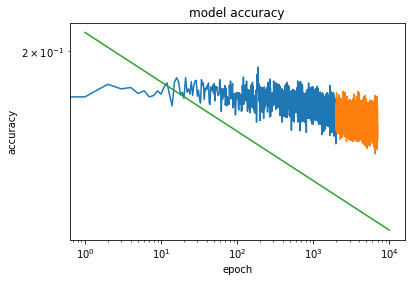

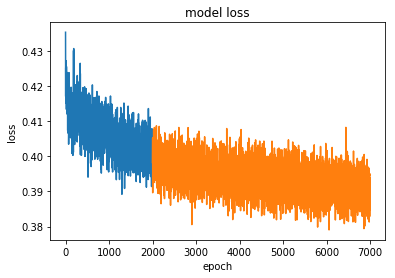

In [164]:
figure()
print(history3.history.keys())
#plot(history.history['acc'])
plot(history3.epoch,
1.0-array(history3.history['acc']))
plot(max(array(history3.epoch)*1.0)+array(history4.epoch),1.0-array(history4.history['acc']))
cf= -0.06; plot(10**linspace(0,4,100),(10**linspace(0,4,100))**cf*1.6e-1/100**cf)
xt =  concatenate((history3.epoch,max(array(history3.epoch)*1.0)+array(history4.epoch)))
yt =  concatenate((1.0-array(history3.history['acc']),1.0-array(history4.history['acc'])))

title('model accuracy')
ylabel('accuracy')
xlabel('epoch')
xscale("log")
yscale("log")

figure()
plot(history3.history['loss'])
plot(max(array(history3.epoch)*1.0)+array(history4.epoch),history4.history['loss'])
title('model loss')
ylabel('loss')
xlabel('epoch')

In [598]:
model.save("classifierFpuffffffff.h5")


/users/bssn/serna/environments/deepl/lib/python3.6/site-packages/ipykernel_launcher.py:13: RuntimeWarning: divide by zero encountered in log
  del sys.path[0]
/users/bssn/serna/environments/deepl/lib/python3.6/site-packages/ipykernel_launcher.py:29: RuntimeWarning: invalid value encountered in log
/users/bssn/serna/environments/deepl/lib/python3.6/site-packages/ipykernel_launcher.py:30: RuntimeWarning: invalid value encountered in log


0.12473381329533677 nan
0.14991698321731356 nan


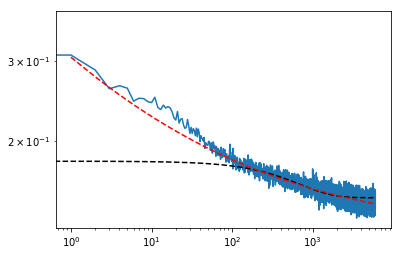

In [534]:
from scipy.optimize import curve_fit
xt =  concatenate((history3.epoch,max(array(history3.epoch)*1.0)+array(history4.epoch)))
yt =  concatenate((1.0-array(history3.history['acc']),1.0-array(history4.history['acc'])))

dy =  (log((yt[100]-1e-2))-log((yt[1000]-1e-2)))
dx =  (xt[100]-xt[1000])
dlx =  (log(xt[100])-log(xt[1000]))
cf02 = dy/dlx
cf12 = dy/dx
cf01 = log((yt[100]-1e-2)/xt[100]**cf02)
cf11 = log((yt[100]-1e-2)/exp(xt[100]*cf12))

def f0(xt,cf0,cf1,cf2): return(exp(cf0)+exp(cf1+log(xt)*cf2))
def f1(xt,cf0,cf1,cf2): return(exp(cf0)+exp(cf1+xt*cf2))
cf = array([log(1e-2),cf01,cf02])
min0 = curve_fit(f0,xt[100:3000],yt[100:3000],p0=cf,sigma= yt[100:3000]*.01)
cf = array([log(1e-2),cf11,cf12])
min1 = curve_fit(f1,xt[100:3000],yt[100:3000],p0=cf,sigma= yt[100:3000]*.01)

#print(min0.x)

#print(min1.x)
plot(xt,yt)
plot(xt,f1(xt,min1[0][0],min1[0][1],min1[0][2]),'k--')
plot(xt,f0(xt,min0[0][0],min0[0][1],min0[0][2]),'r--')

xscale("log")
yscale("log")
print(exp(min0[0][0]),exp((log(5e-2-exp(min0[0][0]))-min0[0][1])/min0[0][2]))
print(exp(min1[0][0]),(log(5e-2-exp(min1[0][0]))-min1[0][1])/min1[0][2])


In [350]:
#print(min1.x)
min1

(array([-2.03156466e+00, -3.25582698e+00, -1.40743824e-03]),
 array([[ 4.24574578e-07,  4.65360226e-07, -8.90822498e-09],
        [ 4.65360226e-07,  1.35590222e-04, -1.88770191e-07],
        [-8.90822498e-09, -1.88770191e-07,  6.22880858e-10]]))

In [410]:
history4 = model.fit(X, Y, batch_size = 500, epochs =25000)
model.save("classifierFt20181206B.h5")


Epoch 1/25000
3003/3003 [==============================] - 0s 100us/step - loss: 0.3118 - acc: 0.8821
Epoch 2/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3132 - acc: 0.8811
Epoch 3/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3025 - acc: 0.8854
Epoch 4/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3064 - acc: 0.8834
Epoch 5/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3088 - acc: 0.8841
Epoch 6/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3098 - acc: 0.8851
Epoch 7/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3047 - acc: 0.8821
Epoch 8/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3092 - acc: 0.8828
Epoch 9/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3091 - acc: 0.8861
Epoch 10/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3082 - 

3003/3003 [==============================] - 0s 91us/step - loss: 0.3010 - acc: 0.8861
Epoch 161/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3071 - acc: 0.8844
Epoch 162/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3198 - acc: 0.8751
Epoch 163/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3119 - acc: 0.8815
Epoch 164/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3045 - acc: 0.8834
Epoch 165/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3107 - acc: 0.8851
Epoch 166/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3118 - acc: 0.8805
Epoch 167/25000
3003/3003 [==============================] - 0s 93us/step - loss: 0.2998 - acc: 0.8861
Epoch 168/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3075 - acc: 0.8838
Epoch 169/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3118 

3003/3003 [==============================] - 0s 92us/step - loss: 0.3062 - acc: 0.8848
Epoch 319/25000
3003/3003 [==============================] - 0s 93us/step - loss: 0.3203 - acc: 0.8791
Epoch 320/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3112 - acc: 0.8844
Epoch 321/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3123 - acc: 0.8818
Epoch 322/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.2995 - acc: 0.8898
Epoch 323/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3062 - acc: 0.8834
Epoch 324/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3240 - acc: 0.8771
Epoch 325/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3063 - acc: 0.8841
Epoch 326/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3104 - acc: 0.8828
Epoch 327/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3064 

3003/3003 [==============================] - 0s 90us/step - loss: 0.3113 - acc: 0.8828
Epoch 477/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3111 - acc: 0.8825
Epoch 478/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3101 - acc: 0.8808
Epoch 479/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3011 - acc: 0.8841
Epoch 480/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3161 - acc: 0.8798
Epoch 481/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3127 - acc: 0.8788
Epoch 482/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3125 - acc: 0.8868
Epoch 483/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3056 - acc: 0.8861
Epoch 484/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3059 - acc: 0.8858
Epoch 485/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3093 

3003/3003 [==============================] - 0s 91us/step - loss: 0.3088 - acc: 0.8834
Epoch 635/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3170 - acc: 0.8735
Epoch 636/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3113 - acc: 0.8828
Epoch 637/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3083 - acc: 0.8871
Epoch 638/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3078 - acc: 0.8844
Epoch 639/25000
3003/3003 [==============================] - 0s 100us/step - loss: 0.3120 - acc: 0.8848
Epoch 640/25000
3003/3003 [==============================] - 0s 96us/step - loss: 0.2995 - acc: 0.8894
Epoch 641/25000
3003/3003 [==============================] - 0s 98us/step - loss: 0.3144 - acc: 0.8758
Epoch 642/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3033 - acc: 0.8894
Epoch 643/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3139

3003/3003 [==============================] - 0s 89us/step - loss: 0.3086 - acc: 0.8815
Epoch 793/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3070 - acc: 0.8854
Epoch 794/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3096 - acc: 0.8825
Epoch 795/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3114 - acc: 0.8781
Epoch 796/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3022 - acc: 0.8851
Epoch 797/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3111 - acc: 0.8815
Epoch 798/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3011 - acc: 0.8861
Epoch 799/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3025 - acc: 0.8871
Epoch 800/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3010 - acc: 0.8891
Epoch 801/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3153 

3003/3003 [==============================] - 0s 92us/step - loss: 0.3153 - acc: 0.8765
Epoch 951/25000
3003/3003 [==============================] - 0s 94us/step - loss: 0.3119 - acc: 0.8811
Epoch 952/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3113 - acc: 0.8831
Epoch 953/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3031 - acc: 0.8878
Epoch 954/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3149 - acc: 0.8791
Epoch 955/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3111 - acc: 0.8834
Epoch 956/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3059 - acc: 0.8834
Epoch 957/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3137 - acc: 0.8741
Epoch 958/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3058 - acc: 0.8848
Epoch 959/25000
3003/3003 [==============================] - 0s 94us/step - loss: 0.3089 

3003/3003 [==============================] - 0s 93us/step - loss: 0.3122 - acc: 0.8821
Epoch 1108/25000
3003/3003 [==============================] - 0s 95us/step - loss: 0.3138 - acc: 0.8768
Epoch 1109/25000
3003/3003 [==============================] - 0s 93us/step - loss: 0.3099 - acc: 0.8844
Epoch 1110/25000
3003/3003 [==============================] - 0s 93us/step - loss: 0.3057 - acc: 0.8858
Epoch 1111/25000
3003/3003 [==============================] - 0s 94us/step - loss: 0.3127 - acc: 0.8838
Epoch 1112/25000
3003/3003 [==============================] - 0s 100us/step - loss: 0.3142 - acc: 0.8805
Epoch 1113/25000
3003/3003 [==============================] - 0s 94us/step - loss: 0.3010 - acc: 0.8861
Epoch 1114/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3132 - acc: 0.8798
Epoch 1115/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3098 - acc: 0.8841
Epoch 1116/25000
3003/3003 [==============================] - 0s 92us/step - los

3003/3003 [==============================] - 0s 91us/step - loss: 0.3166 - acc: 0.8765
Epoch 1264/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3084 - acc: 0.8844
Epoch 1265/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3073 - acc: 0.8811
Epoch 1266/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3068 - acc: 0.8765
Epoch 1267/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3068 - acc: 0.8858
Epoch 1268/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3096 - acc: 0.8831
Epoch 1269/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3133 - acc: 0.8805
Epoch 1270/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3114 - acc: 0.8834
Epoch 1271/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3055 - acc: 0.8834
Epoch 1272/25000
3003/3003 [==============================] - 0s 91us/step - loss

3003/3003 [==============================] - 0s 90us/step - loss: 0.3097 - acc: 0.8778
Epoch 1420/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3002 - acc: 0.8858
Epoch 1421/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3081 - acc: 0.8801
Epoch 1422/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3128 - acc: 0.8821
Epoch 1423/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3150 - acc: 0.8795
Epoch 1424/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3172 - acc: 0.8815
Epoch 1425/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3050 - acc: 0.8864
Epoch 1426/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3106 - acc: 0.8831
Epoch 1427/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3110 - acc: 0.8808
Epoch 1428/25000
3003/3003 [==============================] - 0s 93us/step - loss

3003/3003 [==============================] - 0s 92us/step - loss: 0.3054 - acc: 0.8854
Epoch 1576/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3142 - acc: 0.8808
Epoch 1577/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3086 - acc: 0.8808
Epoch 1578/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3082 - acc: 0.8858
Epoch 1579/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3069 - acc: 0.8841
Epoch 1580/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3013 - acc: 0.8834
Epoch 1581/25000
3003/3003 [==============================] - 0s 95us/step - loss: 0.3105 - acc: 0.8838
Epoch 1582/25000
3003/3003 [==============================] - 0s 93us/step - loss: 0.3071 - acc: 0.8821
Epoch 1583/25000
3003/3003 [==============================] - 0s 96us/step - loss: 0.3062 - acc: 0.8838
Epoch 1584/25000
3003/3003 [==============================] - 0s 96us/step - loss

3003/3003 [==============================] - 0s 90us/step - loss: 0.3006 - acc: 0.8914
Epoch 1732/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2999 - acc: 0.8861
Epoch 1733/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3028 - acc: 0.8864
Epoch 1734/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3107 - acc: 0.8818
Epoch 1735/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3069 - acc: 0.8828
Epoch 1736/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3144 - acc: 0.8781
Epoch 1737/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3040 - acc: 0.8808
Epoch 1738/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3107 - acc: 0.8841
Epoch 1739/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3085 - acc: 0.8825
Epoch 1740/25000
3003/3003 [==============================] - 0s 89us/step - loss

3003/3003 [==============================] - 0s 91us/step - loss: 0.3168 - acc: 0.8771
Epoch 1888/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3030 - acc: 0.8828
Epoch 1889/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3140 - acc: 0.8765
Epoch 1890/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3086 - acc: 0.8818
Epoch 1891/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3011 - acc: 0.8858
Epoch 1892/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3057 - acc: 0.8861
Epoch 1893/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3085 - acc: 0.8805
Epoch 1894/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3008 - acc: 0.8848
Epoch 1895/25000
3003/3003 [==============================] - 0s 93us/step - loss: 0.3007 - acc: 0.8861
Epoch 1896/25000
3003/3003 [==============================] - 0s 91us/step - loss

3003/3003 [==============================] - 0s 91us/step - loss: 0.3163 - acc: 0.8795
Epoch 2044/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3072 - acc: 0.8828
Epoch 2045/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3042 - acc: 0.8825
Epoch 2046/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3039 - acc: 0.8874
Epoch 2047/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3056 - acc: 0.8844
Epoch 2048/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3088 - acc: 0.8795
Epoch 2049/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3060 - acc: 0.8844
Epoch 2050/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3081 - acc: 0.8858
Epoch 2051/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3029 - acc: 0.8851
Epoch 2052/25000
3003/3003 [==============================] - 0s 89us/step - loss

3003/3003 [==============================] - 0s 94us/step - loss: 0.3071 - acc: 0.8821
Epoch 2200/25000
3003/3003 [==============================] - 0s 96us/step - loss: 0.3005 - acc: 0.8871
Epoch 2201/25000
3003/3003 [==============================] - 0s 95us/step - loss: 0.3049 - acc: 0.8821
Epoch 2202/25000
3003/3003 [==============================] - 0s 98us/step - loss: 0.3056 - acc: 0.8841
Epoch 2203/25000
3003/3003 [==============================] - 0s 95us/step - loss: 0.3082 - acc: 0.8848
Epoch 2204/25000
3003/3003 [==============================] - 0s 96us/step - loss: 0.3069 - acc: 0.8831
Epoch 2205/25000
3003/3003 [==============================] - 0s 99us/step - loss: 0.3026 - acc: 0.8901
Epoch 2206/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3101 - acc: 0.8821
Epoch 2207/25000
3003/3003 [==============================] - 0s 95us/step - loss: 0.3088 - acc: 0.8818
Epoch 2208/25000
3003/3003 [==============================] - 0s 94us/step - loss

3003/3003 [==============================] - 0s 92us/step - loss: 0.3138 - acc: 0.8805
Epoch 2356/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3052 - acc: 0.8848
Epoch 2357/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3069 - acc: 0.8751
Epoch 2358/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3098 - acc: 0.8868
Epoch 2359/25000
3003/3003 [==============================] - 0s 96us/step - loss: 0.3026 - acc: 0.8861
Epoch 2360/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3091 - acc: 0.8805
Epoch 2361/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3023 - acc: 0.8828
Epoch 2362/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3074 - acc: 0.8848
Epoch 2363/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3053 - acc: 0.8831
Epoch 2364/25000
3003/3003 [==============================] - 0s 92us/step - loss

3003/3003 [==============================] - 0s 90us/step - loss: 0.3065 - acc: 0.8871
Epoch 2512/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3103 - acc: 0.8801
Epoch 2513/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3045 - acc: 0.8798
Epoch 2514/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3110 - acc: 0.8808
Epoch 2515/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3091 - acc: 0.8821
Epoch 2516/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3051 - acc: 0.8844
Epoch 2517/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3009 - acc: 0.8874
Epoch 2518/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3015 - acc: 0.8878
Epoch 2519/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3003 - acc: 0.8864
Epoch 2520/25000
3003/3003 [==============================] - 0s 96us/step - loss

3003/3003 [==============================] - 0s 91us/step - loss: 0.3122 - acc: 0.8834
Epoch 2668/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3126 - acc: 0.8788
Epoch 2669/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3073 - acc: 0.8841
Epoch 2670/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3044 - acc: 0.8851
Epoch 2671/25000
3003/3003 [==============================] - 0s 93us/step - loss: 0.3060 - acc: 0.8811
Epoch 2672/25000
3003/3003 [==============================] - 0s 94us/step - loss: 0.3080 - acc: 0.8828
Epoch 2673/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3024 - acc: 0.8844
Epoch 2674/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3047 - acc: 0.8861
Epoch 2675/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3042 - acc: 0.8838
Epoch 2676/25000
3003/3003 [==============================] - 0s 93us/step - loss

3003/3003 [==============================] - 0s 91us/step - loss: 0.3122 - acc: 0.8805
Epoch 2824/25000
3003/3003 [==============================] - 0s 95us/step - loss: 0.3041 - acc: 0.8854
Epoch 2825/25000
3003/3003 [==============================] - 0s 94us/step - loss: 0.3035 - acc: 0.8838
Epoch 2826/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3042 - acc: 0.8821
Epoch 2827/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3123 - acc: 0.8781
Epoch 2828/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3026 - acc: 0.8861
Epoch 2829/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3091 - acc: 0.8795
Epoch 2830/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3064 - acc: 0.8861
Epoch 2831/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.2984 - acc: 0.8868
Epoch 2832/25000
3003/3003 [==============================] - 0s 90us/step - loss

3003/3003 [==============================] - 0s 93us/step - loss: 0.2993 - acc: 0.8908
Epoch 2980/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3103 - acc: 0.8791
Epoch 2981/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3055 - acc: 0.8851
Epoch 2982/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3060 - acc: 0.8851
Epoch 2983/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3043 - acc: 0.8868
Epoch 2984/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3048 - acc: 0.8795
Epoch 2985/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3039 - acc: 0.8871
Epoch 2986/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3075 - acc: 0.8815
Epoch 2987/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3047 - acc: 0.8858
Epoch 2988/25000
3003/3003 [==============================] - 0s 96us/step - loss

3003/3003 [==============================] - 0s 89us/step - loss: 0.3104 - acc: 0.8808
Epoch 3136/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3055 - acc: 0.8864
Epoch 3137/25000
3003/3003 [==============================] - 0s 95us/step - loss: 0.3039 - acc: 0.8848
Epoch 3138/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3089 - acc: 0.8791
Epoch 3139/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2997 - acc: 0.8834
Epoch 3140/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3067 - acc: 0.8815
Epoch 3141/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3054 - acc: 0.8851
Epoch 3142/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3026 - acc: 0.8851
Epoch 3143/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3109 - acc: 0.8868
Epoch 3144/25000
3003/3003 [==============================] - 0s 93us/step - loss

3003/3003 [==============================] - 0s 90us/step - loss: 0.3112 - acc: 0.8775
Epoch 3292/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3091 - acc: 0.8838
Epoch 3293/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3041 - acc: 0.8768
Epoch 3294/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3086 - acc: 0.8818
Epoch 3295/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3055 - acc: 0.8841
Epoch 3296/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3053 - acc: 0.8854
Epoch 3297/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3123 - acc: 0.8768
Epoch 3298/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3082 - acc: 0.8808
Epoch 3299/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3055 - acc: 0.8841
Epoch 3300/25000
3003/3003 [==============================] - 0s 91us/step - loss

3003/3003 [==============================] - 0s 91us/step - loss: 0.3030 - acc: 0.8818
Epoch 3448/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3095 - acc: 0.8838
Epoch 3449/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3014 - acc: 0.8848
Epoch 3450/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3048 - acc: 0.8834
Epoch 3451/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3122 - acc: 0.8798
Epoch 3452/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3000 - acc: 0.8901
Epoch 3453/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3029 - acc: 0.8828
Epoch 3454/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3077 - acc: 0.8844
Epoch 3455/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3048 - acc: 0.8854
Epoch 3456/25000
3003/3003 [==============================] - 0s 89us/step - loss

3003/3003 [==============================] - 0s 87us/step - loss: 0.3068 - acc: 0.8844
Epoch 3604/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.2987 - acc: 0.8834
Epoch 3605/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.2987 - acc: 0.8864
Epoch 3606/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3016 - acc: 0.8854
Epoch 3607/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3100 - acc: 0.8805
Epoch 3608/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3028 - acc: 0.8858
Epoch 3609/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3080 - acc: 0.8815
Epoch 3610/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3134 - acc: 0.8825
Epoch 3611/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3066 - acc: 0.8844
Epoch 3612/25000
3003/3003 [==============================] - 0s 91us/step - loss

3003/3003 [==============================] - 0s 89us/step - loss: 0.3102 - acc: 0.8834
Epoch 3760/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3089 - acc: 0.8858
Epoch 3761/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3058 - acc: 0.8851
Epoch 3762/25000
3003/3003 [==============================] - 0s 87us/step - loss: 0.3004 - acc: 0.8861
Epoch 3763/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3056 - acc: 0.8798
Epoch 3764/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3137 - acc: 0.8781
Epoch 3765/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3067 - acc: 0.8798
Epoch 3766/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3036 - acc: 0.8844
Epoch 3767/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3082 - acc: 0.8851
Epoch 3768/25000
3003/3003 [==============================] - 0s 89us/step - loss

3003/3003 [==============================] - 0s 88us/step - loss: 0.3027 - acc: 0.8864
Epoch 3916/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3076 - acc: 0.8864
Epoch 3917/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3041 - acc: 0.8888
Epoch 3918/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3023 - acc: 0.8881
Epoch 3919/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3067 - acc: 0.8811
Epoch 3920/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3057 - acc: 0.8851
Epoch 3921/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3154 - acc: 0.8818
Epoch 3922/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3075 - acc: 0.8825
Epoch 3923/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3077 - acc: 0.8838
Epoch 3924/25000
3003/3003 [==============================] - 0s 89us/step - loss

3003/3003 [==============================] - 0s 92us/step - loss: 0.3054 - acc: 0.8821
Epoch 4072/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3071 - acc: 0.8841
Epoch 4073/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3035 - acc: 0.8864
Epoch 4074/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3081 - acc: 0.8834
Epoch 4075/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3062 - acc: 0.8848
Epoch 4076/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3088 - acc: 0.8854
Epoch 4077/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3135 - acc: 0.8815
Epoch 4078/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3075 - acc: 0.8808
Epoch 4079/25000
3003/3003 [==============================] - 0s 99us/step - loss: 0.3098 - acc: 0.8848
Epoch 4080/25000
3003/3003 [==============================] - 0s 89us/step - loss

3003/3003 [==============================] - 0s 90us/step - loss: 0.3077 - acc: 0.8848
Epoch 4228/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3083 - acc: 0.8788
Epoch 4229/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.2970 - acc: 0.8904
Epoch 4230/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3034 - acc: 0.8861
Epoch 4231/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3059 - acc: 0.8841
Epoch 4232/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3121 - acc: 0.8765
Epoch 4233/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.2924 - acc: 0.8904
Epoch 4234/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3149 - acc: 0.8775
Epoch 4235/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3170 - acc: 0.8811
Epoch 4236/25000
3003/3003 [==============================] - 0s 89us/step - loss

3003/3003 [==============================] - 0s 90us/step - loss: 0.3083 - acc: 0.8811
Epoch 4384/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3071 - acc: 0.8861
Epoch 4385/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3068 - acc: 0.8854
Epoch 4386/25000
3003/3003 [==============================] - 0s 99us/step - loss: 0.3007 - acc: 0.8848
Epoch 4387/25000
3003/3003 [==============================] - 0s 94us/step - loss: 0.2980 - acc: 0.8911
Epoch 4388/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3010 - acc: 0.8874
Epoch 4389/25000
3003/3003 [==============================] - 0s 93us/step - loss: 0.3084 - acc: 0.8811
Epoch 4390/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3069 - acc: 0.8874
Epoch 4391/25000
3003/3003 [==============================] - 0s 93us/step - loss: 0.3072 - acc: 0.8818
Epoch 4392/25000
3003/3003 [==============================] - 0s 92us/step - loss

3003/3003 [==============================] - 0s 88us/step - loss: 0.3022 - acc: 0.8874
Epoch 4540/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3017 - acc: 0.8888
Epoch 4541/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3058 - acc: 0.8858
Epoch 4542/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3066 - acc: 0.8815
Epoch 4543/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3028 - acc: 0.8831
Epoch 4544/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3001 - acc: 0.8878
Epoch 4545/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3061 - acc: 0.8831
Epoch 4546/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3068 - acc: 0.8831
Epoch 4547/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3042 - acc: 0.8815
Epoch 4548/25000
3003/3003 [==============================] - 0s 90us/step - loss

3003/3003 [==============================] - 0s 92us/step - loss: 0.3087 - acc: 0.8878
Epoch 4696/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3043 - acc: 0.8851
Epoch 4697/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3086 - acc: 0.8801
Epoch 4698/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3076 - acc: 0.8834
Epoch 4699/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.2997 - acc: 0.8848
Epoch 4700/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3029 - acc: 0.8848
Epoch 4701/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.2989 - acc: 0.8841
Epoch 4702/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.2999 - acc: 0.8888
Epoch 4703/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3104 - acc: 0.8801
Epoch 4704/25000
3003/3003 [==============================] - 0s 92us/step - loss

3003/3003 [==============================] - 0s 91us/step - loss: 0.3100 - acc: 0.8818
Epoch 4852/25000
3003/3003 [==============================] - 0s 95us/step - loss: 0.3031 - acc: 0.8841
Epoch 4853/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3084 - acc: 0.8851
Epoch 4854/25000
3003/3003 [==============================] - 0s 93us/step - loss: 0.3089 - acc: 0.8825
Epoch 4855/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3047 - acc: 0.8834
Epoch 4856/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3019 - acc: 0.8878
Epoch 4857/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3112 - acc: 0.8801
Epoch 4858/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.2937 - acc: 0.8904
Epoch 4859/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3054 - acc: 0.8858
Epoch 4860/25000
3003/3003 [==============================] - 0s 91us/step - loss

3003/3003 [==============================] - 0s 88us/step - loss: 0.2966 - acc: 0.8898
Epoch 5008/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3087 - acc: 0.8825
Epoch 5009/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3017 - acc: 0.8864
Epoch 5010/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3012 - acc: 0.8834
Epoch 5011/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3043 - acc: 0.8815
Epoch 5012/25000
3003/3003 [==============================] - 0s 87us/step - loss: 0.3115 - acc: 0.8818
Epoch 5013/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3027 - acc: 0.8825
Epoch 5014/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3077 - acc: 0.8825
Epoch 5015/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3027 - acc: 0.8864
Epoch 5016/25000
3003/3003 [==============================] - 0s 94us/step - loss

3003/3003 [==============================] - 0s 89us/step - loss: 0.3094 - acc: 0.8825
Epoch 5164/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3083 - acc: 0.8848
Epoch 5165/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3018 - acc: 0.8884
Epoch 5166/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3044 - acc: 0.8881
Epoch 5167/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3090 - acc: 0.8828
Epoch 5168/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3127 - acc: 0.8805
Epoch 5169/25000
3003/3003 [==============================] - 0s 95us/step - loss: 0.3156 - acc: 0.8791
Epoch 5170/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3039 - acc: 0.8864
Epoch 5171/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3040 - acc: 0.8864
Epoch 5172/25000
3003/3003 [==============================] - 0s 88us/step - loss

3003/3003 [==============================] - 0s 89us/step - loss: 0.3075 - acc: 0.8828
Epoch 5320/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3112 - acc: 0.8838
Epoch 5321/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3054 - acc: 0.8831
Epoch 5322/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3047 - acc: 0.8811
Epoch 5323/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.2995 - acc: 0.8904
Epoch 5324/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3069 - acc: 0.8848
Epoch 5325/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3155 - acc: 0.8801
Epoch 5326/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3065 - acc: 0.8838
Epoch 5327/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3022 - acc: 0.8864
Epoch 5328/25000
3003/3003 [==============================] - 0s 88us/step - loss

3003/3003 [==============================] - 0s 96us/step - loss: 0.3099 - acc: 0.8838
Epoch 5476/25000
3003/3003 [==============================] - 0s 96us/step - loss: 0.3026 - acc: 0.8818
Epoch 5477/25000
3003/3003 [==============================] - 0s 96us/step - loss: 0.2998 - acc: 0.8914
Epoch 5478/25000
3003/3003 [==============================] - 0s 93us/step - loss: 0.3019 - acc: 0.8874
Epoch 5479/25000
3003/3003 [==============================] - 0s 95us/step - loss: 0.2975 - acc: 0.8854
Epoch 5480/25000
3003/3003 [==============================] - 0s 93us/step - loss: 0.3031 - acc: 0.8825
Epoch 5481/25000
3003/3003 [==============================] - 0s 95us/step - loss: 0.3006 - acc: 0.8864
Epoch 5482/25000
3003/3003 [==============================] - 0s 95us/step - loss: 0.3046 - acc: 0.8841
Epoch 5483/25000
3003/3003 [==============================] - 0s 95us/step - loss: 0.3033 - acc: 0.8815
Epoch 5484/25000
3003/3003 [==============================] - 0s 96us/step - loss

3003/3003 [==============================] - 0s 91us/step - loss: 0.2999 - acc: 0.8854
Epoch 5632/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3037 - acc: 0.8848
Epoch 5633/25000
3003/3003 [==============================] - 0s 96us/step - loss: 0.3089 - acc: 0.8808
Epoch 5634/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.2982 - acc: 0.8868
Epoch 5635/25000
3003/3003 [==============================] - 0s 94us/step - loss: 0.3038 - acc: 0.8888
Epoch 5636/25000
3003/3003 [==============================] - 0s 95us/step - loss: 0.3109 - acc: 0.8881
Epoch 5637/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2951 - acc: 0.8901
Epoch 5638/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3049 - acc: 0.8821
Epoch 5639/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3034 - acc: 0.8831
Epoch 5640/25000
3003/3003 [==============================] - 0s 92us/step - loss

3003/3003 [==============================] - 0s 89us/step - loss: 0.3036 - acc: 0.8881
Epoch 5788/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3083 - acc: 0.8868
Epoch 5789/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3134 - acc: 0.8818
Epoch 5790/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3048 - acc: 0.8861
Epoch 5791/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3118 - acc: 0.8798
Epoch 5792/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3099 - acc: 0.8841
Epoch 5793/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3097 - acc: 0.8848
Epoch 5794/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3035 - acc: 0.8874
Epoch 5795/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3043 - acc: 0.8864
Epoch 5796/25000
3003/3003 [==============================] - 0s 92us/step - loss

3003/3003 [==============================] - 0s 89us/step - loss: 0.3032 - acc: 0.8888
Epoch 5944/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3018 - acc: 0.8901
Epoch 5945/25000
3003/3003 [==============================] - 0s 93us/step - loss: 0.2989 - acc: 0.8871
Epoch 5946/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3106 - acc: 0.8811
Epoch 5947/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3055 - acc: 0.8828
Epoch 5948/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3079 - acc: 0.8834
Epoch 5949/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3093 - acc: 0.8851
Epoch 5950/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3018 - acc: 0.8901
Epoch 5951/25000
3003/3003 [==============================] - 0s 87us/step - loss: 0.3034 - acc: 0.8874
Epoch 5952/25000
3003/3003 [==============================] - 0s 89us/step - loss

3003/3003 [==============================] - 0s 92us/step - loss: 0.3086 - acc: 0.8831
Epoch 6100/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3017 - acc: 0.8854
Epoch 6101/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3008 - acc: 0.8874
Epoch 6102/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.2993 - acc: 0.8884
Epoch 6103/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3095 - acc: 0.8831
Epoch 6104/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3074 - acc: 0.8805
Epoch 6105/25000
3003/3003 [==============================] - 0s 94us/step - loss: 0.3019 - acc: 0.8844
Epoch 6106/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2989 - acc: 0.8864
Epoch 6107/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3047 - acc: 0.8848
Epoch 6108/25000
3003/3003 [==============================] - 0s 90us/step - loss

3003/3003 [==============================] - 0s 89us/step - loss: 0.3104 - acc: 0.8821
Epoch 6256/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.2989 - acc: 0.8894
Epoch 6257/25000
3003/3003 [==============================] - 0s 87us/step - loss: 0.3153 - acc: 0.8805
Epoch 6258/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2965 - acc: 0.8874
Epoch 6259/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3013 - acc: 0.8848
Epoch 6260/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3013 - acc: 0.8881
Epoch 6261/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3024 - acc: 0.8864
Epoch 6262/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3128 - acc: 0.8838
Epoch 6263/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3013 - acc: 0.8838
Epoch 6264/25000
3003/3003 [==============================] - 0s 89us/step - loss

3003/3003 [==============================] - 0s 90us/step - loss: 0.3064 - acc: 0.8878
Epoch 6412/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3019 - acc: 0.8851
Epoch 6413/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3077 - acc: 0.8844
Epoch 6414/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3053 - acc: 0.8821
Epoch 6415/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3041 - acc: 0.8828
Epoch 6416/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3043 - acc: 0.8825
Epoch 6417/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3066 - acc: 0.8844
Epoch 6418/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2917 - acc: 0.8914
Epoch 6419/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3035 - acc: 0.8858
Epoch 6420/25000
3003/3003 [==============================] - 0s 88us/step - loss

3003/3003 [==============================] - 0s 90us/step - loss: 0.3087 - acc: 0.8795
Epoch 6568/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3056 - acc: 0.8844
Epoch 6569/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3046 - acc: 0.8844
Epoch 6570/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3041 - acc: 0.8808
Epoch 6571/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3029 - acc: 0.8838
Epoch 6572/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3060 - acc: 0.8828
Epoch 6573/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3096 - acc: 0.8874
Epoch 6574/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3014 - acc: 0.8878
Epoch 6575/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3044 - acc: 0.8811
Epoch 6576/25000
3003/3003 [==============================] - 0s 89us/step - loss

3003/3003 [==============================] - 0s 88us/step - loss: 0.3026 - acc: 0.8838
Epoch 6724/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3026 - acc: 0.8874
Epoch 6725/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3017 - acc: 0.8848
Epoch 6726/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3133 - acc: 0.8791
Epoch 6727/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3073 - acc: 0.8815
Epoch 6728/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3043 - acc: 0.8841
Epoch 6729/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3030 - acc: 0.8838
Epoch 6730/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3078 - acc: 0.8821
Epoch 6731/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3014 - acc: 0.8894
Epoch 6732/25000
3003/3003 [==============================] - 0s 88us/step - loss

3003/3003 [==============================] - 0s 90us/step - loss: 0.3092 - acc: 0.8841
Epoch 6880/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3004 - acc: 0.8871
Epoch 6881/25000
3003/3003 [==============================] - 0s 87us/step - loss: 0.2995 - acc: 0.8874
Epoch 6882/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3028 - acc: 0.8854
Epoch 6883/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3035 - acc: 0.8864
Epoch 6884/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3063 - acc: 0.8861
Epoch 6885/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3082 - acc: 0.8811
Epoch 6886/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3054 - acc: 0.8841
Epoch 6887/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3011 - acc: 0.8841
Epoch 6888/25000
3003/3003 [==============================] - 0s 90us/step - loss

3003/3003 [==============================] - 0s 91us/step - loss: 0.3071 - acc: 0.8854
Epoch 7036/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3005 - acc: 0.8818
Epoch 7037/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3080 - acc: 0.8844
Epoch 7038/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3065 - acc: 0.8815
Epoch 7039/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3093 - acc: 0.8828
Epoch 7040/25000
3003/3003 [==============================] - 0s 94us/step - loss: 0.3071 - acc: 0.8821
Epoch 7041/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3074 - acc: 0.8881
Epoch 7042/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3028 - acc: 0.8851
Epoch 7043/25000
3003/3003 [==============================] - 0s 93us/step - loss: 0.3082 - acc: 0.8828
Epoch 7044/25000
3003/3003 [==============================] - 0s 91us/step - loss

3003/3003 [==============================] - 0s 88us/step - loss: 0.2992 - acc: 0.8874
Epoch 7192/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3087 - acc: 0.8854
Epoch 7193/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3019 - acc: 0.8868
Epoch 7194/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3074 - acc: 0.8848
Epoch 7195/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3024 - acc: 0.8891
Epoch 7196/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3127 - acc: 0.8791
Epoch 7197/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3026 - acc: 0.8841
Epoch 7198/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3151 - acc: 0.8815
Epoch 7199/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3086 - acc: 0.8844
Epoch 7200/25000
3003/3003 [==============================] - 0s 91us/step - loss

3003/3003 [==============================] - 0s 88us/step - loss: 0.3046 - acc: 0.8841
Epoch 7348/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3007 - acc: 0.8861
Epoch 7349/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3033 - acc: 0.8838
Epoch 7350/25000
3003/3003 [==============================] - 0s 96us/step - loss: 0.3094 - acc: 0.8871
Epoch 7351/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3054 - acc: 0.8834
Epoch 7352/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3054 - acc: 0.8868
Epoch 7353/25000
3003/3003 [==============================] - 0s 95us/step - loss: 0.3041 - acc: 0.8854
Epoch 7354/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3093 - acc: 0.8841
Epoch 7355/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3027 - acc: 0.8861
Epoch 7356/25000
3003/3003 [==============================] - 0s 89us/step - loss

3003/3003 [==============================] - 0s 88us/step - loss: 0.3026 - acc: 0.8878
Epoch 7504/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3036 - acc: 0.8811
Epoch 7505/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3104 - acc: 0.8788
Epoch 7506/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3041 - acc: 0.8851
Epoch 7507/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3061 - acc: 0.8861
Epoch 7508/25000
3003/3003 [==============================] - 0s 97us/step - loss: 0.3102 - acc: 0.8778
Epoch 7509/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3017 - acc: 0.8894
Epoch 7510/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3032 - acc: 0.8844
Epoch 7511/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.2999 - acc: 0.8844
Epoch 7512/25000
3003/3003 [==============================] - 0s 89us/step - loss

3003/3003 [==============================] - 0s 90us/step - loss: 0.3154 - acc: 0.8778
Epoch 7660/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3040 - acc: 0.8861
Epoch 7661/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3043 - acc: 0.8861
Epoch 7662/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.2955 - acc: 0.8901
Epoch 7663/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.2946 - acc: 0.8868
Epoch 7664/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3068 - acc: 0.8844
Epoch 7665/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3044 - acc: 0.8854
Epoch 7666/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.2992 - acc: 0.8894
Epoch 7667/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3059 - acc: 0.8825
Epoch 7668/25000
3003/3003 [==============================] - 0s 90us/step - loss

3003/3003 [==============================] - 0s 109us/step - loss: 0.3014 - acc: 0.8888
Epoch 7816/25000
3003/3003 [==============================] - 0s 110us/step - loss: 0.3011 - acc: 0.8834
Epoch 7817/25000
3003/3003 [==============================] - 0s 108us/step - loss: 0.2988 - acc: 0.8871
Epoch 7818/25000
3003/3003 [==============================] - 0s 109us/step - loss: 0.3064 - acc: 0.8825
Epoch 7819/25000
3003/3003 [==============================] - 0s 109us/step - loss: 0.2977 - acc: 0.8868
Epoch 7820/25000
3003/3003 [==============================] - 0s 109us/step - loss: 0.3040 - acc: 0.8834
Epoch 7821/25000
3003/3003 [==============================] - 0s 99us/step - loss: 0.3034 - acc: 0.8864
Epoch 7822/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.2985 - acc: 0.8891
Epoch 7823/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3077 - acc: 0.8838
Epoch 7824/25000
3003/3003 [==============================] - 0s 89us/step 

3003/3003 [==============================] - 0s 89us/step - loss: 0.3021 - acc: 0.8831
Epoch 7972/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3099 - acc: 0.8848
Epoch 7973/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3078 - acc: 0.8851
Epoch 7974/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3057 - acc: 0.8818
Epoch 7975/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.2977 - acc: 0.8831
Epoch 7976/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.2999 - acc: 0.8874
Epoch 7977/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3074 - acc: 0.8834
Epoch 7978/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3039 - acc: 0.8858
Epoch 7979/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.2983 - acc: 0.8891
Epoch 7980/25000
3003/3003 [==============================] - 0s 88us/step - loss

3003/3003 [==============================] - 0s 90us/step - loss: 0.3035 - acc: 0.8868
Epoch 8128/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3040 - acc: 0.8848
Epoch 8129/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2999 - acc: 0.8891
Epoch 8130/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3068 - acc: 0.8854
Epoch 8131/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3014 - acc: 0.8884
Epoch 8132/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3142 - acc: 0.8791
Epoch 8133/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.2998 - acc: 0.8844
Epoch 8134/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3022 - acc: 0.8841
Epoch 8135/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3046 - acc: 0.8838
Epoch 8136/25000
3003/3003 [==============================] - 0s 90us/step - loss

3003/3003 [==============================] - 0s 90us/step - loss: 0.2998 - acc: 0.8884
Epoch 8284/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3012 - acc: 0.8864
Epoch 8285/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3016 - acc: 0.8815
Epoch 8286/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3022 - acc: 0.8871
Epoch 8287/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.2963 - acc: 0.8891
Epoch 8288/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3082 - acc: 0.8848
Epoch 8289/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3082 - acc: 0.8821
Epoch 8290/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3055 - acc: 0.8838
Epoch 8291/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.2997 - acc: 0.8858
Epoch 8292/25000
3003/3003 [==============================] - 0s 90us/step - loss

3003/3003 [==============================] - 0s 91us/step - loss: 0.2998 - acc: 0.8911
Epoch 8440/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3005 - acc: 0.8888
Epoch 8441/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2988 - acc: 0.8871
Epoch 8442/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.2981 - acc: 0.8881
Epoch 8443/25000
3003/3003 [==============================] - 0s 96us/step - loss: 0.2983 - acc: 0.8888
Epoch 8444/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3012 - acc: 0.8884
Epoch 8445/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3137 - acc: 0.8785
Epoch 8446/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3084 - acc: 0.8808
Epoch 8447/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3065 - acc: 0.8841
Epoch 8448/25000
3003/3003 [==============================] - 0s 88us/step - loss

3003/3003 [==============================] - 0s 89us/step - loss: 0.3077 - acc: 0.8815
Epoch 8596/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3007 - acc: 0.8888
Epoch 8597/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3058 - acc: 0.8851
Epoch 8598/25000
3003/3003 [==============================] - 0s 94us/step - loss: 0.3009 - acc: 0.8881
Epoch 8599/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.2979 - acc: 0.8861
Epoch 8600/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3052 - acc: 0.8858
Epoch 8601/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3075 - acc: 0.8828
Epoch 8602/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3022 - acc: 0.8811
Epoch 8603/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3061 - acc: 0.8854
Epoch 8604/25000
3003/3003 [==============================] - 0s 90us/step - loss

3003/3003 [==============================] - 0s 91us/step - loss: 0.3048 - acc: 0.8848
Epoch 8752/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3041 - acc: 0.8821
Epoch 8753/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3067 - acc: 0.8805
Epoch 8754/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3104 - acc: 0.8818
Epoch 8755/25000
3003/3003 [==============================] - 0s 93us/step - loss: 0.3071 - acc: 0.8798
Epoch 8756/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.2994 - acc: 0.8868
Epoch 8757/25000
3003/3003 [==============================] - 0s 93us/step - loss: 0.3048 - acc: 0.8841
Epoch 8758/25000
3003/3003 [==============================] - 0s 93us/step - loss: 0.3026 - acc: 0.8854
Epoch 8759/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3034 - acc: 0.8844
Epoch 8760/25000
3003/3003 [==============================] - 0s 89us/step - loss

3003/3003 [==============================] - 0s 92us/step - loss: 0.3079 - acc: 0.8778
Epoch 8908/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3075 - acc: 0.8828
Epoch 8909/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3034 - acc: 0.8851
Epoch 8910/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.2972 - acc: 0.8928
Epoch 8911/25000
3003/3003 [==============================] - 0s 94us/step - loss: 0.3043 - acc: 0.8904
Epoch 8912/25000
3003/3003 [==============================] - 0s 94us/step - loss: 0.3030 - acc: 0.8878
Epoch 8913/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3058 - acc: 0.8834
Epoch 8914/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3087 - acc: 0.8848
Epoch 8915/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3046 - acc: 0.8871
Epoch 8916/25000
3003/3003 [==============================] - 0s 90us/step - loss

3003/3003 [==============================] - 0s 90us/step - loss: 0.3005 - acc: 0.8898
Epoch 9064/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3038 - acc: 0.8851
Epoch 9065/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3009 - acc: 0.8874
Epoch 9066/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3042 - acc: 0.8821
Epoch 9067/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3102 - acc: 0.8828
Epoch 9068/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3048 - acc: 0.8805
Epoch 9069/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3086 - acc: 0.8868
Epoch 9070/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3038 - acc: 0.8894
Epoch 9071/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3137 - acc: 0.8825
Epoch 9072/25000
3003/3003 [==============================] - 0s 89us/step - loss

3003/3003 [==============================] - 0s 89us/step - loss: 0.3041 - acc: 0.8848
Epoch 9220/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3089 - acc: 0.8828
Epoch 9221/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3080 - acc: 0.8815
Epoch 9222/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3022 - acc: 0.8861
Epoch 9223/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.2912 - acc: 0.8938
Epoch 9224/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3058 - acc: 0.8854
Epoch 9225/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3057 - acc: 0.8825
Epoch 9226/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3088 - acc: 0.8825
Epoch 9227/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3013 - acc: 0.8864
Epoch 9228/25000
3003/3003 [==============================] - 0s 89us/step - loss

3003/3003 [==============================] - 0s 91us/step - loss: 0.3013 - acc: 0.8848
Epoch 9376/25000
3003/3003 [==============================] - 0s 94us/step - loss: 0.3039 - acc: 0.8828
Epoch 9377/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3006 - acc: 0.8851
Epoch 9378/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.2986 - acc: 0.8891
Epoch 9379/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3072 - acc: 0.8861
Epoch 9380/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3022 - acc: 0.8841
Epoch 9381/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3067 - acc: 0.8858
Epoch 9382/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3047 - acc: 0.8834
Epoch 9383/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.2997 - acc: 0.8898
Epoch 9384/25000
3003/3003 [==============================] - 0s 90us/step - loss

3003/3003 [==============================] - 0s 89us/step - loss: 0.3004 - acc: 0.8864
Epoch 9532/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3134 - acc: 0.8811
Epoch 9533/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2999 - acc: 0.8858
Epoch 9534/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3089 - acc: 0.8815
Epoch 9535/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.2962 - acc: 0.8908
Epoch 9536/25000
3003/3003 [==============================] - 0s 98us/step - loss: 0.3002 - acc: 0.8878
Epoch 9537/25000
3003/3003 [==============================] - 0s 86us/step - loss: 0.3031 - acc: 0.8808
Epoch 9538/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3009 - acc: 0.8848
Epoch 9539/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3039 - acc: 0.8858
Epoch 9540/25000
3003/3003 [==============================] - 0s 89us/step - loss

3003/3003 [==============================] - 0s 89us/step - loss: 0.3068 - acc: 0.8868
Epoch 9688/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3095 - acc: 0.8805
Epoch 9689/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3065 - acc: 0.8808
Epoch 9690/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3017 - acc: 0.8894
Epoch 9691/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3052 - acc: 0.8858
Epoch 9692/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2972 - acc: 0.8878
Epoch 9693/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2988 - acc: 0.8874
Epoch 9694/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3054 - acc: 0.8834
Epoch 9695/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3089 - acc: 0.8825
Epoch 9696/25000
3003/3003 [==============================] - 0s 90us/step - loss

3003/3003 [==============================] - 0s 89us/step - loss: 0.3047 - acc: 0.8878
Epoch 9844/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3089 - acc: 0.8795
Epoch 9845/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3010 - acc: 0.8891
Epoch 9846/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2980 - acc: 0.8874
Epoch 9847/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3008 - acc: 0.8878
Epoch 9848/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.2994 - acc: 0.8888
Epoch 9849/25000
3003/3003 [==============================] - 0s 87us/step - loss: 0.3052 - acc: 0.8844
Epoch 9850/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3021 - acc: 0.8854
Epoch 9851/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3034 - acc: 0.8831
Epoch 9852/25000
3003/3003 [==============================] - 0s 89us/step - loss

3003/3003 [==============================] - 0s 87us/step - loss: 0.3014 - acc: 0.8861
Epoch 10000/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3062 - acc: 0.8834
Epoch 10001/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3048 - acc: 0.8821
Epoch 10002/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3048 - acc: 0.8841
Epoch 10003/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3068 - acc: 0.8811
Epoch 10004/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3044 - acc: 0.8861
Epoch 10005/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3069 - acc: 0.8861
Epoch 10006/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2978 - acc: 0.8854
Epoch 10007/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3024 - acc: 0.8838
Epoch 10008/25000
3003/3003 [==============================] - 0s 88us/st

3003/3003 [==============================] - 0s 89us/step - loss: 0.3104 - acc: 0.8791
Epoch 10156/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3038 - acc: 0.8861
Epoch 10157/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3038 - acc: 0.8868
Epoch 10158/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.2997 - acc: 0.8884
Epoch 10159/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2966 - acc: 0.8851
Epoch 10160/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3097 - acc: 0.8791
Epoch 10161/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3033 - acc: 0.8871
Epoch 10162/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3032 - acc: 0.8864
Epoch 10163/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3017 - acc: 0.8844
Epoch 10164/25000
3003/3003 [==============================] - 0s 91us/st

3003/3003 [==============================] - 0s 89us/step - loss: 0.2973 - acc: 0.8884
Epoch 10312/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3018 - acc: 0.8841
Epoch 10313/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.2953 - acc: 0.8888
Epoch 10314/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3065 - acc: 0.8825
Epoch 10315/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3087 - acc: 0.8811
Epoch 10316/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3033 - acc: 0.8861
Epoch 10317/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.2978 - acc: 0.8864
Epoch 10318/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3041 - acc: 0.8884
Epoch 10319/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3041 - acc: 0.8844
Epoch 10320/25000
3003/3003 [==============================] - 0s 89us/st

3003/3003 [==============================] - 0s 89us/step - loss: 0.3094 - acc: 0.8828
Epoch 10468/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3044 - acc: 0.8858
Epoch 10469/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3113 - acc: 0.8831
Epoch 10470/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3122 - acc: 0.8828
Epoch 10471/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3077 - acc: 0.8825
Epoch 10472/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3070 - acc: 0.8811
Epoch 10473/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.2996 - acc: 0.8918
Epoch 10474/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2985 - acc: 0.8881
Epoch 10475/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3010 - acc: 0.8838
Epoch 10476/25000
3003/3003 [==============================] - 0s 90us/st

3003/3003 [==============================] - 0s 89us/step - loss: 0.3010 - acc: 0.8858
Epoch 10624/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3076 - acc: 0.8821
Epoch 10625/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2982 - acc: 0.8901
Epoch 10626/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3052 - acc: 0.8841
Epoch 10627/25000
3003/3003 [==============================] - 0s 94us/step - loss: 0.2937 - acc: 0.8924
Epoch 10628/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3020 - acc: 0.8888
Epoch 10629/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3041 - acc: 0.8801
Epoch 10630/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3075 - acc: 0.8798
Epoch 10631/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3026 - acc: 0.8881
Epoch 10632/25000
3003/3003 [==============================] - 0s 91us/st

3003/3003 [==============================] - 0s 96us/step - loss: 0.3095 - acc: 0.8838
Epoch 10780/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3019 - acc: 0.8854
Epoch 10781/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3095 - acc: 0.8818
Epoch 10782/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3079 - acc: 0.8828
Epoch 10783/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.2950 - acc: 0.8851
Epoch 10784/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3042 - acc: 0.8834
Epoch 10785/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3056 - acc: 0.8825
Epoch 10786/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2956 - acc: 0.8891
Epoch 10787/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3037 - acc: 0.8841
Epoch 10788/25000
3003/3003 [==============================] - 0s 90us/st

3003/3003 [==============================] - 0s 90us/step - loss: 0.3071 - acc: 0.8831
Epoch 10936/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3008 - acc: 0.8871
Epoch 10937/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3072 - acc: 0.8834
Epoch 10938/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3012 - acc: 0.8861
Epoch 10939/25000
3003/3003 [==============================] - 0s 93us/step - loss: 0.3065 - acc: 0.8831
Epoch 10940/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3030 - acc: 0.8801
Epoch 10941/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3016 - acc: 0.8871
Epoch 10942/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3017 - acc: 0.8834
Epoch 10943/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3048 - acc: 0.8851
Epoch 10944/25000
3003/3003 [==============================] - 0s 91us/st

3003/3003 [==============================] - 0s 90us/step - loss: 0.3004 - acc: 0.8844
Epoch 11092/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3001 - acc: 0.8868
Epoch 11093/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3075 - acc: 0.8841
Epoch 11094/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3049 - acc: 0.8861
Epoch 11095/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3010 - acc: 0.8868
Epoch 11096/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3079 - acc: 0.8808
Epoch 11097/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3001 - acc: 0.8841
Epoch 11098/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3042 - acc: 0.8848
Epoch 11099/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3078 - acc: 0.8815
Epoch 11100/25000
3003/3003 [==============================] - 0s 89us/st

3003/3003 [==============================] - 0s 88us/step - loss: 0.2995 - acc: 0.8854
Epoch 11248/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2982 - acc: 0.8854
Epoch 11249/25000
3003/3003 [==============================] - 0s 100us/step - loss: 0.2998 - acc: 0.8888
Epoch 11250/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3051 - acc: 0.8878
Epoch 11251/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3061 - acc: 0.8805
Epoch 11252/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3034 - acc: 0.8808
Epoch 11253/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3022 - acc: 0.8821
Epoch 11254/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3034 - acc: 0.8864
Epoch 11255/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3060 - acc: 0.8815
Epoch 11256/25000
3003/3003 [==============================] - 0s 89us/s

3003/3003 [==============================] - 0s 92us/step - loss: 0.3057 - acc: 0.8861
Epoch 11404/25000
3003/3003 [==============================] - 0s 94us/step - loss: 0.3023 - acc: 0.8854
Epoch 11405/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3058 - acc: 0.8825
Epoch 11406/25000
3003/3003 [==============================] - 0s 95us/step - loss: 0.3078 - acc: 0.8834
Epoch 11407/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3063 - acc: 0.8848
Epoch 11408/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3049 - acc: 0.8858
Epoch 11409/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3058 - acc: 0.8834
Epoch 11410/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3010 - acc: 0.8868
Epoch 11411/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2973 - acc: 0.8881
Epoch 11412/25000
3003/3003 [==============================] - 0s 90us/st

3003/3003 [==============================] - 0s 90us/step - loss: 0.2987 - acc: 0.8874
Epoch 11560/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3062 - acc: 0.8808
Epoch 11561/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3058 - acc: 0.8818
Epoch 11562/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3074 - acc: 0.8854
Epoch 11563/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3079 - acc: 0.8821
Epoch 11564/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3046 - acc: 0.8825
Epoch 11565/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3134 - acc: 0.8861
Epoch 11566/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3048 - acc: 0.8834
Epoch 11567/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3060 - acc: 0.8838
Epoch 11568/25000
3003/3003 [==============================] - 0s 89us/st

3003/3003 [==============================] - 0s 88us/step - loss: 0.3055 - acc: 0.8834
Epoch 11716/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.2980 - acc: 0.8858
Epoch 11717/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3060 - acc: 0.8841
Epoch 11718/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3025 - acc: 0.8851
Epoch 11719/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3097 - acc: 0.8834
Epoch 11720/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3040 - acc: 0.8831
Epoch 11721/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3013 - acc: 0.8871
Epoch 11722/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3042 - acc: 0.8861
Epoch 11723/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2953 - acc: 0.8884
Epoch 11724/25000
3003/3003 [==============================] - 0s 90us/st

3003/3003 [==============================] - 0s 89us/step - loss: 0.3044 - acc: 0.8878
Epoch 11872/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.2957 - acc: 0.8884
Epoch 11873/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3000 - acc: 0.8878
Epoch 11874/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3010 - acc: 0.8798
Epoch 11875/25000
3003/3003 [==============================] - 0s 87us/step - loss: 0.3041 - acc: 0.8831
Epoch 11876/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3036 - acc: 0.8881
Epoch 11877/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.2970 - acc: 0.8871
Epoch 11878/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3045 - acc: 0.8821
Epoch 11879/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3015 - acc: 0.8848
Epoch 11880/25000
3003/3003 [==============================] - 0s 88us/st

3003/3003 [==============================] - 0s 88us/step - loss: 0.3071 - acc: 0.8828
Epoch 12028/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3114 - acc: 0.8791
Epoch 12029/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.2990 - acc: 0.8871
Epoch 12030/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3031 - acc: 0.8861
Epoch 12031/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3035 - acc: 0.8868
Epoch 12032/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3024 - acc: 0.8834
Epoch 12033/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3091 - acc: 0.8798
Epoch 12034/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3078 - acc: 0.8815
Epoch 12035/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3097 - acc: 0.8825
Epoch 12036/25000
3003/3003 [==============================] - 0s 89us/st

3003/3003 [==============================] - 0s 90us/step - loss: 0.3031 - acc: 0.8844
Epoch 12184/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3108 - acc: 0.8805
Epoch 12185/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3008 - acc: 0.8841
Epoch 12186/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3100 - acc: 0.8815
Epoch 12187/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3053 - acc: 0.8834
Epoch 12188/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3024 - acc: 0.8878
Epoch 12189/25000
3003/3003 [==============================] - 0s 94us/step - loss: 0.3011 - acc: 0.8858
Epoch 12190/25000
3003/3003 [==============================] - 0s 93us/step - loss: 0.3033 - acc: 0.8838
Epoch 12191/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3078 - acc: 0.8841
Epoch 12192/25000
3003/3003 [==============================] - 0s 88us/st

3003/3003 [==============================] - 0s 89us/step - loss: 0.3040 - acc: 0.8844
Epoch 12340/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.2928 - acc: 0.8941
Epoch 12341/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3021 - acc: 0.8914
Epoch 12342/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3049 - acc: 0.8821
Epoch 12343/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3005 - acc: 0.8874
Epoch 12344/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3031 - acc: 0.8811
Epoch 12345/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2998 - acc: 0.8868
Epoch 12346/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3064 - acc: 0.8844
Epoch 12347/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3105 - acc: 0.8841
Epoch 12348/25000
3003/3003 [==============================] - 0s 88us/st

3003/3003 [==============================] - 0s 89us/step - loss: 0.2987 - acc: 0.8844
Epoch 12496/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2989 - acc: 0.8864
Epoch 12497/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3057 - acc: 0.8851
Epoch 12498/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.2978 - acc: 0.8898
Epoch 12499/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.2938 - acc: 0.8868
Epoch 12500/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3085 - acc: 0.8841
Epoch 12501/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3001 - acc: 0.8904
Epoch 12502/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3065 - acc: 0.8828
Epoch 12503/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3115 - acc: 0.8788
Epoch 12504/25000
3003/3003 [==============================] - 0s 90us/st

3003/3003 [==============================] - 0s 89us/step - loss: 0.3030 - acc: 0.8874
Epoch 12652/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.2958 - acc: 0.8901
Epoch 12653/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3057 - acc: 0.8825
Epoch 12654/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2982 - acc: 0.8858
Epoch 12655/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3138 - acc: 0.8791
Epoch 12656/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3079 - acc: 0.8838
Epoch 12657/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3030 - acc: 0.8874
Epoch 12658/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.2987 - acc: 0.8891
Epoch 12659/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.2976 - acc: 0.8901
Epoch 12660/25000
3003/3003 [==============================] - 0s 87us/st

3003/3003 [==============================] - 0s 89us/step - loss: 0.3070 - acc: 0.8838
Epoch 12808/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.2961 - acc: 0.8888
Epoch 12809/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3043 - acc: 0.8815
Epoch 12810/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.2986 - acc: 0.8891
Epoch 12811/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3023 - acc: 0.8798
Epoch 12812/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2918 - acc: 0.8931
Epoch 12813/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3038 - acc: 0.8881
Epoch 12814/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3044 - acc: 0.8874
Epoch 12815/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.2946 - acc: 0.8928
Epoch 12816/25000
3003/3003 [==============================] - 0s 96us/st

3003/3003 [==============================] - 0s 93us/step - loss: 0.2984 - acc: 0.8884
Epoch 12964/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3030 - acc: 0.8874
Epoch 12965/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3097 - acc: 0.8805
Epoch 12966/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3061 - acc: 0.8841
Epoch 12967/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3020 - acc: 0.8864
Epoch 12968/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3073 - acc: 0.8795
Epoch 12969/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3006 - acc: 0.8884
Epoch 12970/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3062 - acc: 0.8808
Epoch 12971/25000
3003/3003 [==============================] - 0s 97us/step - loss: 0.2961 - acc: 0.8878
Epoch 12972/25000
3003/3003 [==============================] - 0s 90us/st

3003/3003 [==============================] - 0s 93us/step - loss: 0.3082 - acc: 0.8825
Epoch 13120/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3034 - acc: 0.8828
Epoch 13121/25000
3003/3003 [==============================] - 0s 94us/step - loss: 0.3043 - acc: 0.8858
Epoch 13122/25000
3003/3003 [==============================] - 0s 95us/step - loss: 0.3023 - acc: 0.8851
Epoch 13123/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3017 - acc: 0.8888
Epoch 13124/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3041 - acc: 0.8861
Epoch 13125/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2993 - acc: 0.8911
Epoch 13126/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.2977 - acc: 0.8871
Epoch 13127/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.2982 - acc: 0.8871
Epoch 13128/25000
3003/3003 [==============================] - 0s 92us/st

3003/3003 [==============================] - 0s 93us/step - loss: 0.3000 - acc: 0.8871
Epoch 13276/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3028 - acc: 0.8834
Epoch 13277/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3017 - acc: 0.8864
Epoch 13278/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3005 - acc: 0.8858
Epoch 13279/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.2961 - acc: 0.8891
Epoch 13280/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3067 - acc: 0.8858
Epoch 13281/25000
3003/3003 [==============================] - 0s 93us/step - loss: 0.3016 - acc: 0.8888
Epoch 13282/25000
3003/3003 [==============================] - 0s 95us/step - loss: 0.3087 - acc: 0.8795
Epoch 13283/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3002 - acc: 0.8884
Epoch 13284/25000
3003/3003 [==============================] - 0s 88us/st

3003/3003 [==============================] - 0s 91us/step - loss: 0.2972 - acc: 0.8848
Epoch 13432/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3080 - acc: 0.8831
Epoch 13433/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3015 - acc: 0.8831
Epoch 13434/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2968 - acc: 0.8931
Epoch 13435/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2999 - acc: 0.8864
Epoch 13436/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.2951 - acc: 0.8908
Epoch 13437/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2977 - acc: 0.8844
Epoch 13438/25000
3003/3003 [==============================] - 0s 94us/step - loss: 0.3021 - acc: 0.8848
Epoch 13439/25000
3003/3003 [==============================] - 0s 94us/step - loss: 0.3101 - acc: 0.8821
Epoch 13440/25000
3003/3003 [==============================] - 0s 91us/st

3003/3003 [==============================] - 0s 89us/step - loss: 0.2959 - acc: 0.8924
Epoch 13588/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3068 - acc: 0.8808
Epoch 13589/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3085 - acc: 0.8854
Epoch 13590/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2992 - acc: 0.8874
Epoch 13591/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3013 - acc: 0.8858
Epoch 13592/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3042 - acc: 0.8884
Epoch 13593/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3003 - acc: 0.8884
Epoch 13594/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3014 - acc: 0.8844
Epoch 13595/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2929 - acc: 0.8878
Epoch 13596/25000
3003/3003 [==============================] - 0s 89us/st

3003/3003 [==============================] - 0s 90us/step - loss: 0.3043 - acc: 0.8891
Epoch 13744/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3060 - acc: 0.8841
Epoch 13745/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3044 - acc: 0.8834
Epoch 13746/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.2978 - acc: 0.8858
Epoch 13747/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3090 - acc: 0.8825
Epoch 13748/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2968 - acc: 0.8848
Epoch 13749/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.2993 - acc: 0.8881
Epoch 13750/25000
3003/3003 [==============================] - 0s 93us/step - loss: 0.3085 - acc: 0.8834
Epoch 13751/25000
3003/3003 [==============================] - 0s 96us/step - loss: 0.3002 - acc: 0.8848
Epoch 13752/25000
3003/3003 [==============================] - 0s 90us/st

3003/3003 [==============================] - 0s 89us/step - loss: 0.3075 - acc: 0.8864
Epoch 13900/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.2954 - acc: 0.8864
Epoch 13901/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3056 - acc: 0.8831
Epoch 13902/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3047 - acc: 0.8838
Epoch 13903/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3031 - acc: 0.8871
Epoch 13904/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3045 - acc: 0.8878
Epoch 13905/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3055 - acc: 0.8838
Epoch 13906/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3036 - acc: 0.8858
Epoch 13907/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3041 - acc: 0.8844
Epoch 13908/25000
3003/3003 [==============================] - 0s 90us/st

3003/3003 [==============================] - 0s 90us/step - loss: 0.3131 - acc: 0.8801
Epoch 14056/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2930 - acc: 0.8934
Epoch 14057/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3043 - acc: 0.8838
Epoch 14058/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.2944 - acc: 0.8904
Epoch 14059/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.2935 - acc: 0.8891
Epoch 14060/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3053 - acc: 0.8871
Epoch 14061/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3018 - acc: 0.8861
Epoch 14062/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3063 - acc: 0.8818
Epoch 14063/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3042 - acc: 0.8864
Epoch 14064/25000
3003/3003 [==============================] - 0s 93us/st

3003/3003 [==============================] - 0s 94us/step - loss: 0.2989 - acc: 0.8891
Epoch 14212/25000
3003/3003 [==============================] - 0s 93us/step - loss: 0.3070 - acc: 0.8828
Epoch 14213/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3013 - acc: 0.8848
Epoch 14214/25000
3003/3003 [==============================] - 0s 97us/step - loss: 0.3007 - acc: 0.8884
Epoch 14215/25000
3003/3003 [==============================] - 0s 95us/step - loss: 0.3080 - acc: 0.8825
Epoch 14216/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3029 - acc: 0.8868
Epoch 14217/25000
3003/3003 [==============================] - 0s 93us/step - loss: 0.3029 - acc: 0.8854
Epoch 14218/25000
3003/3003 [==============================] - 0s 98us/step - loss: 0.3060 - acc: 0.8888
Epoch 14219/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3042 - acc: 0.8858
Epoch 14220/25000
3003/3003 [==============================] - 0s 106us/s

3003/3003 [==============================] - 0s 92us/step - loss: 0.3026 - acc: 0.8884
Epoch 14368/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3011 - acc: 0.8851
Epoch 14369/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3021 - acc: 0.8851
Epoch 14370/25000
3003/3003 [==============================] - 0s 96us/step - loss: 0.3104 - acc: 0.8788
Epoch 14371/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.2982 - acc: 0.8878
Epoch 14372/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.2961 - acc: 0.8881
Epoch 14373/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3024 - acc: 0.8851
Epoch 14374/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.2984 - acc: 0.8898
Epoch 14375/25000
3003/3003 [==============================] - 0s 94us/step - loss: 0.3125 - acc: 0.8815
Epoch 14376/25000
3003/3003 [==============================] - 0s 90us/st

3003/3003 [==============================] - 0s 91us/step - loss: 0.2991 - acc: 0.8838
Epoch 14524/25000
3003/3003 [==============================] - 0s 93us/step - loss: 0.3045 - acc: 0.8801
Epoch 14525/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3054 - acc: 0.8858
Epoch 14526/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3045 - acc: 0.8871
Epoch 14527/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3011 - acc: 0.8834
Epoch 14528/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3105 - acc: 0.8818
Epoch 14529/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3001 - acc: 0.8864
Epoch 14530/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2948 - acc: 0.8901
Epoch 14531/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.2994 - acc: 0.8851
Epoch 14532/25000
3003/3003 [==============================] - 0s 95us/st

3003/3003 [==============================] - 0s 91us/step - loss: 0.2974 - acc: 0.8894
Epoch 14680/25000
3003/3003 [==============================] - 0s 94us/step - loss: 0.2999 - acc: 0.8854
Epoch 14681/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3011 - acc: 0.8841
Epoch 14682/25000
3003/3003 [==============================] - 0s 87us/step - loss: 0.3090 - acc: 0.8815
Epoch 14683/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3002 - acc: 0.8904
Epoch 14684/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3063 - acc: 0.8871
Epoch 14685/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2995 - acc: 0.8884
Epoch 14686/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3040 - acc: 0.8851
Epoch 14687/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3053 - acc: 0.8891
Epoch 14688/25000
3003/3003 [==============================] - 0s 90us/st

3003/3003 [==============================] - 0s 90us/step - loss: 0.3008 - acc: 0.8884
Epoch 14836/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2995 - acc: 0.8874
Epoch 14837/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3071 - acc: 0.8828
Epoch 14838/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3023 - acc: 0.8841
Epoch 14839/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.2982 - acc: 0.8904
Epoch 14840/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.2957 - acc: 0.8901
Epoch 14841/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.2934 - acc: 0.8931
Epoch 14842/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3001 - acc: 0.8838
Epoch 14843/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3102 - acc: 0.8825
Epoch 14844/25000
3003/3003 [==============================] - 0s 90us/st

3003/3003 [==============================] - 0s 89us/step - loss: 0.3018 - acc: 0.8868
Epoch 14992/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3001 - acc: 0.8878
Epoch 14993/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3015 - acc: 0.8881
Epoch 14994/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3109 - acc: 0.8798
Epoch 14995/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2969 - acc: 0.8861
Epoch 14996/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3035 - acc: 0.8864
Epoch 14997/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3043 - acc: 0.8808
Epoch 14998/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3026 - acc: 0.8821
Epoch 14999/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3029 - acc: 0.8868
Epoch 15000/25000
3003/3003 [==============================] - 0s 89us/st

3003/3003 [==============================] - 0s 91us/step - loss: 0.3046 - acc: 0.8871
Epoch 15148/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3021 - acc: 0.8868
Epoch 15149/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3053 - acc: 0.8841
Epoch 15150/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3053 - acc: 0.8838
Epoch 15151/25000
3003/3003 [==============================] - 0s 93us/step - loss: 0.3017 - acc: 0.8894
Epoch 15152/25000
3003/3003 [==============================] - 0s 93us/step - loss: 0.3011 - acc: 0.8838
Epoch 15153/25000
3003/3003 [==============================] - 0s 93us/step - loss: 0.3036 - acc: 0.8841
Epoch 15154/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3099 - acc: 0.8808
Epoch 15155/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3005 - acc: 0.8831
Epoch 15156/25000
3003/3003 [==============================] - 0s 90us/st

3003/3003 [==============================] - 0s 89us/step - loss: 0.3057 - acc: 0.8825
Epoch 15304/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3051 - acc: 0.8851
Epoch 15305/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2998 - acc: 0.8878
Epoch 15306/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3062 - acc: 0.8831
Epoch 15307/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3101 - acc: 0.8781
Epoch 15308/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.2966 - acc: 0.8908
Epoch 15309/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3070 - acc: 0.8844
Epoch 15310/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3027 - acc: 0.8831
Epoch 15311/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.2973 - acc: 0.8908
Epoch 15312/25000
3003/3003 [==============================] - 0s 90us/st

3003/3003 [==============================] - 0s 89us/step - loss: 0.3074 - acc: 0.8851
Epoch 15460/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3079 - acc: 0.8821
Epoch 15461/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2989 - acc: 0.8854
Epoch 15462/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2997 - acc: 0.8871
Epoch 15463/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3054 - acc: 0.8858
Epoch 15464/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3068 - acc: 0.8854
Epoch 15465/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3061 - acc: 0.8861
Epoch 15466/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3078 - acc: 0.8775
Epoch 15467/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3019 - acc: 0.8868
Epoch 15468/25000
3003/3003 [==============================] - 0s 90us/st

3003/3003 [==============================] - 0s 89us/step - loss: 0.3057 - acc: 0.8818
Epoch 15616/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3075 - acc: 0.8801
Epoch 15617/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.2984 - acc: 0.8878
Epoch 15618/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3092 - acc: 0.8841
Epoch 15619/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.2926 - acc: 0.8888
Epoch 15620/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3110 - acc: 0.8815
Epoch 15621/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2975 - acc: 0.8891
Epoch 15622/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2970 - acc: 0.8934
Epoch 15623/25000
3003/3003 [==============================] - 0s 95us/step - loss: 0.3043 - acc: 0.8834
Epoch 15624/25000
3003/3003 [==============================] - 0s 92us/st

3003/3003 [==============================] - 0s 93us/step - loss: 0.3037 - acc: 0.8848
Epoch 15772/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.2993 - acc: 0.8908
Epoch 15773/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2930 - acc: 0.8914
Epoch 15774/25000
3003/3003 [==============================] - 0s 87us/step - loss: 0.2958 - acc: 0.8904
Epoch 15775/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3049 - acc: 0.8841
Epoch 15776/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3041 - acc: 0.8878
Epoch 15777/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3067 - acc: 0.8815
Epoch 15778/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3044 - acc: 0.8871
Epoch 15779/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3075 - acc: 0.8834
Epoch 15780/25000
3003/3003 [==============================] - 0s 90us/st

3003/3003 [==============================] - 0s 92us/step - loss: 0.3028 - acc: 0.8864
Epoch 15928/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3031 - acc: 0.8858
Epoch 15929/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3027 - acc: 0.8844
Epoch 15930/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.2991 - acc: 0.8861
Epoch 15931/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3068 - acc: 0.8811
Epoch 15932/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3018 - acc: 0.8861
Epoch 15933/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3047 - acc: 0.8851
Epoch 15934/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.2844 - acc: 0.8964
Epoch 15935/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3108 - acc: 0.8821
Epoch 15936/25000
3003/3003 [==============================] - 0s 93us/st

3003/3003 [==============================] - 0s 92us/step - loss: 0.3013 - acc: 0.8868
Epoch 16084/25000
3003/3003 [==============================] - 0s 93us/step - loss: 0.3016 - acc: 0.8871
Epoch 16085/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.2992 - acc: 0.8908
Epoch 16086/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3003 - acc: 0.8888
Epoch 16087/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3019 - acc: 0.8871
Epoch 16088/25000
3003/3003 [==============================] - 0s 87us/step - loss: 0.2972 - acc: 0.8888
Epoch 16089/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3091 - acc: 0.8851
Epoch 16090/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3056 - acc: 0.8861
Epoch 16091/25000
3003/3003 [==============================] - 0s 94us/step - loss: 0.3007 - acc: 0.8868
Epoch 16092/25000
3003/3003 [==============================] - 0s 90us/st

3003/3003 [==============================] - 0s 93us/step - loss: 0.3035 - acc: 0.8825
Epoch 16240/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3044 - acc: 0.8898
Epoch 16241/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.2981 - acc: 0.8874
Epoch 16242/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3029 - acc: 0.8868
Epoch 16243/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3018 - acc: 0.8878
Epoch 16244/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3042 - acc: 0.8848
Epoch 16245/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3039 - acc: 0.8854
Epoch 16246/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3146 - acc: 0.8778
Epoch 16247/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3035 - acc: 0.8798
Epoch 16248/25000
3003/3003 [==============================] - 0s 91us/st

3003/3003 [==============================] - 0s 91us/step - loss: 0.3033 - acc: 0.8854
Epoch 16396/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3144 - acc: 0.8785
Epoch 16397/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2985 - acc: 0.8904
Epoch 16398/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3055 - acc: 0.8851
Epoch 16399/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3082 - acc: 0.8801
Epoch 16400/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2983 - acc: 0.8904
Epoch 16401/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2977 - acc: 0.8904
Epoch 16402/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3033 - acc: 0.8818
Epoch 16403/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3072 - acc: 0.8821
Epoch 16404/25000
3003/3003 [==============================] - 0s 90us/st

3003/3003 [==============================] - 0s 90us/step - loss: 0.3023 - acc: 0.8838
Epoch 16552/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3096 - acc: 0.8838
Epoch 16553/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3025 - acc: 0.8878
Epoch 16554/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3028 - acc: 0.8831
Epoch 16555/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3077 - acc: 0.8801
Epoch 16556/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3018 - acc: 0.8854
Epoch 16557/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3033 - acc: 0.8815
Epoch 16558/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3003 - acc: 0.8871
Epoch 16559/25000
3003/3003 [==============================] - 0s 97us/step - loss: 0.3000 - acc: 0.8861
Epoch 16560/25000
3003/3003 [==============================] - 0s 90us/st

3003/3003 [==============================] - 0s 89us/step - loss: 0.3043 - acc: 0.8851
Epoch 16708/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.2988 - acc: 0.8825
Epoch 16709/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3024 - acc: 0.8848
Epoch 16710/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3019 - acc: 0.8834
Epoch 16711/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3054 - acc: 0.8838
Epoch 16712/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.2968 - acc: 0.8891
Epoch 16713/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.2988 - acc: 0.8841
Epoch 16714/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3059 - acc: 0.8854
Epoch 16715/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.2975 - acc: 0.8881
Epoch 16716/25000
3003/3003 [==============================] - 0s 89us/st

3003/3003 [==============================] - 0s 90us/step - loss: 0.3003 - acc: 0.8871
Epoch 16863/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.2968 - acc: 0.8881
Epoch 16864/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3014 - acc: 0.8864
Epoch 16865/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3059 - acc: 0.8861
Epoch 16866/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3029 - acc: 0.8834
Epoch 16867/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3034 - acc: 0.8898
Epoch 16868/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3071 - acc: 0.8811
Epoch 16869/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3012 - acc: 0.8834
Epoch 16870/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3036 - acc: 0.8838
Epoch 16871/25000
3003/3003 [==============================] - 0s 92us/st

3003/3003 [==============================] - 0s 89us/step - loss: 0.2994 - acc: 0.8858
Epoch 17019/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.2984 - acc: 0.8834
Epoch 17020/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2981 - acc: 0.8914
Epoch 17021/25000
3003/3003 [==============================] - 0s 98us/step - loss: 0.2974 - acc: 0.8918
Epoch 17022/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3042 - acc: 0.8818
Epoch 17023/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3055 - acc: 0.8851
Epoch 17024/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3015 - acc: 0.8888
Epoch 17025/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2954 - acc: 0.8888
Epoch 17026/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3011 - acc: 0.8871
Epoch 17027/25000
3003/3003 [==============================] - 0s 90us/st

3003/3003 [==============================] - 0s 92us/step - loss: 0.2991 - acc: 0.8881
Epoch 17175/25000
3003/3003 [==============================] - 0s 87us/step - loss: 0.3098 - acc: 0.8798
Epoch 17176/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.2993 - acc: 0.8881
Epoch 17177/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3047 - acc: 0.8851
Epoch 17178/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3050 - acc: 0.8874
Epoch 17179/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3071 - acc: 0.8795
Epoch 17180/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3093 - acc: 0.8811
Epoch 17181/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3091 - acc: 0.8821
Epoch 17182/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3031 - acc: 0.8825
Epoch 17183/25000
3003/3003 [==============================] - 0s 90us/st

3003/3003 [==============================] - 0s 92us/step - loss: 0.2991 - acc: 0.8868
Epoch 17331/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3043 - acc: 0.8838
Epoch 17332/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3056 - acc: 0.8801
Epoch 17333/25000
3003/3003 [==============================] - 0s 94us/step - loss: 0.3020 - acc: 0.8858
Epoch 17334/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3089 - acc: 0.8834
Epoch 17335/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3015 - acc: 0.8861
Epoch 17336/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2970 - acc: 0.8901
Epoch 17337/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3093 - acc: 0.8788
Epoch 17338/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3024 - acc: 0.8894
Epoch 17339/25000
3003/3003 [==============================] - 0s 89us/st

3003/3003 [==============================] - 0s 97us/step - loss: 0.3049 - acc: 0.8788
Epoch 17487/25000
3003/3003 [==============================] - 0s 100us/step - loss: 0.3046 - acc: 0.8838
Epoch 17488/25000
3003/3003 [==============================] - 0s 100us/step - loss: 0.3007 - acc: 0.8851
Epoch 17489/25000
3003/3003 [==============================] - 0s 100us/step - loss: 0.3034 - acc: 0.8808
Epoch 17490/25000
3003/3003 [==============================] - 0s 105us/step - loss: 0.3006 - acc: 0.8838
Epoch 17491/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3039 - acc: 0.8874
Epoch 17492/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2987 - acc: 0.8878
Epoch 17493/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.2951 - acc: 0.8878
Epoch 17494/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2980 - acc: 0.8871
Epoch 17495/25000
3003/3003 [==============================] - 0s 91u

3003/3003 [==============================] - 0s 94us/step - loss: 0.3100 - acc: 0.8861
Epoch 17565/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3020 - acc: 0.8848
Epoch 17566/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3011 - acc: 0.8825
Epoch 17567/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3041 - acc: 0.8825
Epoch 17568/25000
3003/3003 [==============================] - 0s 94us/step - loss: 0.3032 - acc: 0.8838
Epoch 17569/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3014 - acc: 0.8831
Epoch 17570/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3050 - acc: 0.8891
Epoch 17571/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.2996 - acc: 0.8864
Epoch 17572/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3026 - acc: 0.8884
Epoch 17573/25000
3003/3003 [==============================] - 0s 89us/st

3003/3003 [==============================] - 0s 89us/step - loss: 0.2974 - acc: 0.8918
Epoch 17721/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3082 - acc: 0.8858
Epoch 17722/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.2969 - acc: 0.8878
Epoch 17723/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3005 - acc: 0.8884
Epoch 17724/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.2998 - acc: 0.8864
Epoch 17725/25000
3003/3003 [==============================] - 0s 95us/step - loss: 0.3017 - acc: 0.8918
Epoch 17726/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3042 - acc: 0.8898
Epoch 17727/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3001 - acc: 0.8884
Epoch 17728/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3075 - acc: 0.8785
Epoch 17729/25000
3003/3003 [==============================] - 0s 90us/st

3003/3003 [==============================] - 0s 90us/step - loss: 0.3011 - acc: 0.8851
Epoch 17877/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2959 - acc: 0.8901
Epoch 17878/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3049 - acc: 0.8821
Epoch 17879/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3021 - acc: 0.8868
Epoch 17880/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2982 - acc: 0.8911
Epoch 17881/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3036 - acc: 0.8858
Epoch 17882/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.2994 - acc: 0.8884
Epoch 17883/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.2932 - acc: 0.8901
Epoch 17884/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3070 - acc: 0.8821
Epoch 17885/25000
3003/3003 [==============================] - 0s 90us/st

3003/3003 [==============================] - 0s 90us/step - loss: 0.3067 - acc: 0.8841
Epoch 18033/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3005 - acc: 0.8825
Epoch 18034/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3041 - acc: 0.8808
Epoch 18035/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3058 - acc: 0.8818
Epoch 18036/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.2945 - acc: 0.8908
Epoch 18037/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2983 - acc: 0.8911
Epoch 18038/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3087 - acc: 0.8858
Epoch 18039/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2991 - acc: 0.8858
Epoch 18040/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.2965 - acc: 0.8898
Epoch 18041/25000
3003/3003 [==============================] - 0s 87us/st

3003/3003 [==============================] - 0s 92us/step - loss: 0.3078 - acc: 0.8831
Epoch 18189/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3033 - acc: 0.8831
Epoch 18190/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3043 - acc: 0.8828
Epoch 18191/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3092 - acc: 0.8818
Epoch 18192/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3026 - acc: 0.8871
Epoch 18193/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3055 - acc: 0.8825
Epoch 18194/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3016 - acc: 0.8871
Epoch 18195/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3035 - acc: 0.8891
Epoch 18196/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3050 - acc: 0.8874
Epoch 18197/25000
3003/3003 [==============================] - 0s 88us/st

3003/3003 [==============================] - 0s 89us/step - loss: 0.3093 - acc: 0.8831
Epoch 18345/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.2956 - acc: 0.8868
Epoch 18346/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3039 - acc: 0.8851
Epoch 18347/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3044 - acc: 0.8798
Epoch 18348/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.2977 - acc: 0.8908
Epoch 18349/25000
3003/3003 [==============================] - 0s 94us/step - loss: 0.3014 - acc: 0.8901
Epoch 18350/25000
3003/3003 [==============================] - 0s 93us/step - loss: 0.2995 - acc: 0.8864
Epoch 18351/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3052 - acc: 0.8854
Epoch 18352/25000
3003/3003 [==============================] - 0s 96us/step - loss: 0.3006 - acc: 0.8868
Epoch 18353/25000
3003/3003 [==============================] - 0s 90us/st

3003/3003 [==============================] - 0s 94us/step - loss: 0.3001 - acc: 0.8854
Epoch 18501/25000
3003/3003 [==============================] - 0s 93us/step - loss: 0.3018 - acc: 0.8834
Epoch 18502/25000
3003/3003 [==============================] - 0s 93us/step - loss: 0.2976 - acc: 0.8931
Epoch 18503/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3055 - acc: 0.8815
Epoch 18504/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3003 - acc: 0.8848
Epoch 18505/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3013 - acc: 0.8858
Epoch 18506/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3033 - acc: 0.8825
Epoch 18507/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3039 - acc: 0.8871
Epoch 18508/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3047 - acc: 0.8861
Epoch 18509/25000
3003/3003 [==============================] - 0s 90us/st

3003/3003 [==============================] - 0s 89us/step - loss: 0.2990 - acc: 0.8888
Epoch 18657/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3017 - acc: 0.8851
Epoch 18658/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3011 - acc: 0.8861
Epoch 18659/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3099 - acc: 0.8834
Epoch 18660/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.2975 - acc: 0.8874
Epoch 18661/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.2958 - acc: 0.8911
Epoch 18662/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.2928 - acc: 0.8881
Epoch 18663/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3072 - acc: 0.8818
Epoch 18664/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3052 - acc: 0.8868
Epoch 18665/25000
3003/3003 [==============================] - 0s 91us/st

3003/3003 [==============================] - 0s 92us/step - loss: 0.3030 - acc: 0.8868
Epoch 18813/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3043 - acc: 0.8851
Epoch 18814/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3108 - acc: 0.8851
Epoch 18815/25000
3003/3003 [==============================] - 0s 94us/step - loss: 0.3025 - acc: 0.8851
Epoch 18816/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2995 - acc: 0.8854
Epoch 18817/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3046 - acc: 0.8825
Epoch 18818/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3055 - acc: 0.8838
Epoch 18819/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3038 - acc: 0.8854
Epoch 18820/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.2993 - acc: 0.8878
Epoch 18821/25000
3003/3003 [==============================] - 0s 89us/st

3003/3003 [==============================] - 0s 90us/step - loss: 0.3016 - acc: 0.8898
Epoch 18969/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3052 - acc: 0.8858
Epoch 18970/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.2969 - acc: 0.8871
Epoch 18971/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3132 - acc: 0.8825
Epoch 18972/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3066 - acc: 0.8825
Epoch 18973/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3006 - acc: 0.8874
Epoch 18974/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3053 - acc: 0.8844
Epoch 18975/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.2992 - acc: 0.8908
Epoch 18976/25000
3003/3003 [==============================] - 0s 93us/step - loss: 0.2987 - acc: 0.8878
Epoch 18977/25000
3003/3003 [==============================] - 0s 88us/st

3003/3003 [==============================] - 0s 94us/step - loss: 0.3000 - acc: 0.8904
Epoch 19125/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3014 - acc: 0.8851
Epoch 19126/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3015 - acc: 0.8888
Epoch 19127/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3098 - acc: 0.8821
Epoch 19128/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.2939 - acc: 0.8911
Epoch 19129/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3070 - acc: 0.8808
Epoch 19130/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2996 - acc: 0.8854
Epoch 19131/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3014 - acc: 0.8851
Epoch 19132/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3077 - acc: 0.8838
Epoch 19133/25000
3003/3003 [==============================] - 0s 89us/st

3003/3003 [==============================] - 0s 90us/step - loss: 0.3013 - acc: 0.8854
Epoch 19281/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2947 - acc: 0.8888
Epoch 19282/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3021 - acc: 0.8854
Epoch 19283/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2983 - acc: 0.8874
Epoch 19284/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3023 - acc: 0.8848
Epoch 19285/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.2980 - acc: 0.8884
Epoch 19286/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.2973 - acc: 0.8878
Epoch 19287/25000
3003/3003 [==============================] - 0s 93us/step - loss: 0.3018 - acc: 0.8858
Epoch 19288/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3010 - acc: 0.8864
Epoch 19289/25000
3003/3003 [==============================] - 0s 91us/st

3003/3003 [==============================] - 0s 90us/step - loss: 0.3011 - acc: 0.8871
Epoch 19437/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3044 - acc: 0.8854
Epoch 19438/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2988 - acc: 0.8898
Epoch 19439/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.2977 - acc: 0.8904
Epoch 19440/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3040 - acc: 0.8815
Epoch 19441/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3078 - acc: 0.8821
Epoch 19442/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3025 - acc: 0.8868
Epoch 19443/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.2985 - acc: 0.8821
Epoch 19444/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.2987 - acc: 0.8868
Epoch 19445/25000
3003/3003 [==============================] - 0s 90us/st

3003/3003 [==============================] - 0s 96us/step - loss: 0.2975 - acc: 0.8898
Epoch 19593/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3030 - acc: 0.8828
Epoch 19594/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3054 - acc: 0.8831
Epoch 19595/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3005 - acc: 0.8858
Epoch 19596/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3052 - acc: 0.8834
Epoch 19597/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3008 - acc: 0.8854
Epoch 19598/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3074 - acc: 0.8864
Epoch 19599/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.2999 - acc: 0.8868
Epoch 19600/25000
3003/3003 [==============================] - 0s 99us/step - loss: 0.3044 - acc: 0.8811
Epoch 19601/25000
3003/3003 [==============================] - 0s 91us/st

3003/3003 [==============================] - 0s 89us/step - loss: 0.3001 - acc: 0.8851
Epoch 19749/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.2949 - acc: 0.8878
Epoch 19750/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3072 - acc: 0.8851
Epoch 19751/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.2977 - acc: 0.8871
Epoch 19752/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.2993 - acc: 0.8868
Epoch 19753/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.2991 - acc: 0.8878
Epoch 19754/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3106 - acc: 0.8825
Epoch 19755/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3013 - acc: 0.8868
Epoch 19756/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3006 - acc: 0.8825
Epoch 19757/25000
3003/3003 [==============================] - 0s 88us/st

3003/3003 [==============================] - 0s 88us/step - loss: 0.2968 - acc: 0.8924
Epoch 19905/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2998 - acc: 0.8901
Epoch 19906/25000
3003/3003 [==============================] - 0s 95us/step - loss: 0.3032 - acc: 0.8854
Epoch 19907/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3051 - acc: 0.8821
Epoch 19908/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3065 - acc: 0.8844
Epoch 19909/25000
3003/3003 [==============================] - 0s 86us/step - loss: 0.3020 - acc: 0.8858
Epoch 19910/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3000 - acc: 0.8898
Epoch 19911/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.2979 - acc: 0.8898
Epoch 19912/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.2945 - acc: 0.8921
Epoch 19913/25000
3003/3003 [==============================] - 0s 89us/st

3003/3003 [==============================] - 0s 91us/step - loss: 0.2969 - acc: 0.8834
Epoch 20061/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3051 - acc: 0.8821
Epoch 20062/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3065 - acc: 0.8821
Epoch 20063/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3036 - acc: 0.8884
Epoch 20064/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2940 - acc: 0.8888
Epoch 20065/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3050 - acc: 0.8848
Epoch 20066/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3016 - acc: 0.8848
Epoch 20067/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3001 - acc: 0.8904
Epoch 20068/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3021 - acc: 0.8888
Epoch 20069/25000
3003/3003 [==============================] - 0s 89us/st

3003/3003 [==============================] - 0s 88us/step - loss: 0.3062 - acc: 0.8818
Epoch 20217/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2961 - acc: 0.8878
Epoch 20218/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3053 - acc: 0.8844
Epoch 20219/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3034 - acc: 0.8841
Epoch 20220/25000
3003/3003 [==============================] - 0s 97us/step - loss: 0.3013 - acc: 0.8841
Epoch 20221/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2989 - acc: 0.8844
Epoch 20222/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3030 - acc: 0.8811
Epoch 20223/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3036 - acc: 0.8871
Epoch 20224/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3044 - acc: 0.8831
Epoch 20225/25000
3003/3003 [==============================] - 0s 89us/st

3003/3003 [==============================] - 0s 88us/step - loss: 0.3032 - acc: 0.8844
Epoch 20373/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3017 - acc: 0.8871
Epoch 20374/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3053 - acc: 0.8851
Epoch 20375/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3073 - acc: 0.8841
Epoch 20376/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3061 - acc: 0.8854
Epoch 20377/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.2920 - acc: 0.8888
Epoch 20378/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3044 - acc: 0.8825
Epoch 20379/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2965 - acc: 0.8881
Epoch 20380/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3007 - acc: 0.8874
Epoch 20381/25000
3003/3003 [==============================] - 0s 89us/st

3003/3003 [==============================] - 0s 88us/step - loss: 0.2969 - acc: 0.8868
Epoch 20529/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3020 - acc: 0.8841
Epoch 20530/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3045 - acc: 0.8821
Epoch 20531/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3083 - acc: 0.8811
Epoch 20532/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3037 - acc: 0.8834
Epoch 20533/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3077 - acc: 0.8798
Epoch 20534/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3120 - acc: 0.8821
Epoch 20535/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3095 - acc: 0.8828
Epoch 20536/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3106 - acc: 0.8801
Epoch 20537/25000
3003/3003 [==============================] - 0s 88us/st

3003/3003 [==============================] - 0s 89us/step - loss: 0.3036 - acc: 0.8828
Epoch 20685/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3036 - acc: 0.8884
Epoch 20686/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3045 - acc: 0.8818
Epoch 20687/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3016 - acc: 0.8864
Epoch 20688/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3026 - acc: 0.8815
Epoch 20689/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3021 - acc: 0.8881
Epoch 20690/25000
3003/3003 [==============================] - 0s 94us/step - loss: 0.3121 - acc: 0.8798
Epoch 20691/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3035 - acc: 0.8848
Epoch 20692/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3009 - acc: 0.8848
Epoch 20693/25000
3003/3003 [==============================] - 0s 88us/st

3003/3003 [==============================] - 0s 90us/step - loss: 0.3031 - acc: 0.8854
Epoch 20841/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.2972 - acc: 0.8881
Epoch 20842/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3000 - acc: 0.8884
Epoch 20843/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2990 - acc: 0.8871
Epoch 20844/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2962 - acc: 0.8881
Epoch 20845/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.2966 - acc: 0.8871
Epoch 20846/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3075 - acc: 0.8854
Epoch 20847/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3042 - acc: 0.8854
Epoch 20848/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2984 - acc: 0.8874
Epoch 20849/25000
3003/3003 [==============================] - 0s 89us/st

3003/3003 [==============================] - 0s 86us/step - loss: 0.2971 - acc: 0.8898
Epoch 20996/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3095 - acc: 0.8841
Epoch 20997/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3020 - acc: 0.8858
Epoch 20998/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3064 - acc: 0.8868
Epoch 20999/25000
3003/3003 [==============================] - 0s 87us/step - loss: 0.3082 - acc: 0.8811
Epoch 21000/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3039 - acc: 0.8888
Epoch 21001/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3033 - acc: 0.8851
Epoch 21002/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3035 - acc: 0.8838
Epoch 21003/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3032 - acc: 0.8854
Epoch 21004/25000
3003/3003 [==============================] - 0s 90us/st

3003/3003 [==============================] - 0s 90us/step - loss: 0.3032 - acc: 0.8871
Epoch 21152/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3051 - acc: 0.8844
Epoch 21153/25000
3003/3003 [==============================] - 0s 97us/step - loss: 0.3067 - acc: 0.8818
Epoch 21154/25000
3003/3003 [==============================] - 0s 98us/step - loss: 0.3067 - acc: 0.8854
Epoch 21155/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.2950 - acc: 0.8928
Epoch 21156/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3042 - acc: 0.8888
Epoch 21157/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3103 - acc: 0.8815
Epoch 21158/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.2959 - acc: 0.8951
Epoch 21159/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3036 - acc: 0.8878
Epoch 21160/25000
3003/3003 [==============================] - 0s 89us/st

3003/3003 [==============================] - 0s 90us/step - loss: 0.2996 - acc: 0.8864
Epoch 21308/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3091 - acc: 0.8808
Epoch 21309/25000
3003/3003 [==============================] - 0s 87us/step - loss: 0.3042 - acc: 0.8841
Epoch 21310/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3030 - acc: 0.8841
Epoch 21311/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3020 - acc: 0.8868
Epoch 21312/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.2985 - acc: 0.8894
Epoch 21313/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3057 - acc: 0.8841
Epoch 21314/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3029 - acc: 0.8844
Epoch 21315/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2969 - acc: 0.8834
Epoch 21316/25000
3003/3003 [==============================] - 0s 87us/st

3003/3003 [==============================] - 0s 88us/step - loss: 0.3077 - acc: 0.8805
Epoch 21464/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2958 - acc: 0.8891
Epoch 21465/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3035 - acc: 0.8854
Epoch 21466/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2934 - acc: 0.8914
Epoch 21467/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2999 - acc: 0.8858
Epoch 21468/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3030 - acc: 0.8881
Epoch 21469/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3043 - acc: 0.8848
Epoch 21470/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.2969 - acc: 0.8898
Epoch 21471/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3025 - acc: 0.8841
Epoch 21472/25000
3003/3003 [==============================] - 0s 90us/st

3003/3003 [==============================] - 0s 91us/step - loss: 0.3097 - acc: 0.8801
Epoch 21620/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.2957 - acc: 0.8904
Epoch 21621/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3021 - acc: 0.8911
Epoch 21622/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3050 - acc: 0.8848
Epoch 21623/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3015 - acc: 0.8808
Epoch 21624/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3001 - acc: 0.8848
Epoch 21625/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3016 - acc: 0.8861
Epoch 21626/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2999 - acc: 0.8854
Epoch 21627/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2975 - acc: 0.8928
Epoch 21628/25000
3003/3003 [==============================] - 0s 89us/st

3003/3003 [==============================] - 0s 91us/step - loss: 0.3081 - acc: 0.8821
Epoch 21776/25000
3003/3003 [==============================] - 0s 93us/step - loss: 0.3045 - acc: 0.8821
Epoch 21777/25000
3003/3003 [==============================] - 0s 93us/step - loss: 0.2990 - acc: 0.8874
Epoch 21778/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3047 - acc: 0.8861
Epoch 21779/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3018 - acc: 0.8818
Epoch 21780/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.2959 - acc: 0.8864
Epoch 21781/25000
3003/3003 [==============================] - 0s 93us/step - loss: 0.3007 - acc: 0.8838
Epoch 21782/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3076 - acc: 0.8854
Epoch 21783/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.2996 - acc: 0.8858
Epoch 21784/25000
3003/3003 [==============================] - 0s 90us/st

3003/3003 [==============================] - 0s 91us/step - loss: 0.3050 - acc: 0.8831
Epoch 21932/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3016 - acc: 0.8861
Epoch 21933/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3014 - acc: 0.8914
Epoch 21934/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3008 - acc: 0.8848
Epoch 21935/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.2954 - acc: 0.8851
Epoch 21936/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3001 - acc: 0.8871
Epoch 21937/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2993 - acc: 0.8871
Epoch 21938/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2983 - acc: 0.8894
Epoch 21939/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3050 - acc: 0.8851
Epoch 21940/25000
3003/3003 [==============================] - 0s 90us/st

3003/3003 [==============================] - 0s 90us/step - loss: 0.3020 - acc: 0.8851
Epoch 22088/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3072 - acc: 0.8815
Epoch 22089/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3070 - acc: 0.8781
Epoch 22090/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2970 - acc: 0.8868
Epoch 22091/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3054 - acc: 0.8831
Epoch 22092/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.2990 - acc: 0.8828
Epoch 22093/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3051 - acc: 0.8844
Epoch 22094/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3030 - acc: 0.8854
Epoch 22095/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2972 - acc: 0.8898
Epoch 22096/25000
3003/3003 [==============================] - 0s 89us/st

3003/3003 [==============================] - 0s 91us/step - loss: 0.3030 - acc: 0.8858
Epoch 22244/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.2996 - acc: 0.8868
Epoch 22245/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3086 - acc: 0.8868
Epoch 22246/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3060 - acc: 0.8818
Epoch 22247/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.2983 - acc: 0.8838
Epoch 22248/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3004 - acc: 0.8858
Epoch 22249/25000
3003/3003 [==============================] - 0s 97us/step - loss: 0.3056 - acc: 0.8834
Epoch 22250/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3016 - acc: 0.8831
Epoch 22251/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3081 - acc: 0.8841
Epoch 22252/25000
3003/3003 [==============================] - 0s 90us/st

3003/3003 [==============================] - 0s 90us/step - loss: 0.3027 - acc: 0.8828
Epoch 22400/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3052 - acc: 0.8791
Epoch 22401/25000
3003/3003 [==============================] - 0s 94us/step - loss: 0.2994 - acc: 0.8874
Epoch 22402/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.2933 - acc: 0.8871
Epoch 22403/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3039 - acc: 0.8838
Epoch 22404/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.2993 - acc: 0.8891
Epoch 22405/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3037 - acc: 0.8898
Epoch 22406/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.2997 - acc: 0.8901
Epoch 22407/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3102 - acc: 0.8851
Epoch 22408/25000
3003/3003 [==============================] - 0s 90us/st

3003/3003 [==============================] - 0s 89us/step - loss: 0.3064 - acc: 0.8888
Epoch 22556/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.2975 - acc: 0.8891
Epoch 22557/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3027 - acc: 0.8884
Epoch 22558/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3017 - acc: 0.8841
Epoch 22559/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3091 - acc: 0.8834
Epoch 22560/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3084 - acc: 0.8825
Epoch 22561/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3073 - acc: 0.8834
Epoch 22562/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.2983 - acc: 0.8834
Epoch 22563/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.2972 - acc: 0.8871
Epoch 22564/25000
3003/3003 [==============================] - 0s 89us/st

3003/3003 [==============================] - 0s 88us/step - loss: 0.3028 - acc: 0.8854
Epoch 22712/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.2953 - acc: 0.8868
Epoch 22713/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3004 - acc: 0.8851
Epoch 22714/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3039 - acc: 0.8894
Epoch 22715/25000
3003/3003 [==============================] - 0s 97us/step - loss: 0.3057 - acc: 0.8858
Epoch 22716/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3013 - acc: 0.8878
Epoch 22717/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3025 - acc: 0.8821
Epoch 22718/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3009 - acc: 0.8854
Epoch 22719/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3050 - acc: 0.8825
Epoch 22720/25000
3003/3003 [==============================] - 0s 92us/st

3003/3003 [==============================] - 0s 89us/step - loss: 0.2968 - acc: 0.8874
Epoch 22868/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3009 - acc: 0.8841
Epoch 22869/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3010 - acc: 0.8864
Epoch 22870/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3073 - acc: 0.8841
Epoch 22871/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.2949 - acc: 0.8898
Epoch 22872/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.2992 - acc: 0.8874
Epoch 22873/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3001 - acc: 0.8854
Epoch 22874/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2983 - acc: 0.8871
Epoch 22875/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3044 - acc: 0.8818
Epoch 22876/25000
3003/3003 [==============================] - 0s 89us/st

3003/3003 [==============================] - 0s 91us/step - loss: 0.2997 - acc: 0.8841
Epoch 23024/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2997 - acc: 0.8868
Epoch 23025/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.2946 - acc: 0.8878
Epoch 23026/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2973 - acc: 0.8924
Epoch 23027/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3041 - acc: 0.8831
Epoch 23028/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3032 - acc: 0.8815
Epoch 23029/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3050 - acc: 0.8841
Epoch 23030/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3019 - acc: 0.8828
Epoch 23031/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2984 - acc: 0.8854
Epoch 23032/25000
3003/3003 [==============================] - 0s 88us/st

3003/3003 [==============================] - 0s 90us/step - loss: 0.2989 - acc: 0.8881
Epoch 23180/25000
3003/3003 [==============================] - 0s 94us/step - loss: 0.3000 - acc: 0.8848
Epoch 23181/25000
3003/3003 [==============================] - 0s 95us/step - loss: 0.3005 - acc: 0.8864
Epoch 23182/25000
3003/3003 [==============================] - 0s 93us/step - loss: 0.3018 - acc: 0.8821
Epoch 23183/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3008 - acc: 0.8854
Epoch 23184/25000
3003/3003 [==============================] - 0s 93us/step - loss: 0.3079 - acc: 0.8831
Epoch 23185/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3011 - acc: 0.8891
Epoch 23186/25000
3003/3003 [==============================] - 0s 93us/step - loss: 0.2968 - acc: 0.8854
Epoch 23187/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3062 - acc: 0.8815
Epoch 23188/25000
3003/3003 [==============================] - 0s 90us/st

3003/3003 [==============================] - 0s 92us/step - loss: 0.3028 - acc: 0.8868
Epoch 23336/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3043 - acc: 0.8898
Epoch 23337/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.2962 - acc: 0.8848
Epoch 23338/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2995 - acc: 0.8838
Epoch 23339/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3096 - acc: 0.8848
Epoch 23340/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.2991 - acc: 0.8858
Epoch 23341/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3042 - acc: 0.8851
Epoch 23342/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.2958 - acc: 0.8881
Epoch 23343/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3000 - acc: 0.8858
Epoch 23344/25000
3003/3003 [==============================] - 0s 90us/st

3003/3003 [==============================] - 0s 90us/step - loss: 0.2908 - acc: 0.8921
Epoch 23492/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3014 - acc: 0.8861
Epoch 23493/25000
3003/3003 [==============================] - 0s 93us/step - loss: 0.3024 - acc: 0.8864
Epoch 23494/25000
3003/3003 [==============================] - 0s 93us/step - loss: 0.2958 - acc: 0.8908
Epoch 23495/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3017 - acc: 0.8841
Epoch 23496/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3050 - acc: 0.8838
Epoch 23497/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2999 - acc: 0.8861
Epoch 23498/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.2986 - acc: 0.8924
Epoch 23499/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.2984 - acc: 0.8884
Epoch 23500/25000
3003/3003 [==============================] - 0s 90us/st

3003/3003 [==============================] - 0s 91us/step - loss: 0.3045 - acc: 0.8844
Epoch 23648/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3077 - acc: 0.8815
Epoch 23649/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3038 - acc: 0.8904
Epoch 23650/25000
3003/3003 [==============================] - 0s 99us/step - loss: 0.3009 - acc: 0.8861
Epoch 23651/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2993 - acc: 0.8881
Epoch 23652/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2970 - acc: 0.8858
Epoch 23653/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2929 - acc: 0.8904
Epoch 23654/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3033 - acc: 0.8825
Epoch 23655/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3044 - acc: 0.8825
Epoch 23656/25000
3003/3003 [==============================] - 0s 89us/st

3003/3003 [==============================] - 0s 88us/step - loss: 0.2954 - acc: 0.8928
Epoch 23804/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3045 - acc: 0.8871
Epoch 23805/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.2963 - acc: 0.8918
Epoch 23806/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3069 - acc: 0.8831
Epoch 23807/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3040 - acc: 0.8844
Epoch 23808/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2948 - acc: 0.8881
Epoch 23809/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3008 - acc: 0.8861
Epoch 23810/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3083 - acc: 0.8844
Epoch 23811/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.2974 - acc: 0.8881
Epoch 23812/25000
3003/3003 [==============================] - 0s 91us/st

3003/3003 [==============================] - 0s 92us/step - loss: 0.3017 - acc: 0.8871
Epoch 23960/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2962 - acc: 0.8884
Epoch 23961/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3025 - acc: 0.8874
Epoch 23962/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3025 - acc: 0.8874
Epoch 23963/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3098 - acc: 0.8818
Epoch 23964/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.2983 - acc: 0.8828
Epoch 23965/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3096 - acc: 0.8831
Epoch 23966/25000
3003/3003 [==============================] - 0s 100us/step - loss: 0.2998 - acc: 0.8904
Epoch 23967/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3037 - acc: 0.8841
Epoch 23968/25000
3003/3003 [==============================] - 0s 90us/s

3003/3003 [==============================] - 0s 91us/step - loss: 0.2982 - acc: 0.8894
Epoch 24116/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3121 - acc: 0.8805
Epoch 24117/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.2985 - acc: 0.8891
Epoch 24118/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3074 - acc: 0.8808
Epoch 24119/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.2972 - acc: 0.8825
Epoch 24120/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3071 - acc: 0.8815
Epoch 24121/25000
3003/3003 [==============================] - 0s 93us/step - loss: 0.3066 - acc: 0.8825
Epoch 24122/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.2989 - acc: 0.8878
Epoch 24123/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.2951 - acc: 0.8858
Epoch 24124/25000
3003/3003 [==============================] - 0s 91us/st

3003/3003 [==============================] - 0s 90us/step - loss: 0.3037 - acc: 0.8868
Epoch 24272/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3037 - acc: 0.8861
Epoch 24273/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.2964 - acc: 0.8838
Epoch 24274/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3011 - acc: 0.8858
Epoch 24275/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3089 - acc: 0.8818
Epoch 24276/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.2954 - acc: 0.8878
Epoch 24277/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3021 - acc: 0.8858
Epoch 24278/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3065 - acc: 0.8818
Epoch 24279/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3007 - acc: 0.8878
Epoch 24280/25000
3003/3003 [==============================] - 0s 89us/st

3003/3003 [==============================] - 0s 89us/step - loss: 0.2977 - acc: 0.8831
Epoch 24428/25000
3003/3003 [==============================] - 0s 87us/step - loss: 0.3010 - acc: 0.8898
Epoch 24429/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3002 - acc: 0.8858
Epoch 24430/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3028 - acc: 0.8841
Epoch 24431/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2997 - acc: 0.8904
Epoch 24432/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.2974 - acc: 0.8864
Epoch 24433/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3166 - acc: 0.8761
Epoch 24434/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3034 - acc: 0.8844
Epoch 24435/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3005 - acc: 0.8838
Epoch 24436/25000
3003/3003 [==============================] - 0s 90us/st

3003/3003 [==============================] - 0s 90us/step - loss: 0.3048 - acc: 0.8808
Epoch 24584/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.2972 - acc: 0.8854
Epoch 24585/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3032 - acc: 0.8818
Epoch 24586/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3020 - acc: 0.8851
Epoch 24587/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.2957 - acc: 0.8934
Epoch 24588/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3065 - acc: 0.8848
Epoch 24589/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2944 - acc: 0.8894
Epoch 24590/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3065 - acc: 0.8861
Epoch 24591/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3017 - acc: 0.8828
Epoch 24592/25000
3003/3003 [==============================] - 0s 90us/st

3003/3003 [==============================] - 0s 89us/step - loss: 0.3017 - acc: 0.8828
Epoch 24740/25000
3003/3003 [==============================] - 0s 95us/step - loss: 0.3012 - acc: 0.8871
Epoch 24741/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3028 - acc: 0.8871
Epoch 24742/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3014 - acc: 0.8881
Epoch 24743/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.2906 - acc: 0.8904
Epoch 24744/25000
3003/3003 [==============================] - 0s 91us/step - loss: 0.3026 - acc: 0.8828
Epoch 24745/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3103 - acc: 0.8798
Epoch 24746/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3029 - acc: 0.8844
Epoch 24747/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.3050 - acc: 0.8871
Epoch 24748/25000
3003/3003 [==============================] - 0s 91us/st

3003/3003 [==============================] - 0s 89us/step - loss: 0.2966 - acc: 0.8888
Epoch 24896/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3008 - acc: 0.8864
Epoch 24897/25000
3003/3003 [==============================] - 0s 93us/step - loss: 0.2997 - acc: 0.8864
Epoch 24898/25000
3003/3003 [==============================] - 0s 88us/step - loss: 0.3054 - acc: 0.8808
Epoch 24899/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3031 - acc: 0.8884
Epoch 24900/25000
3003/3003 [==============================] - 0s 92us/step - loss: 0.2906 - acc: 0.8921
Epoch 24901/25000
3003/3003 [==============================] - 0s 89us/step - loss: 0.3022 - acc: 0.8871
Epoch 24902/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3019 - acc: 0.8861
Epoch 24903/25000
3003/3003 [==============================] - 0s 90us/step - loss: 0.3039 - acc: 0.8841
Epoch 24904/25000
3003/3003 [==============================] - 0s 90us/st

In [607]:
sum(pars==1)


258

In [608]:
len(pars[:])

1015

In [613]:
wfinal = model.weights[-1]